# Week 5 - Classifying Meanings & Documents (With Machine Learning)

Recall that Week 1 of this course focused on how to find and extract text data, while weeks 2 through 4 each covered a different type of content representations:

2. computational linguistics (e.g., keyword count)
3. clustering and topic modeling (e.g., LDA)
4. embeddings (e.g., _word2vec_)

Now we show how classification, arguably the most common social science task, can be done with different representations. Note that the second representation, *clustering*, allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. Classification, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

We will show how to use a variety of classification methods, including Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data.

In [1]:
# # run if on Colab
# from google.colab import drive
# drive.mount('/content/drive')

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
# !pip install -U git+https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git
import lucem_illud

#All these packages need to be installed from pip
#For ML
import sklearn
# import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.linear_model
import sklearn.feature_extraction.text


import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

import pyanno #On python3 make sure to pip install pyanno3

#We need to import these this way due to how pyanno is setup
from pyanno.measures import pairwise_matrix, agreement, cohens_kappa, cohens_weighted_kappa, fleiss_kappa, krippendorffs_alpha, pearsons_rho, scotts_pi, spearmans_rho
from pyanno.annotations import AnnotationsContainer
from pyanno.models import ModelA, ModelBt, ModelB

from functools import reduce
from itertools import permutations
import math

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

# Annotations

This is a course on "computational" content analysis, but the best computer today is arguably still the human brain (We'll see how far Large Language Models can go). Our aim is to augment human intelligence and scholarship. One of the most important strategies is to have real, live _Homo sapiens_ annotate text, assigning numbers or categories to individual texts. We can computationally compare annotations across humans, and we can use annotations to train computational models.

Let's take a quick look at Rzhetsky et al (2009)'s sample dataset, which can be found [here](https://github.com/enthought/uchicago-pyanno/tree/master/data). This data is the result of a content analytic / content extraction study in which Andrey Rzhetsky and colleagues from the National Library of Medicine, published [here](http://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1000391) in [PLOS Computational Biology](http://journals.plos.org/ploscompbiol/), gave eight annotators 10,000 sentence chunks from biomedical text in biomedical abstracts and articles, then asked them, in a loop design schematically illustrated below that provided 3 independent codings for each document. The sampling strategy pursued diversity by drawing from PubMed abstracts (1000) and full-text articles (9000: 20% from abstracts, 10% from introductions, 20% from methods, 25% from results, and 25% from discussions.) The dataset extract here involves respondents codes for sentences in terms of their *Evidence*: {0, 1, 2, 3, -1} where 0 is the complete lack of evidence, 3 is direct evidence present within the sentence, and -1 is didn't respond. (They also crowdsourced and analyzed *polarity*, *certainty*, and *number*). For example, consider the following two abutting sentence chunks: *"Because null mutations in toxR and toxT abolish CT and TcpA expression in the El Tor biotype and also attenuate virulence..."* [i.e., average certainty = 0], *"...it is likely that the ToxR regulon has functional similarities between the two biotypes despite the clear differences in the inducing parameters observed in vitro"* [i.e., average certainty = 1]."

<img src="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks/blob/main/data/loopdesign.png?raw=true" alt="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks/blob/main/data/loopdesign.png?raw=true" style="width:500px">

In [3]:
# Remember if you are on Google Colab, you need to upload or `git clone` the datafile
# and your path will probably be something like "#drive/MyDrive/{where you store on Google Drive}/data/pyAnno/testdata_numerical.txt"
x = np.loadtxt("../data/pyAnno/testdata_numerical.txt")
anno = AnnotationsContainer.from_array(x, missing_values=[-1])

Interrogate the AnnotationsContainer object.

In [4]:
anno.annotations

array([[ 1,  2,  3, ..., -1, -1, -1],
       [ 0,  0,  0, ..., -1, -1, -1],
       [ 2,  2,  1, ..., -1, -1, -1],
       ...,
       [ 2,  2, -1, ..., -1, -1,  1],
       [ 2,  2, -1, ..., -1, -1,  3],
       [ 1,  1, -1, ..., -1, -1,  0]])

In [5]:
anno.labels

[1.0, 2.0, 3.0, 4.0]

In [6]:
anno.missing_values

[-1]

# Annotation Statistics

First, we assume categorical codes...that each code is qualitatively distinct from each other. Two measures are primarily used for this: Scott's $\pi$, Cohen's $\kappa$, and Krippendorff's $\alpha$ which each measure the extent of agreement between two annotators, but take into account the possibility of the agreement occurring by chance in slightly different ways. Any agreement measure begins with the frequency of codes:

In [7]:
pyanno.measures.agreement.labels_frequency(anno.annotations,4)

array([0.11666667, 0.245     , 0.34083333, 0.2975    ])

Now consider the "confusion matrix" or matrix of coded agreements between any two coders:

[[ 8.  7.  3.  2.]
 [ 9. 30. 13.  3.]
 [ 2.  9. 42. 11.]
 [ 1.  7. 14. 39.]]


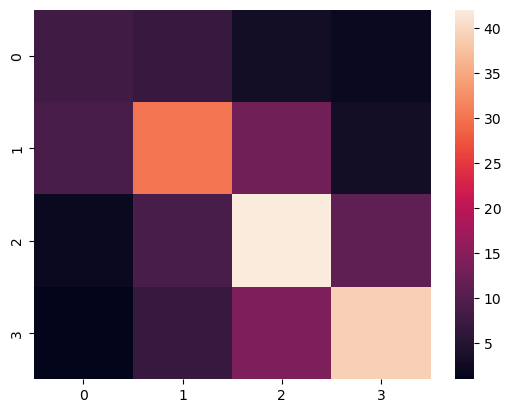

In [8]:
c = pyanno.measures.agreement.confusion_matrix(anno.annotations[:,0], anno.annotations[:,1],4)
print(c)
ac = seaborn.heatmap(c)
plt.show()

Scott's $\pi$ is computed as:

$\pi = \frac{\text{Pr}(a)-\text{Pr}(e)}{1-\text{Pr}(e)}$

Where Pr($a$) is relative observed agreement, and Pr($e$) is expected agreement using joint proportions calculated from the confusion matrix or matrix of coded agreements between any two coders:

In [9]:
scotts_pi(anno.annotations[:,0], anno.annotations[:,1])

0.4386478265891502

The generalization of Scott's $\pi$ to $n$ coders is Fleiss' $\kappa$ (Fleiss called it $\kappa$ because he thought he was generalizing Cohen's $\kappa$)

In [10]:
fleiss_kappa(anno.annotations[::])

0.40417653771912765

Krippendorff's $\alpha$ generalizes of Fleiss' $\kappa$ to $n$ coders and takes into account the fact that annotations here are not categorically different, but ordinal, by adding a weight matrix in which off-diagonal cells contain weights indicating the seriousness of the disagreement between each score. When produced with no arguments, it simply produces an arithmetic distance (e.g., 3-1=2), such that cells one off the diagonal are weighted 1, two off 2, etc.

In [11]:
krippendorffs_alpha(anno.annotations[::])

0.6472588223831547

Like Scott's $\pi$, Cohen's $\kappa$ also takes into account the possibility of the agreement occurring by chance, but in the following way:

$\kappa = \frac{p_o-p_e}{1-p_e}=1-\frac{1-p_o}{p_e}$

where $p_o$ is the relative observed agreement among raters, and $p_e$ is the hypothetical probability of chance agreement, using the observed data to calculate the probabilities of each observer randomly saying each category. If the raters are in complete agreement then $\kappa = 1$. If there is no agreement among the raters other than what would be expected by chance (as given by $p_e$), $\kappa ≤ 0 $. Here, Cohen's $\kappa$ statistic for the first two annotators is computed. This is probably the most common metric of agreement.

In [12]:
cohens_kappa(anno.annotations[:,0], anno.annotations[:,1])

0.43917037219392857

In [13]:
m = pairwise_matrix(cohens_kappa, anno.annotations)
print(m)

[[1.         0.43917037 0.47677621        nan        nan        nan
  0.45819119 0.43381462]
 [0.43917037 1.         0.38432922 0.41344423        nan        nan
         nan 0.33643611]
 [0.47677621 0.38432922 1.         0.39583333 0.51704894        nan
         nan        nan]
 [       nan 0.41344423 0.39583333 1.         0.34597068 0.4446844
         nan        nan]
 [       nan        nan 0.51704894 0.34597068 1.         0.37938644
  0.43039733        nan]
 [       nan        nan        nan 0.4446844  0.37938644 1.
  0.38341929 0.31214748]
 [0.45819119        nan        nan        nan 0.43039733 0.38341929
  1.         0.394806  ]
 [0.43381462 0.33643611        nan        nan        nan 0.31214748
  0.394806   1.        ]]


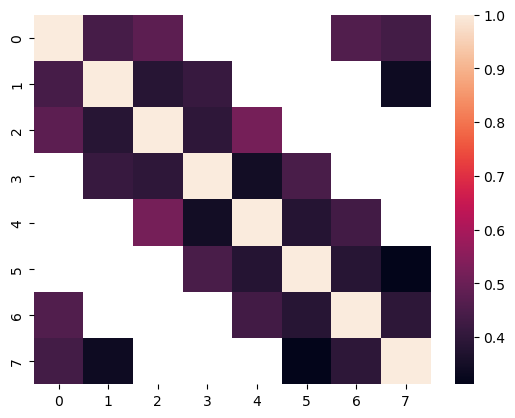

In [14]:
ax = seaborn.heatmap(m)
plt.show()

You can see that this 8 by 3 loop design will be less stable than an 8 choose 3 combinatorial design, because each codes with more others.

One can also assess the average Cohen's $\kappa$ for all pairs of coders that have coded against one another:

In [15]:
def pairwise_metric_average(metric, array):
    """Calculate the pairwise metric average for the real elements of metric function run on an array of annotations"""
    p = permutations(range(array[0,:].size),2)
    m = [metric(array[:,x[0]], array[:,x[1]]) for x in p]
    clean_m = [c for c in m if not math.isnan(c)]
    return reduce(lambda a, b: a + b, clean_m)/len(clean_m)

pairwise_metric_average(cohens_kappa, anno.annotations)

0.40911598940065674

As recognized with Krippendorff's flexible $\alpha$, our scores are *not* categorical, but rather ordered and her considered metric. Weighted $\kappa$ allows you to count disagreements differently and is useful when codes are ordered as they are here. Here a weight matrix is added to the calculation, in which off-diagonal cells contain weights indicating the seriousness of the disagreement between each score. When automatically produced, it simply produces an arithmetic distance (e.g., 3-1=2), such that cells one off the diagonal are weighted 1, two off 2, etc. Here

$\kappa = 1-\frac{\sum^k_{i=1}\sum^k_{j=1}w_{ij}x_{ij}}{\sum^k_{i=1}\sum^k_{j=1}w_{ij}m_{ij}}$

where $\kappa$ = $n$ codes and $w_{ij}$,$x_{ij}$, and $m_{ij}$ represent elements in the weight, observed, and expected matrices, respectively. (Obviously, when diagonal cells contain weights of 0 and off-diagonal cells weights of 1, this equals $\kappa$).

In [16]:
cohens_weighted_kappa(anno.annotations[:,0], anno.annotations[:,1])

0.5330240507874497

Or averaged over the total:

In [17]:
pairwise_metric_average(cohens_weighted_kappa,anno.annotations)

0.5299113458717166

Alternatively, if the annontation data can be understood as indicating real values, we can assess not agreement, but rather the correlation of values (Pearson's $\rho$) or correlation of ranks (Spearman's $\rho$) for pairs of coders:

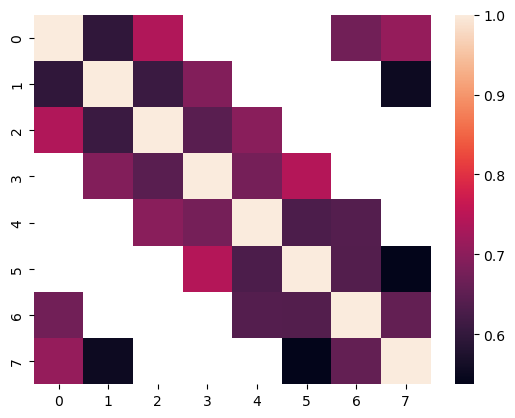

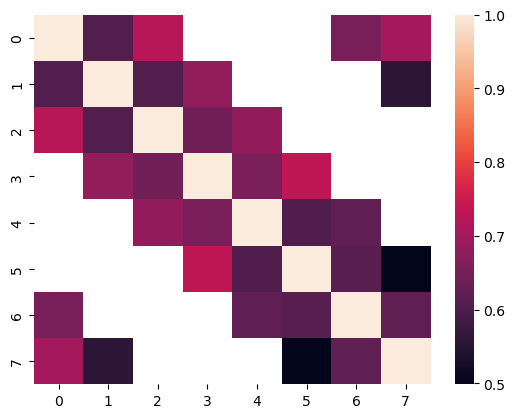

In [18]:
n = pairwise_matrix(pearsons_rho, anno.annotations)
m = pairwise_matrix(spearmans_rho, anno.annotations)
an = seaborn.heatmap(n)
plt.show()
am = seaborn.heatmap(m)
plt.show()

Or averaged over all comparable pairs:

In [19]:
print(pairwise_metric_average(pearsons_rho,anno.annotations), pairwise_metric_average(spearmans_rho,anno.annotations))

0.651721932117508 0.63808488688039


## <font color="red">*Exercise 1*</font>

<font color="red">Perform a content annotation survey of some kind in which at least 3 people evaluate and code each piece of content, using Amazon Mechanical Turk as described in the [MTurk slides on Canvas](https://canvas.uchicago.edu/courses/54694/files/folder/unfiled?preview=10675152), or by hand with friends.  With the resulting data, calculate, visualize and discuss inter-coder agreement or covariation with appropriate metrics. What does this means for the reliability of human assessments regarding content in your domain?

I was not able to properly set up MTurk in time, so I asked some friends to classify some posts for me instead. However, this is rather limited because I only had them label the same set of 50 random posts out of the dataset of 300k.

In [10]:
# get the labels from all participating coders on the 50 reddit posts
w = pandas.read_excel("wc_samp_50.xlsx", sheet_name="samp_50").label
j = pandas.read_excel("jl_samp_50.xlsx", sheet_name="samp_50").label
r = pandas.read_excel("rlw_samp_50.xlsx", sheet_name="samp_50").label
a = pandas.read_excel("af_samp_50.xlsx", sheet_name="samp_50").label
t = pandas.read_excel("tcs_samp_50.xlsx", sheet_name="samp_50").label
p = pandas.read_excel("pyk_samp_50.xlsx", sheet_name="samp_50").label
adopt_mat = np.column_stack([w,j,r,a,t,p])
coders = ["w","j","r","a","t","p"]
# change coding scheme to 2, from -1
adopt_mat[adopt_mat == -1] = 2
adopt_anno = AnnotationsContainer.from_array(adopt_mat)
adopt_anno.annotations.shape

(50, 6)

In [11]:
# let's see coder agreement frequency
pyanno.measures.agreement.labels_frequency(adopt_anno.annotations, 3)

array([0.19, 0.22, 0.59])

We can see that the most frequent label is 2, which is "cannot be determined/not enough information." Since I did not filter out very short comments from reddit data set some of the posts to analyze were very short and not easy to label one way or another.

[[ 8.  0.  1.]
 [ 0. 10.  2.]
 [ 4.  3. 22.]]


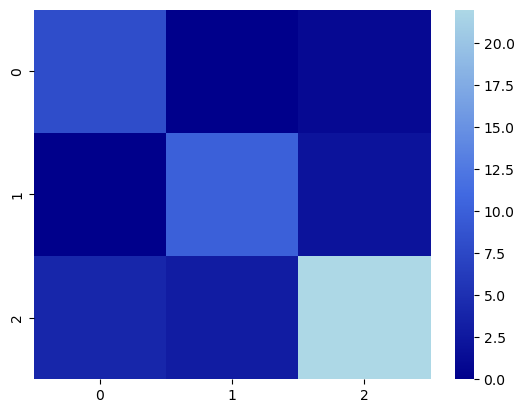

In [12]:
# lets check the agreement between any two 
c_mat_1 = pyanno.measures.agreement.confusion_matrix(adopt_anno.annotations[:,2], 
                                                     adopt_anno.annotations[:,5],
                                                     3)
print(c_mat_1)

# I wanted to change the color map

from matplotlib.colors import LinearSegmentedColormap

# Define custom colormap colors
colors = [(0, 'darkblue'),   # Start color
          (0.5, 'royalblue'), # Middle color
          (1, 'lightblue')]    # End color
# Create a custom colormap
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

hm_1 = seaborn.heatmap(c_mat_1, cmap=custom_cmap)
plt.show()

We can see from this graph that coders 2 and 5 generally have good agreement with one another, since most of their labels match one another across the diagonal. It appears that coder 2 has slightly more caution and labeled more things as not enough info than coder 5.

[[10.  0.  0.]
 [ 0. 10.  0.]
 [ 0.  0. 30.]]


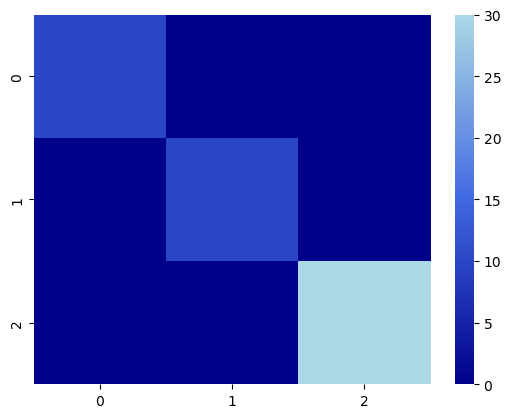

In [23]:
c_mat_2 = pyanno.measures.agreement.confusion_matrix(adopt_anno.annotations[:,0], 
                                                     adopt_anno.annotations[:,4],
                                                     3)
print(c_mat_2)
hm_2 = seaborn.heatmap(c_mat_2, cmap=custom_cmap)
plt.show()

We can see here that coder 0 and 4 have perfect agreement. They both believe that 30 of the posts do not have enough information one way or another to properly assess whether the poster is an adoptee or not.

[[ 0.  0.  0.]
 [ 0.  9.  0.]
 [10.  1. 30.]]


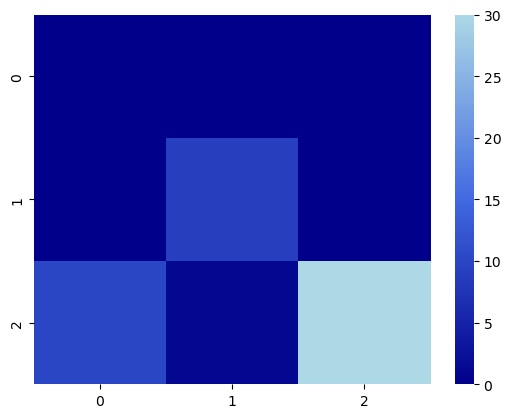

In [5]:
c_mat_3 = pyanno.measures.agreement.confusion_matrix(adopt_anno.annotations[:,1], 
                                                     adopt_anno.annotations[:,0],
                                                     3)
print(c_mat_3)
hm_3 = seaborn.heatmap(c_mat_3, cmap=custom_cmap)
plt.show()

We can see from the above here that coder 1 is more cautious, labeling more Reddit posts as 2 (not enough info) than coder 0. In other heatmaps (not shown here), coder 1 seems to be the odd man out.

In [25]:
# fleiss kappa for n coders
print("fleiss kappa generalization of scotts pi to n coders:", 
      round(fleiss_kappa(adopt_anno.annotations[::]),4))

# for coder 0 and 1
print("scotts pi between coders 0 and 1:", 
      round(scotts_pi(adopt_anno.annotations[:,0], adopt_anno.annotations[:,1]),4))
# (data not ordinal so no use of krippendorffs alpha)
print("cohens kappa agreement between coders 0 and 1:",
      round(cohens_kappa(adopt_anno.annotations[:,0], adopt_anno.annotations[:,1]),4))

# for coder 0 and 4
print("scotts pi between coders 0 and 4:", 
      round(scotts_pi(adopt_anno.annotations[:,0], adopt_anno.annotations[:,4]),4))
# (data not ordinal so no use of krippendorffs alpha)
print("cohens kappa agreement between coders 0 and 1:",
      round(cohens_kappa(adopt_anno.annotations[:,0], adopt_anno.annotations[:,4]),4))

# for coder 2 and 5
print("scotts pi between coders 2 and 5:",
      round(scotts_pi(adopt_anno.annotations[:,2], adopt_anno.annotations[:,5]),4))
# (data not ordinal so no use of krippendorffs alpha)
print("cohens kappa agreement between coders 2 and 5:",
      round(cohens_kappa(adopt_anno.annotations[:,2], adopt_anno.annotations[:,5]),4))

fleiss kappa generalization of scotts pi to n coders: 0.6428
scotts pi between coders 0 and 1: 0.5109
cohens kappa agreement between coders 0 and 1: 0.5339
scotts pi between coders 0 and 4: 1.0
cohens kappa agreement between coders 0 and 1: 1.0
scotts pi between coders 2 and 5: 0.6677
cohens kappa agreement between coders 2 and 5: 0.6691


The general agreement between all coders is around .6428 (fliess kappa).
We can see that coder 0 and coder 1 have a kohen's kappa agreement of .5338.
We can see that their scotts pi is around .5109.


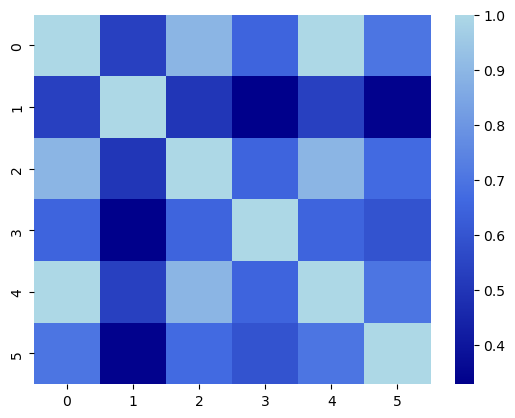

In [26]:
# create a heat map for cohens kappa
adopt_ck_mat = pairwise_matrix(cohens_kappa, adopt_anno.annotations)
adopt_ck_hm = seaborn.heatmap(adopt_ck_mat, cmap=custom_cmap)
plt.show()

We can see more clearly that coder 1 seems to be in disagreement with all other coders in general. Whereas coder pairs (0,2) and (0,4) are highly agreeable with each other respectively.

In [6]:
# find the average Cohen kappa for all pairs of coders 
# against one another

def pairwise_metric_average(metric, array):
    """Calculate the pairwise metric average for the real elements of metric function run on an array of annotations"""
    p = permutations(range(array[0,:].size),2)
    m = [metric(array[:,x[0]], array[:,x[1]]) for x in p]
    clean_m = [c for c in m if not math.isnan(c)]
    return reduce(lambda a, b: a + b, clean_m)/len(clean_m)


print(round(pairwise_metric_average(cohens_kappa, adopt_mat),4))

0.6422


The average cohen's kappa for all pairs of coders appears to be around .6422. A very similar number to Fleiss kappa of .6428.

Pearson's Rho


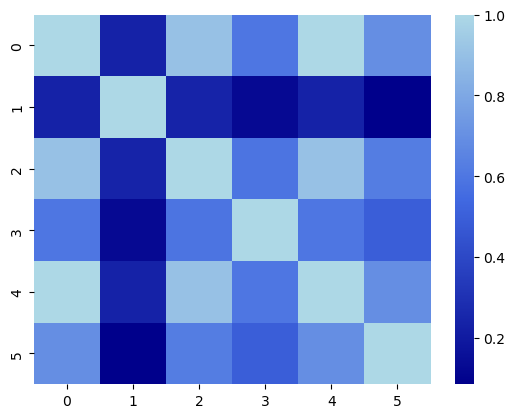

Spearman's Rho


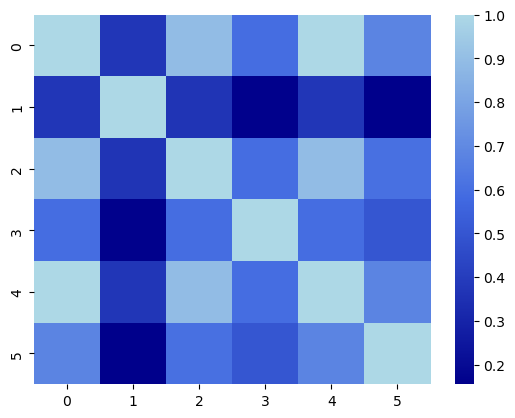

In [7]:
# calculating pearson and spearman rho heatmaps
adopt_n = pairwise_matrix(pearsons_rho, adopt_mat)
adopt_m = pairwise_matrix(spearmans_rho, adopt_mat)
adopt_an = seaborn.heatmap(adopt_n,cmap=custom_cmap)
print("Pearson's Rho")
plt.show()
print("Spearman's Rho")
adopt_am = seaborn.heatmap(adopt_m,cmap=custom_cmap)
plt.show()

In [8]:
# Averaged pearson and spearman rho values for all coder pairs
print(round(pairwise_metric_average(pearsons_rho, adopt_mat),4), 
      round(pairwise_metric_average(spearmans_rho, adopt_mat),4))

0.5342 0.563


From this exercise we can see that, in general, there is some intercoder agreeability. The coders tend to agree on the labeling schema approximately 2/3 times (depending on metric used). There appears to be one outlier in terms of coders, coder 1, who disagrees with most other coders. Because the high number of "not enough information" labels (2), I believe that I will need to once again re clean my data to reduce the number of semantically/contextually uniformative text (posts that only say something like "Thank you!" or the like). This is mainly a problem, I suspect, from incorporating comment data into the mix, rather than posts alone. Posts alone are much more informative because they are generally slightly longer and have more chance to include details about the poster them self. Generally I believe that my data is not reliably labeled as it stands with all these uninformative comments.

# Simple Simulated Examples for Classification

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two dimensions (`x` and `y`).

The four data patterns include:
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

We use the popular `train_test_split()` function from `sklearn`, and the data pattern function source code is copied below for your convenience from `lucem_illud`'s [cartoons.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/cartoons.py) file.

In [30]:
def random(numPerCategory = 500):
    datDict = {
        'vect' : [np.random.rand(2) * 2 - 1 for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)


def andSplit(noise = 0, numPerCategory = 500):
    def genPoint(cat):
        y = np.random.random_sample() * 2 - 1
        if noise >= 0:
            x = np.random.random_sample() - cat - (np.random.random_sample() - cat) * noise
        else:
            x = (1 - noise * np.random.random_sample()) - cat
        return np.array([x, y])
    datDict = {
        'vect' : [genPoint(i % 2) for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)


def xorSplit(noise = 0, numPerCategory = 500):
    def genPoint(cat):
        if cat == 1:
            if np.random.randint(0,2) < 1:
                y = np.random.random_sample() - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - np.random.random_sample() * noise * 2
            else:
                y = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
        else:
            if np.random.randint(0,2) < 1:
                y = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - np.random.random_sample() * noise * 2
            else:
                y = np.random.random_sample() - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
        return np.array([x, y])

    datDict = {
        'vect' : [genPoint(i % 2) for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)


def targetSplit(noise = 0, numPerCategory = 500, innerRad = .3):
    def genPoint(cat):
        if cat == 0:
            r = np.random.random_sample() * innerRad + (1 - innerRad) * np.random.random_sample() * noise
        else:
            r = np.random.random_sample() * (1 - innerRad) + innerRad - innerRad * np.random.random_sample() * noise
        eta = 2 * np.pi * np.random.random_sample()
        return np.array([r * np.cos(eta), r * np.sin(eta)])

    datDict = {
        'vect' : [genPoint(i % 2) for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)


def multiBlobs(noise = 0, numPerCategory = 500, centers = 5):
    if isinstance(centers, int):
        n_samples = numPerCategory * centers
    else:
        n_samples = numPerCategory * len(centers)
    X, y = sklearn.datasets.make_blobs(n_samples=n_samples, centers=centers, cluster_std = (.8 * (noise * 2 + 1)))
    datDict = {
        'vect' : list(X),
        'category' : y,
    }
    return pandas.DataFrame(datDict)

In [31]:
noise = .2

dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.random(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)

We can easily visualize the rendered datasets because they are generated in two dimensions.

Let's see what dfTrain, a simulated data that we just made, looks like

In [32]:
dfTrain

,vect,category
292,"[-0.6031720984130626, -0.319613446554996]",0
144,"[-0.9729464424943526, -0.03353692153166299]",0
26,"[-0.30164335542804266, 0.1081112007880789]",0
499,"[-0.7795743183887724, -0.030842155143107064]",1
5,"[0.31414431631209405, -0.5736478892529417]",1
...,...,...
549,"[-0.5028212268732595, 0.8412941726724534]",1
120,"[-0.701495607912489, 0.6843613708885727]",0
722,"[-0.528573885254519, -0.9035493921633904]",0
451,"[0.517521553954178, -0.036656709023205725]",1


So, dfTrain has two columns, vect and category. We can plot this with `plotter()` from [lucem_illud/lucem_illud/cartoons.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/cartoons.py). Here's the source code:

In [33]:
def plotter(df):
    fig, ax = plt.subplots(figsize = (10,10))
    pallet = seaborn.color_palette(palette='rainbow', n_colors= len(set(df['category'])))
    for i, cat in enumerate(set(df['category'])):
        a = np.stack(df[df['category'] == cat]['vect'])
        ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)
    ax.legend(loc = 'center right', title = 'Categories')
    ax.axis('off')
    plt.show()
    plt.close()

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


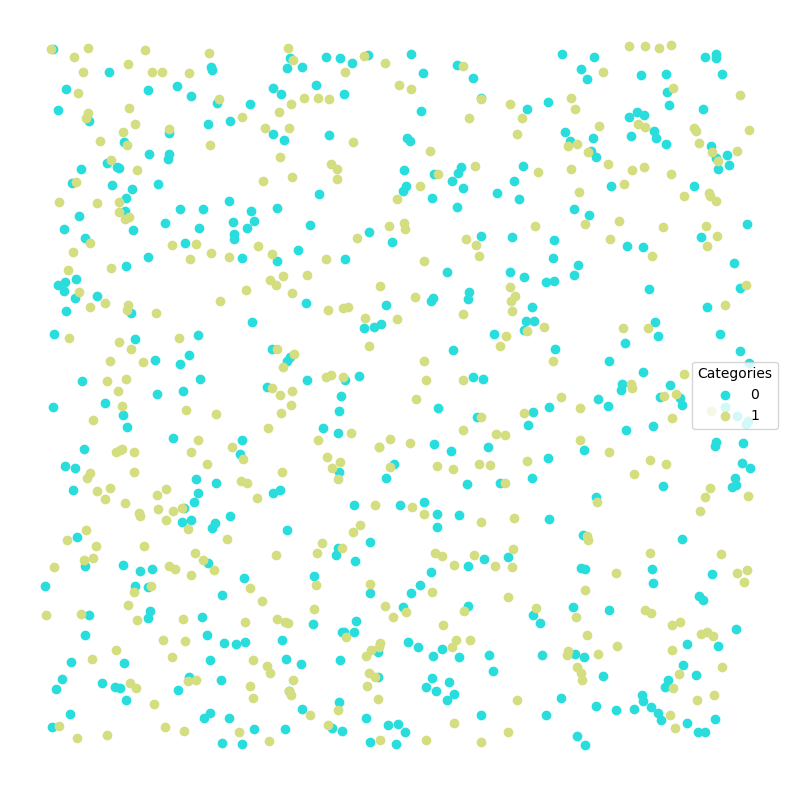

In [34]:
lucem_illud.plotter(dfTrain)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [35]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

We're using sklearn here. What is sklearn? It's an open source machine learning library for Python. We use sklearn because it features various machine learning algorithms and it works well with NumPy library. You don't need to understand the sklearn package in detail for the moment, but let's see what methods and attributes sklearn has, because we're going to use some of them:

In [36]:
dir(sklearn)

['__SKLEARN_SETUP__',
 '__all__',
 '__builtins__',
 '__cached__',
 '__check_build',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_config',
 '_distributor_init',
 '_loss',
 'base',
 'clone',
 'config_context',
 'datasets',
 'decomposition',
 'dummy',
 'ensemble',
 'exceptions',
 'externals',
 'feature_extraction',
 'get_config',
 'linear_model',
 'logger',
 'logging',
 'metrics',
 'model_selection',
 'naive_bayes',
 'neighbors',
 'neural_network',
 'os',
 'preprocessing',
 'random',
 'set_config',
 'setup_module',
 'show_versions',
 'svm',
 'sys',
 'tree',
 'utils']

Now we fit the model by giving it our training data

In [37]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

KNeighborsClassifier(weights='distance')

Here, "stack" function is used. Why did we use stack function here? This is because dfTrain['vect'] is a sequence, while clf.fit() takes an array element. Let's see what dfTrain['vect'] looks like:

In [38]:
dfTrain['vect']

292       [-0.6031720984130626, -0.319613446554996]
144     [-0.9729464424943526, -0.03353692153166299]
26       [-0.30164335542804266, 0.1081112007880789]
499    [-0.7795743183887724, -0.030842155143107064]
5        [0.31414431631209405, -0.5736478892529417]
                           ...                     
549       [-0.5028212268732595, 0.8412941726724534]
120        [-0.701495607912489, 0.6843613708885727]
722       [-0.528573885254519, -0.9035493921633904]
451      [0.517521553954178, -0.036656709023205725]
863       [0.33485034920174517, 0.2825578873143326]
Name: vect, Length: 800, dtype: object

And let's see what np.stack(dfTrain['vect']) does:

In [39]:
np.stack(dfTrain['vect'])

array([[-0.6031721 , -0.31961345],
       [-0.97294644, -0.03353692],
       [-0.30164336,  0.1081112 ],
       ...,
       [-0.52857389, -0.90354939],
       [ 0.51752155, -0.03665671],
       [ 0.33485035,  0.28255789]])

As you can see, stack function takes a sequence of arrays (which have the same shape) and joins them along a new axis.

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set. These `lucem_illud` functions are in [metrics.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/metrics.py), and we will skip copying source code this time due to length.

In [40]:
lucem_illud.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.475,0.525063,0.50,0.488158,0.526316
1,0.475,0.525063,0.55,0.538095,0.523810


This lets us look at which classes do better:

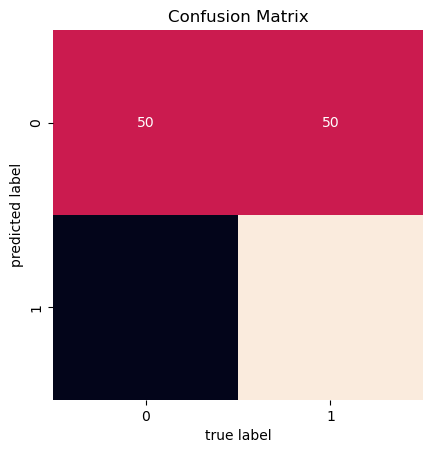

In [41]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

The greater the area under the curve the better.

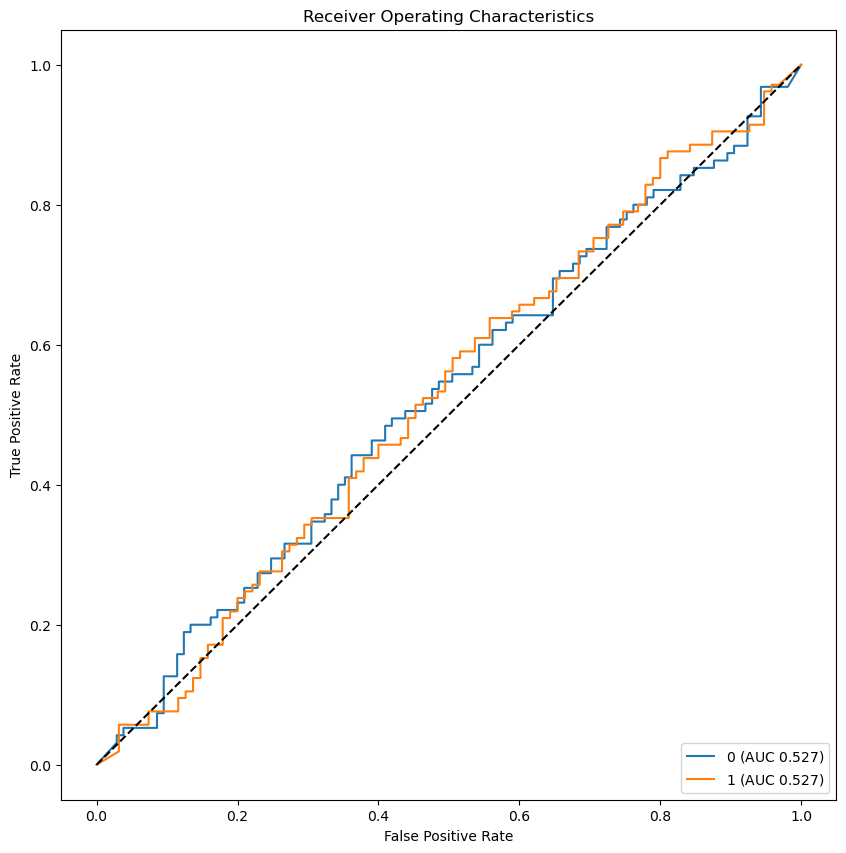

In [42]:
lucem_illud.plotMultiROC(clf, dfTest)

We can also look at the regions the classifer identifies as one class or the other:

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


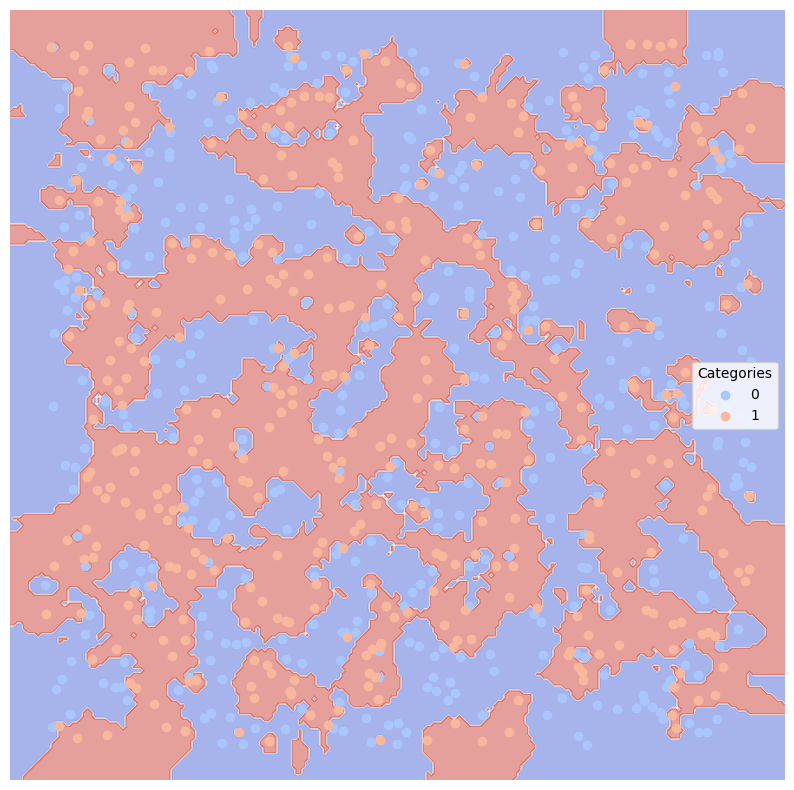

In [43]:
lucem_illud.plotregions(clf, dfTrain)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

Note that if you're on Google Colab and have not `git clone`ed the [class repo](https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks-2024-Winter), you can set a `dataDirectory=` parameter in the loadReddit function to match the data folder path on Colab.

In [44]:
# dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadReddit(dataDirectory='../data/'), test_size=.2)
# dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadReddit(dataDirectory=''), test_size=.2)
# dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadNewsGroups(), test_size=.2)
# dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateSmall(), test_size=.2)
# dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateLarge(), test_size=.2)
# dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSpam(), test_size=.2)

In [45]:
dfTrain

,vect,category
292,"[-0.6031720984130626, -0.319613446554996]",0
144,"[-0.9729464424943526, -0.03353692153166299]",0
26,"[-0.30164335542804266, 0.1081112007880789]",0
499,"[-0.7795743183887724, -0.030842155143107064]",1
5,"[0.31414431631209405, -0.5736478892529417]",1
...,...,...
549,"[-0.5028212268732595, 0.8412941726724534]",1
120,"[-0.701495607912489, 0.6843613708885727]",0
722,"[-0.528573885254519, -0.9035493921633904]",0
451,"[0.517521553954178, -0.036656709023205725]",1


In [46]:
#Classical Regression
clf = sklearn.linear_model.LogisticRegression()

#Bayes
# clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [47]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

LogisticRegression()

In [48]:
lucem_illud.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.5,0.502757,0.477477,0.476382,0.557895
1,0.5,0.502757,0.528090,0.526383,0.447619


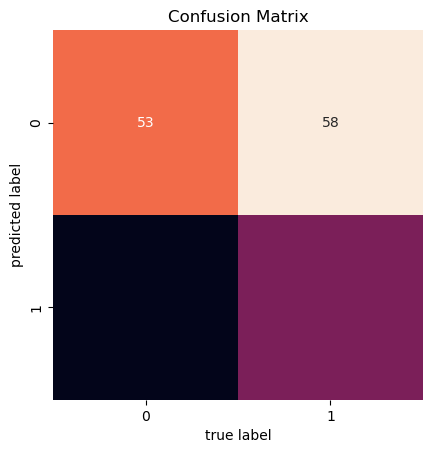

In [49]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

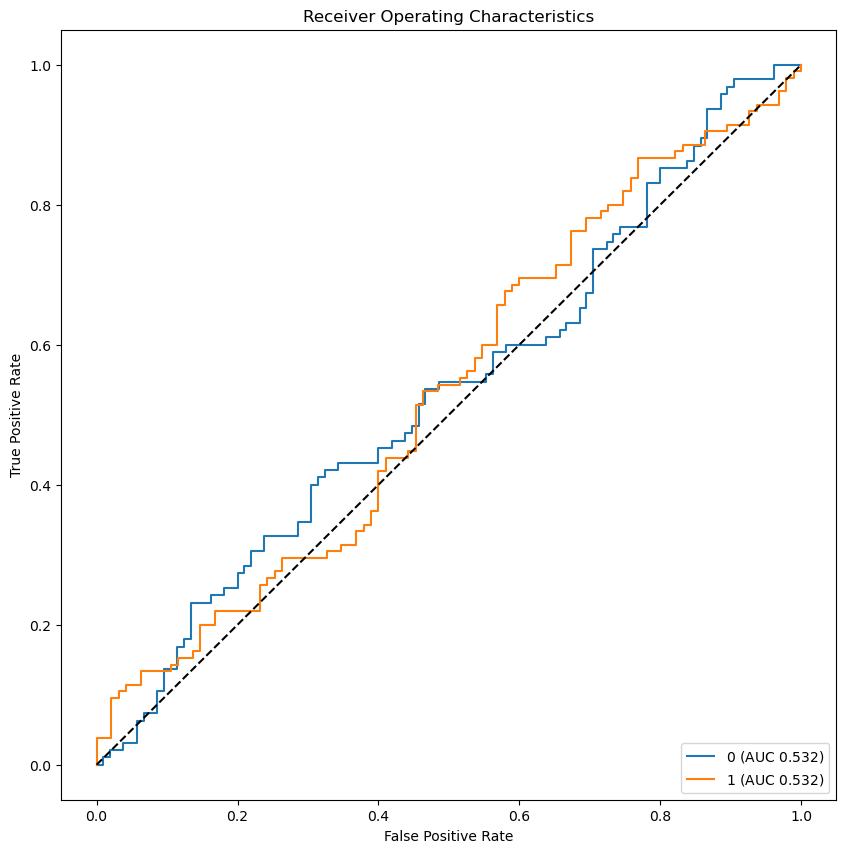

In [50]:
lucem_illud.plotMultiROC(clf, dfTest)

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


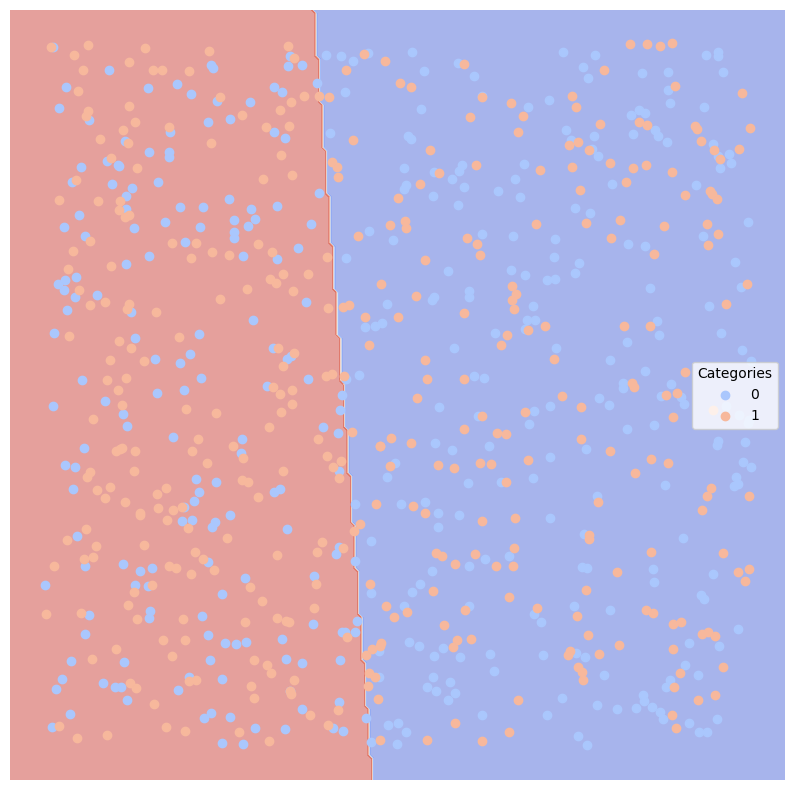

In [51]:
lucem_illud.plotregions(clf, dfTrain)

## <font color="red">*Exercise 2*</font>

<font color="red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<font color="red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

### Artificial Data ###

Creating the random sets of data

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


Random Split


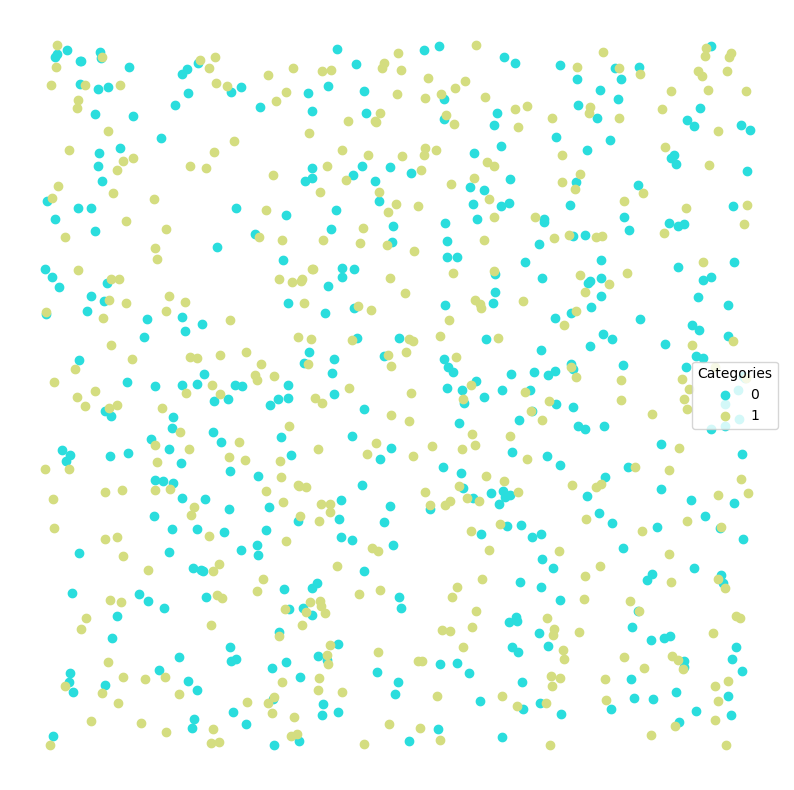

And Split


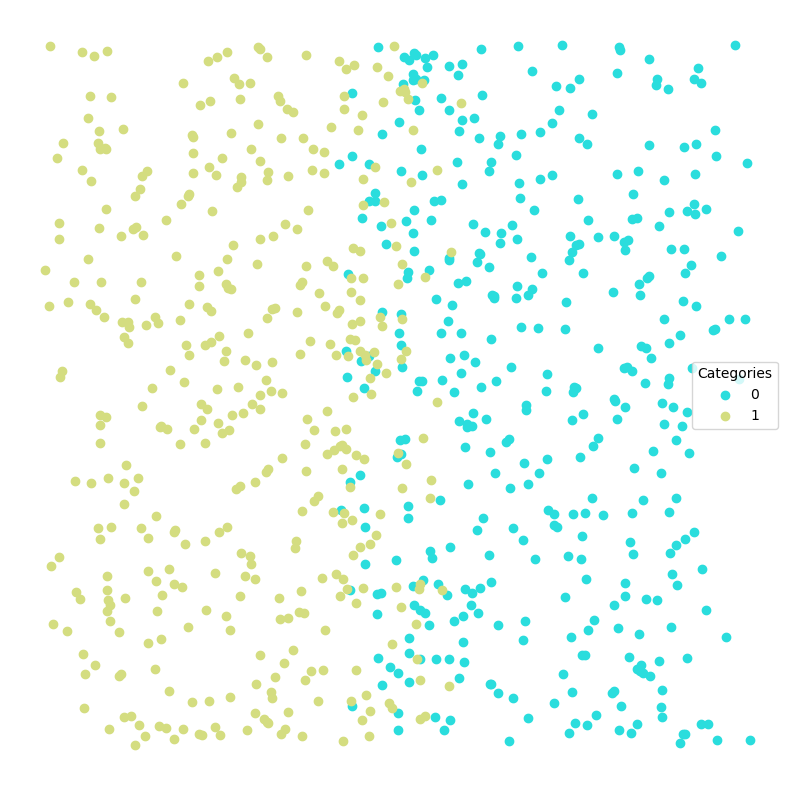

Xor Split


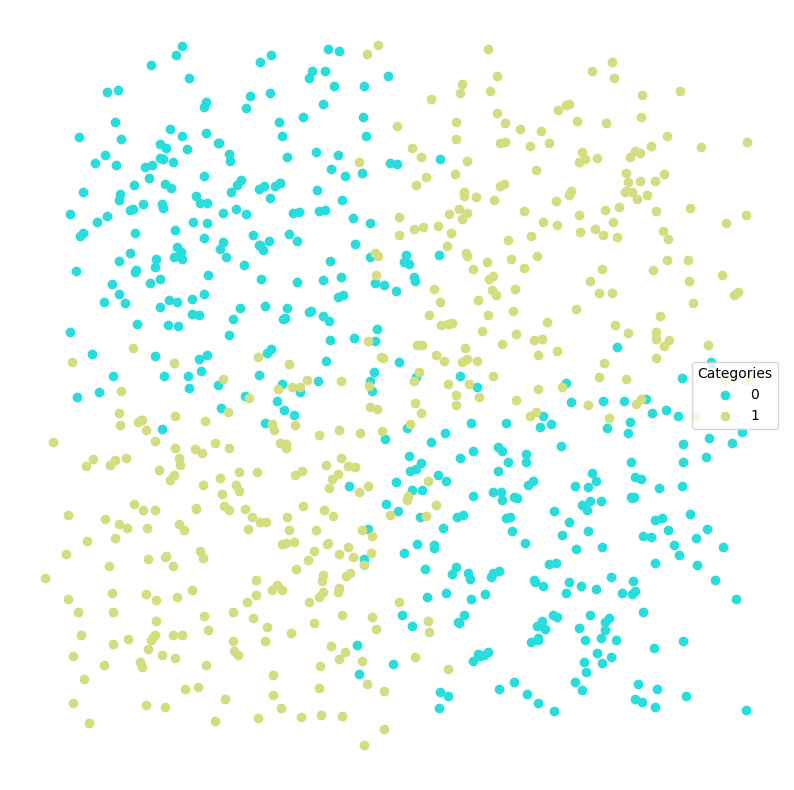

Target Split


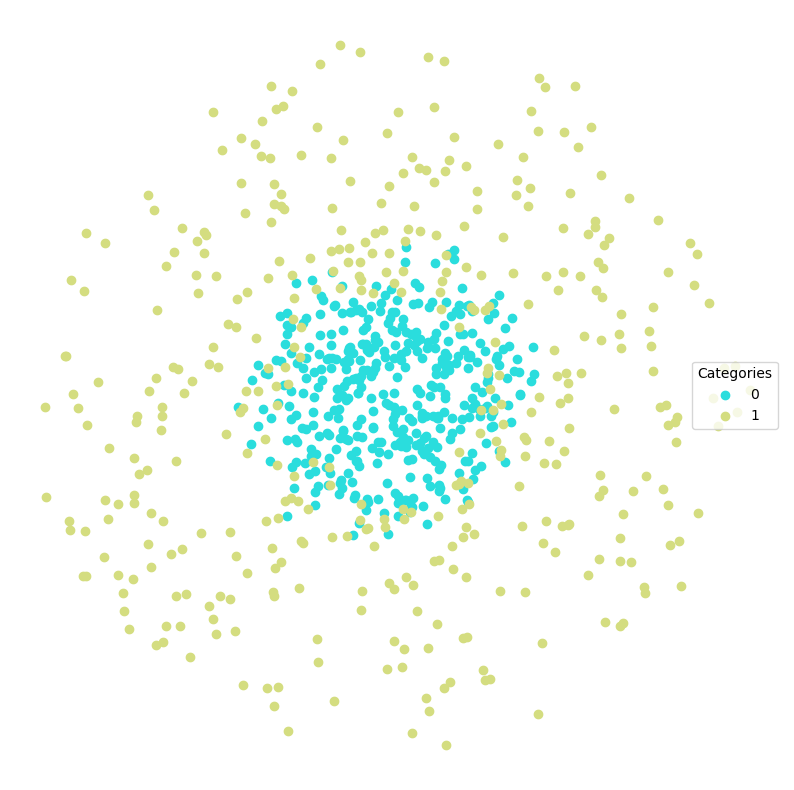

Multiblobs Split


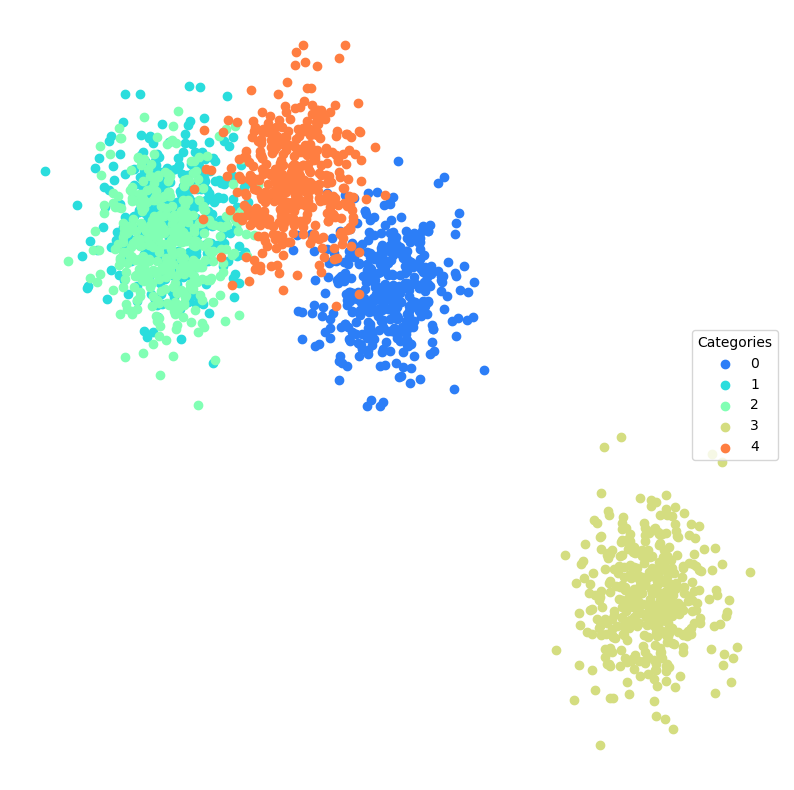

In [52]:
# 10 artificial datasets
# and corresponding classifiers

noise = .2

dfTrain_random, dfTest_random = sklearn.model_selection.train_test_split(lucem_illud.random(), test_size=.2)
dfTrain_andsplit, dfTest_andsplit = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
dfTrain_xorsplit, dfTest_xorsplit = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
dfTrain_target, dfTest_target = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
dfTrain_multiblobs, dfTest_multiblobs = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)

print("Random Split")
lucem_illud.plotter(dfTrain_random)
print("And Split")
lucem_illud.plotter(dfTrain_andsplit)
print("Xor Split")
lucem_illud.plotter(dfTrain_xorsplit)
print("Target Split")
lucem_illud.plotter(dfTrain_target)
print("Multiblobs Split")
lucem_illud.plotter(dfTrain_multiblobs)

##### Defining helper functions to help print out all of the key graphs #####

In [53]:
def get_model(clf, dfTrain, dfTest):
    """Runs the model evaluation plots"""
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    print(lucem_illud.evaluateClassifier(clf, dfTest))
    lucem_illud.plotConfusionMatrix(clf, dfTest)
    lucem_illud.plotMultiROC(clf, dfTest)
    lucem_illud.plotregions(clf, dfTrain)


def test_models(splitter, classifiers):
    """
    Fit each of 9 models on the training data based off of a splitter
    Inputs:
        splitter (str) the splitting criterion for test and train data
        classifiers (list of classifier objects): model classifier
    Returns None, prints evaluation plots for each of classifier models
    """
    # splitter can be "random", "andSplit", "xorSplit", "targetSplit", "multiBlobs"
    if splitter == "random":
        # random doesn't have a noise parameter
        dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.random(), test_size=.2,random_state=42)
    elif splitter == "andSplit":
        dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
    elif splitter == "xorSplit":
        dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
    elif splitter == "targetSplit":
        dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
    elif splitter == "multiBlobs":
        dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)
    else:
        print("""Splitter needs to be one of: ("random", "andSplit", "xorSplit", "targetSplit", "multiBlobs")""")
        return
    # all classifier models
    for clf in classifiers:
        print(f"#### Train/test split on {splitter}. Model: {clf} ####")
        get_model(clf, dfTrain, dfTest)
        print("####################### Moving onto next Classifier #######################")
    return

##### Click to open and see all 45 graphs #####

##### RANDOM #####
#### Train/test split on random. Model: GaussianNB() ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.51  0.493144   0.479339           0.481615  0.597938
1               0.51  0.493144   0.506329           0.511633  0.388350


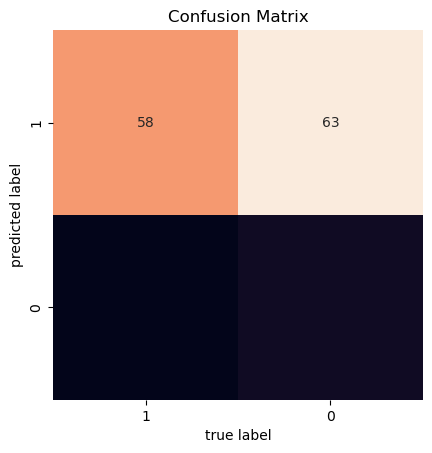

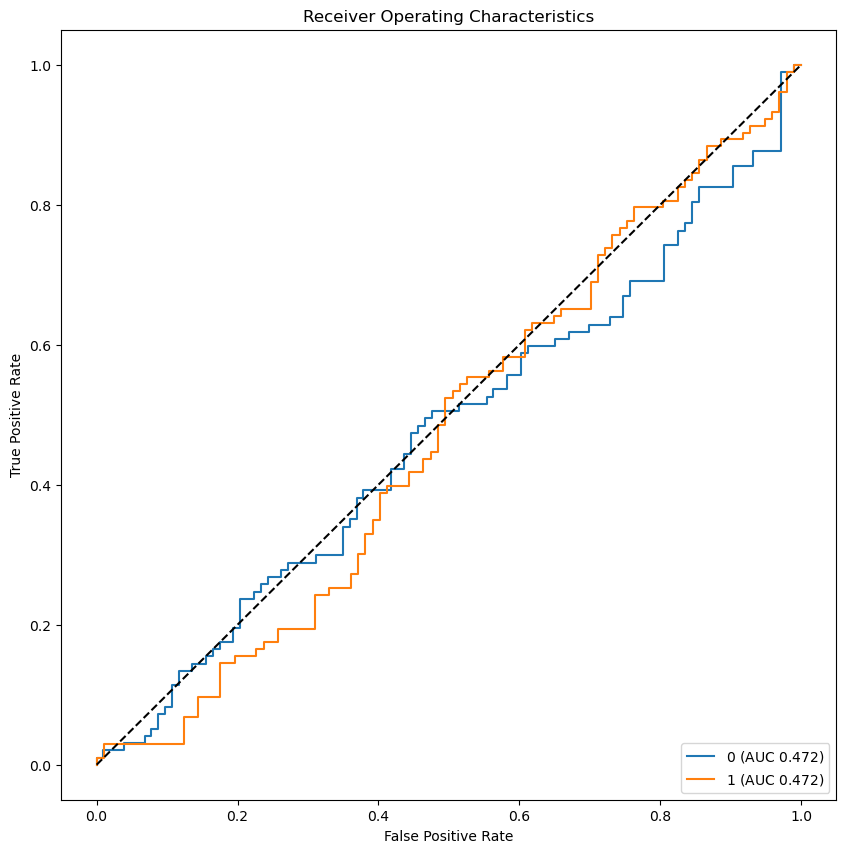

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


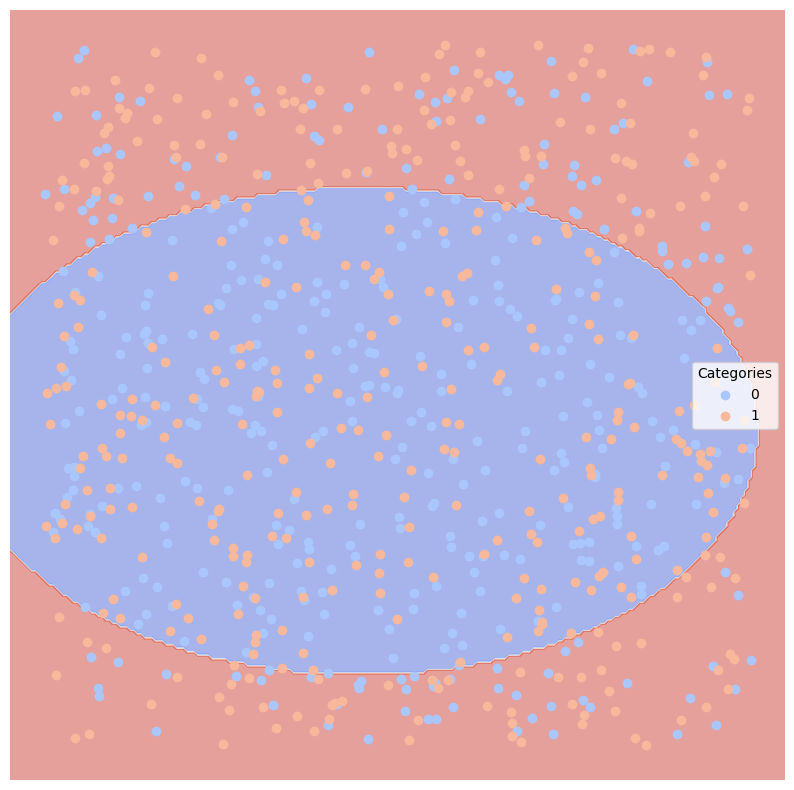

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: SVC(kernel='linear', probability=True, random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.555  0.448554   0.443548           0.461497  0.567010
1              0.555  0.448554   0.447368           0.492675  0.330097


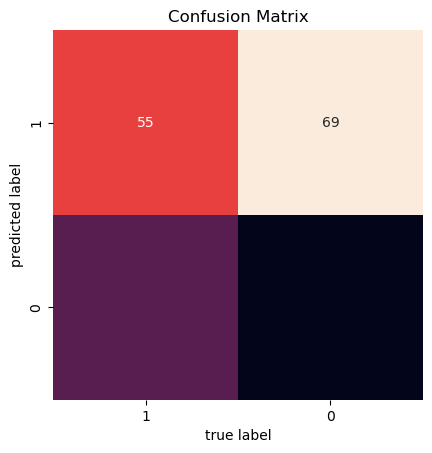

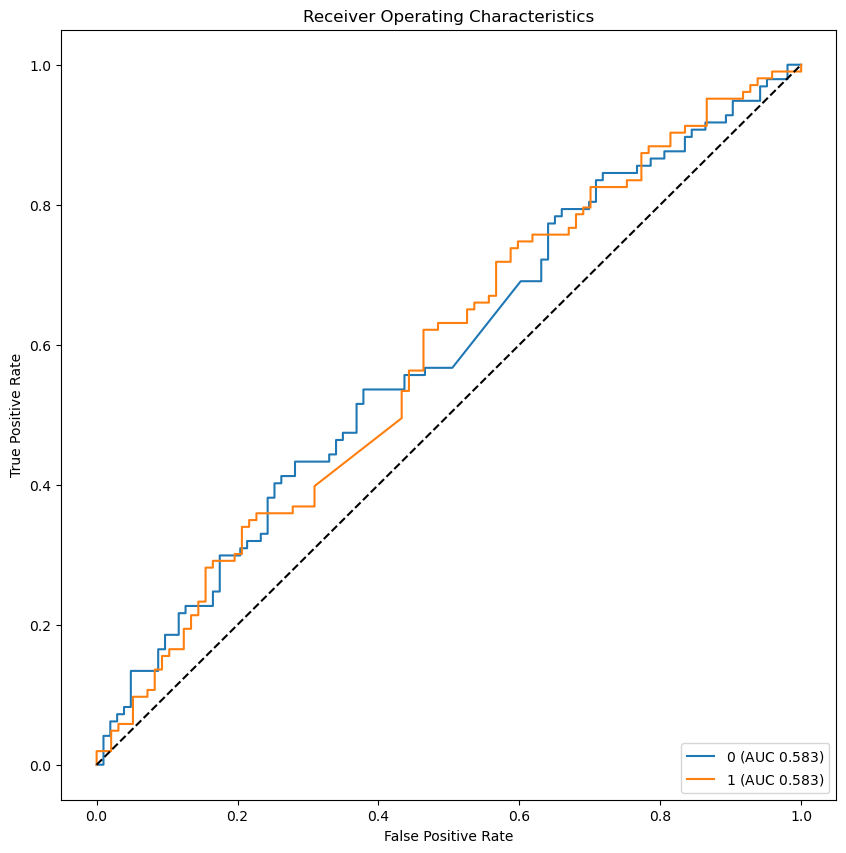

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


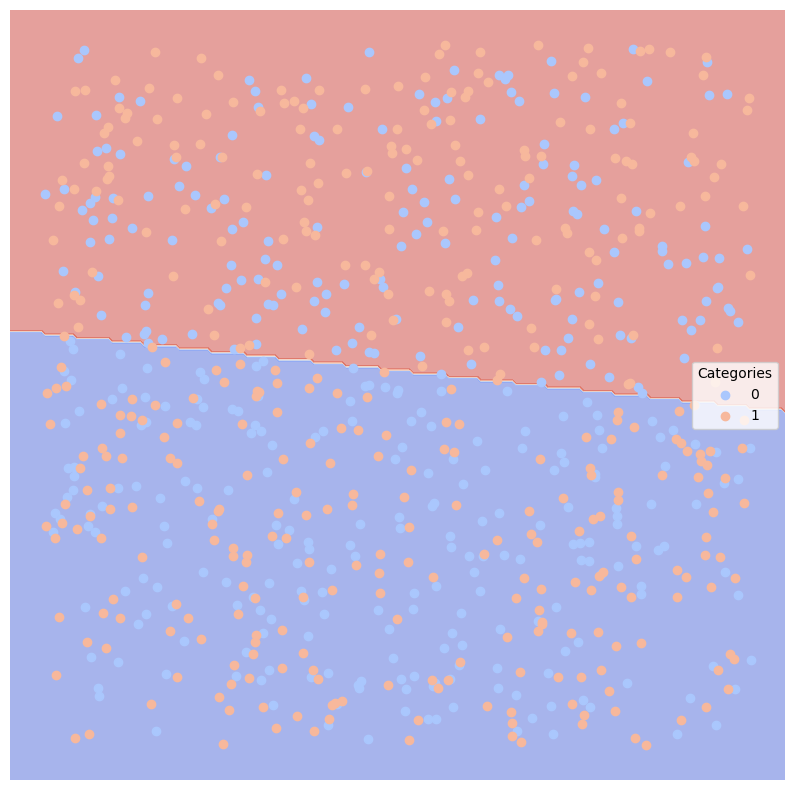

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: SVC(kernel='poly', probability=True, random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0                0.5  0.503753      0.488           0.486887  0.628866
1                0.5  0.503753      0.520           0.516893  0.378641


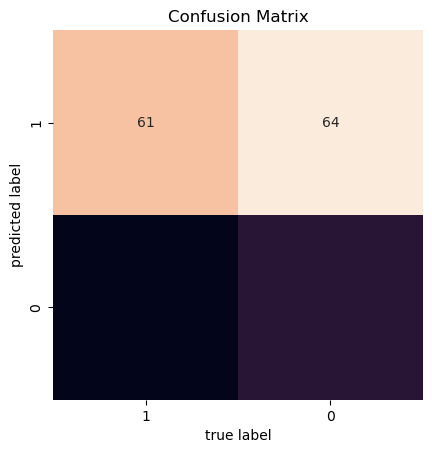

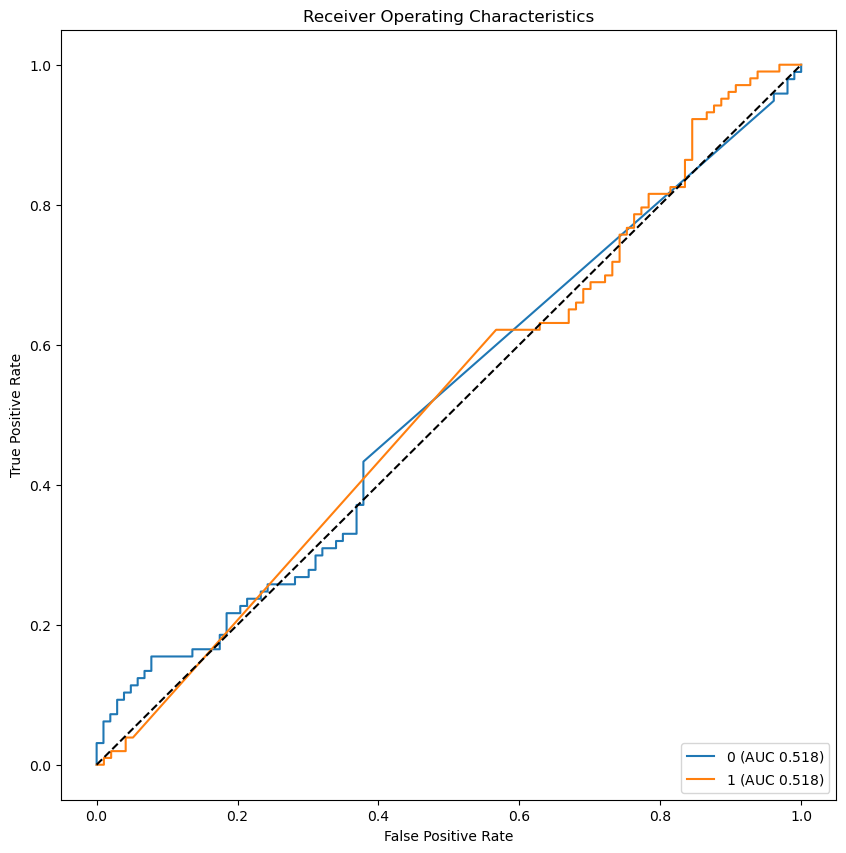

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


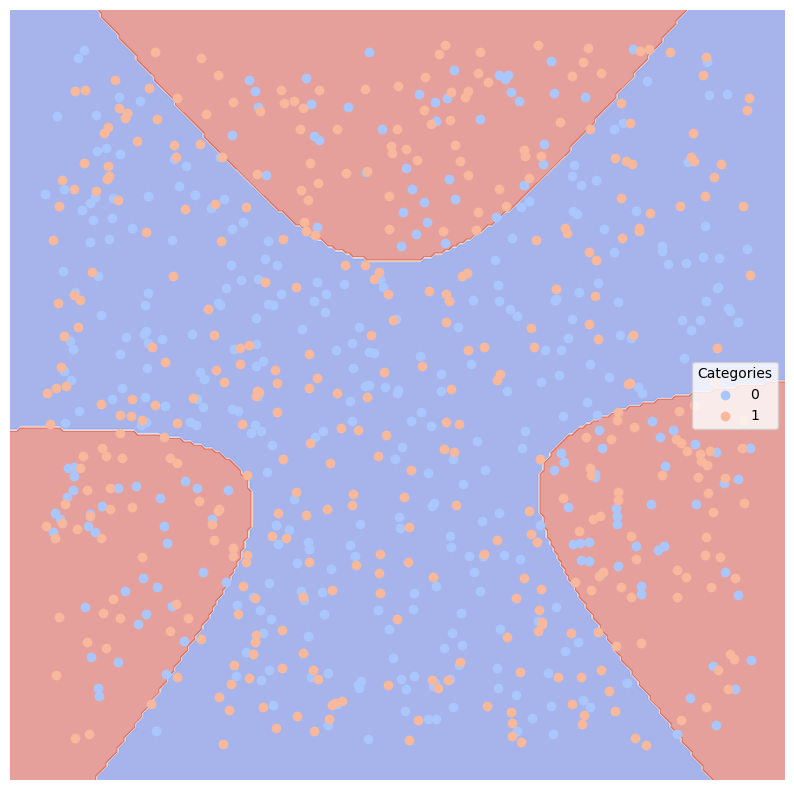

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: KNeighborsClassifier(weights='distance') ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.47  0.528976   0.516129           0.500404  0.494845
1               0.47  0.528976   0.542056           0.530235  0.563107


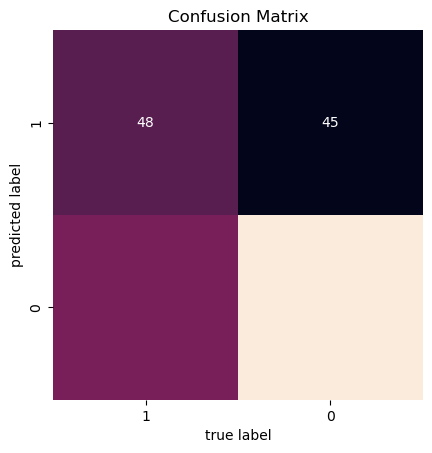

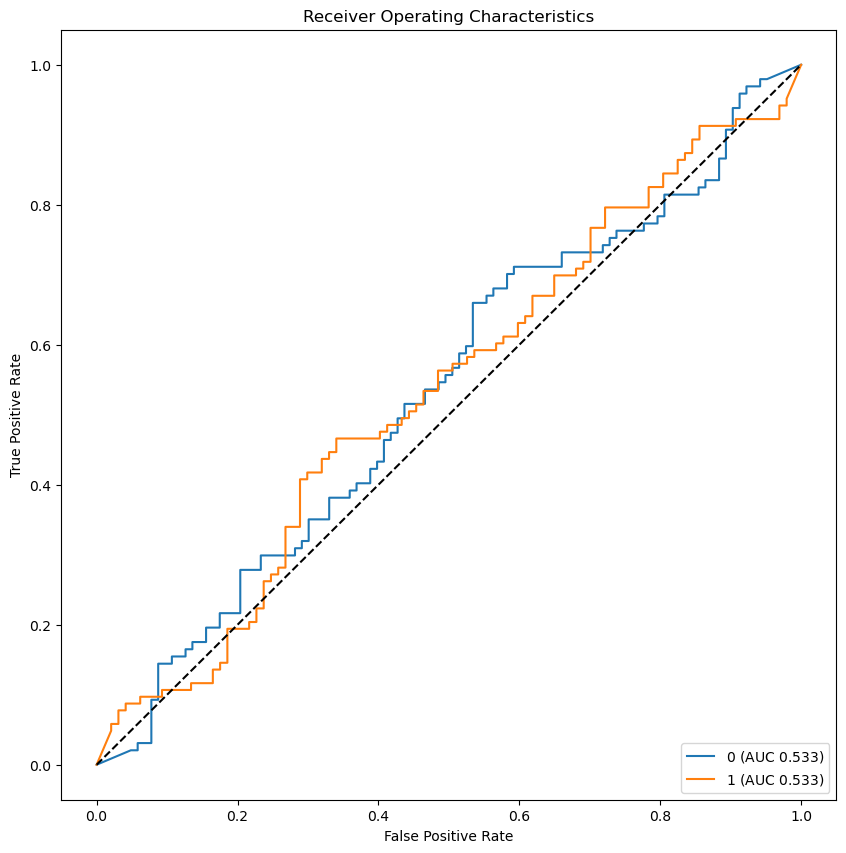

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


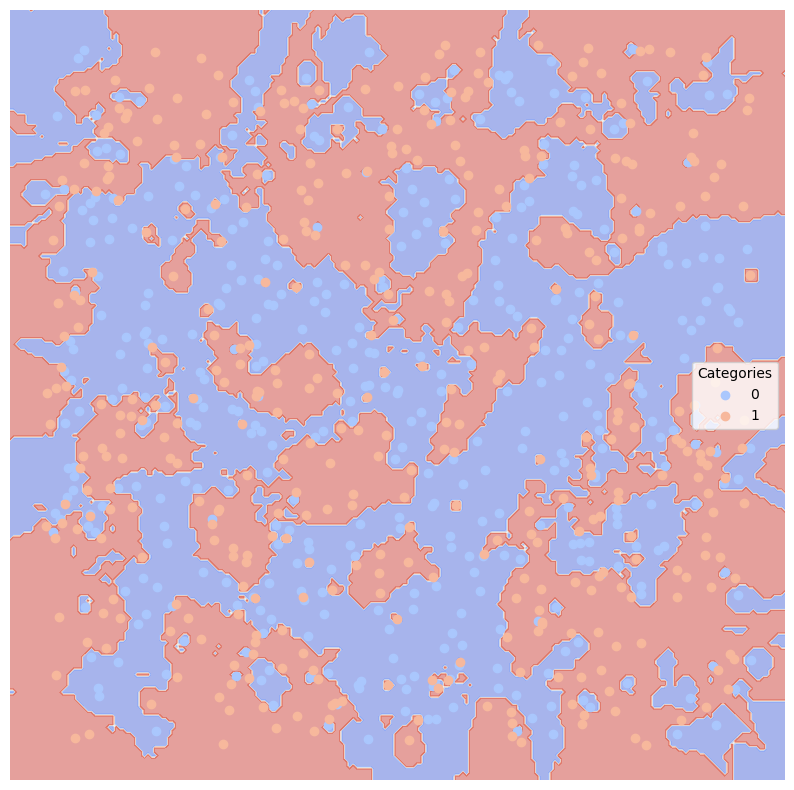

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: LogisticRegression(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.545  0.460665   0.456522           0.466504  0.649485
1              0.545  0.460665   0.451613           0.497769  0.271845


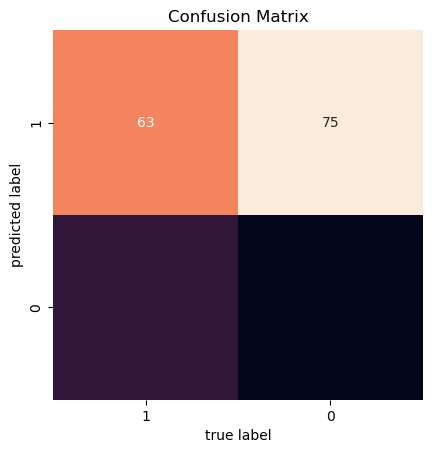

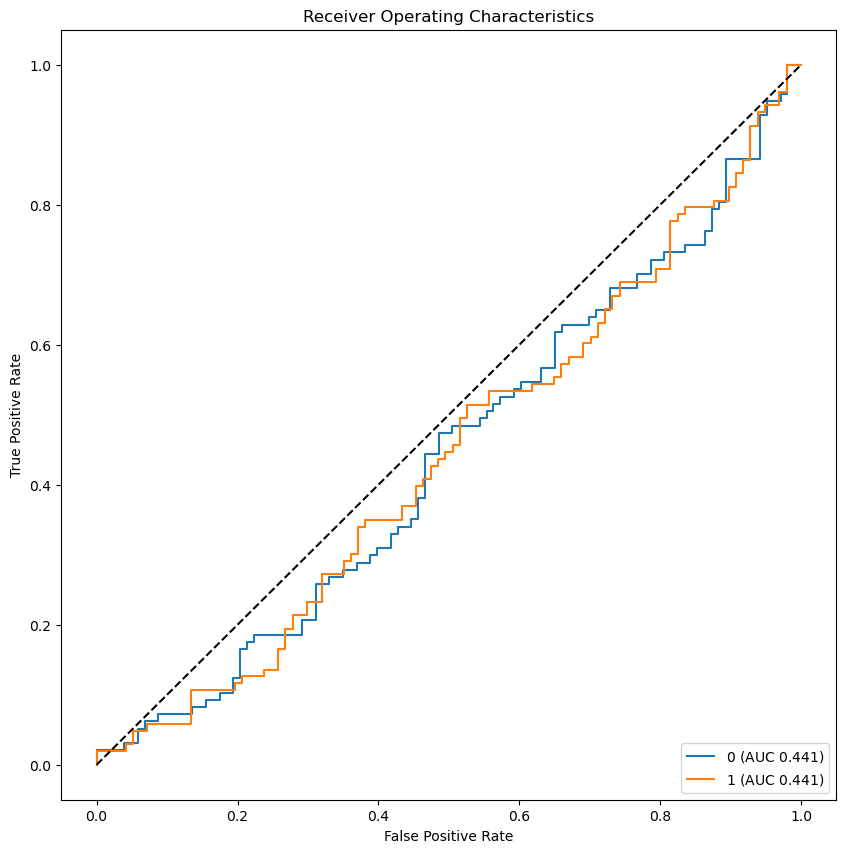

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


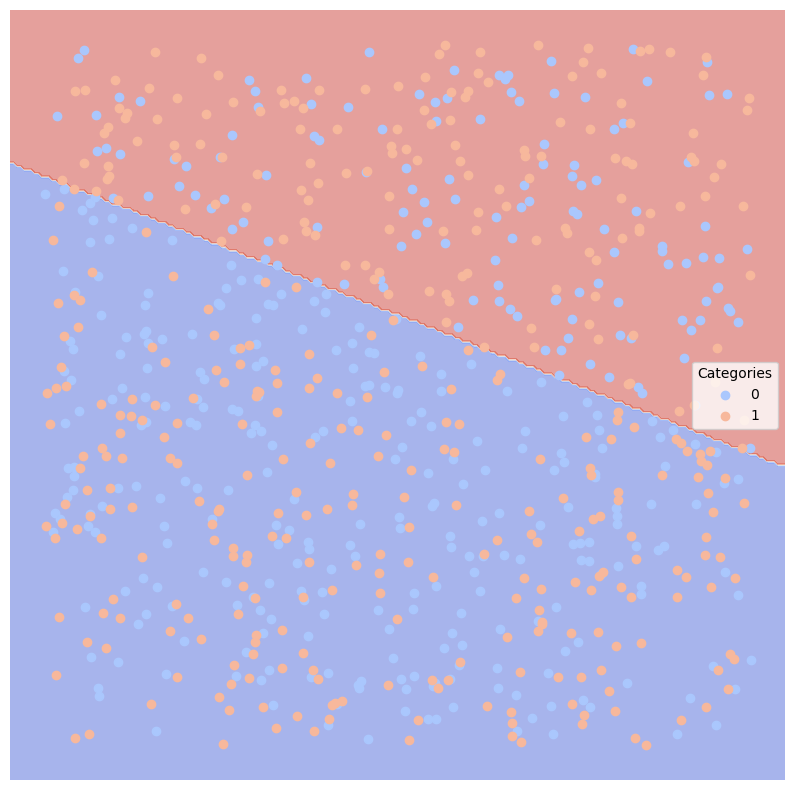

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: DecisionTreeClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.45  0.550195   0.534653           0.512642  0.556701
1               0.45  0.550195   0.565657           0.542541  0.543689


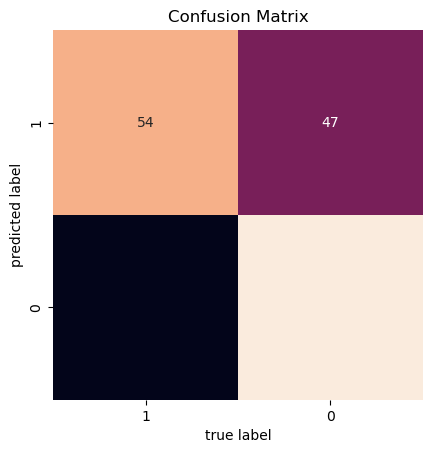

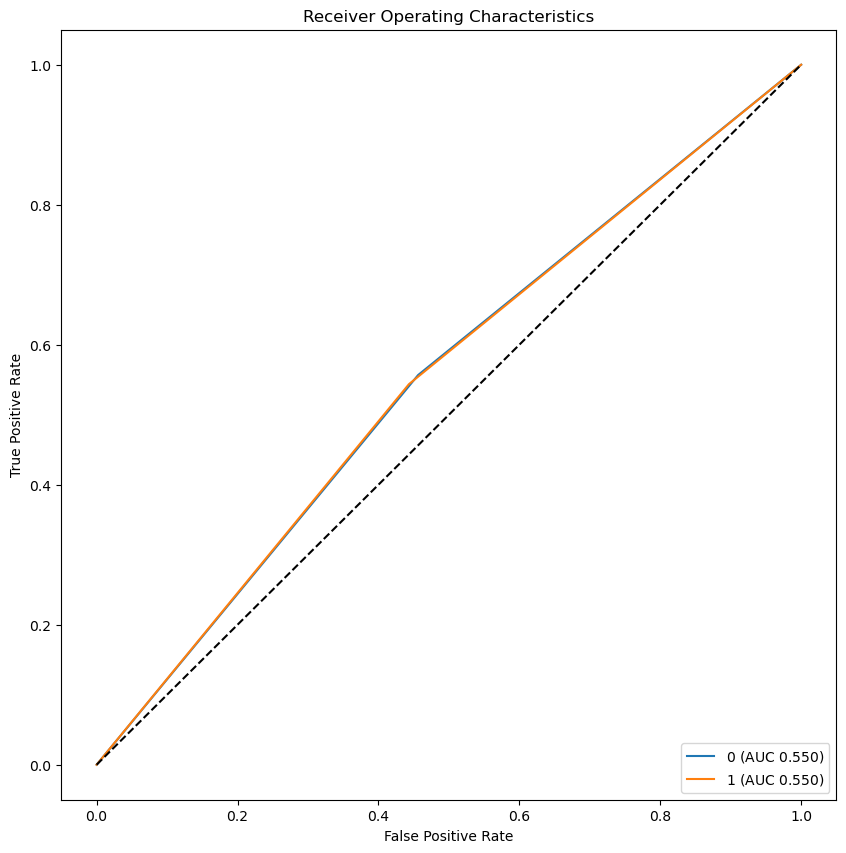

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


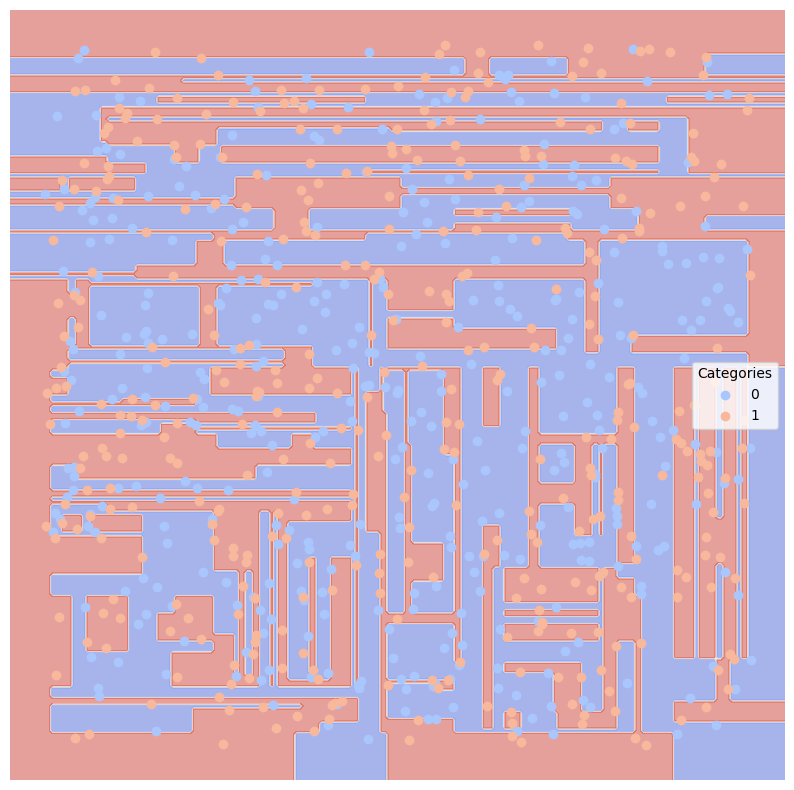

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: RandomForestClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.49  0.508958   0.494624           0.489564  0.474227
1               0.49  0.508958   0.523364           0.519548  0.543689


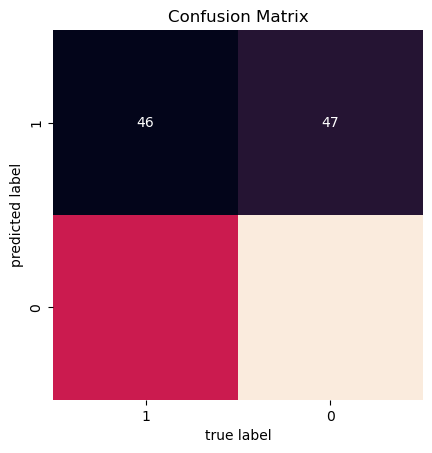

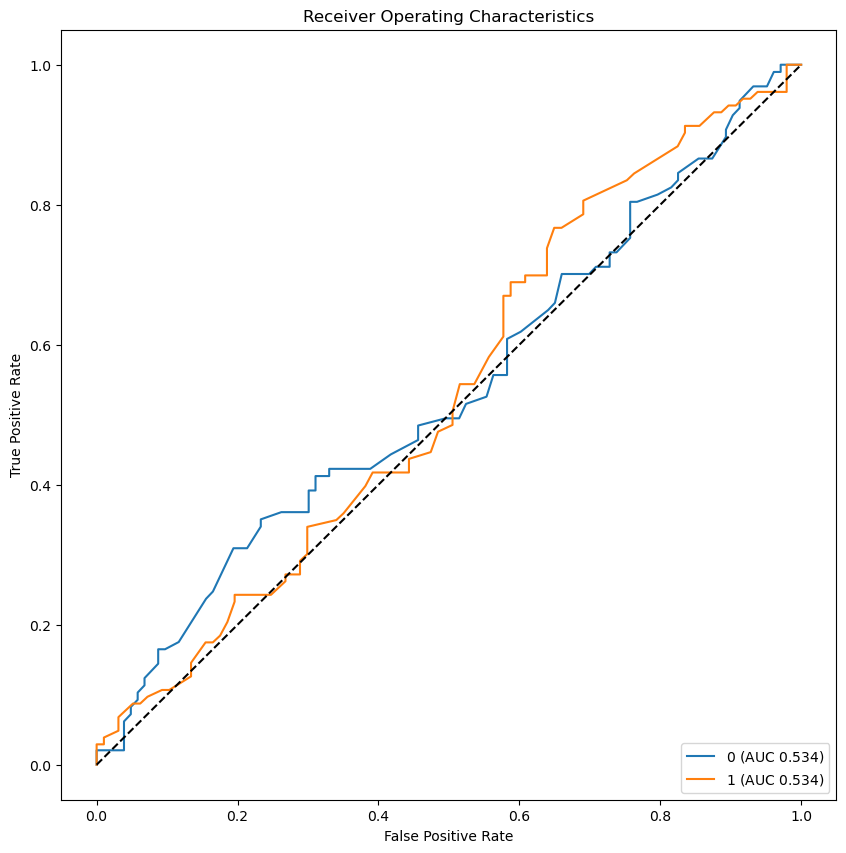

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


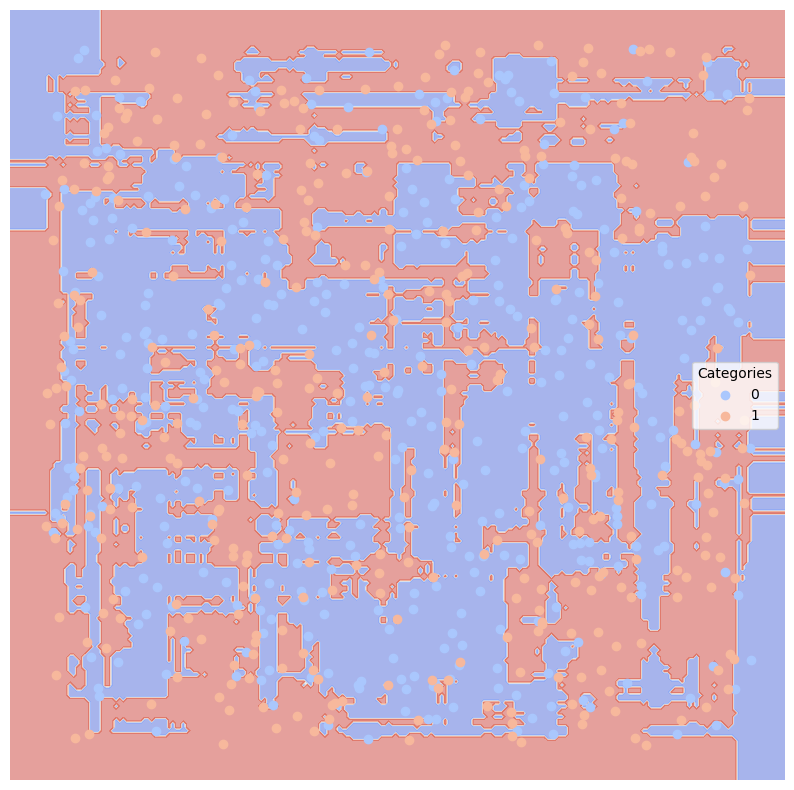

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: MLPClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.49  0.510159   0.495050           0.490180  0.515464
1               0.49  0.510159   0.525253           0.520176  0.504854


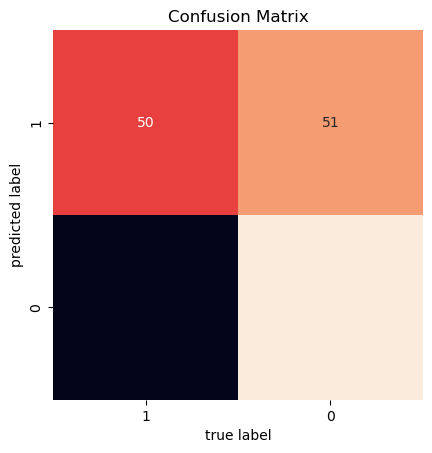

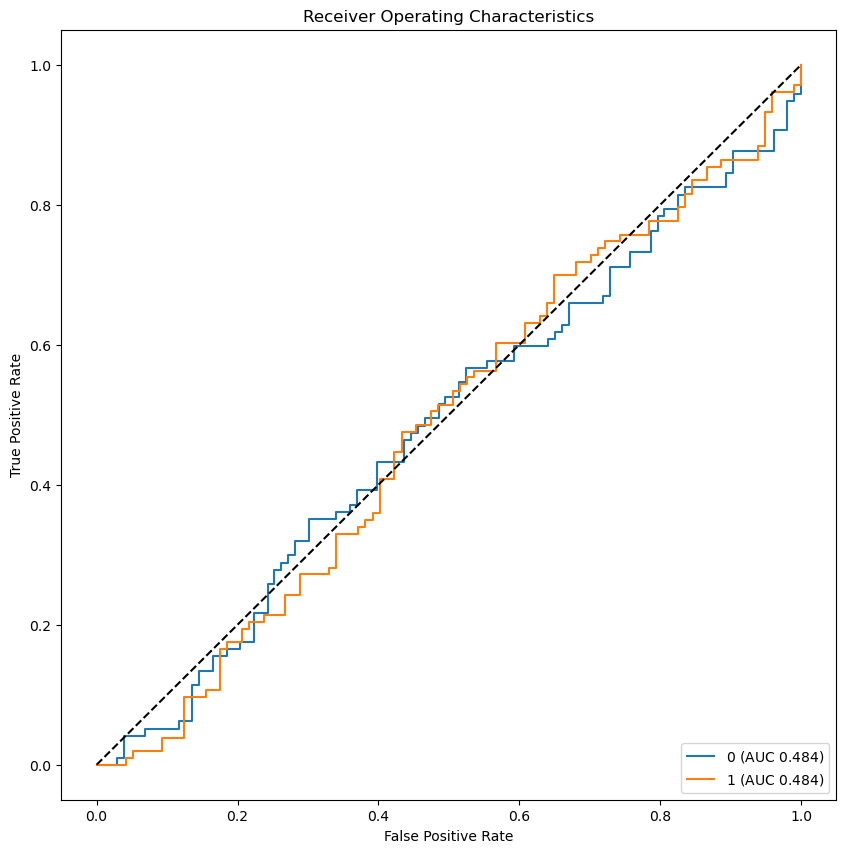

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


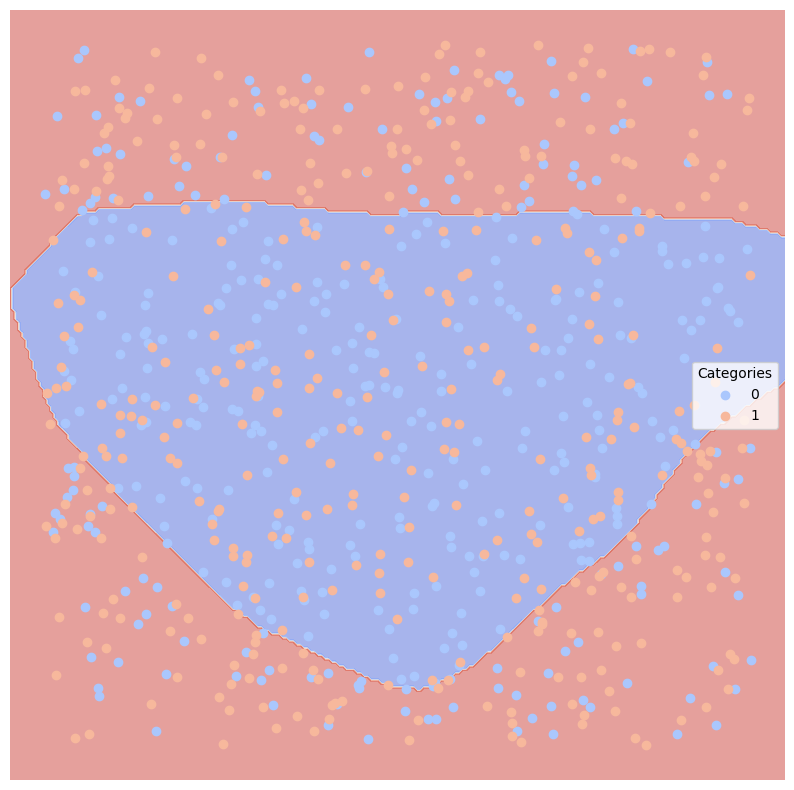

####################### Moving onto next Classifier #######################
#### Train/test split on random. Model: GradientBoostingClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0                0.5  0.501952   0.486726           0.485978  0.567010
1                0.5  0.501952   0.517241           0.515979  0.436893


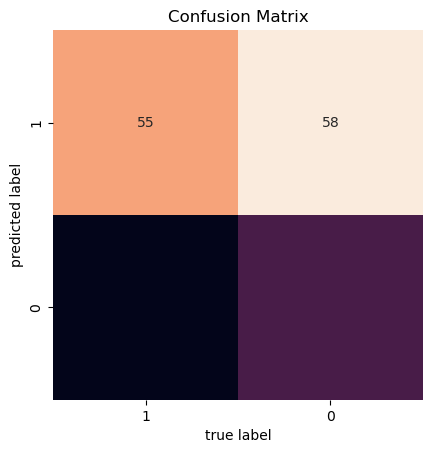

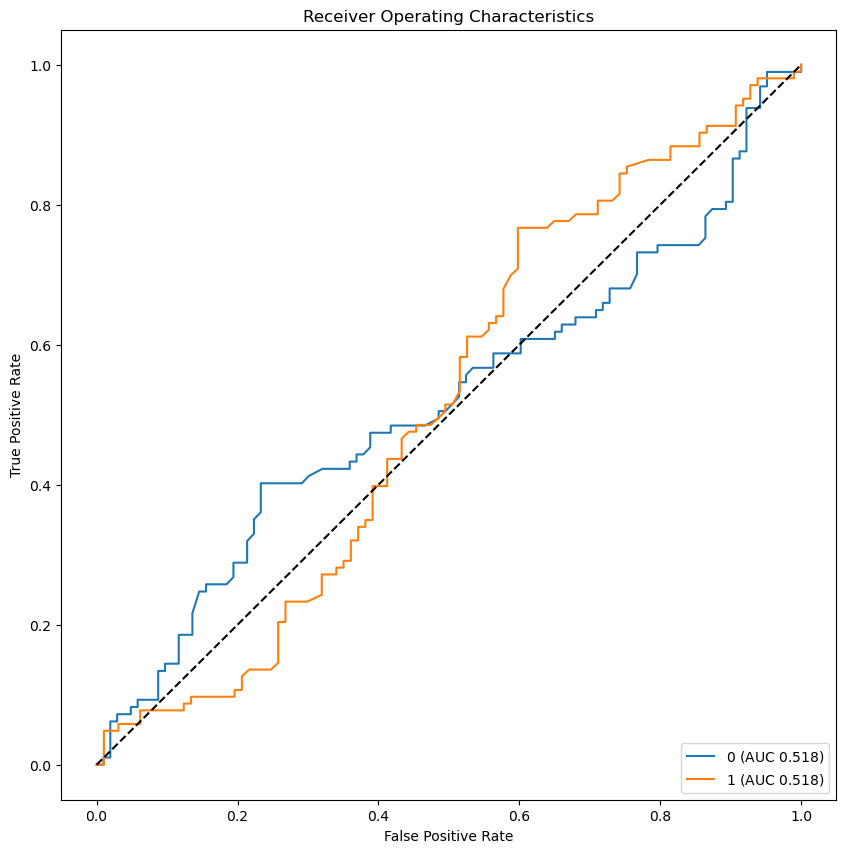

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


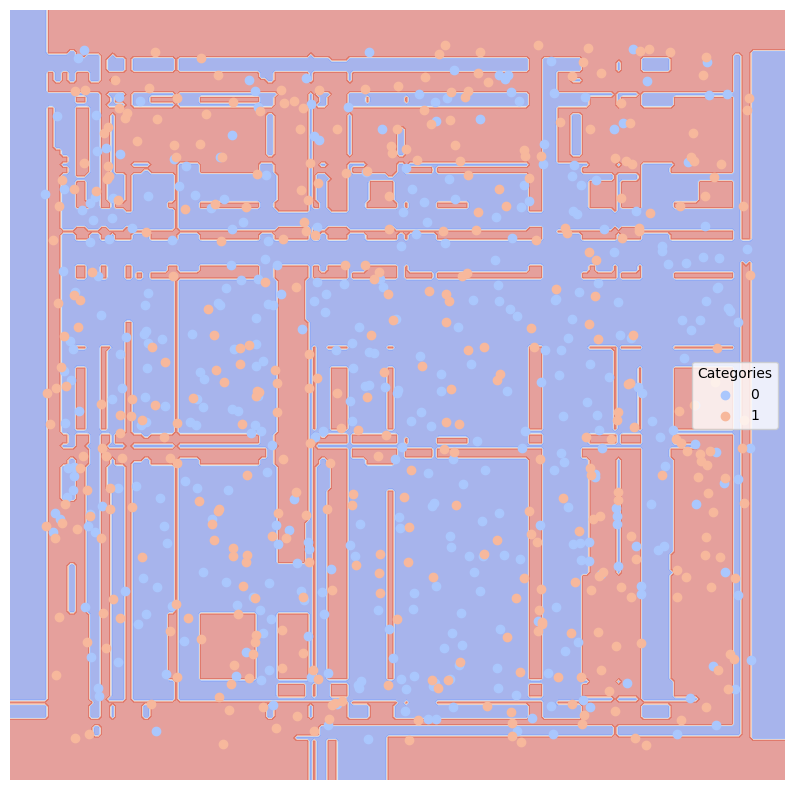

####################### Moving onto next Classifier #######################
####################### Moving to next Splitter #######################
##### ANDSPLIT #####
#### Train/test split on andSplit. Model: GaussianNB() ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.06  0.94   0.923077           0.906154    0.96
1               0.06  0.94   0.958333           0.921667    0.92


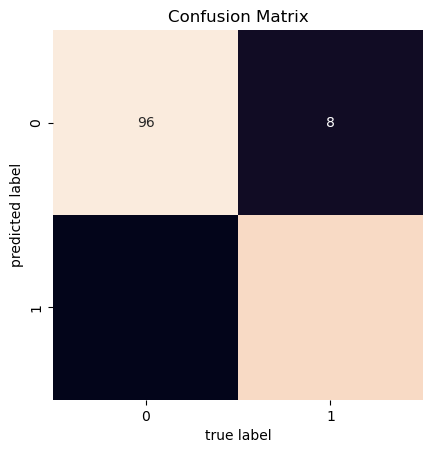

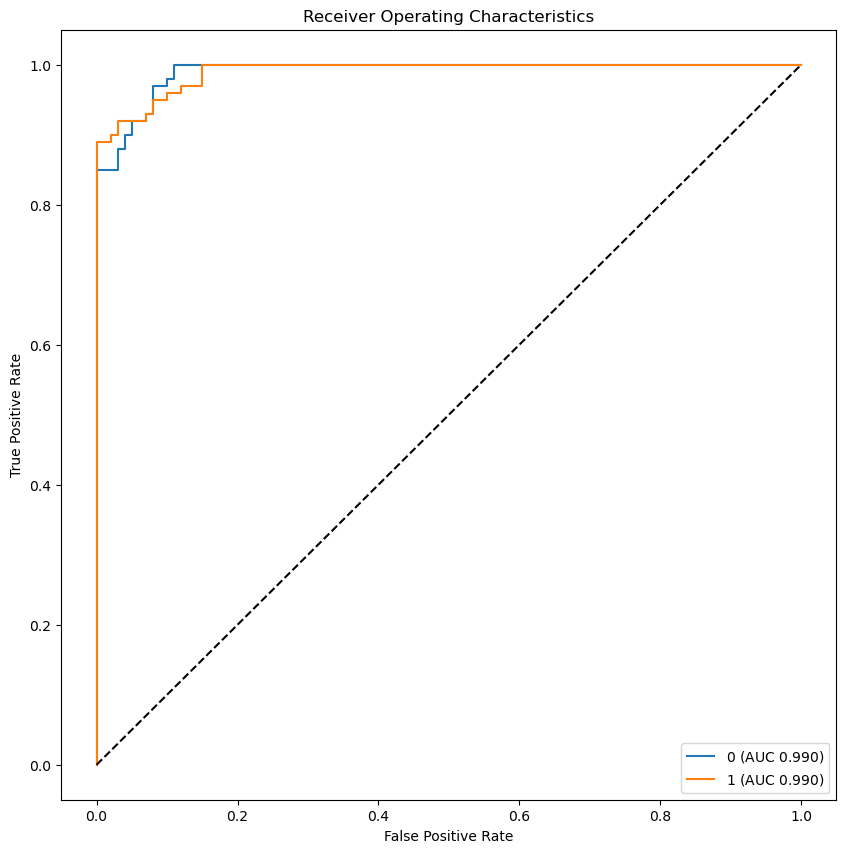

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


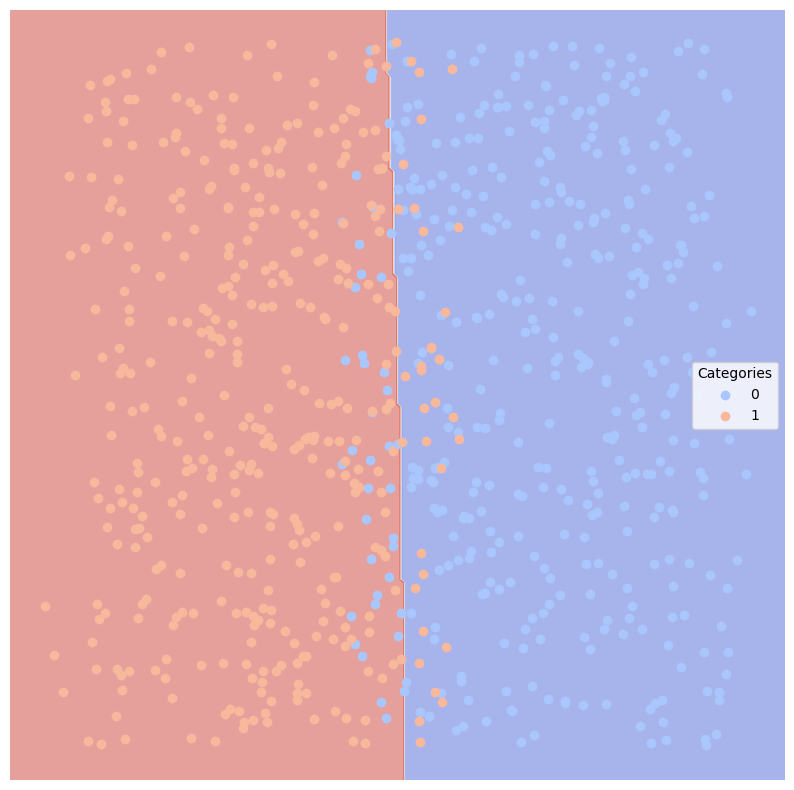

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: SVC(kernel='linear', probability=True, random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.06  0.94   0.915094           0.902642    0.97
1               0.06  0.94   0.968085           0.925957    0.91


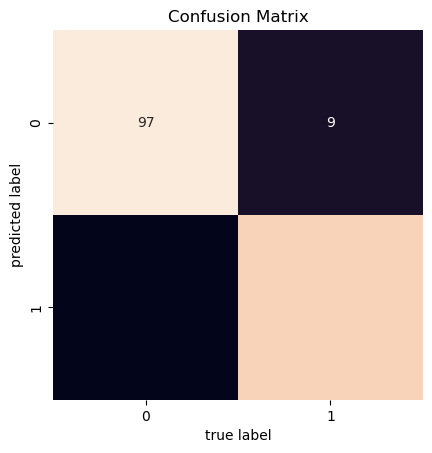

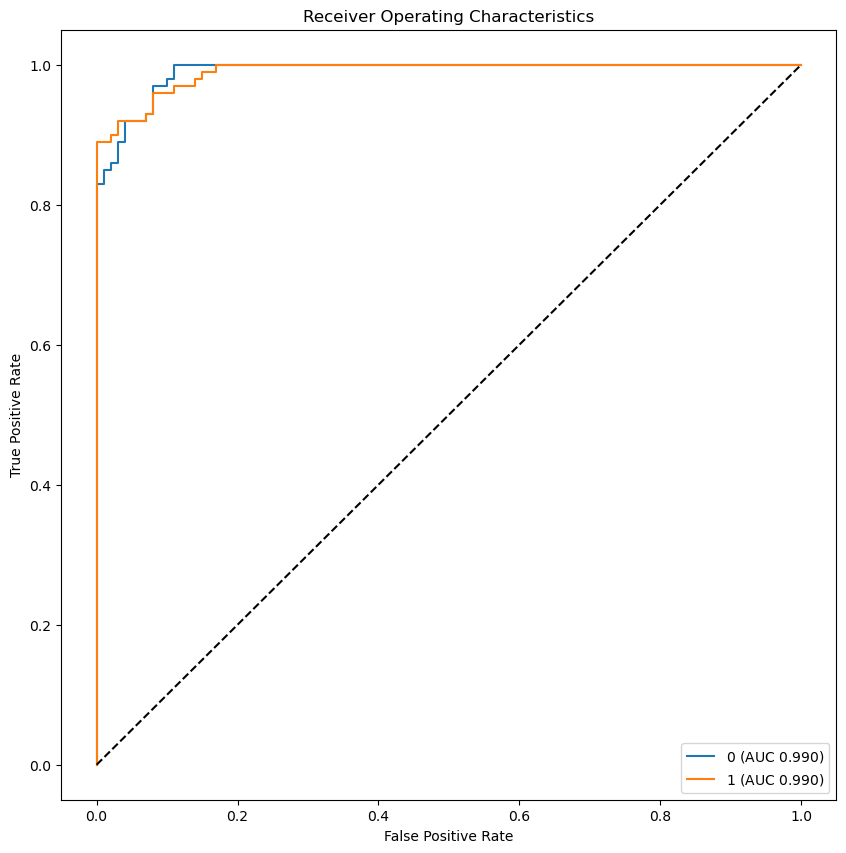

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


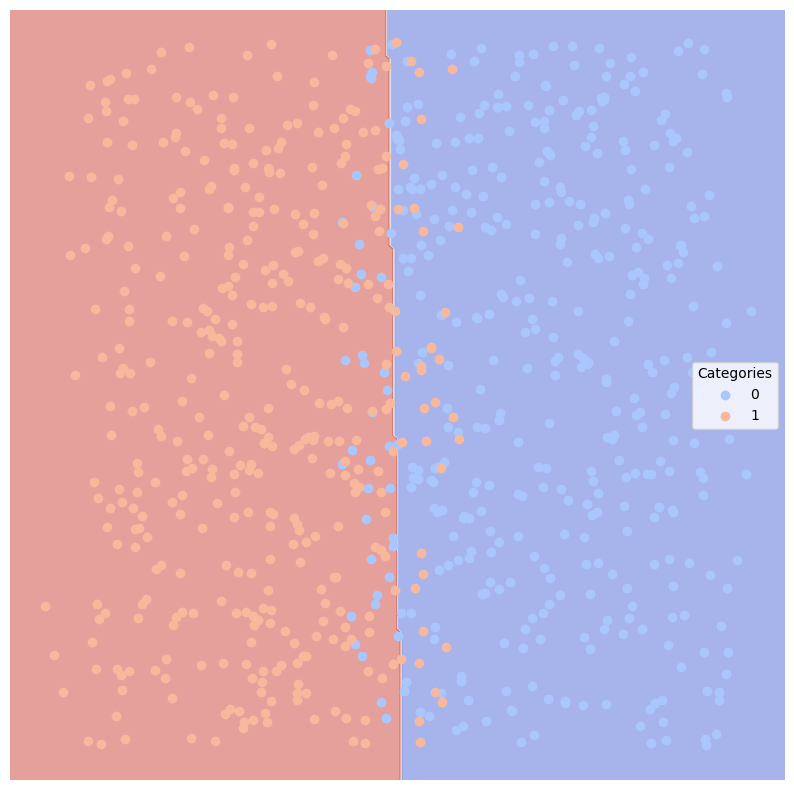

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: SVC(kernel='poly', probability=True, random_state=42) ####
          Error_Rate    AUC  Precision  Average_Precision  Recall
Category                                                         
0              0.055  0.945   0.915888            0.90757    0.98
1              0.055  0.945   0.978495            0.93543    0.91


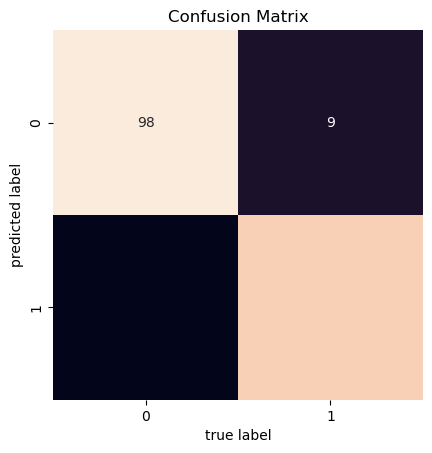

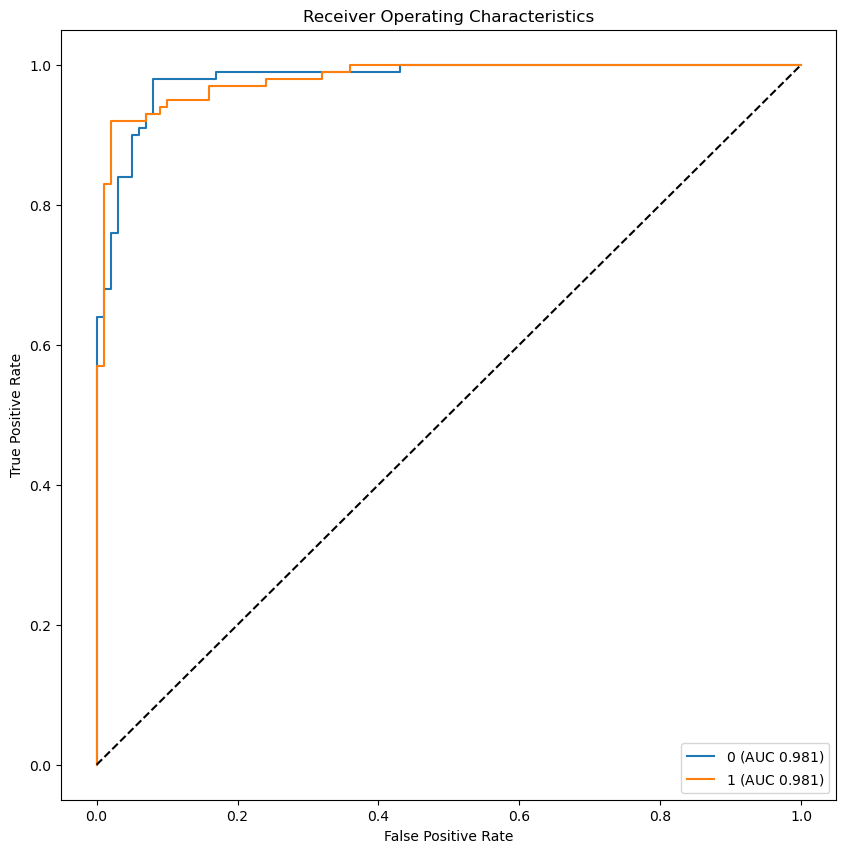

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


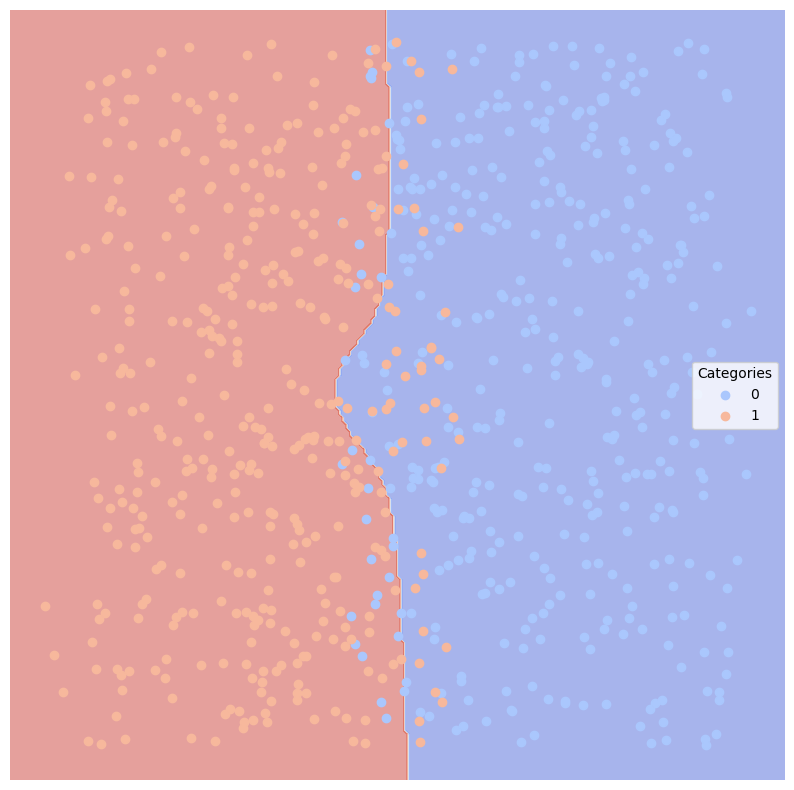

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: KNeighborsClassifier(weights='distance') ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.09  0.91   0.927083           0.880104    0.89
1               0.09  0.91   0.894231           0.866635    0.93


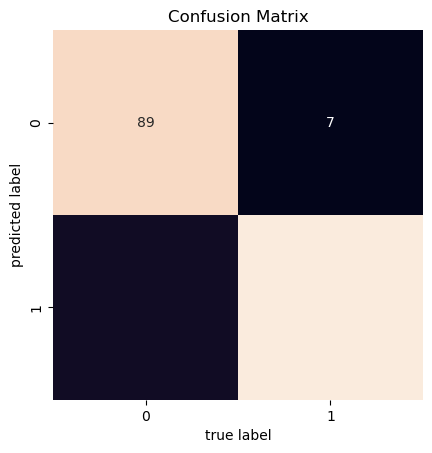

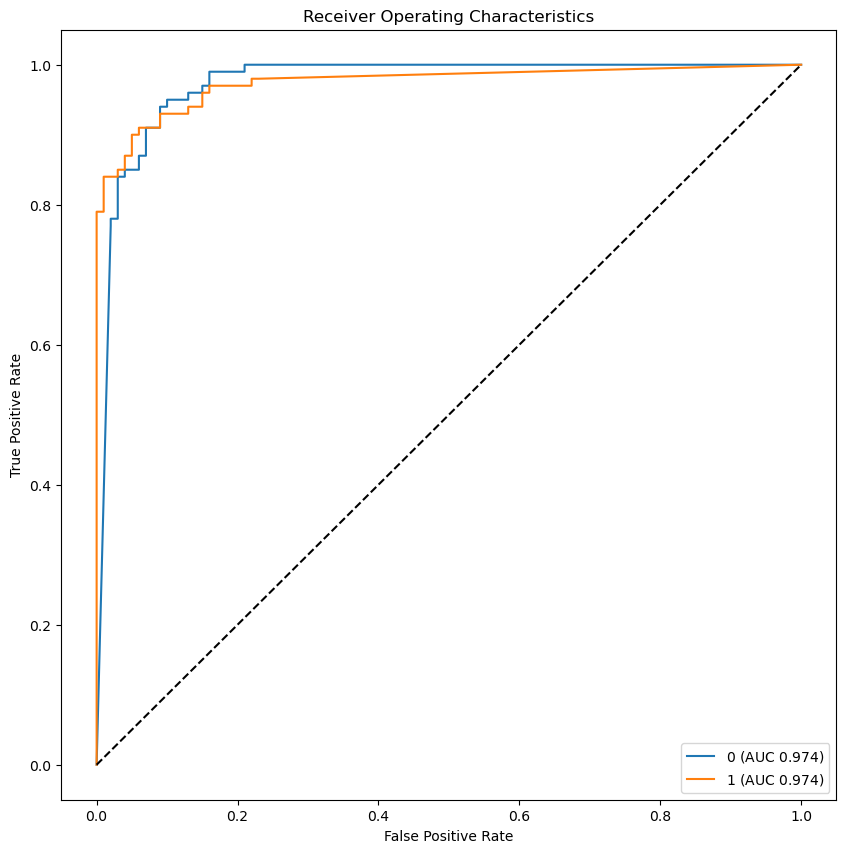

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


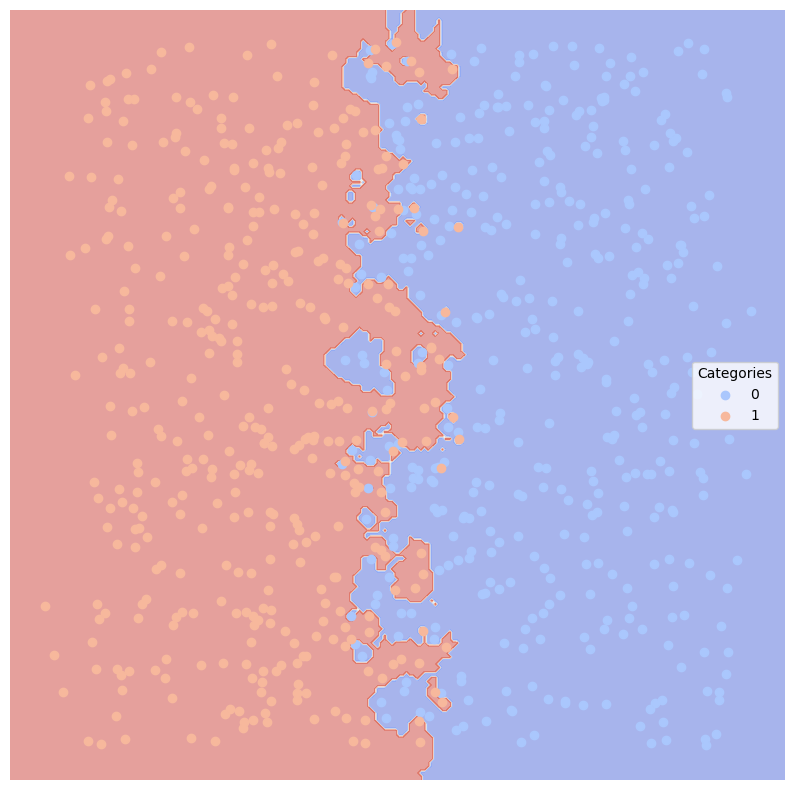

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: LogisticRegression(random_state=42) ####
          Error_Rate    AUC  Precision  Average_Precision  Recall
Category                                                         
0              0.055  0.945   0.923810           0.911095    0.97
1              0.055  0.945   0.968421           0.930947    0.92


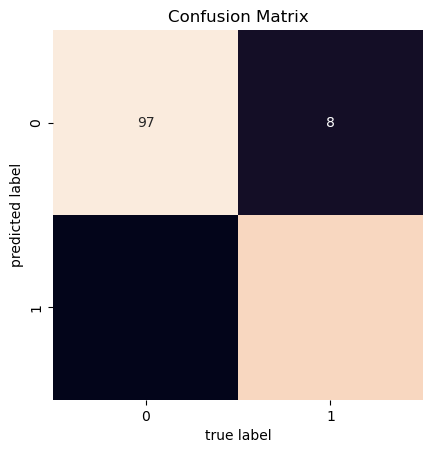

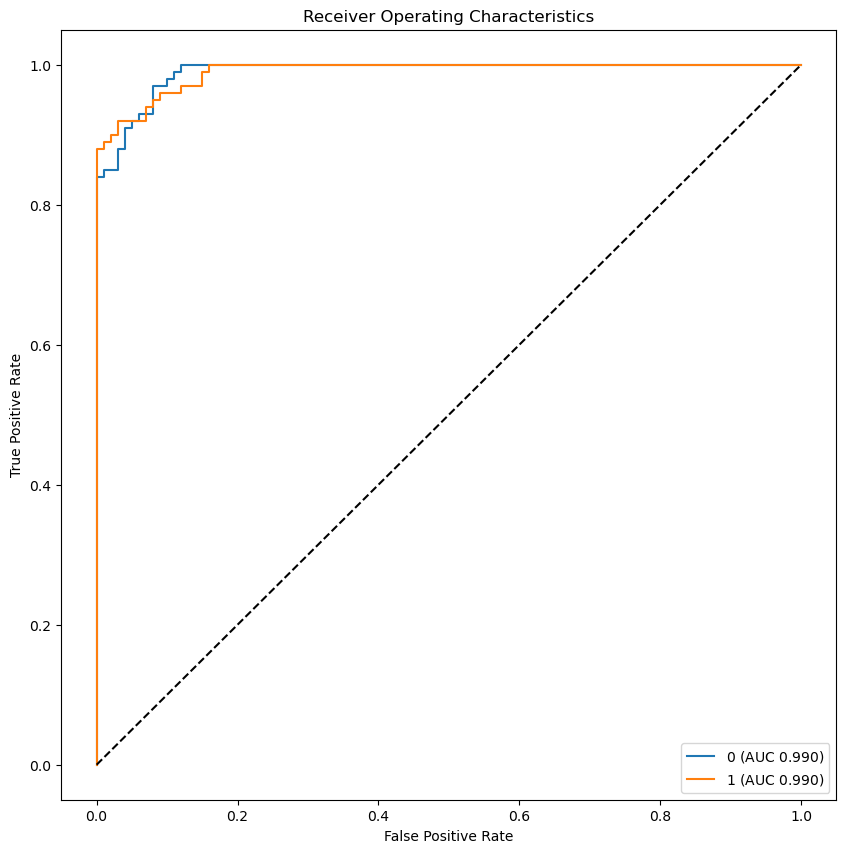

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


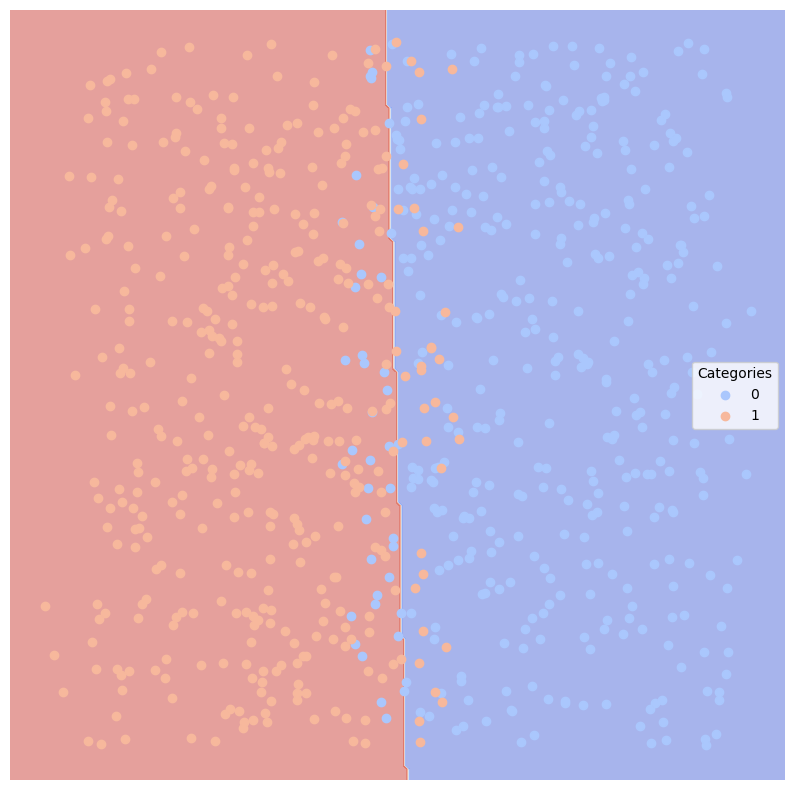

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: DecisionTreeClassifier(random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.09  0.91   0.901961           0.869804    0.92
1               0.09  0.91   0.918367           0.876531    0.90


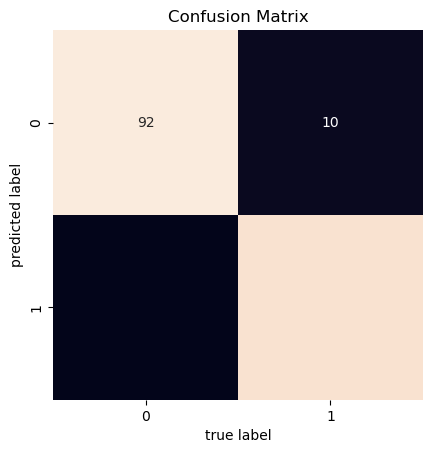

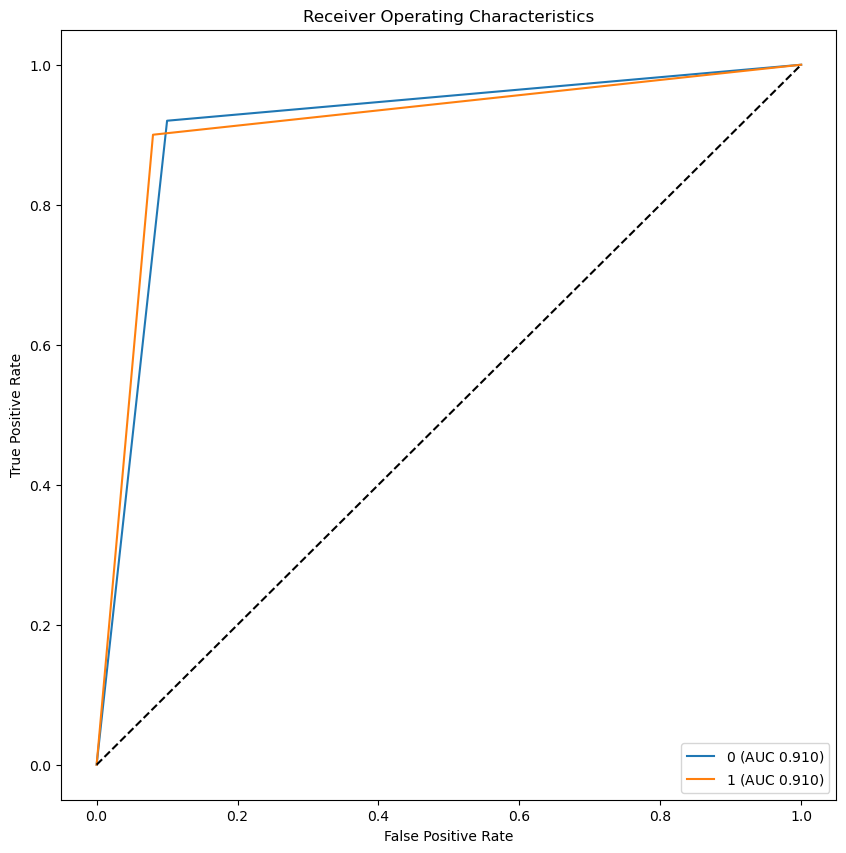

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


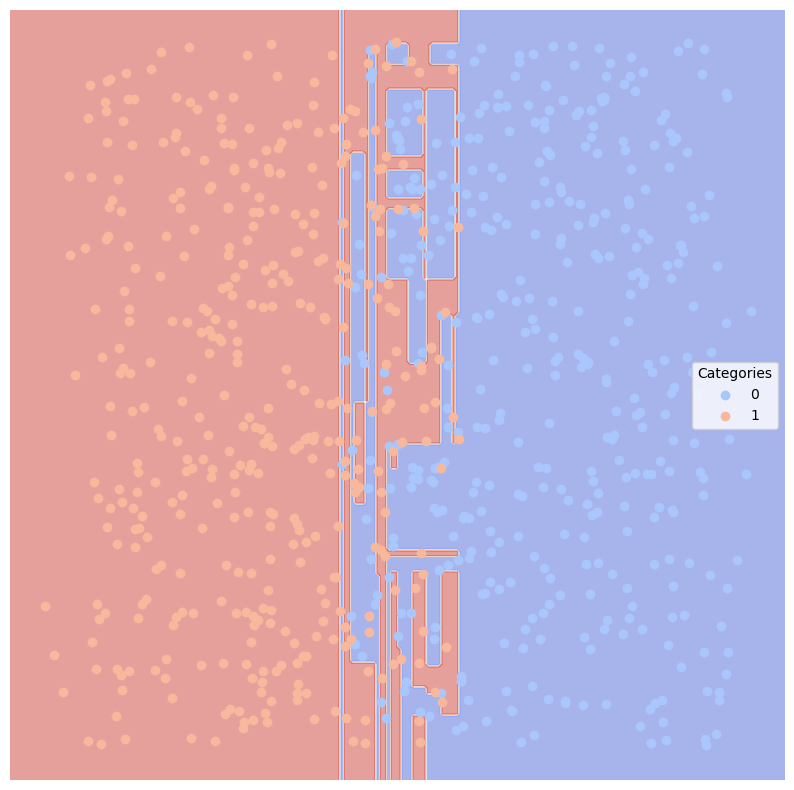

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: RandomForestClassifier(random_state=42) ####
          Error_Rate    AUC  Precision  Average_Precision  Recall
Category                                                         
0              0.095  0.905   0.893204           0.861748    0.92
1              0.095  0.905   0.917526           0.871598    0.89


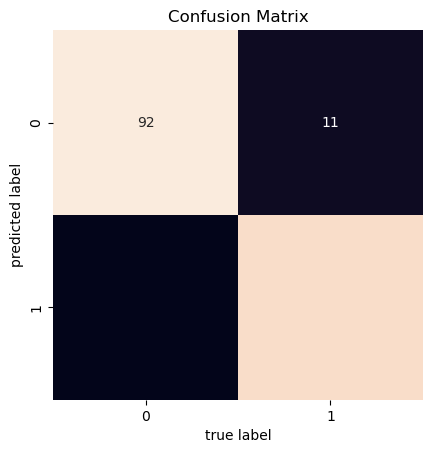

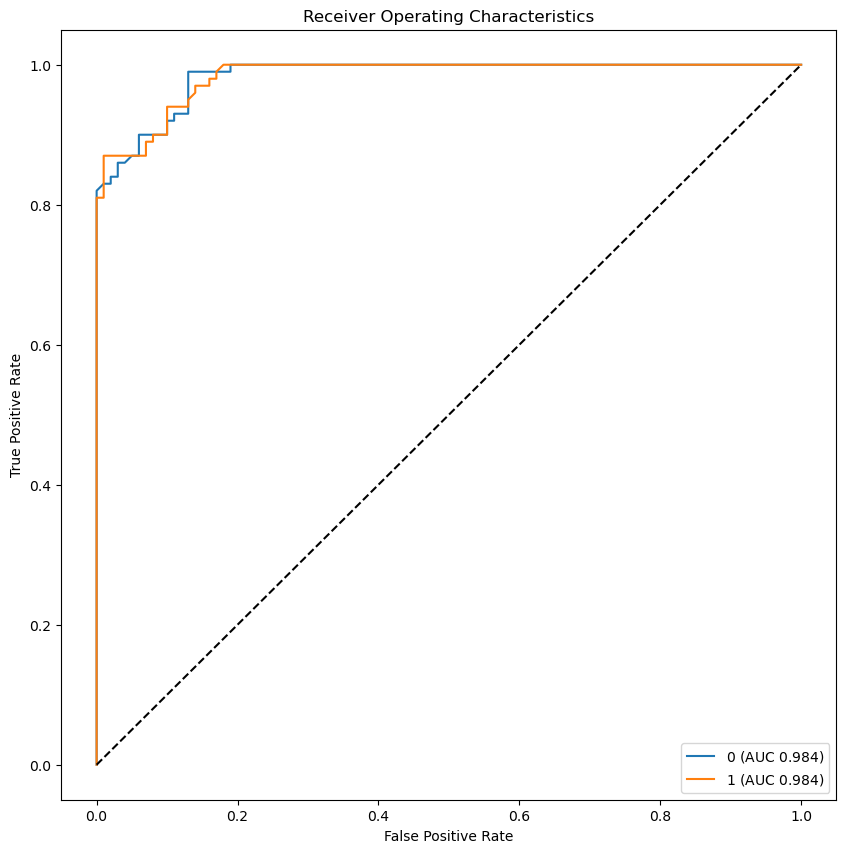

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


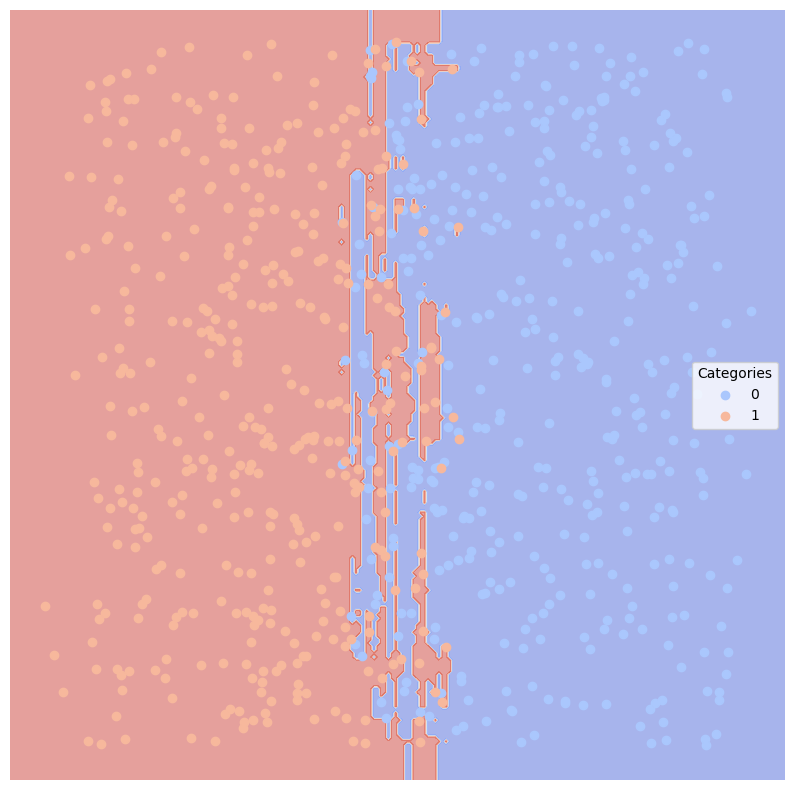

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: MLPClassifier(random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.06  0.94   0.915094           0.902642    0.97
1               0.06  0.94   0.968085           0.925957    0.91


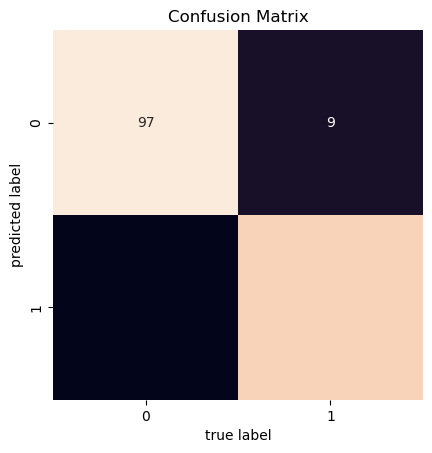

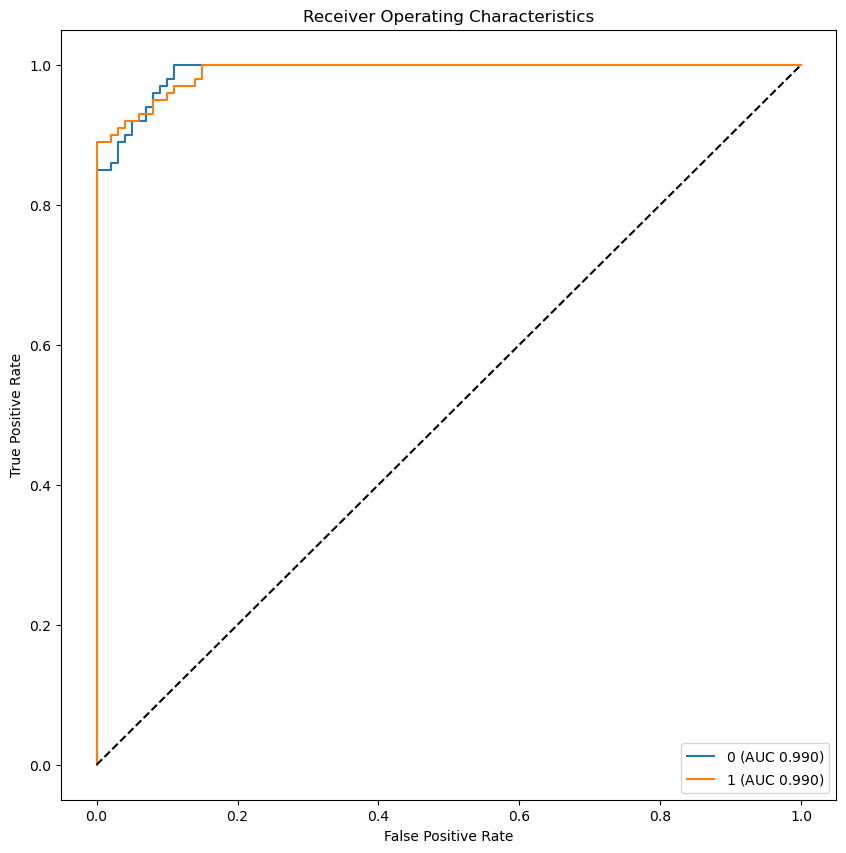

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


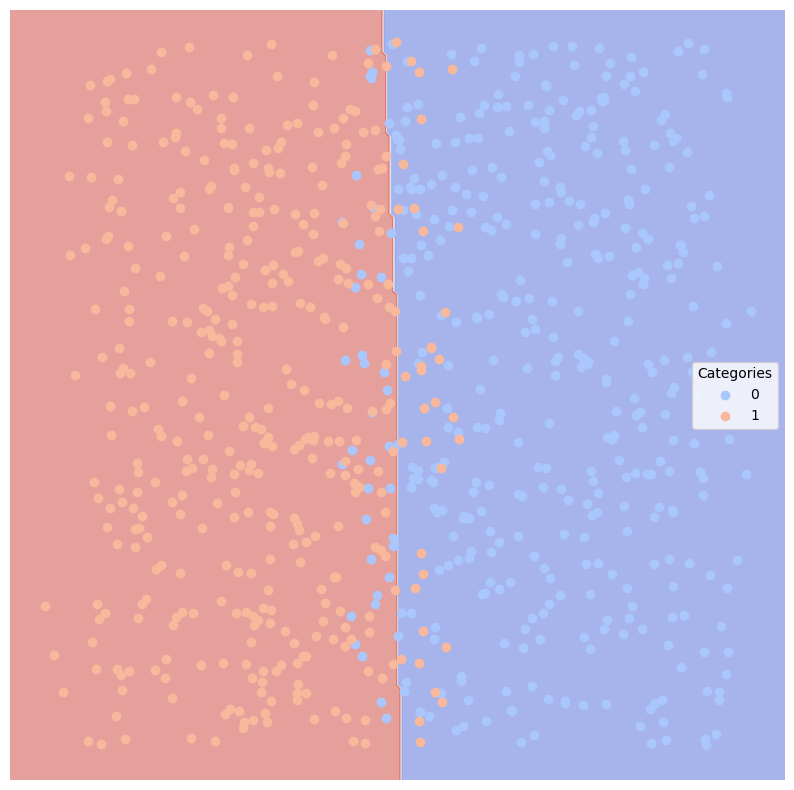

####################### Moving onto next Classifier #######################
#### Train/test split on andSplit. Model: GradientBoostingClassifier(random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.08  0.92   0.903846           0.879615    0.94
1               0.08  0.92   0.937500           0.893750    0.90


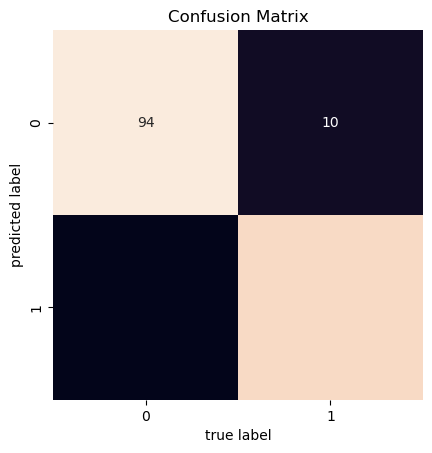

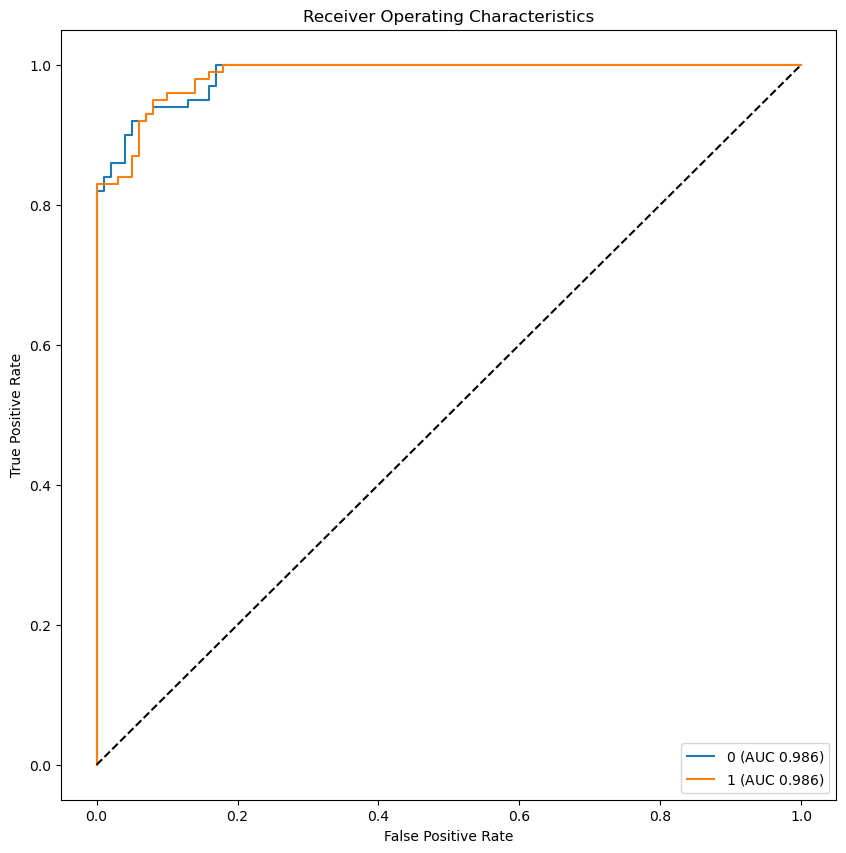

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


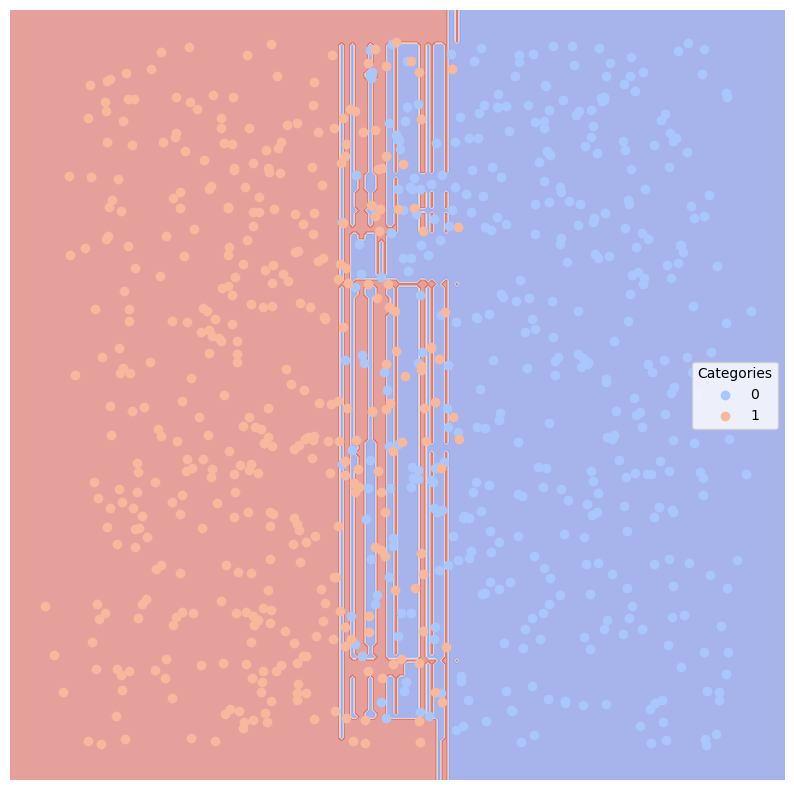

####################### Moving onto next Classifier #######################
####################### Moving to next Splitter #######################
##### XORSPLIT #####
#### Train/test split on xorSplit. Model: GaussianNB() ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.5  0.5        0.5                0.5    0.47
1                0.5  0.5        0.5                0.5    0.53


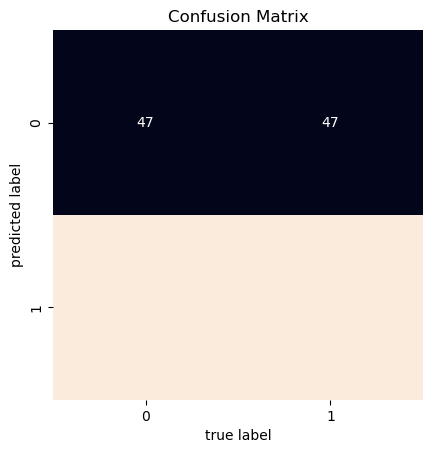

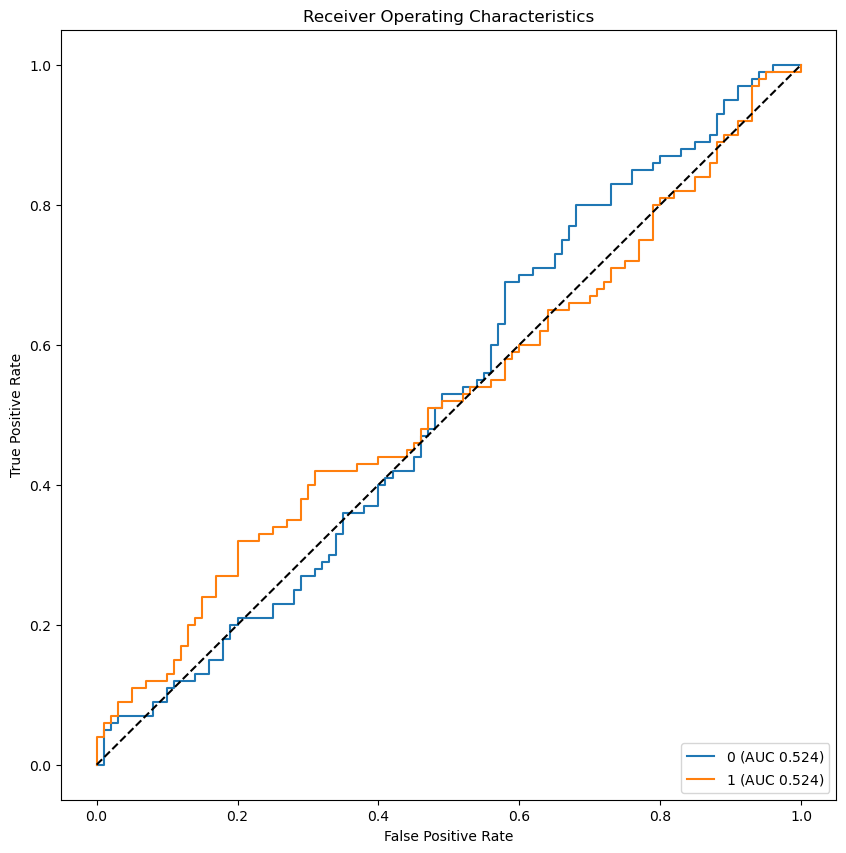

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


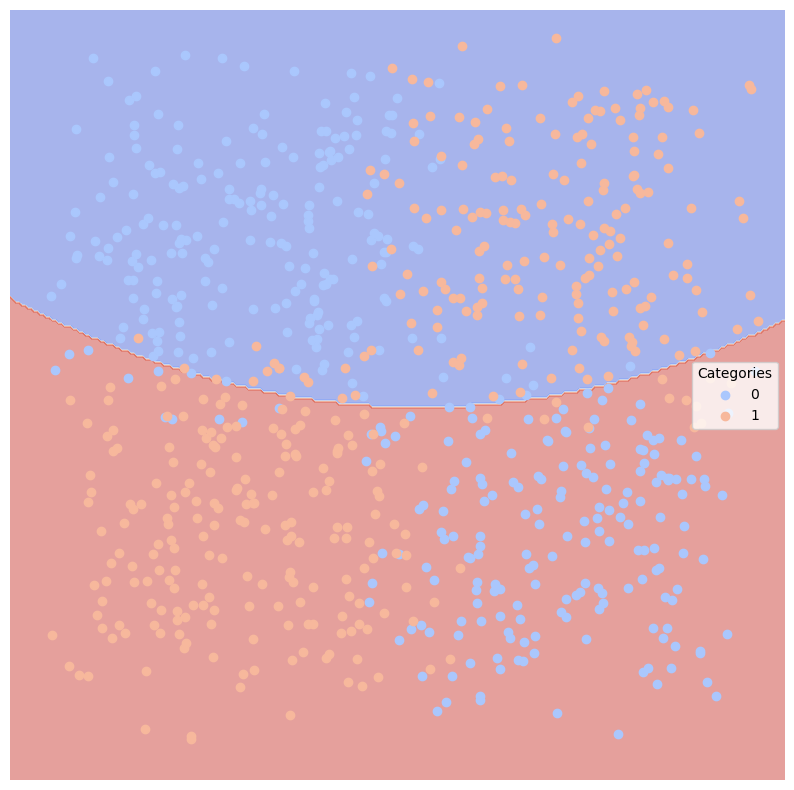

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: SVC(kernel='linear', probability=True, random_state=42) ####
          Error_Rate    AUC  Precision  Average_Precision  Recall
Category                                                         
0              0.505  0.495   0.494505           0.497527    0.45
1              0.505  0.495   0.495413           0.497523    0.54


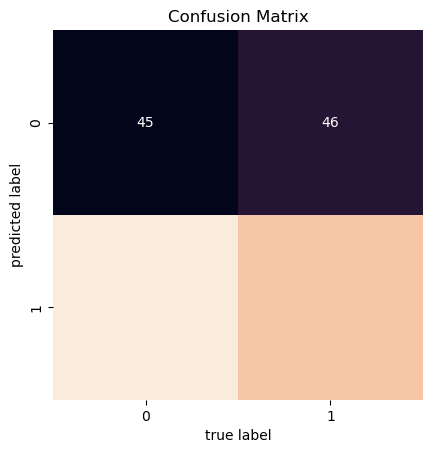

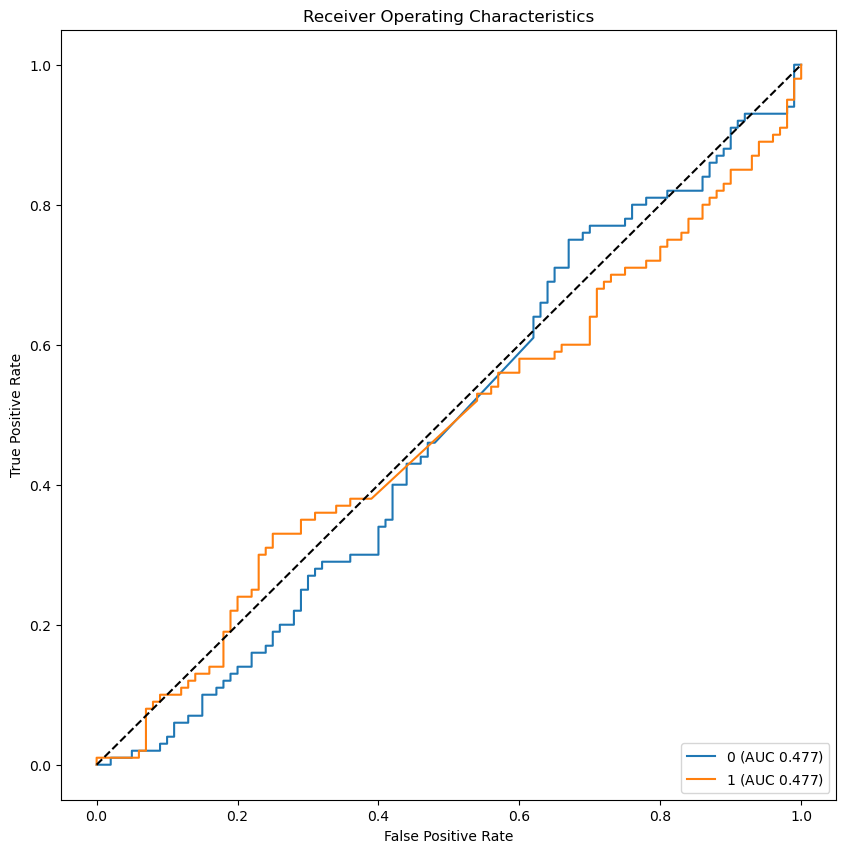

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


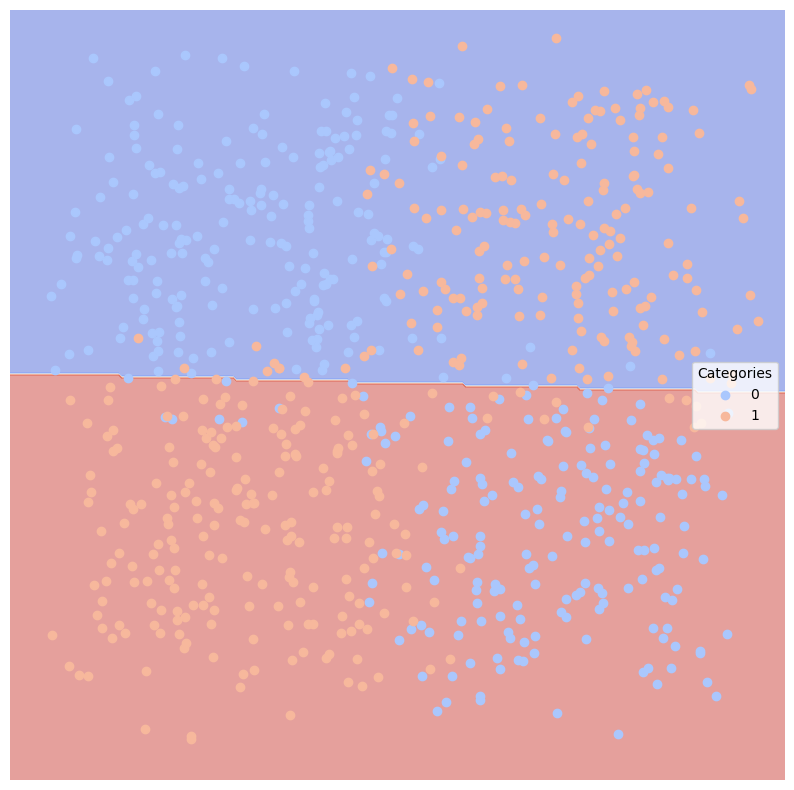

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: SVC(kernel='poly', probability=True, random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.28  0.72   0.789474           0.673684    0.60
1               0.28  0.72   0.677419           0.649032    0.84


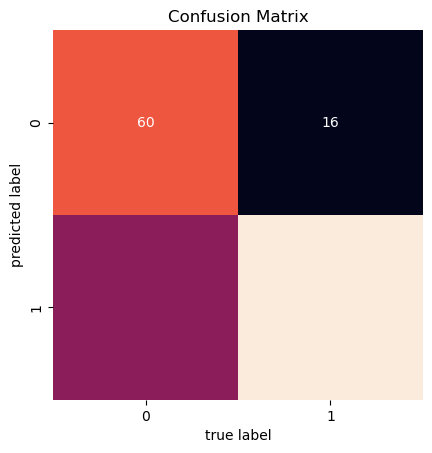

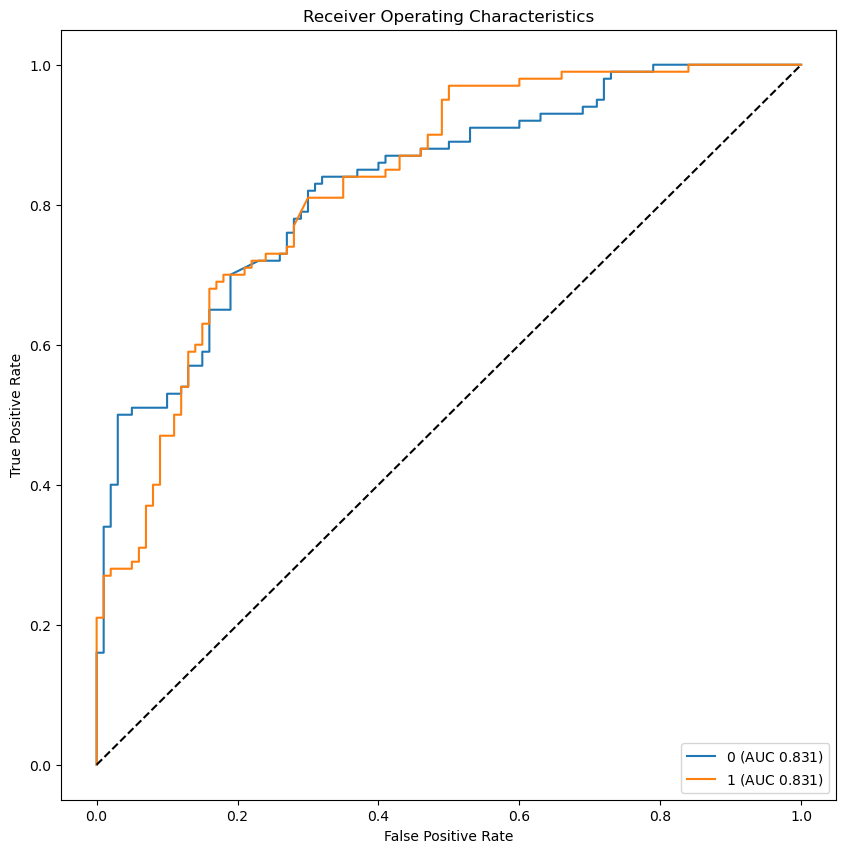

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


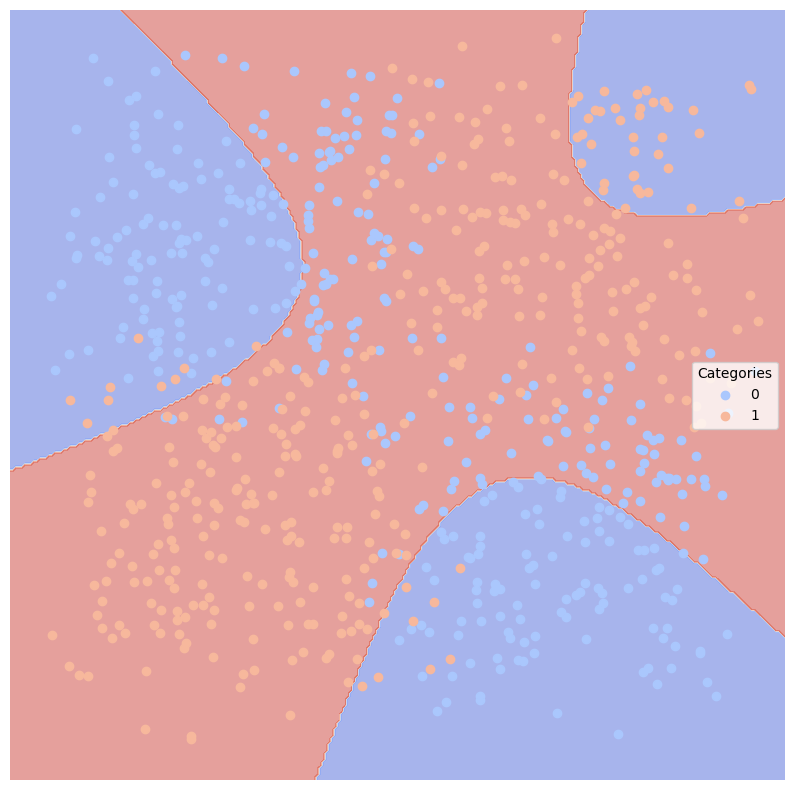

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: KNeighborsClassifier(weights='distance') ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.08  0.92   0.911765           0.882941    0.93
1               0.08  0.92   0.928571           0.890000    0.91


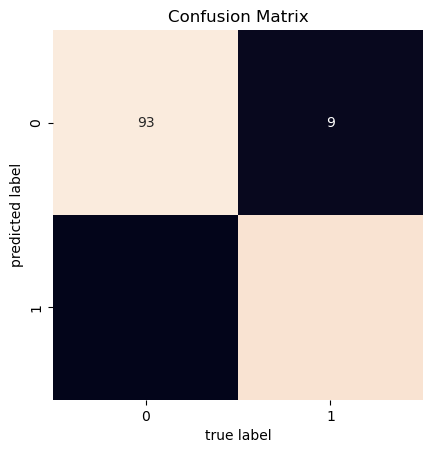

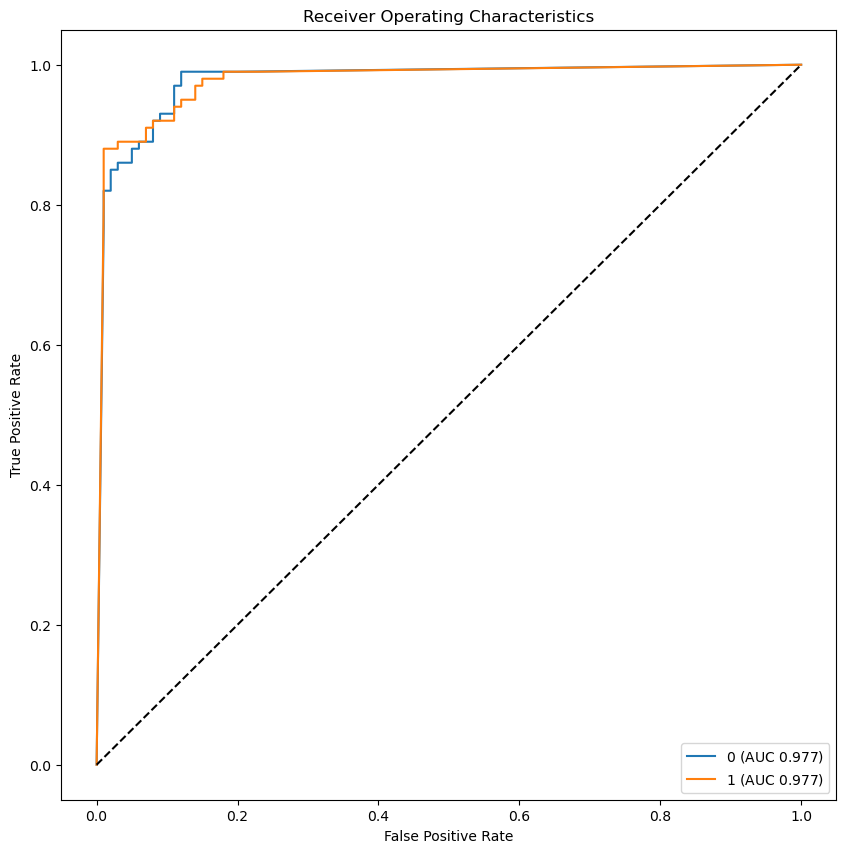

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


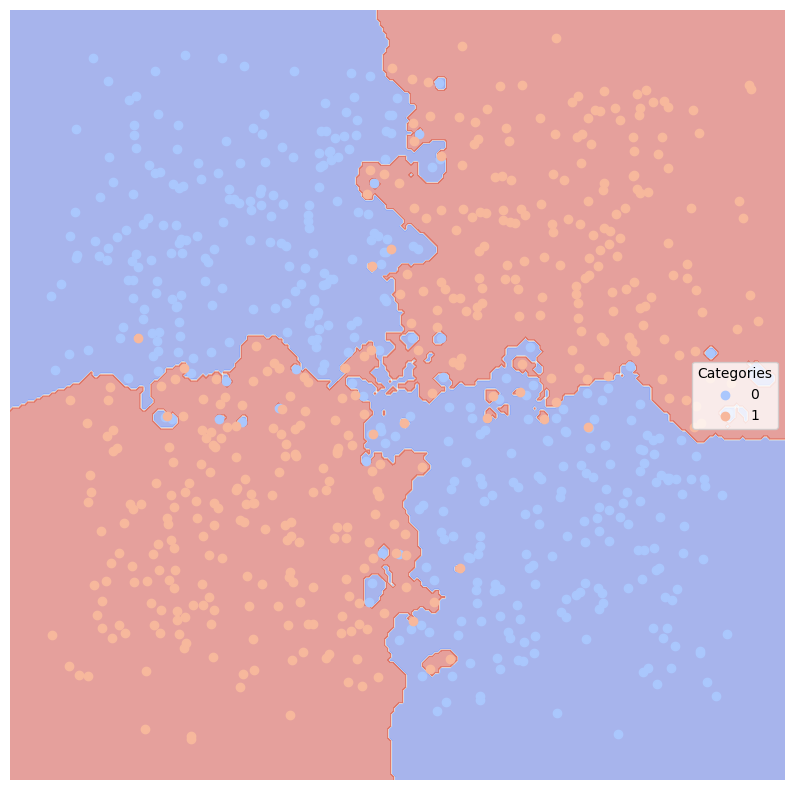

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: LogisticRegression(random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.5  0.5        0.5                0.5    0.46
1                0.5  0.5        0.5                0.5    0.54


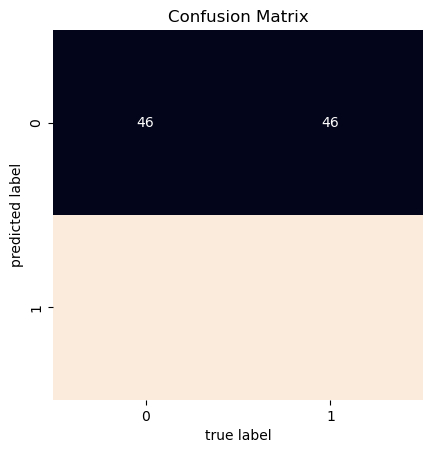

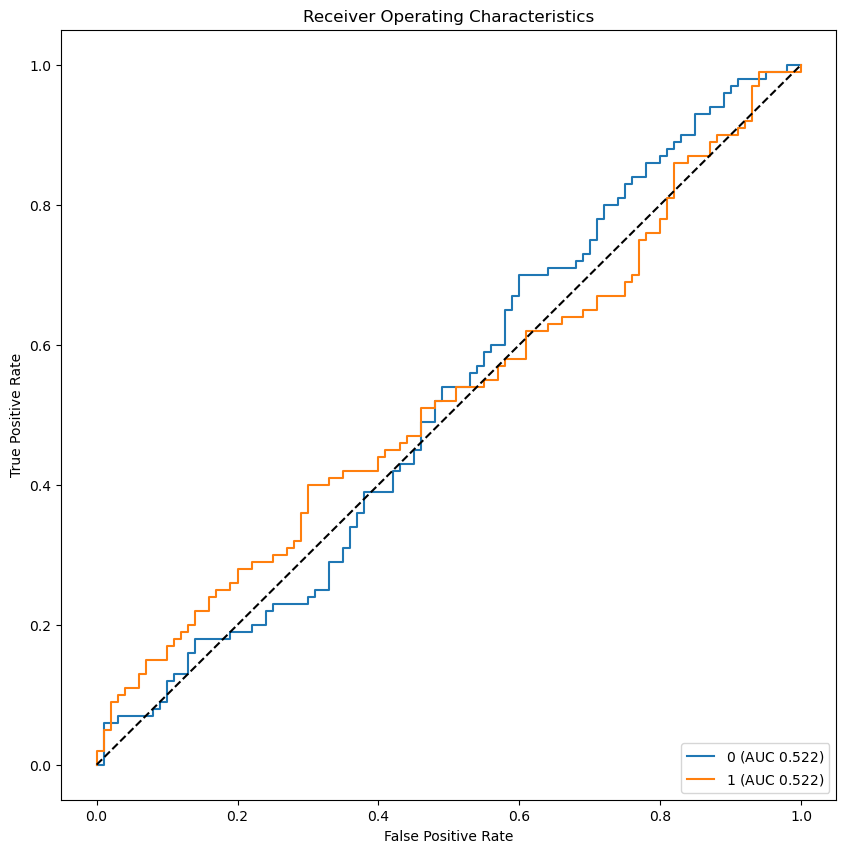

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


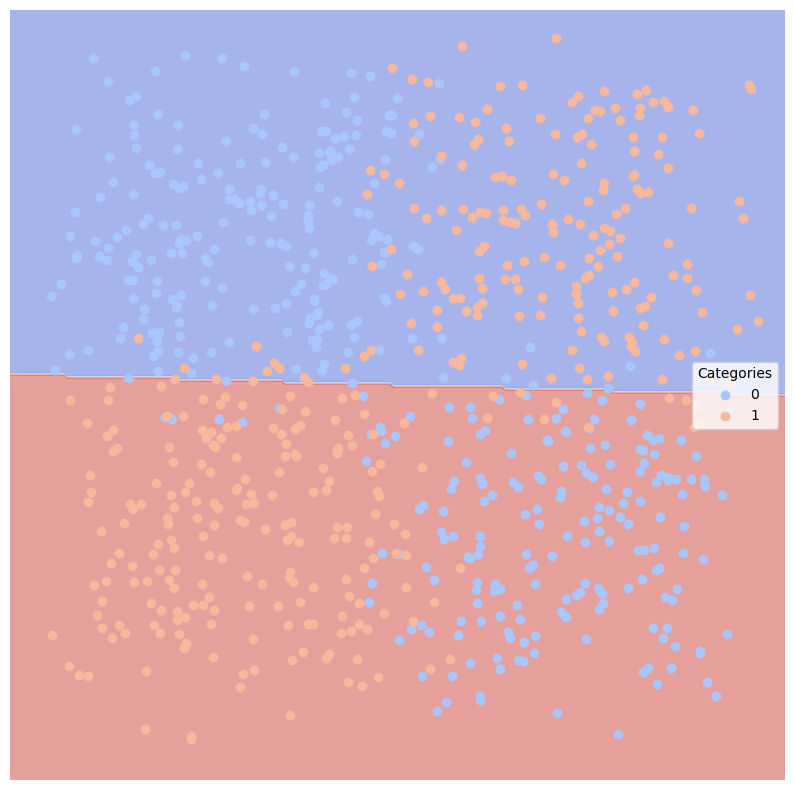

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: DecisionTreeClassifier(random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.13  0.87   0.855769           0.816635    0.89
1               0.13  0.87   0.885417           0.827604    0.85


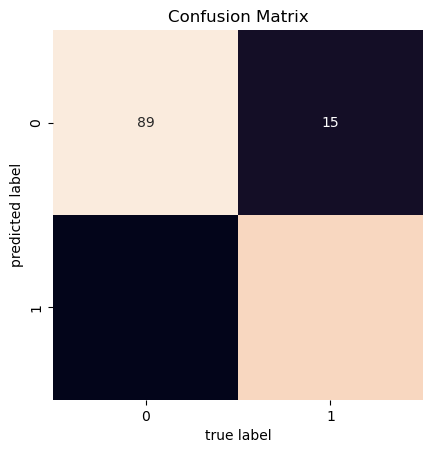

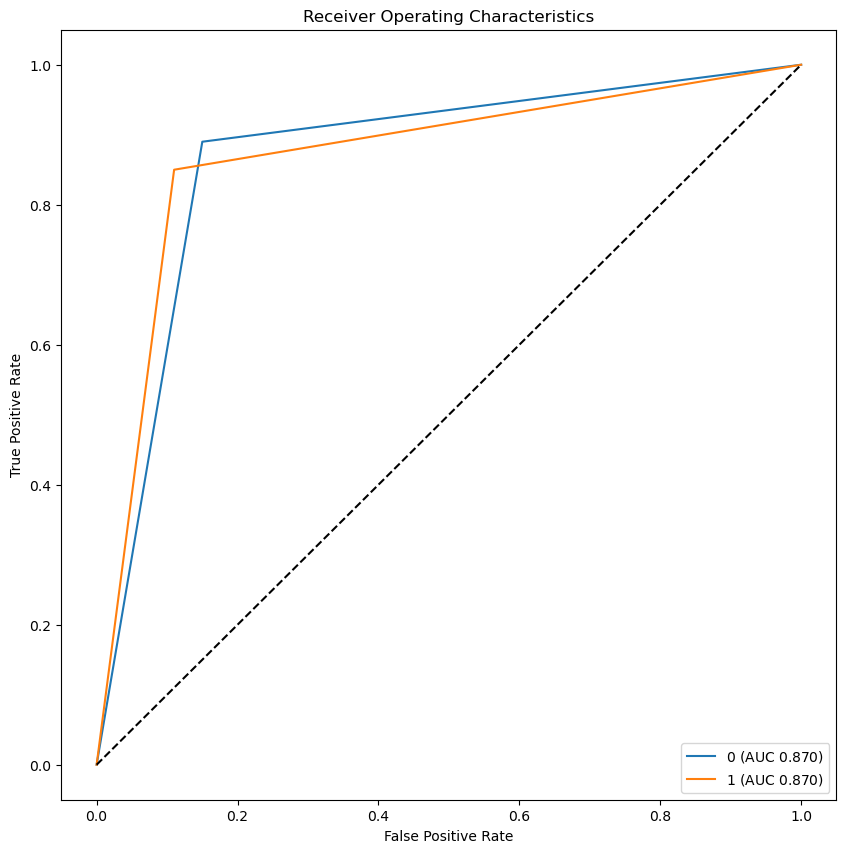

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


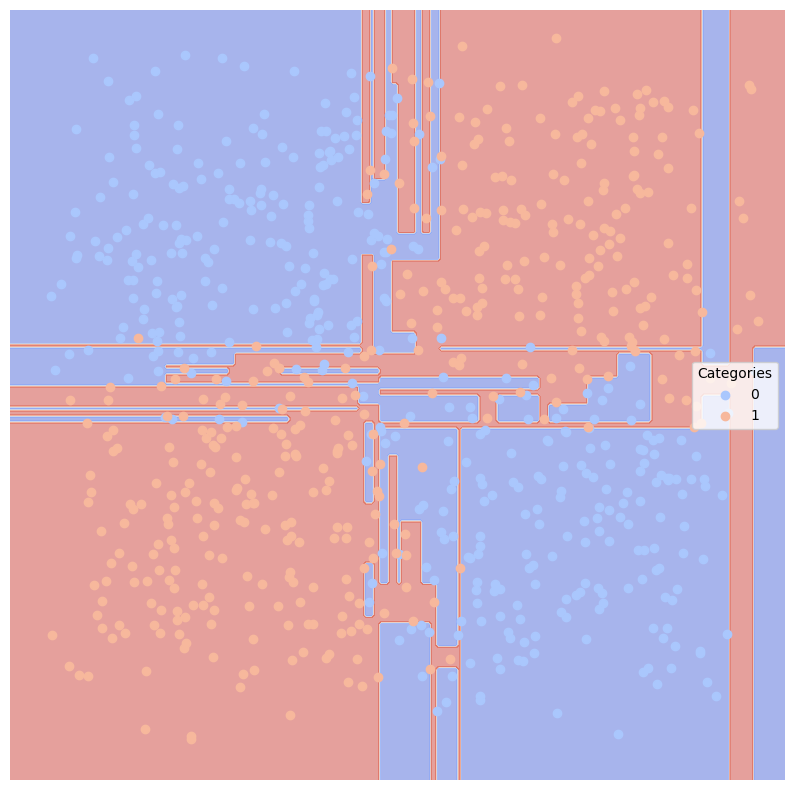

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: RandomForestClassifier(random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.08  0.92       0.92             0.8864    0.92
1               0.08  0.92       0.92             0.8864    0.92


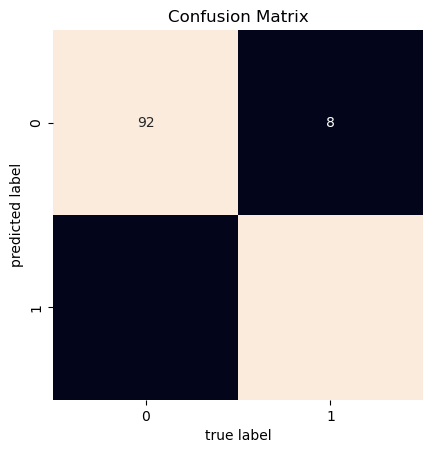

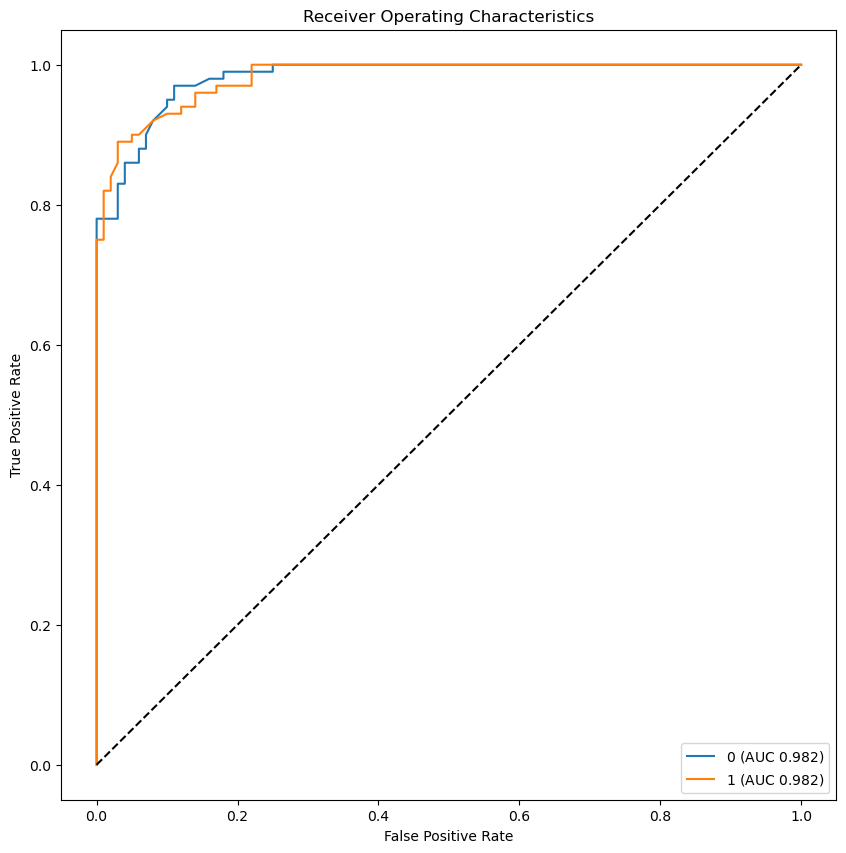

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


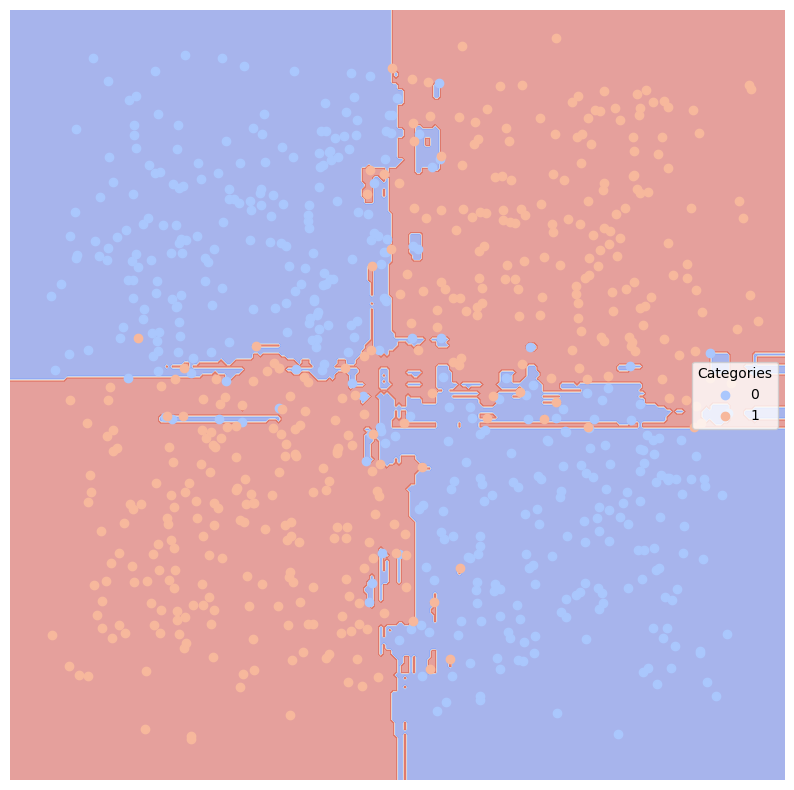

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: MLPClassifier(random_state=42) ####
          Error_Rate    AUC  Precision  Average_Precision  Recall
Category                                                         
0              0.055  0.945   0.940594           0.918564    0.95
1              0.055  0.945   0.949495           0.922525    0.94


c:\Users\Ethan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


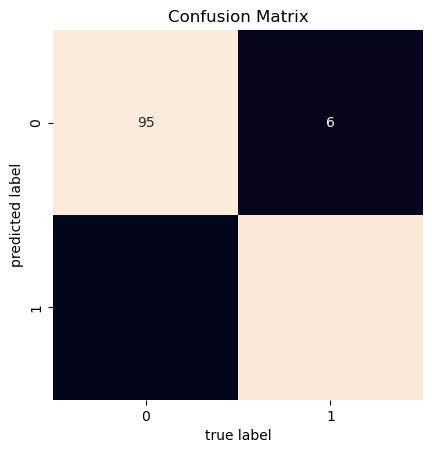

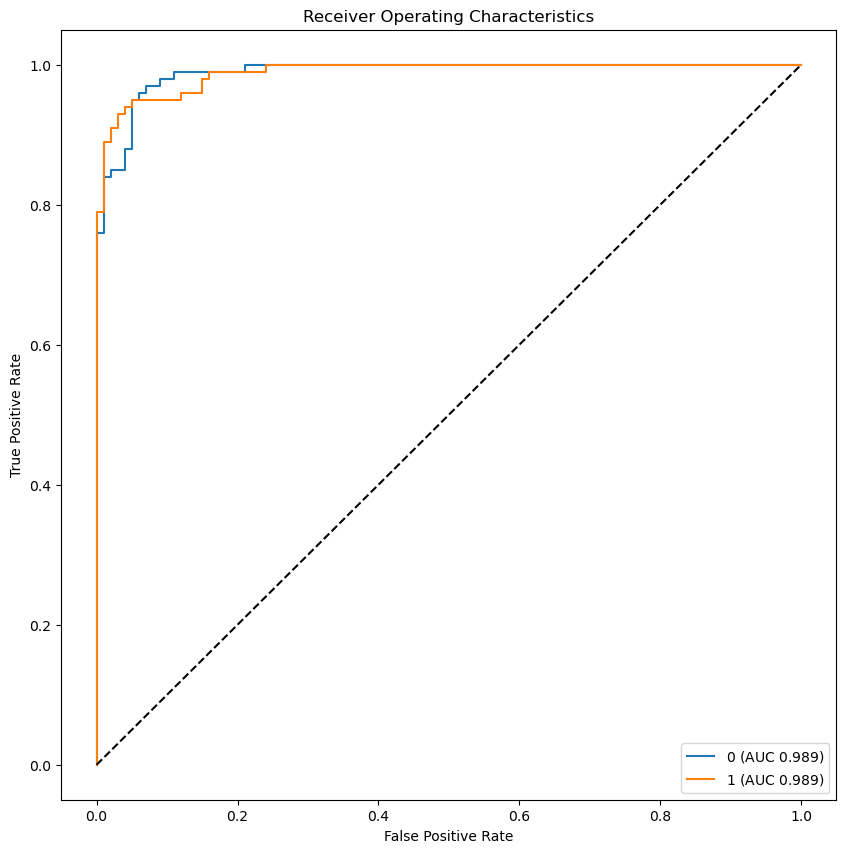

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


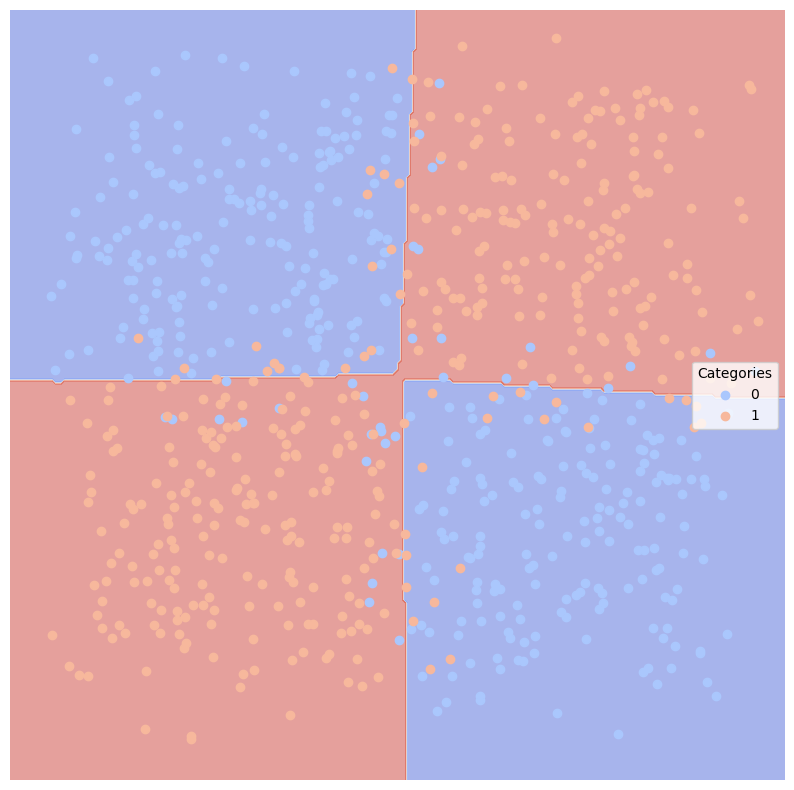

####################### Moving onto next Classifier #######################
#### Train/test split on xorSplit. Model: GradientBoostingClassifier(random_state=42) ####
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0               0.06  0.94       0.94             0.9136    0.94
1               0.06  0.94       0.94             0.9136    0.94


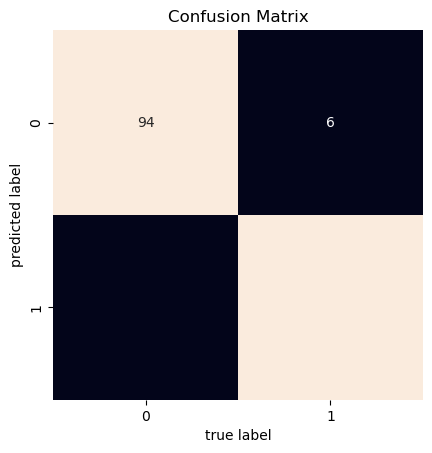

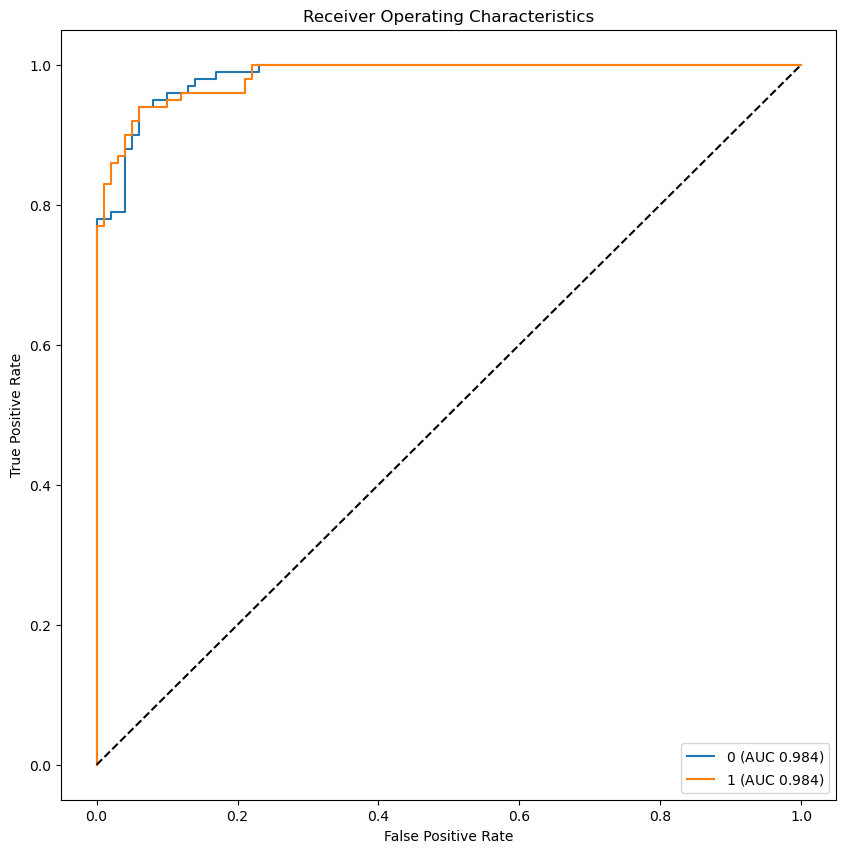

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


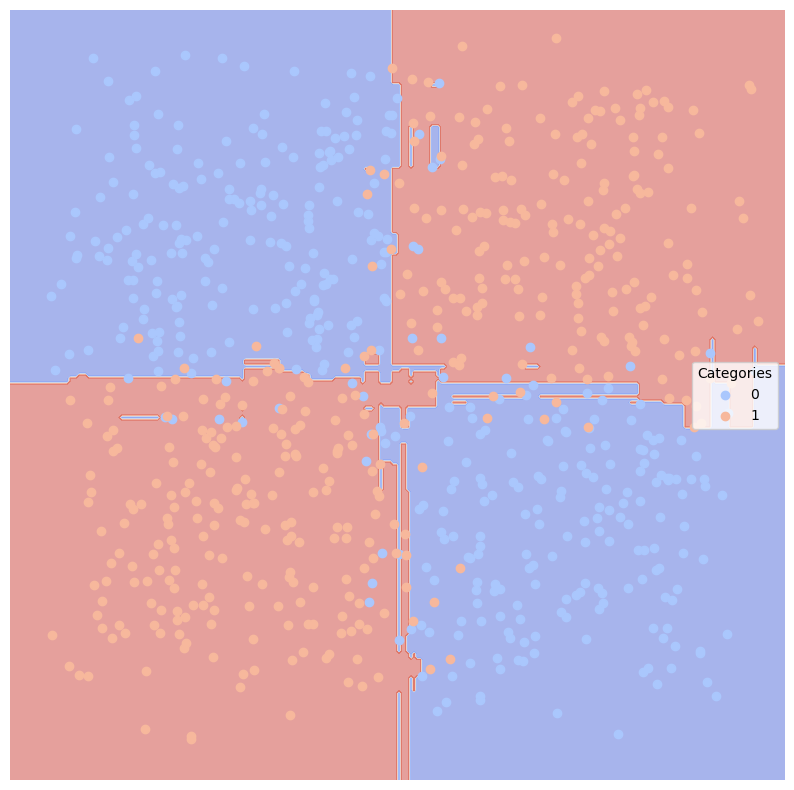

####################### Moving onto next Classifier #######################
####################### Moving to next Splitter #######################
##### TARGETSPLIT #####
#### Train/test split on targetSplit. Model: GaussianNB() ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.06  0.939705   0.943925           0.920995  0.943925
1               0.06  0.939705   0.935484           0.905130  0.935484


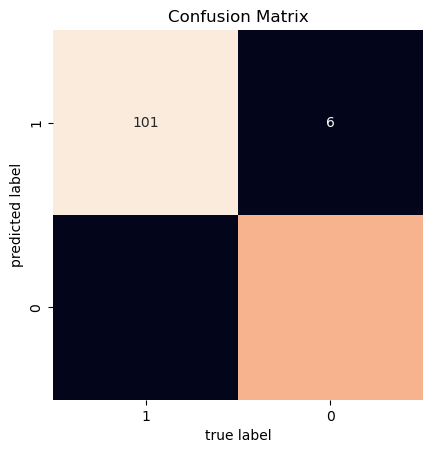

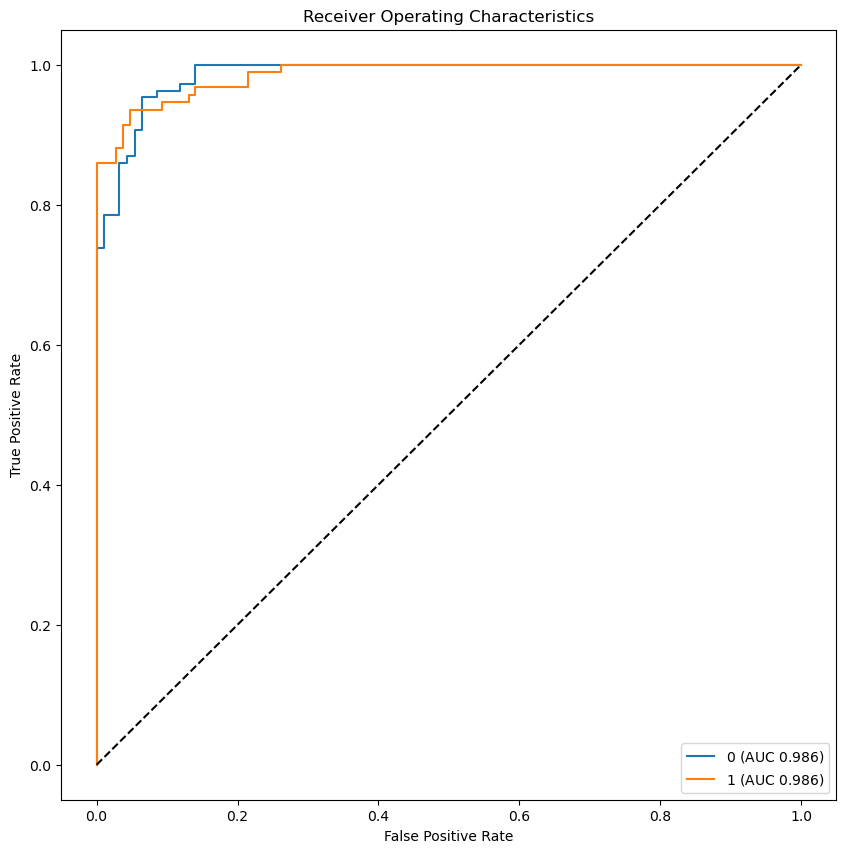

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


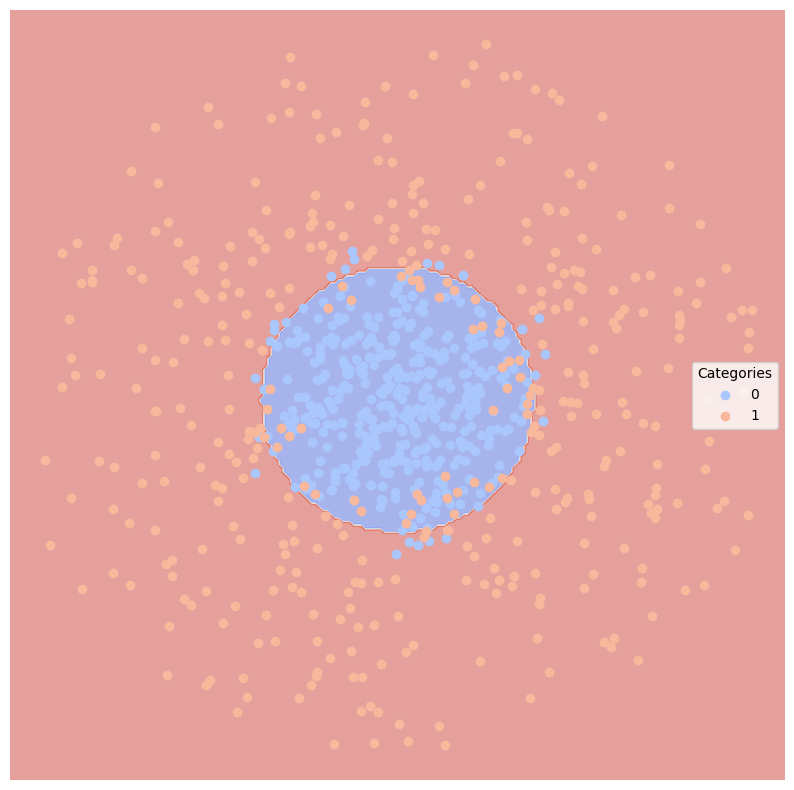

c:\Users\Ethan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: SVC(kernel='linear', probability=True, random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0              0.535  0.5      0.000              0.535     0.0
1              0.535  0.5      0.465              0.465     1.0


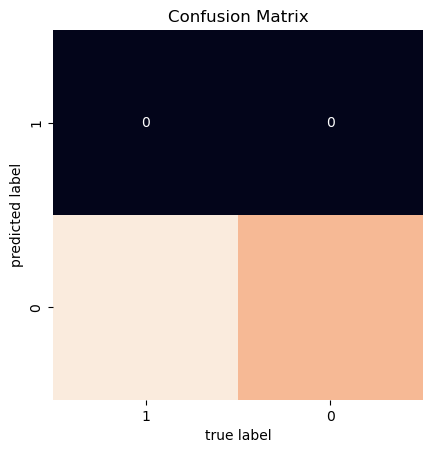

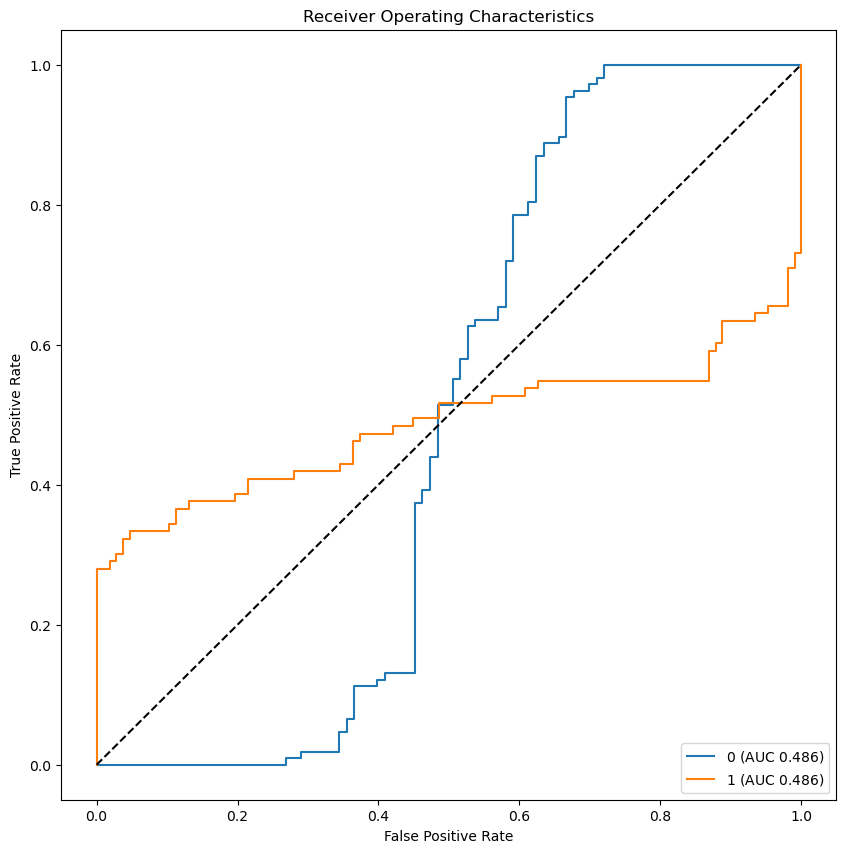

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


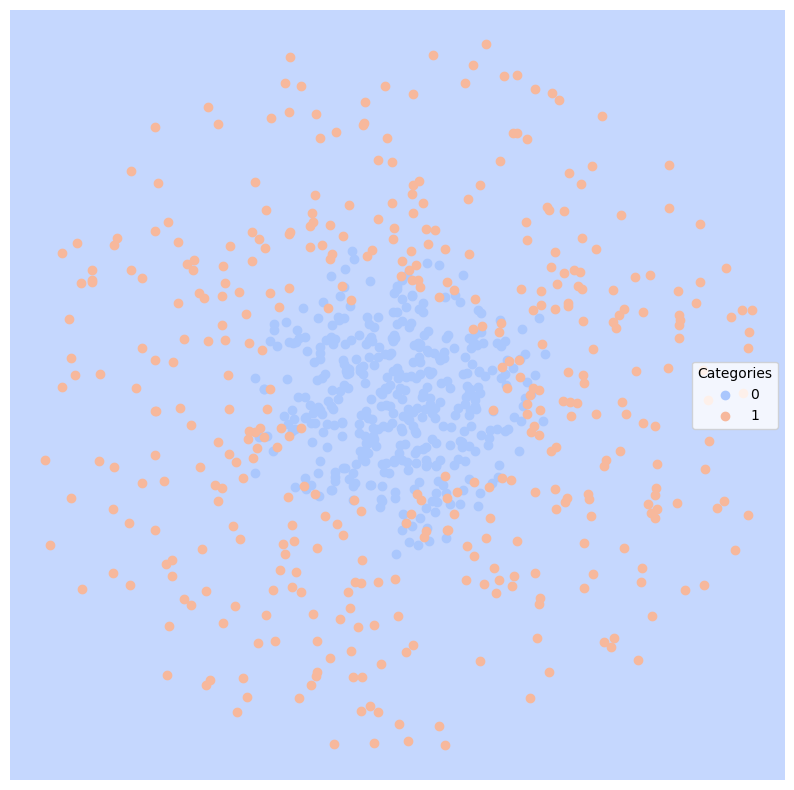

c:\Users\Ethan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: SVC(kernel='poly', probability=True, random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0              0.535  0.5      0.000              0.535     0.0
1              0.535  0.5      0.465              0.465     1.0


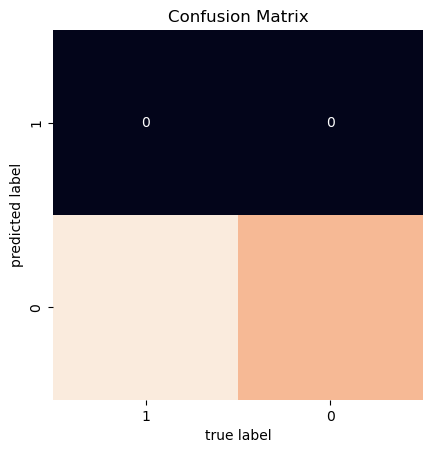

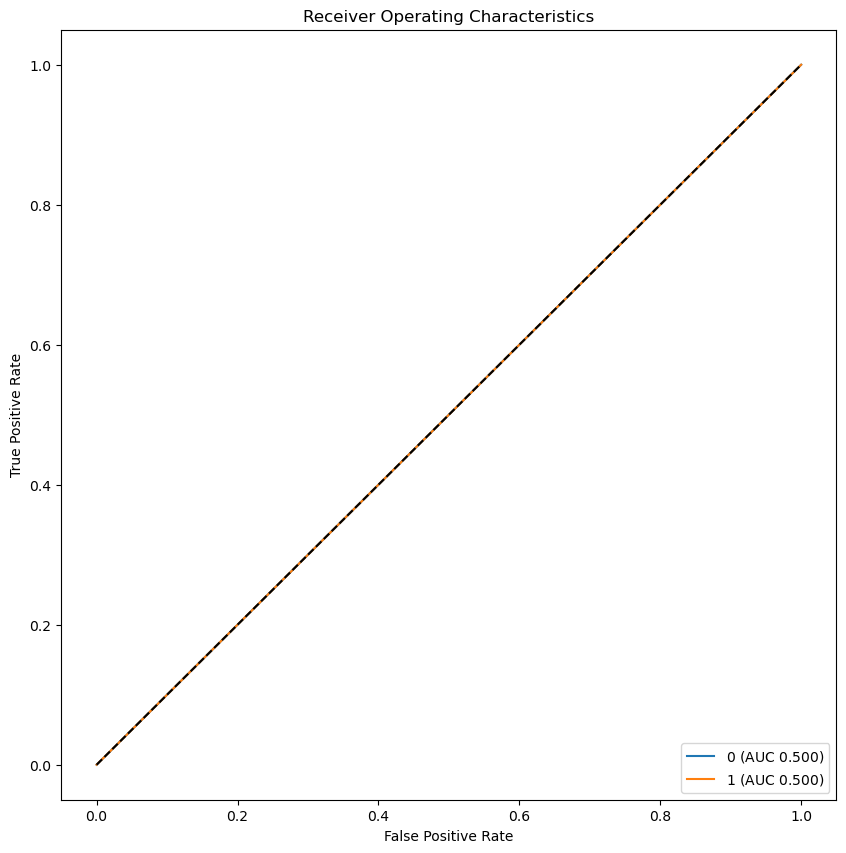

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


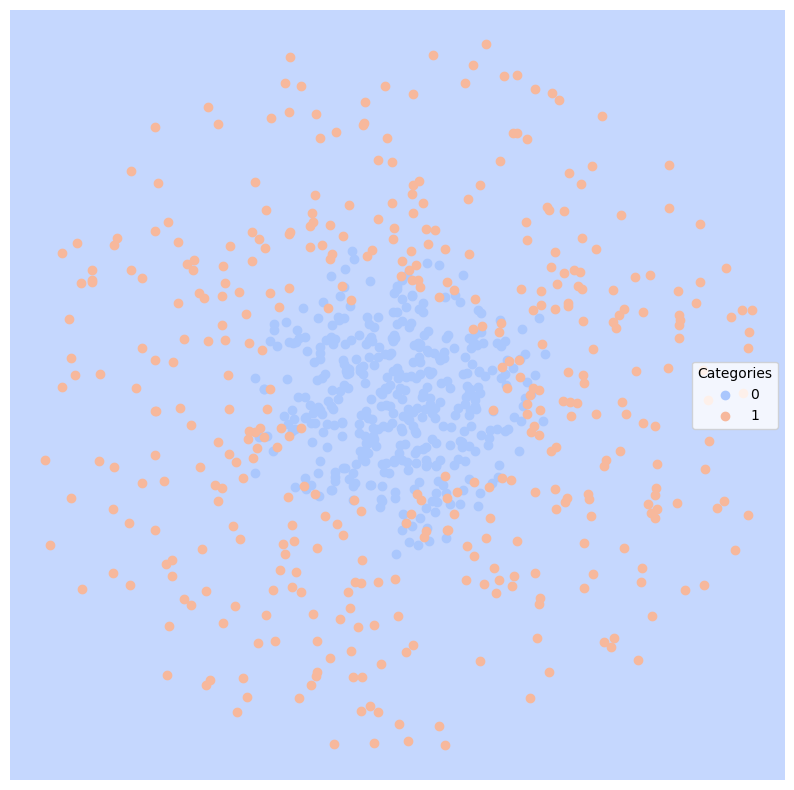

####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: KNeighborsClassifier(weights='distance') ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.08  0.916792   0.895652           0.882170  0.962617
1               0.08  0.916792   0.952941           0.889981  0.870968


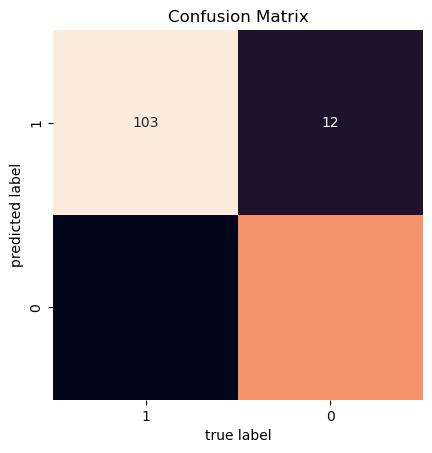

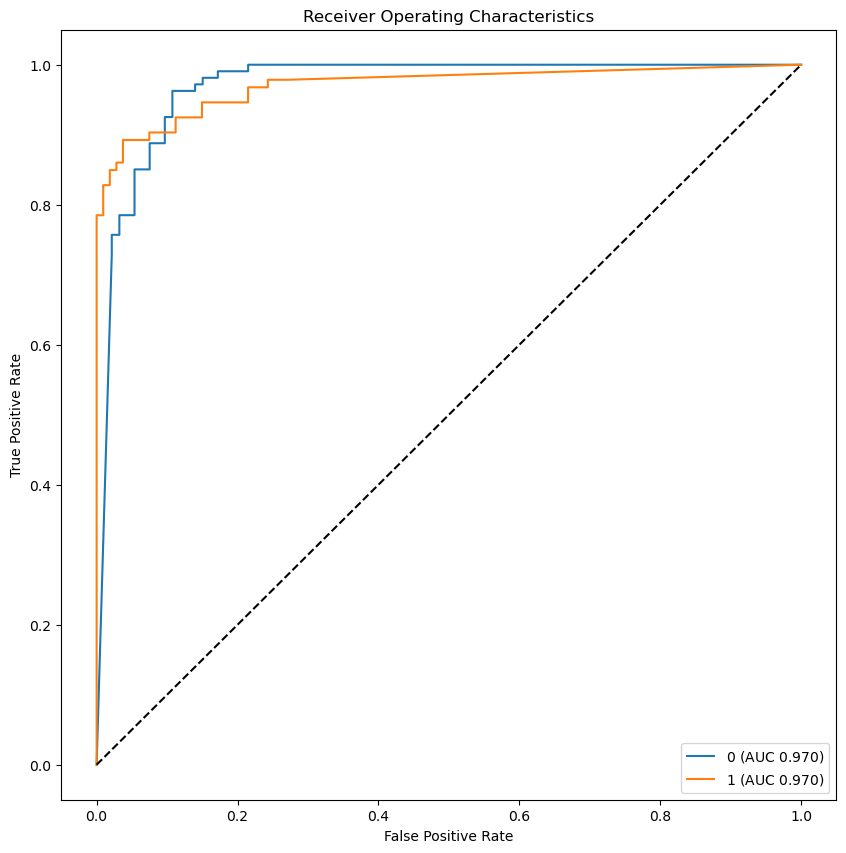

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


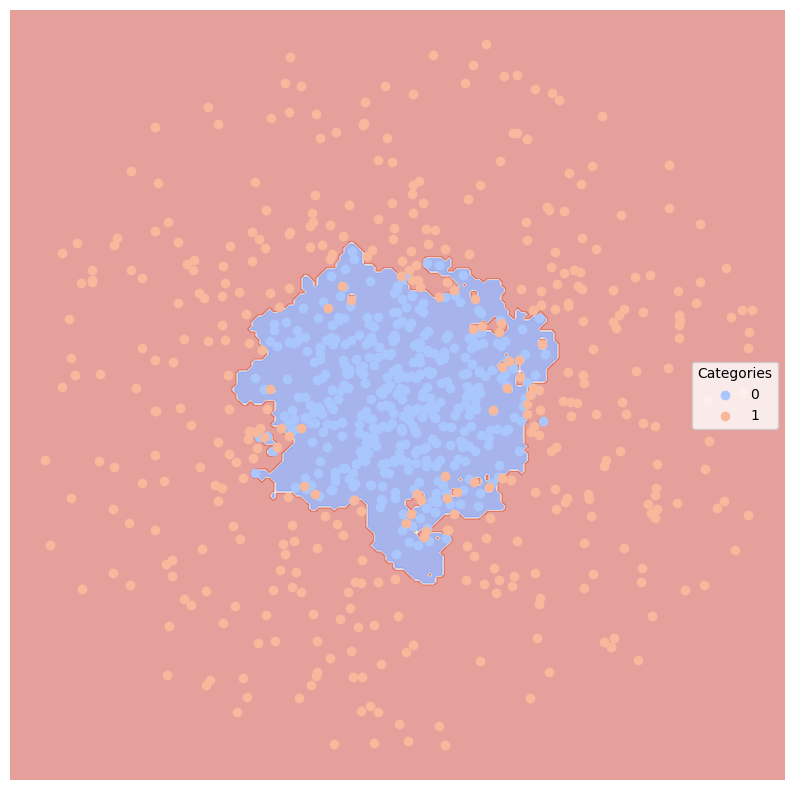

####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: LogisticRegression(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.665  0.351774   0.240000           0.501916  0.112150
1              0.665  0.351774   0.366667           0.406846  0.591398


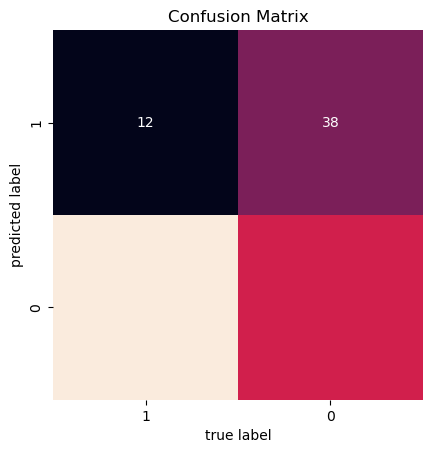

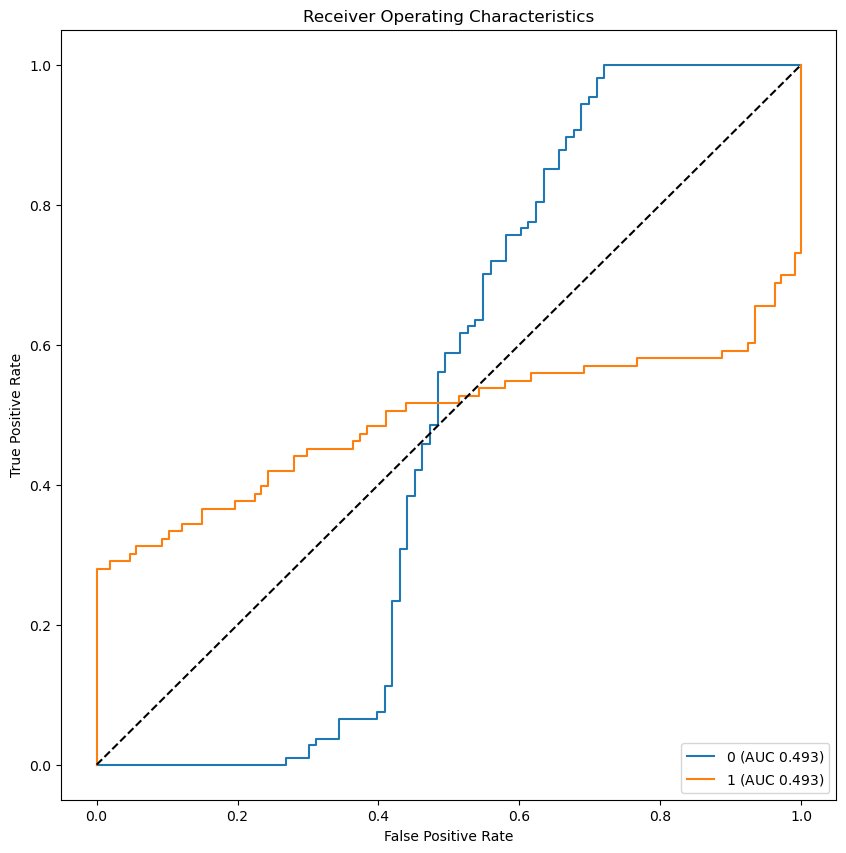

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


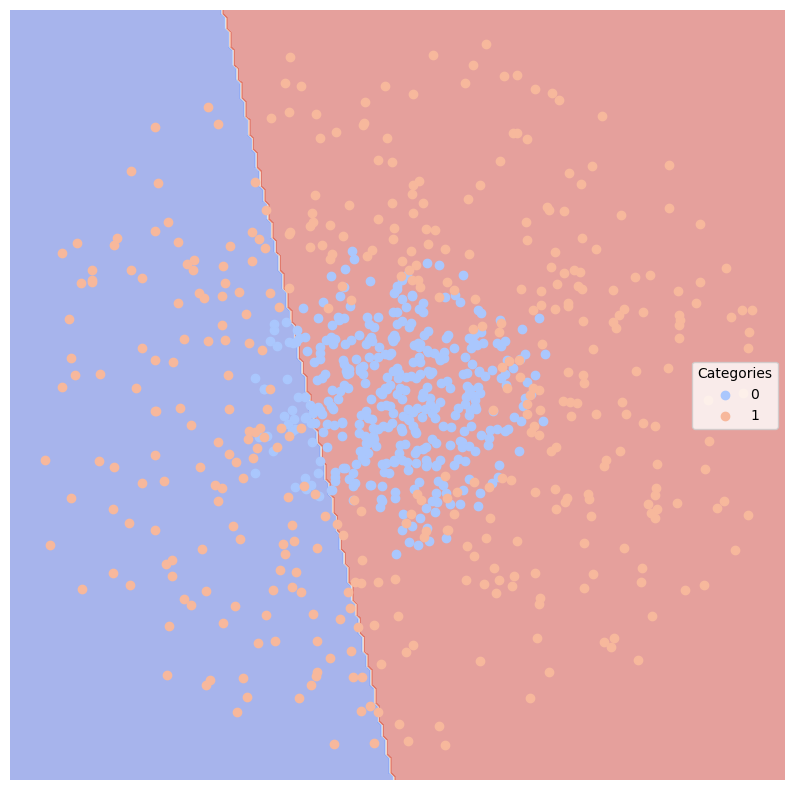

####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: DecisionTreeClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.095  0.904884   0.915094           0.879572  0.906542
1              0.095  0.904884   0.893617           0.852138  0.903226


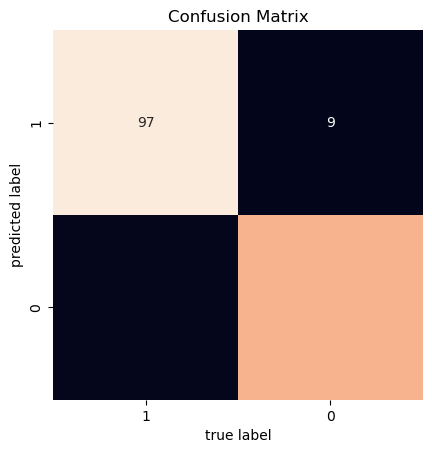

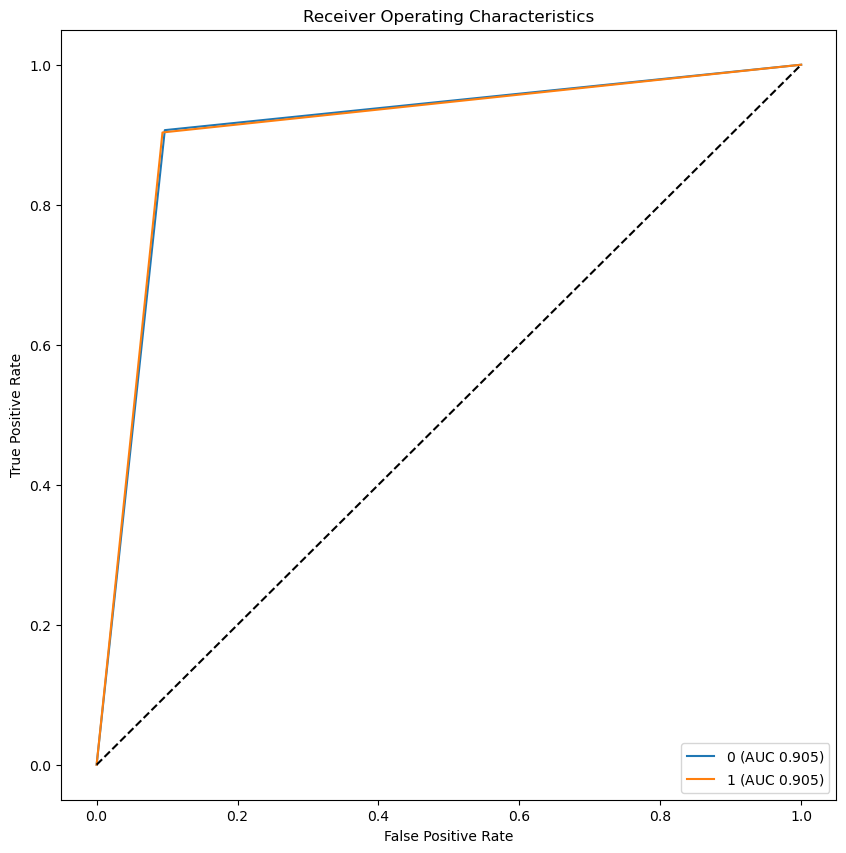

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


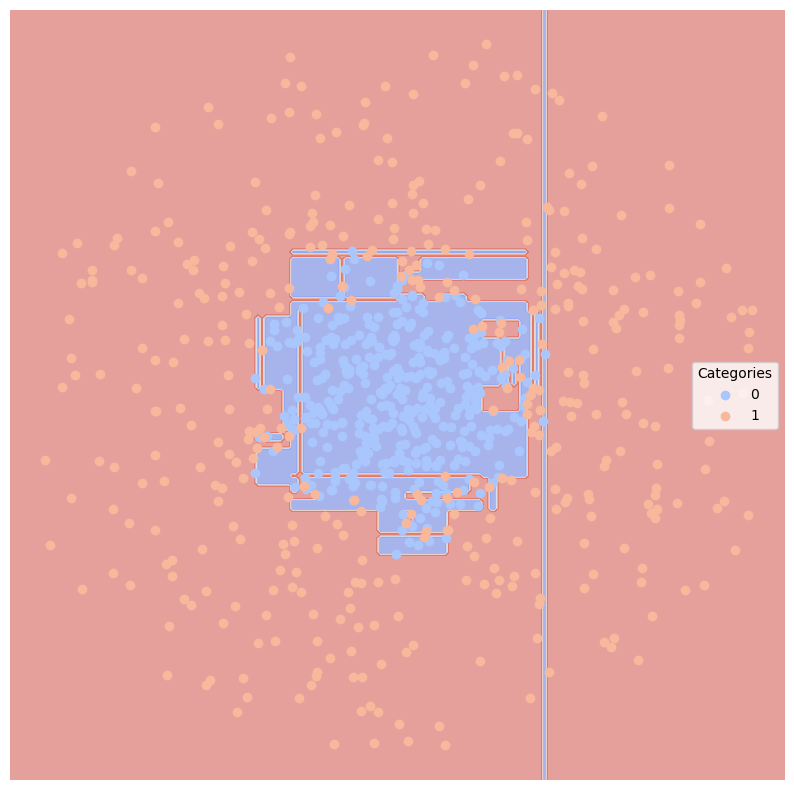

####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: RandomForestClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.075  0.924279   0.925926           0.900351  0.934579
1              0.075  0.924279   0.923913           0.884437  0.913978


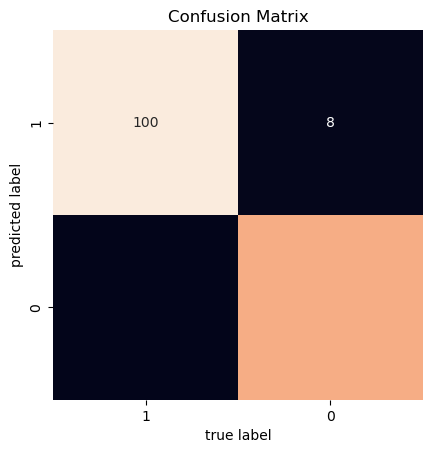

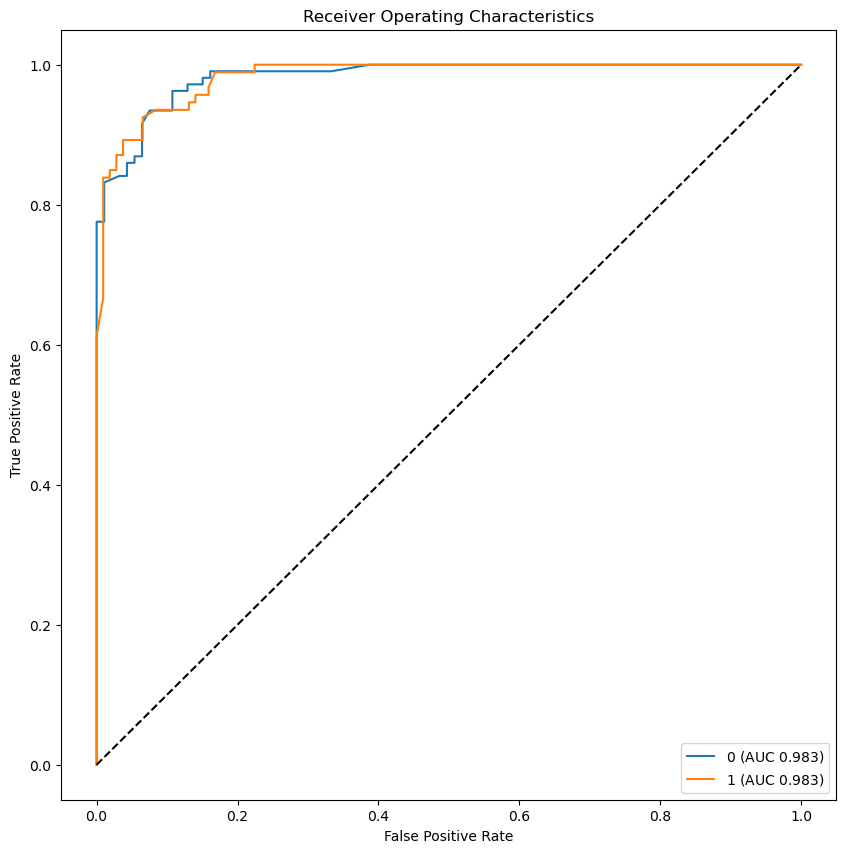

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


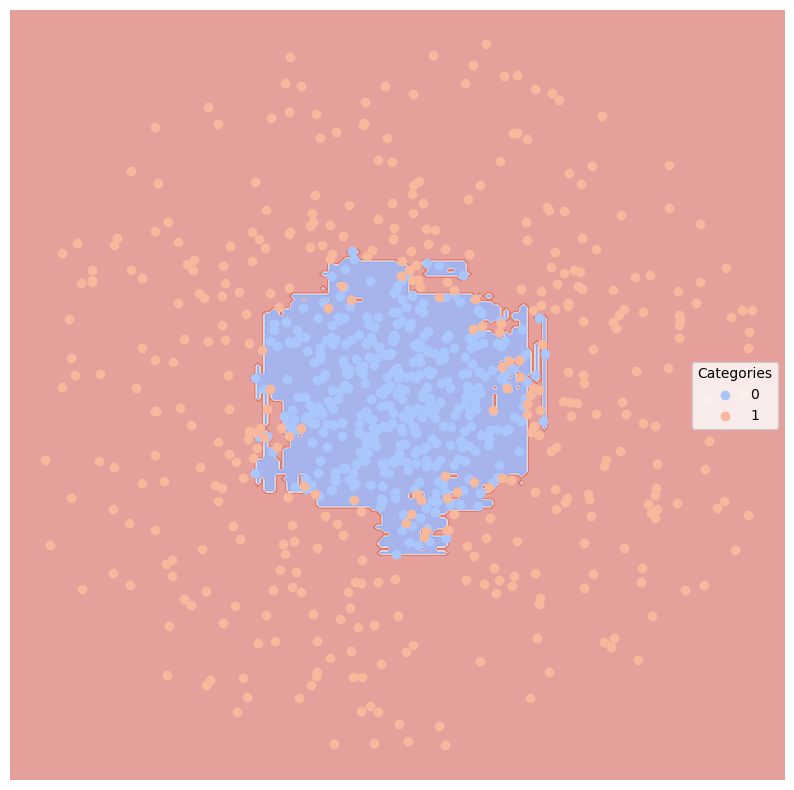

####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: MLPClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.05  0.947643   0.929204           0.921835  0.981308
1               0.05  0.947643   0.977011           0.932967  0.913978


c:\Users\Ethan\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


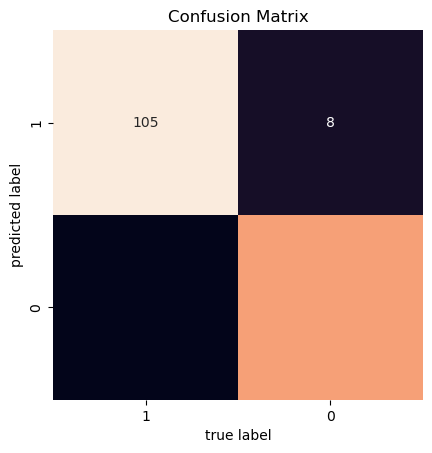

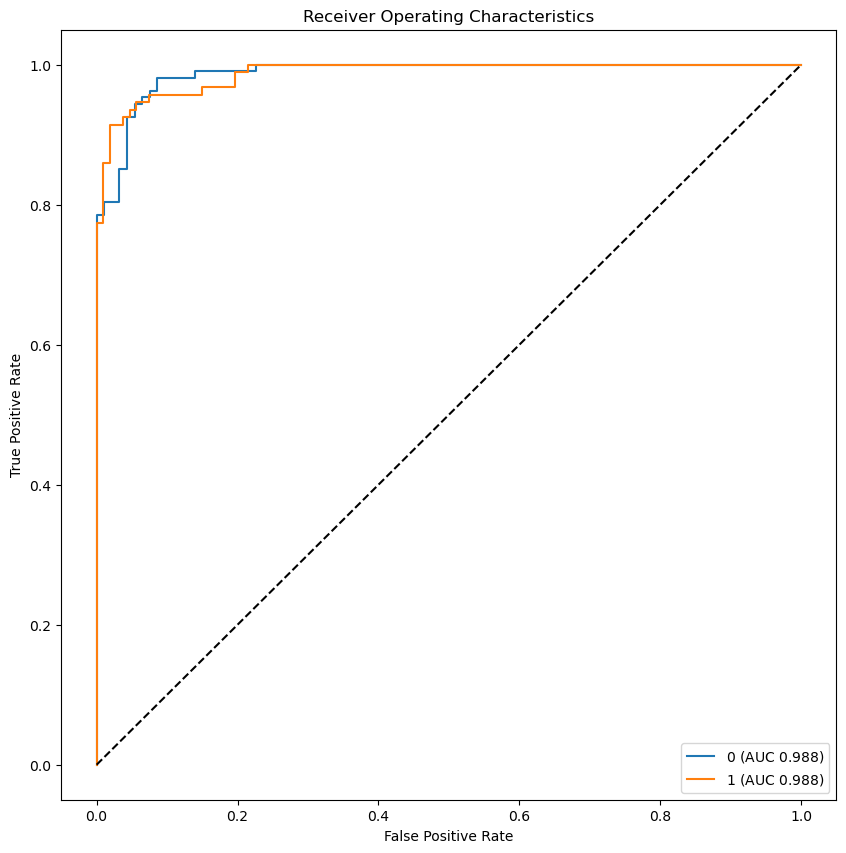

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


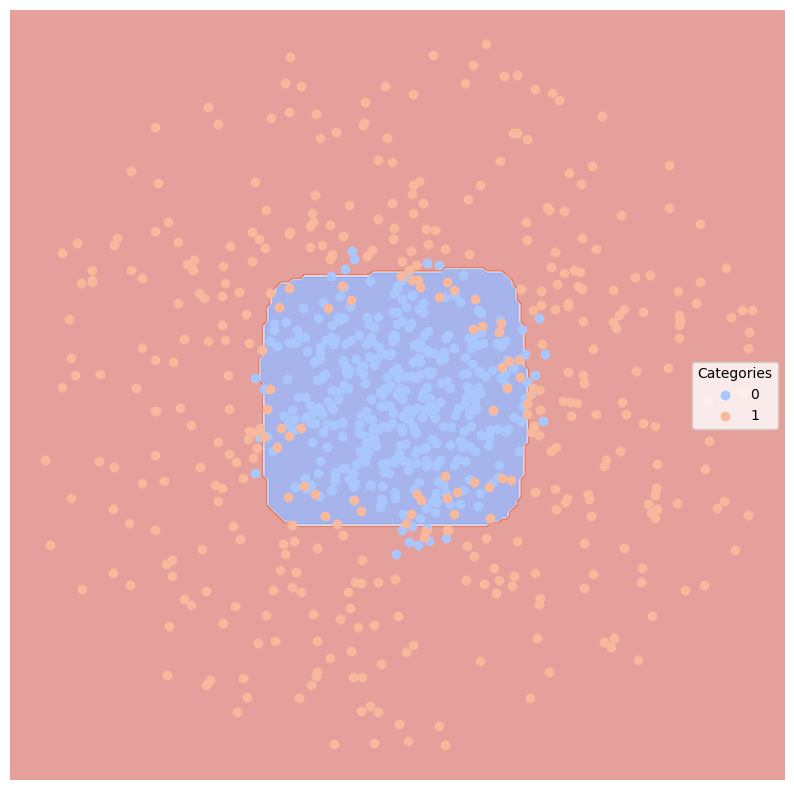

####################### Moving onto next Classifier #######################
#### Train/test split on targetSplit. Model: GradientBoostingClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.075  0.924279   0.925926           0.900351  0.934579
1              0.075  0.924279   0.923913           0.884437  0.913978


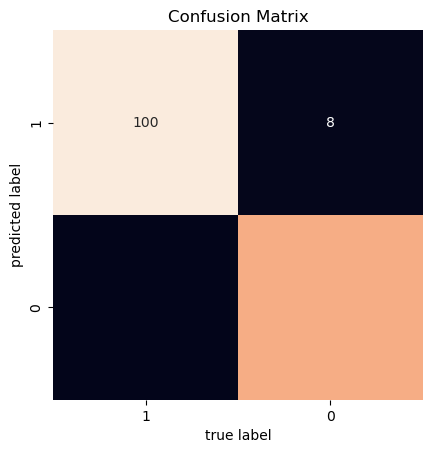

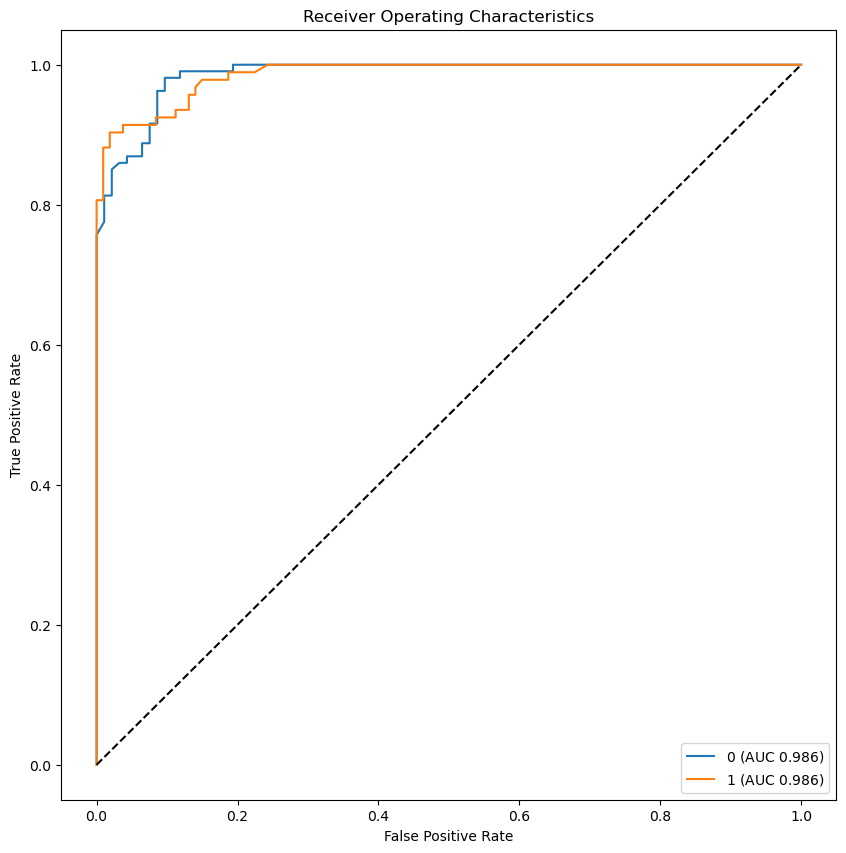

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


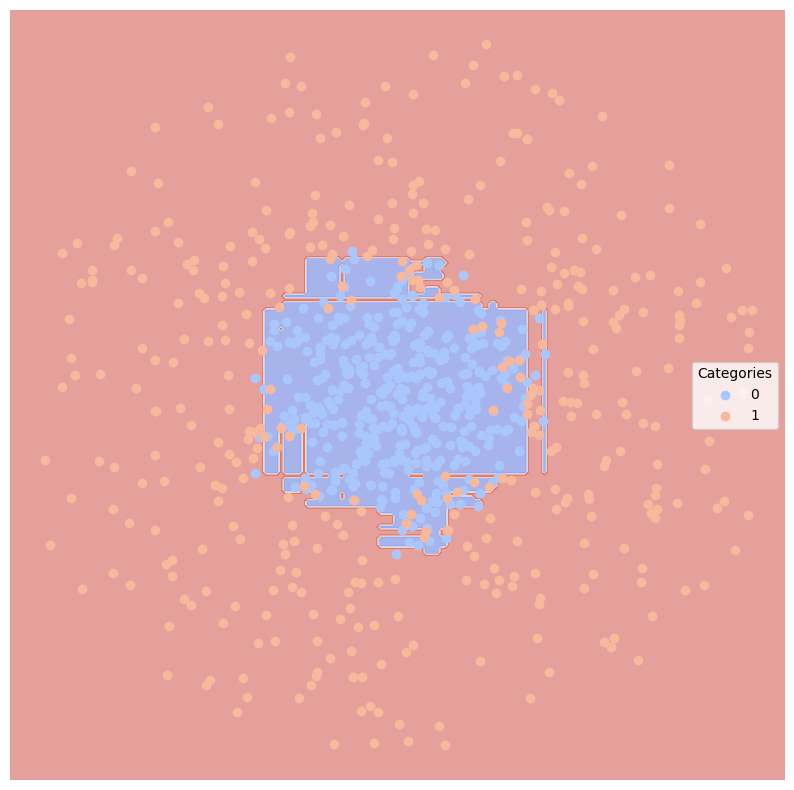

####################### Moving onto next Classifier #######################
####################### Moving to next Splitter #######################
##### MULTIBLOBS #####
#### Train/test split on multiBlobs. Model: GaussianNB() ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


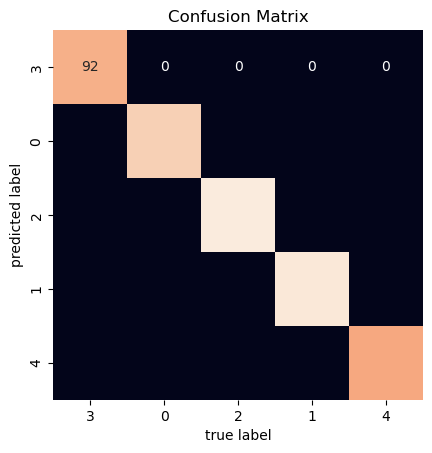

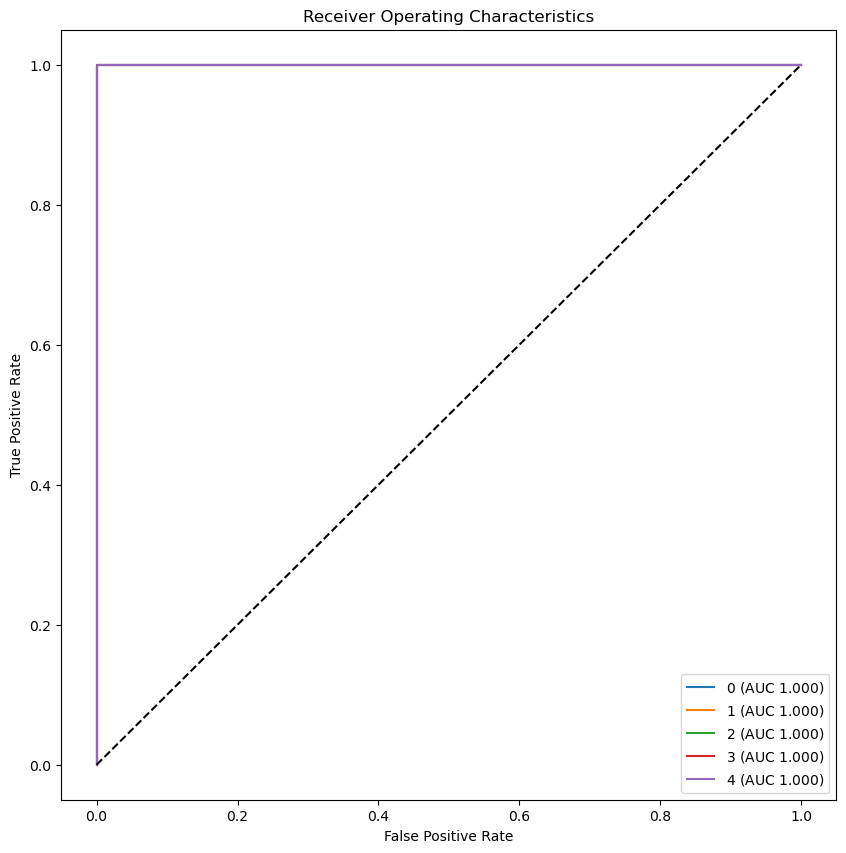

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


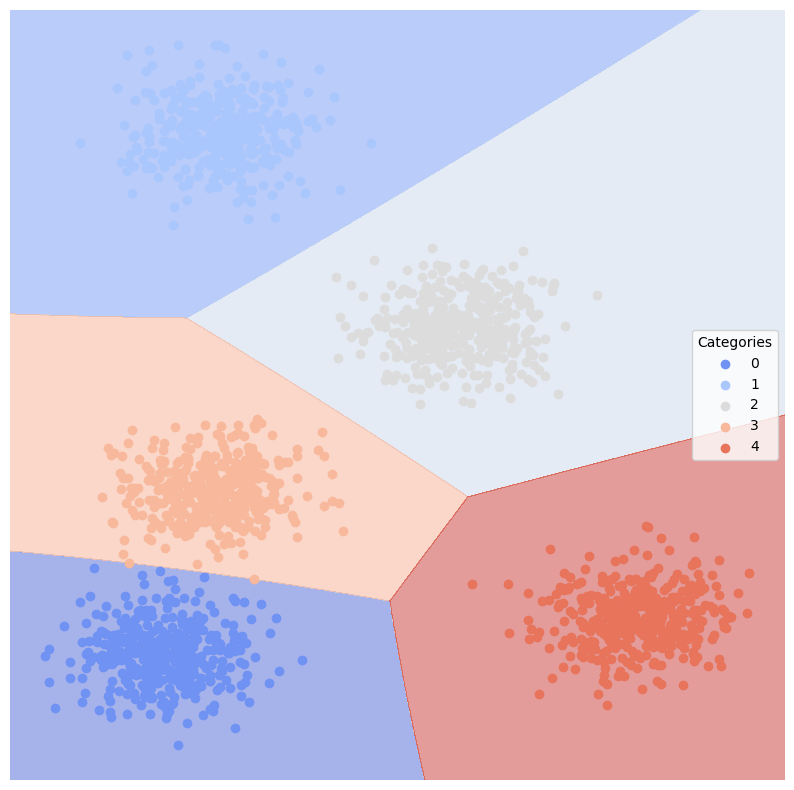

####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: SVC(kernel='linear', probability=True, random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


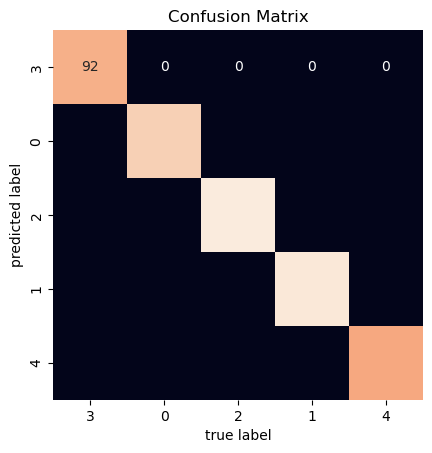

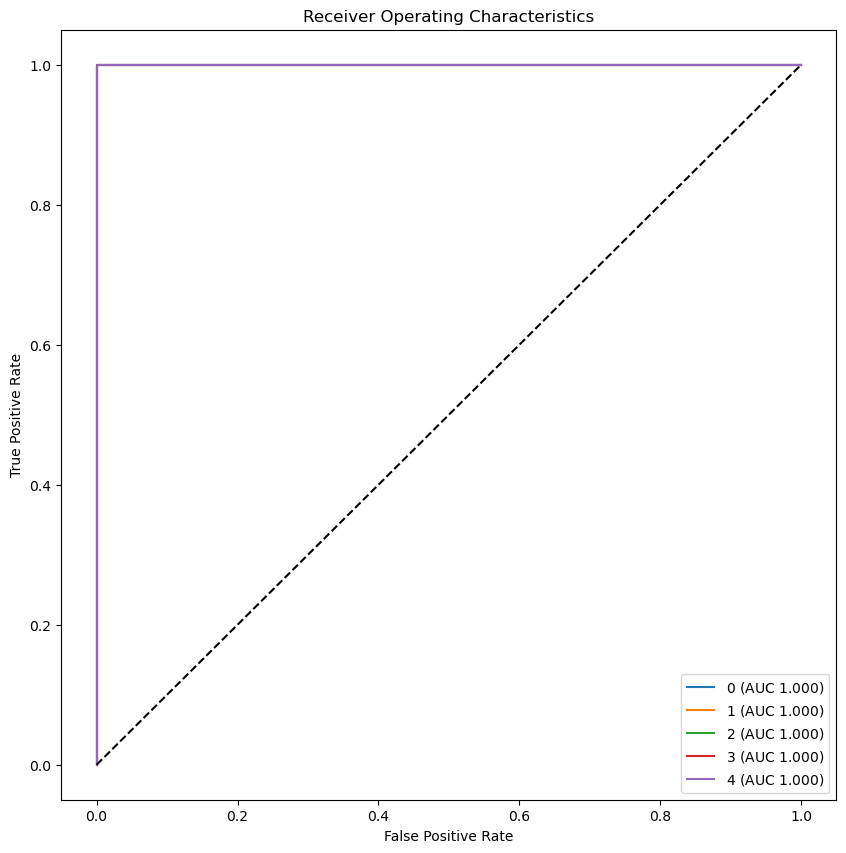

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


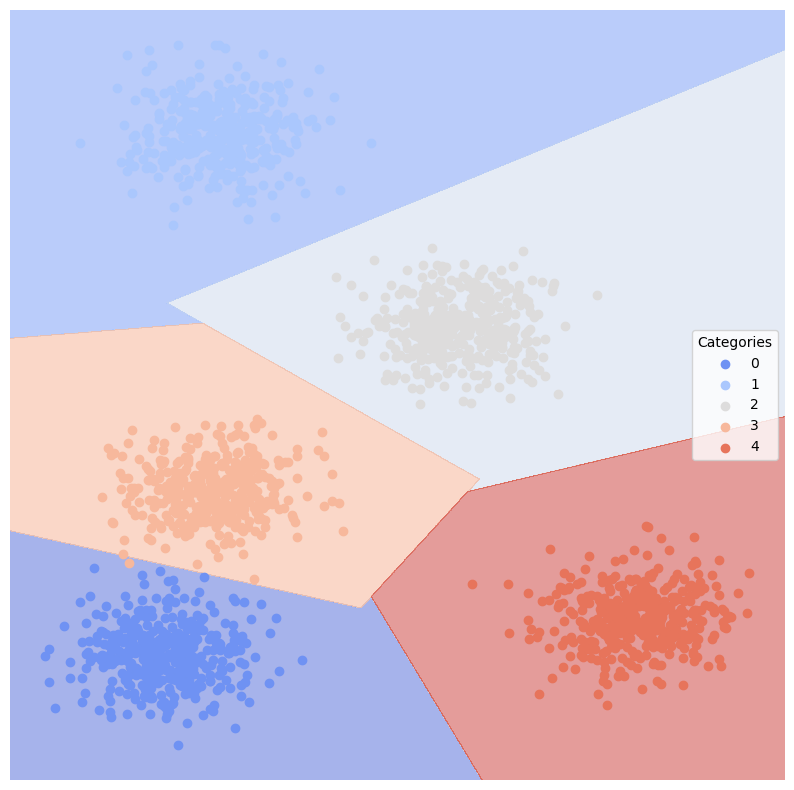

####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: SVC(kernel='poly', probability=True, random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.000  1.000000   1.000000           1.000000  1.000000
1              0.000  1.000000   1.000000           1.000000  1.000000
2              0.004  0.997442   0.981982           0.981982  1.000000
3              0.004  0.990741   1.000000           0.985481  0.981481
4              0.000  1.000000   1.000000           1.000000  1.000000


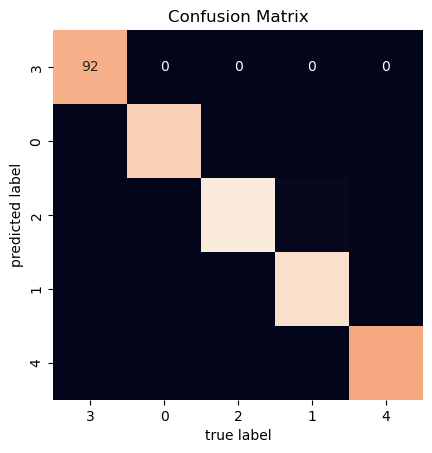

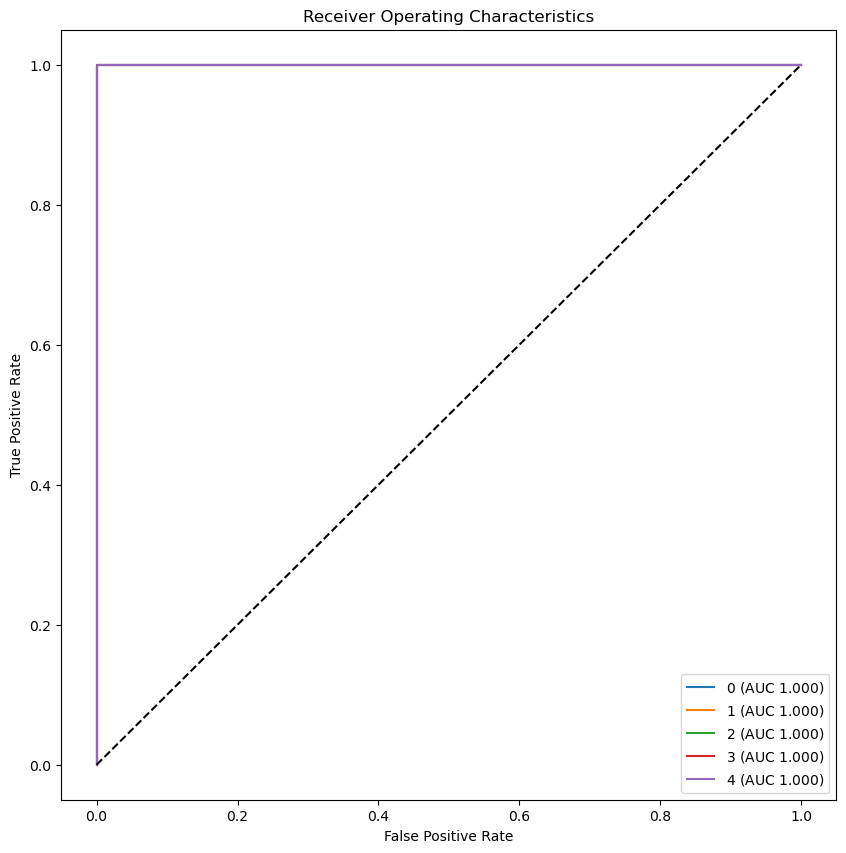

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


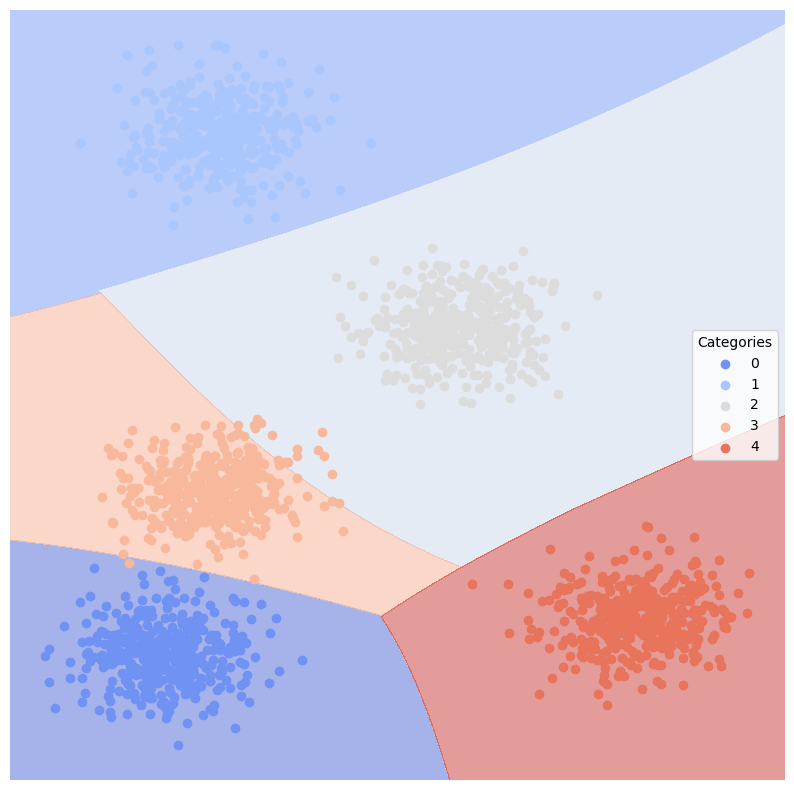

####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: KNeighborsClassifier(weights='distance') ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


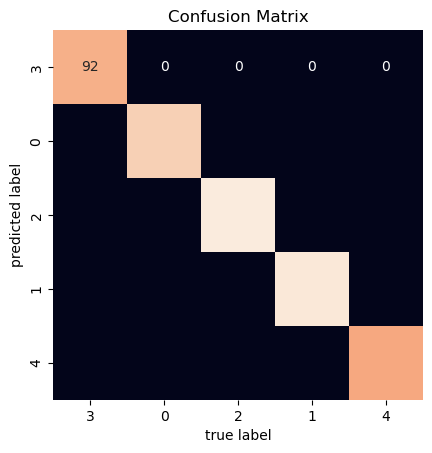

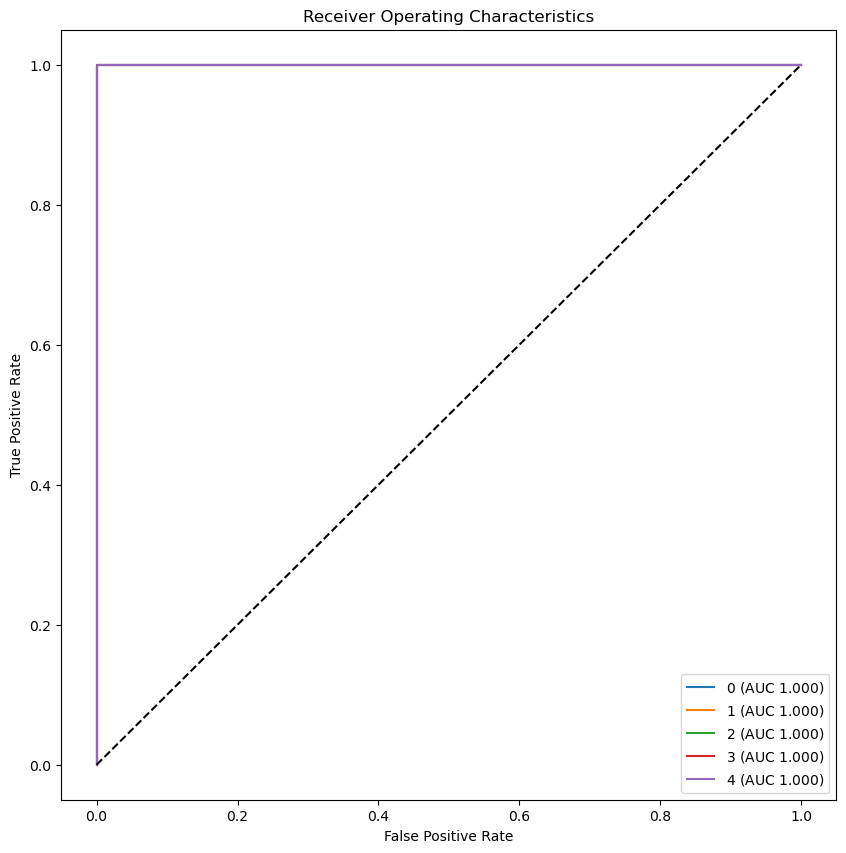

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


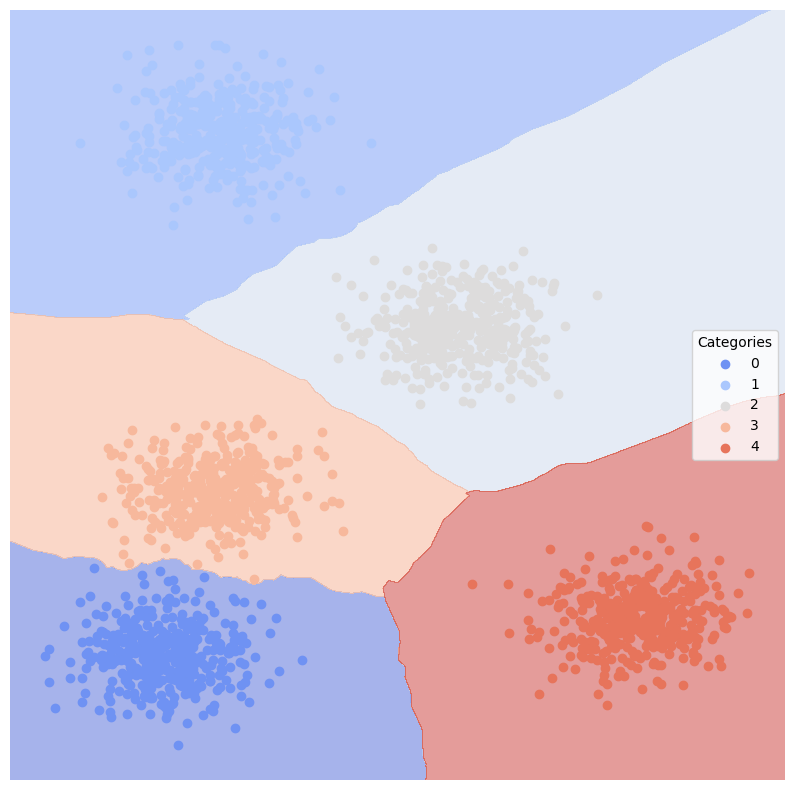

c:\Users\Ethan\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: LogisticRegression(random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


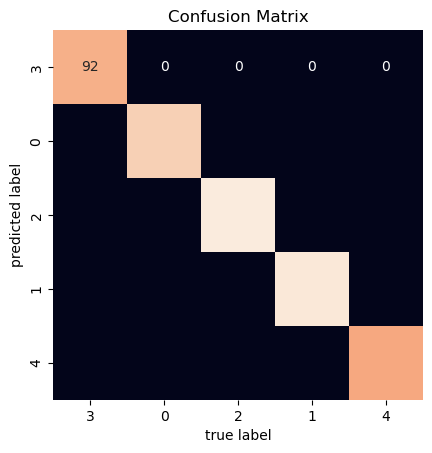

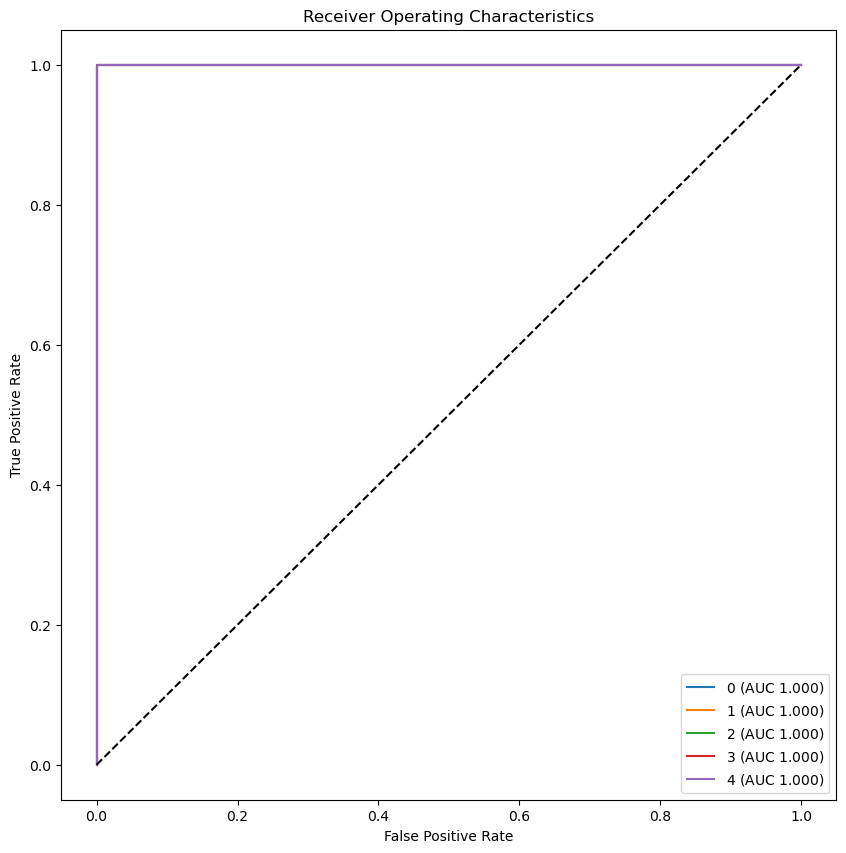

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


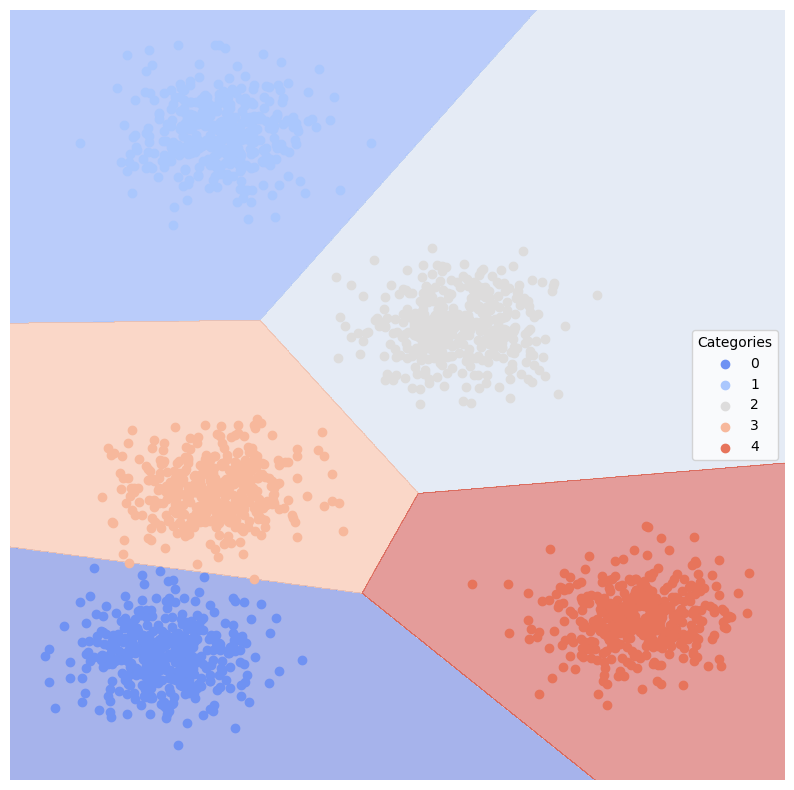

####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: DecisionTreeClassifier(random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


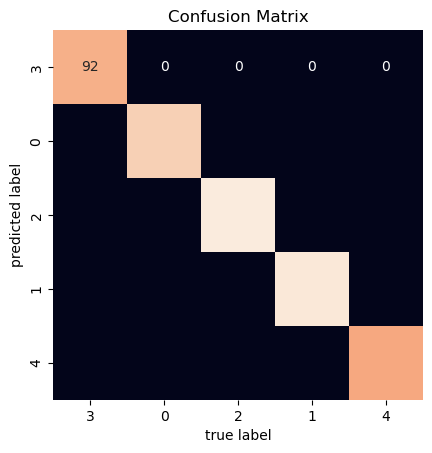

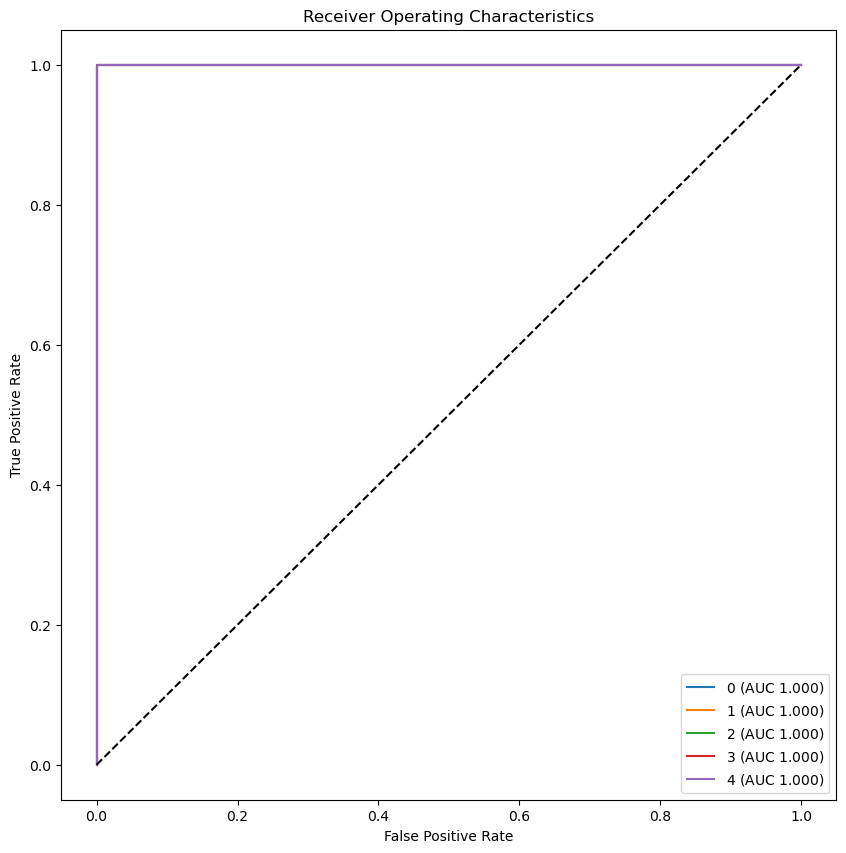

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


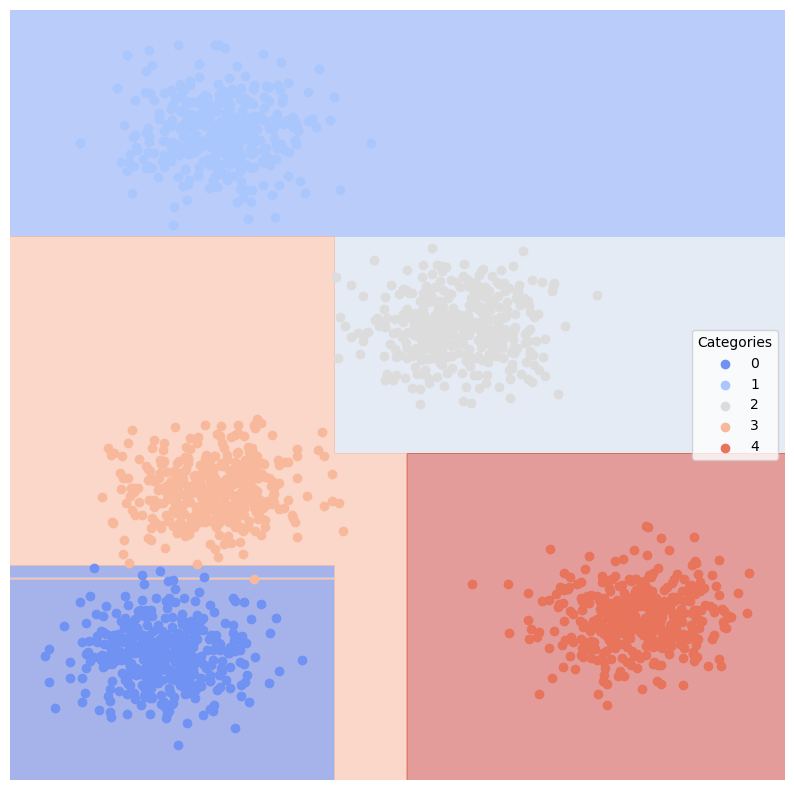

####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: RandomForestClassifier(random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


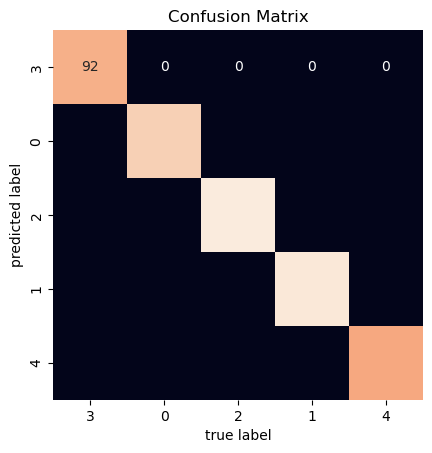

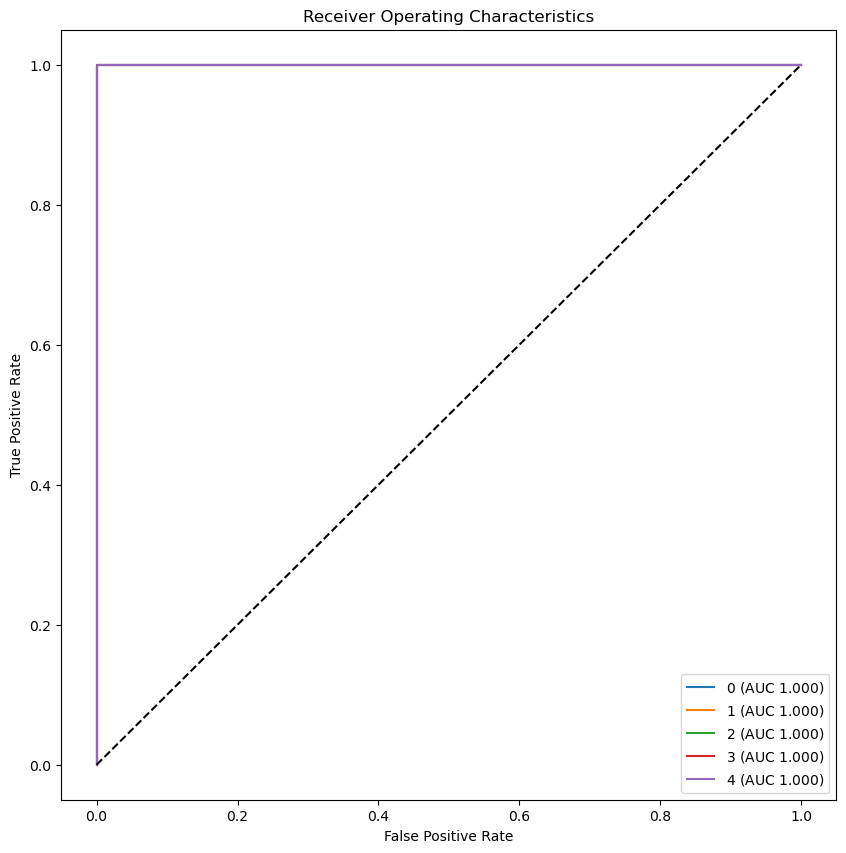

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


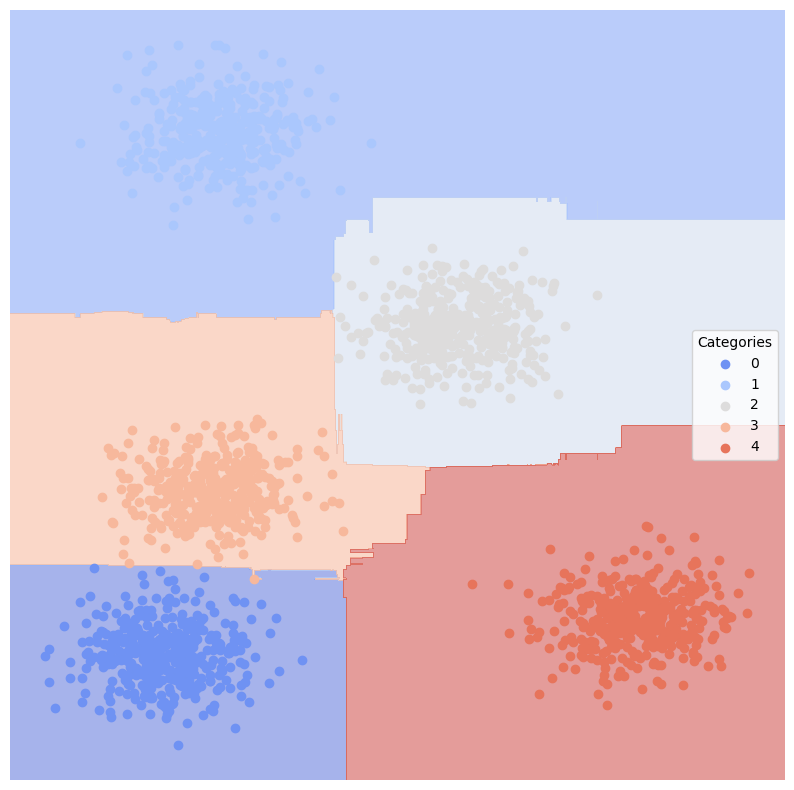

####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: MLPClassifier(random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


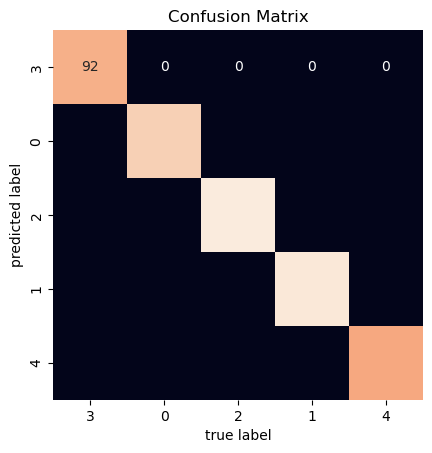

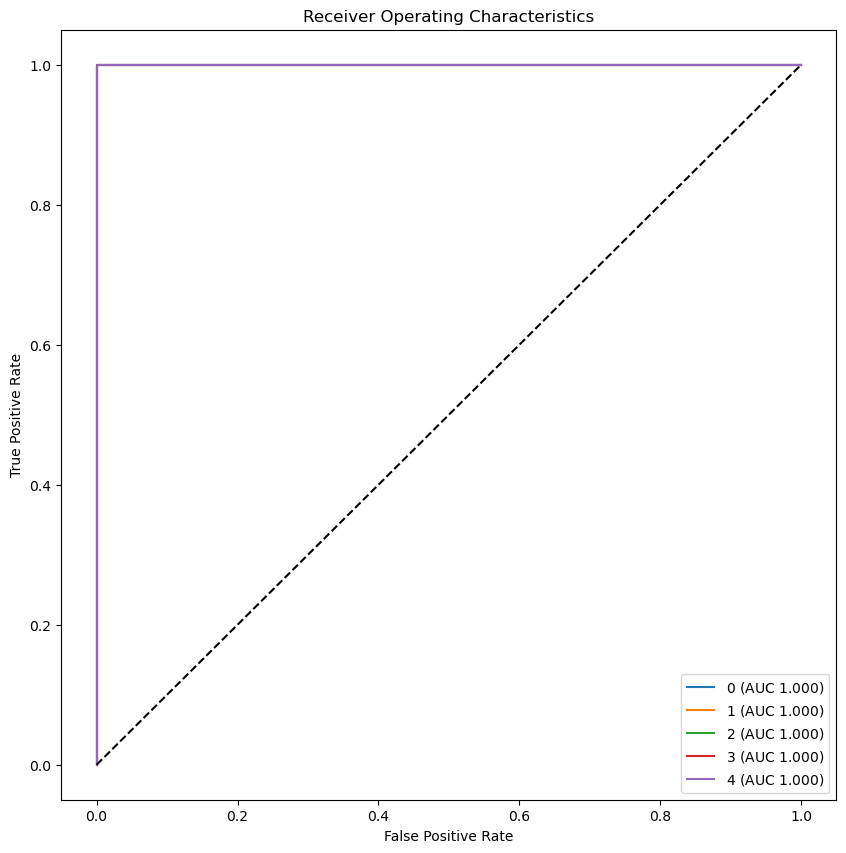

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


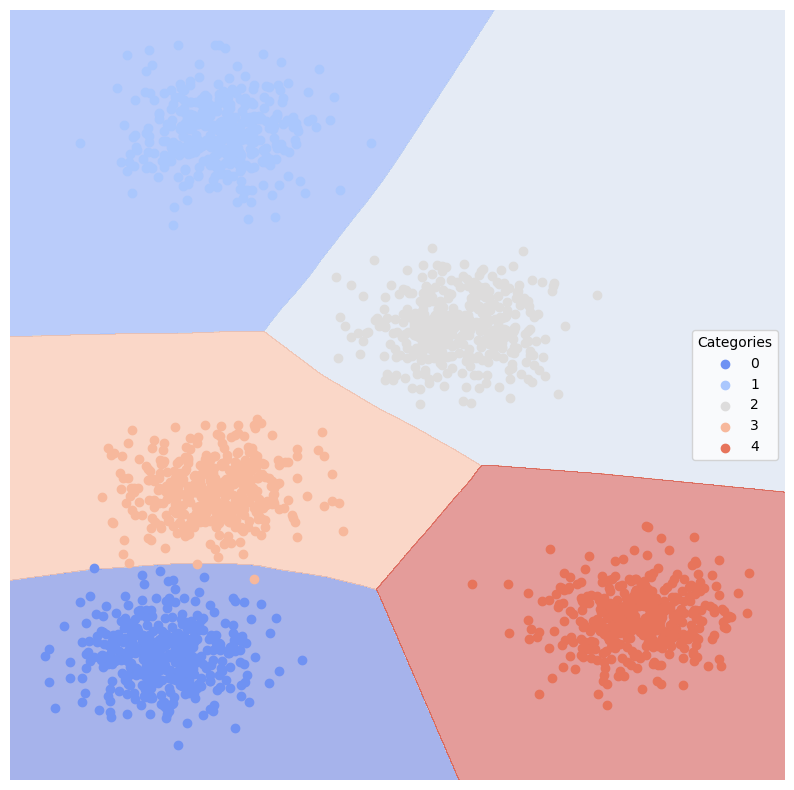

####################### Moving onto next Classifier #######################
#### Train/test split on multiBlobs. Model: GradientBoostingClassifier(random_state=42) ####
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


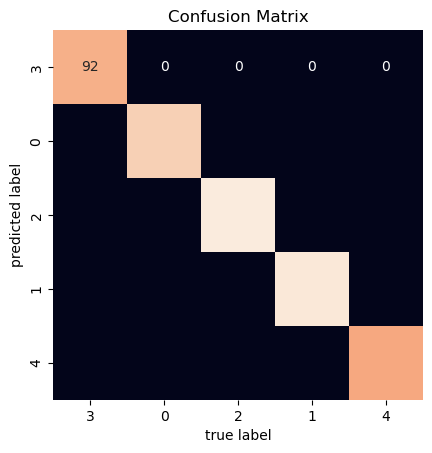

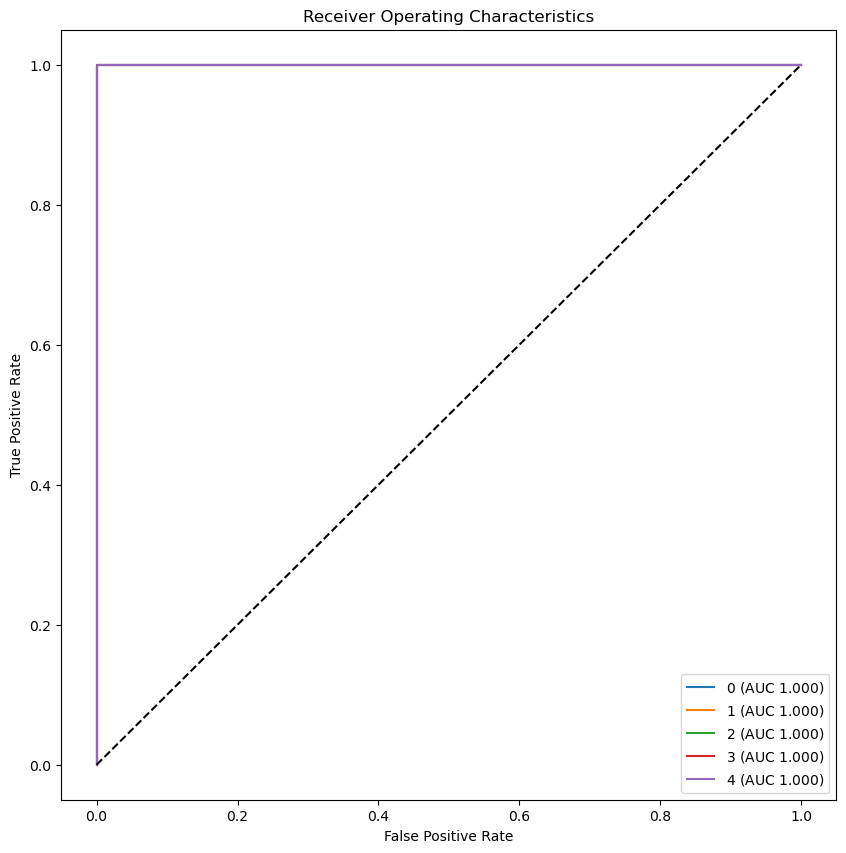

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


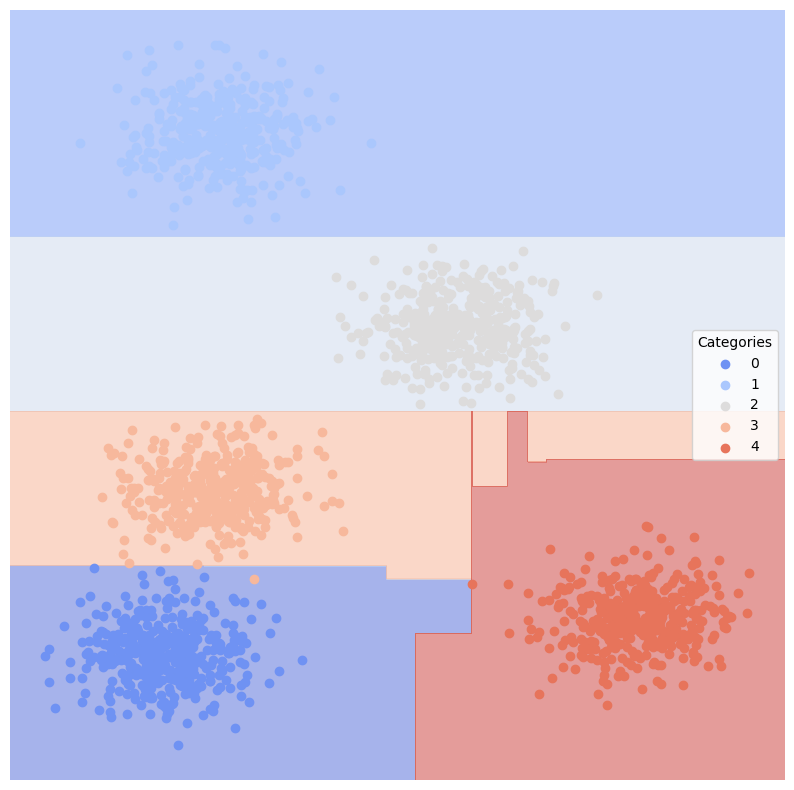

####################### Moving onto next Classifier #######################
####################### Moving to next Splitter #######################


In [54]:
clfs = [sklearn.naive_bayes.GaussianNB(), # Using Naive bayes
        sklearn.svm.SVC(kernel = 'linear', probability = True, random_state=42), # Using SVC linear
        sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True, random_state=42), # Using SVC poly3
        sklearn.neighbors.KNeighborsClassifier(5, weights='distance'), # Using KNN
        sklearn.linear_model.LogisticRegression(random_state=42), # log reg
        sklearn.tree.DecisionTreeClassifier(random_state=42), # DT
        sklearn.ensemble.RandomForestClassifier(random_state=42), # RF
        sklearn.neural_network.MLPClassifier(random_state=42), # Neural networks
        sklearn.ensemble.GradientBoostingClassifier(random_state=42) # Gradient Boosting
        ]

splitters = ["random", "andSplit", "xorSplit", "targetSplit", "multiBlobs"]

# loop over splitters to find and evaluate for each model in clfs
for s in splitters:
    print(f"##### {s.upper()} #####")
    test_models(s, clfs)
    print("####################### Moving to next Splitter #######################")

#### Artifical Data ####

**For randomsplit:**
we find that the AUC for all the classifiers performs quite poorly. For Gaussian, svc linear, svc poly3, log reg, neural network, the models performed close to random guessing (the diagonal) For a DT classifier it was almost exactly a straight diagnonal. For KNN, RF, and gradient boosting, the random test train data split generally performed worse than random guessing. It makes sense that these classifiers all performed quite poorly. The data is thoroughly mixed with very little in terms of possible grouping. Therefore the models really ought to perform no better than random guessing.

**For andSplit random data:**
We see that Gaussian, linear svc, poly3 svc, KNN, log reg, RF, neural networks, and gradient boosting all perform quite quite well since there are a low amount of false positive and higher amount of true positives for both cases (0 and 1), the curve hugging the top left corner. Overall, the error rates are low (mostly less than 1%), while AUC, precision, and recall scores are around .9 for all of these models. Furthermore the DT classifier perform slightly less well as its curve is not as close to the top left corner (AUC is also lower but still very high at .89). For andSplit it appears the categories are distinct: 0 on the left, 1 on the right with some overlap in the middle. I suspect DTs are overfitting the data leading to poor performance. Which is why Random forests seem to be back to generally good performance. 

**For xorSplit random data:**
For Gaussian, the ROC curves for 0 and 1 labels look somewhat sinusoidal in reference across the diagonal. This model evidently performs poorly at different FP/TP rates. This pattern is generally true for  other models using xorSplit like linear svc and log reg They perform at the same level as or worse than random guessing. poly3 svc performs the better than previous models but still not great. KNN appears to operate the best: its ROC curve much more closely optimizes FP/TP ratesl; random Forests, neural networks and gradient boosting also do quite well. Similar to DTs for andSplit, DTs for xorSplit seem to perform about the same relatively, better than others but not the best. Because the xorSplit has two distinct parts which belong to group 0 and 1 in the middle it makes sense that KNN performs extremely well here.

**For targetSplit random data:**
Gaussian performs quite well. SVC linear is quite volatile like it was for xorSplit data. Same can be said for Poly3 svc and log reg. KNN, RF, and Neural networks performs very well here too. Like in the previous two, DTs performs very similarly across the samples thus far. They are not too bad but not as good as the best models. Gradient boosting does a fairly good job, better than DTs but worse than KNN, RF, and Neural networks. Again KNN and neural networks work very well in this case.

**For multiblobs random data:**
All models for multiblobs perform EXTREMELY well. This is due to the fact that the clusters are extremely distinct from one another (far apart and little overlap). All of the ROC curves look like right angles. 

### Empirical Data ###

In [9]:
# AttributeError: 'DataFrame' object has no attribute 'append'
spam = lucem_illud.loadSpam(dataDirectory='D:\\hw\\content-analysis-hw\\data\\')

Loading Spam
Loading Ham


AttributeError: 'DataFrame' object has no attribute 'append'

In [56]:
reddit2 = lucem_illud.loadReddit(dataDirectory='D:\\hw\\content-analysis-hw\\data\\')

Loading Reddit data
Converting to vectors


c:\Users\Ethan\anaconda3\Lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


In [57]:
# AttributeError: 'DataFrame' object has no attribute 'append'
# news = lucem_illud.loadNewsGroups()

In [58]:
# AttributeError: 'DataFrame' object has no attribute 'append'
# senate_large = lucem_illud.loadSenateLarge(dataDirectory='D:\\hw\\content-analysis-hw\\data\\')

In [59]:
senate_small = lucem_illud.loadSenateSmall()

Loading senate data
Converting to vectors


c:\Users\Ethan\anaconda3\Lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


I simply CANNOT get this to load news, senate_large, or spam data sets. I have no idea what is going wrong at all with them. I have tried looking up solutions for at LEAST 4 hours, without being any closer to a solution than before, I have thus decided to just run my analysis on the models that actually work.

In [60]:
emp_data = {"reddit" : reddit2,
            "senate_small" : senate_small}
            #"news": news,
            #"senate_large" : senate_large,
            #"spam" : spam}

In [61]:
def test_models_emp(data, classifiers):
    """
    Fit each of 9 models on a set of data
    Inputs:
        data (tuple): containing the name of the data set and the data set itself
        classifiers (list of classifier objects): model classifier
    Returns None, prints evaluation plots for each of classifier models
    """
    name, dataset = data
    dfTrain, dfTest = sklearn.model_selection.train_test_split(dataset, test_size=.2)
    
    for clf in classifiers:
        print(f"#### Train/test split on {name}. Model: {clf} ####")
        get_model(clf, dfTrain, dfTest)
        print("####################### Moving onto next Classifier #######################")


#### Train/test split on reddit. Model: GaussianNB() ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.059375  0.888589   0.952381           0.801880   
Relationships              0.156250  0.727273   0.780000           0.511875   
Bad Roommates              0.137500  0.807103   0.763158           0.608192   
Weeaboo Tales              0.171875  0.872464   0.603053           0.590366   

                           Recall  
Category                           
Tales From Tech Support  0.789474  
Relationships            0.500000  
Bad Roommates            0.690476  
Weeaboo Tales            0.963415  


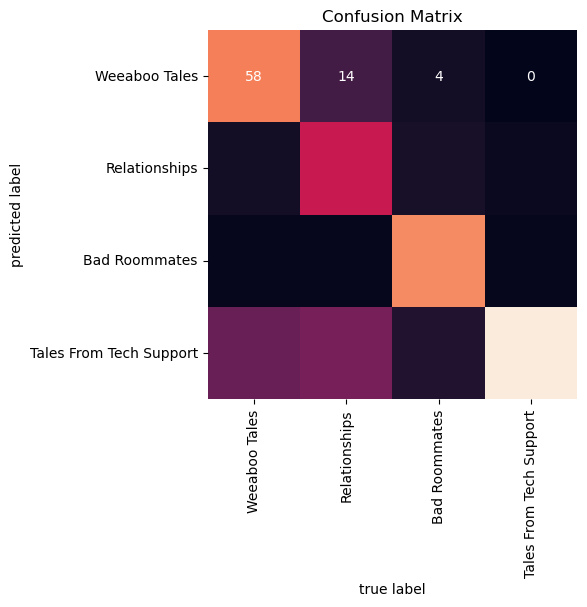

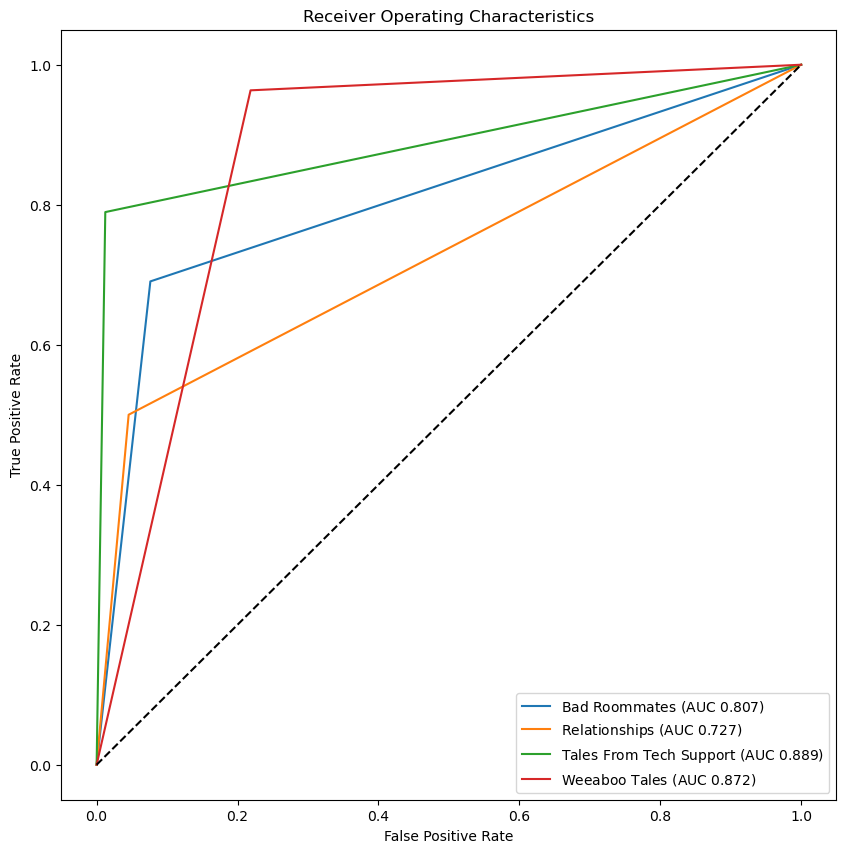

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


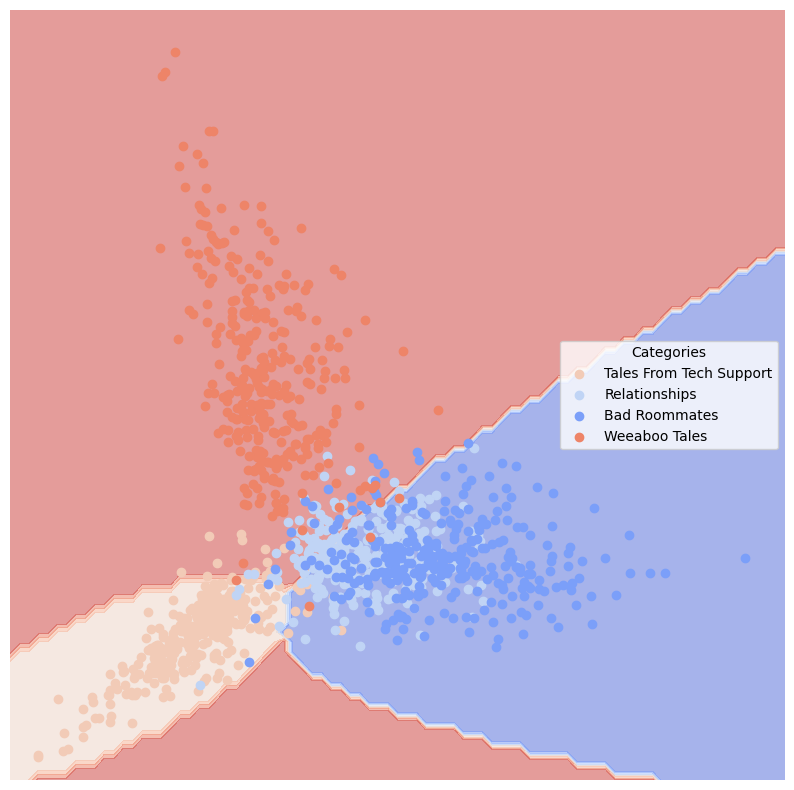

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: SVC(kernel='linear', probability=True, random_state=42) ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.003125  0.997951   0.987013           0.987013   
Relationships              0.009375  0.989458   0.974684           0.965313   
Bad Roommates              0.009375  0.985977   0.987952           0.970679   
Weeaboo Tales              0.003125  0.993902   1.000000           0.990930   

                           Recall  
Category                           
Tales From Tech Support  1.000000  
Relationships            0.987179  
Bad Roommates            0.976190  
Weeaboo Tales            0.987805  


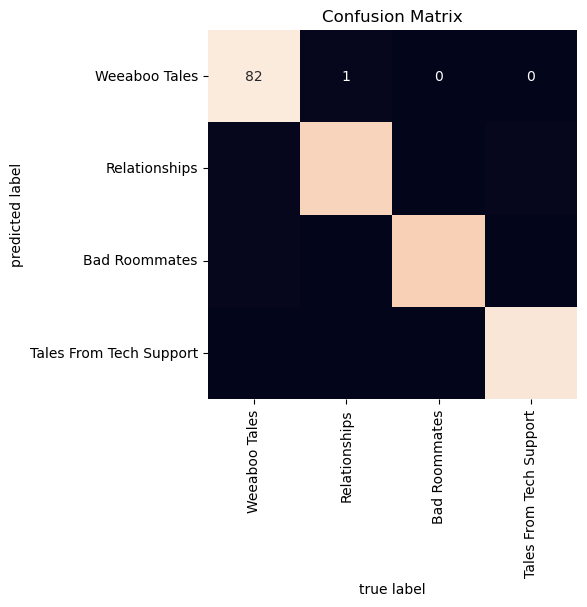

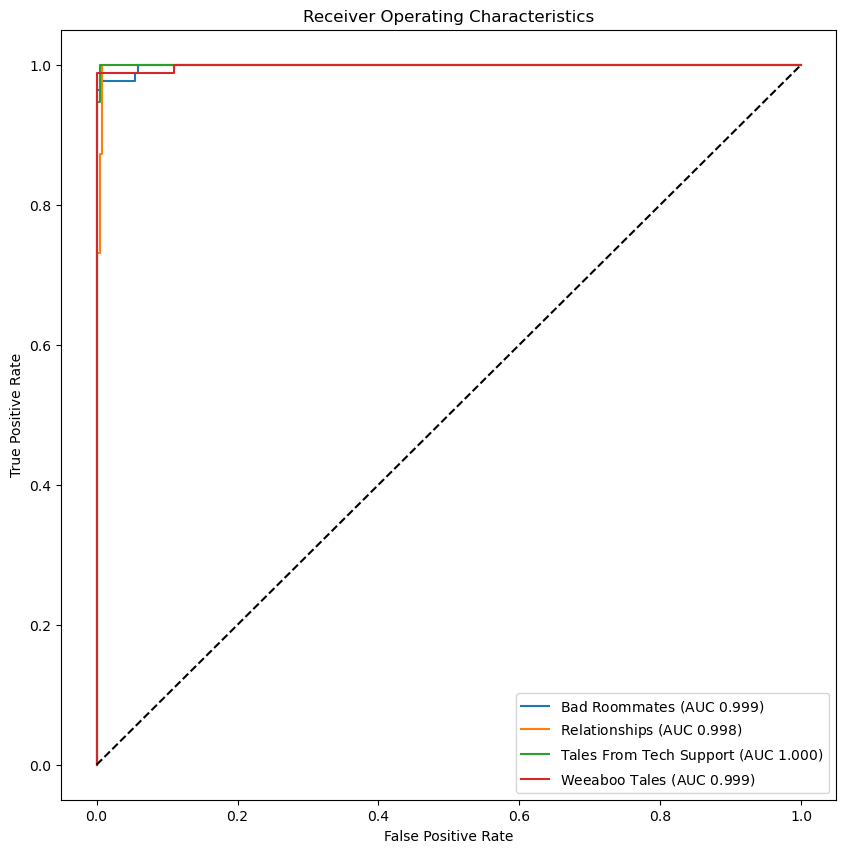

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


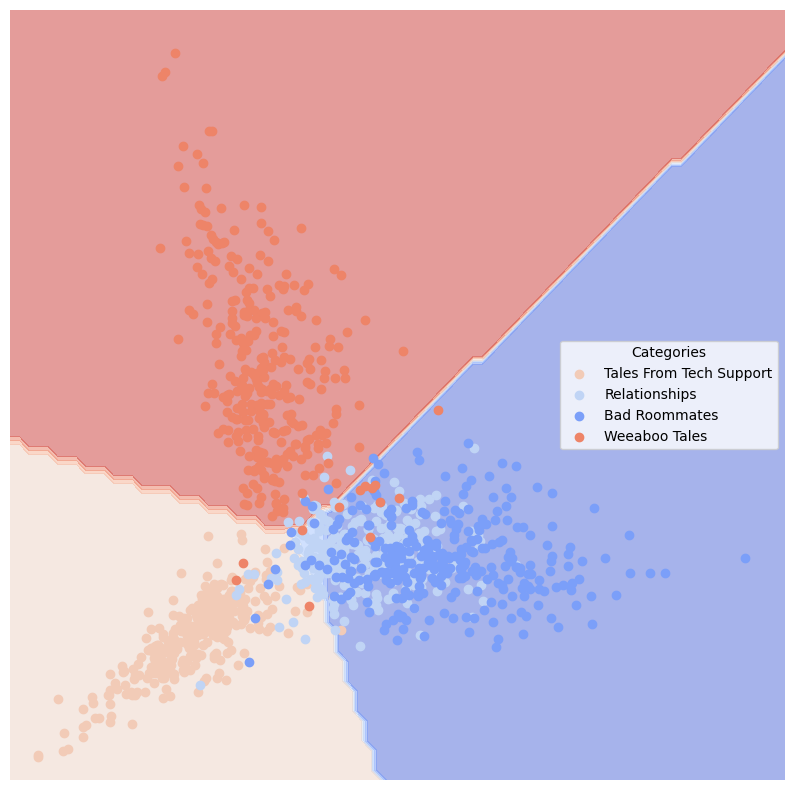

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: SVC(kernel='poly', probability=True, random_state=42) ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.059375  0.947476   0.820225           0.797222   
Relationships              0.059375  0.947711   0.824176           0.801852   
Bad Roommates              0.059375  0.890738   0.985075           0.830237   
Weeaboo Tales              0.034375  0.936924   0.986301           0.897271   

                           Recall  
Category                           
Tales From Tech Support  0.960526  
Relationships            0.961538  
Bad Roommates            0.785714  
Weeaboo Tales            0.878049  


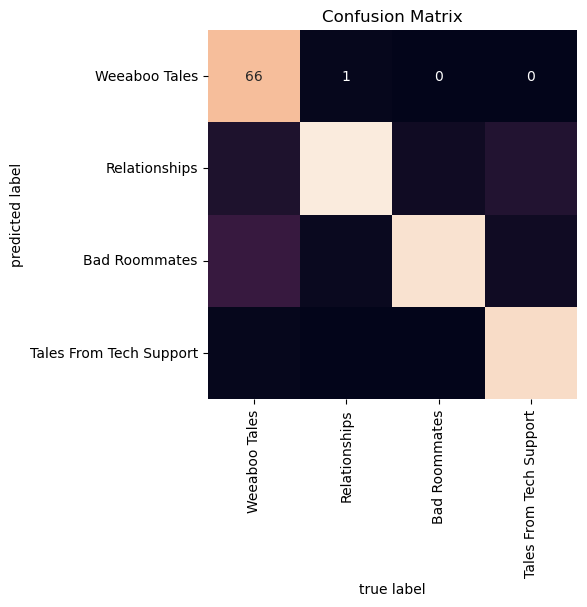

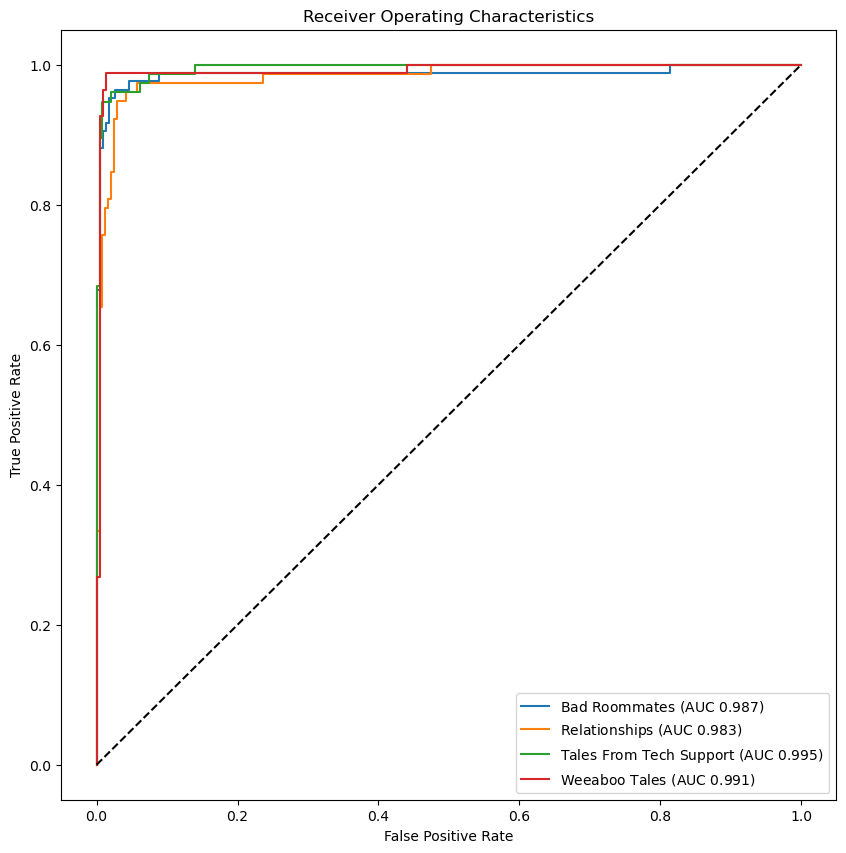

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


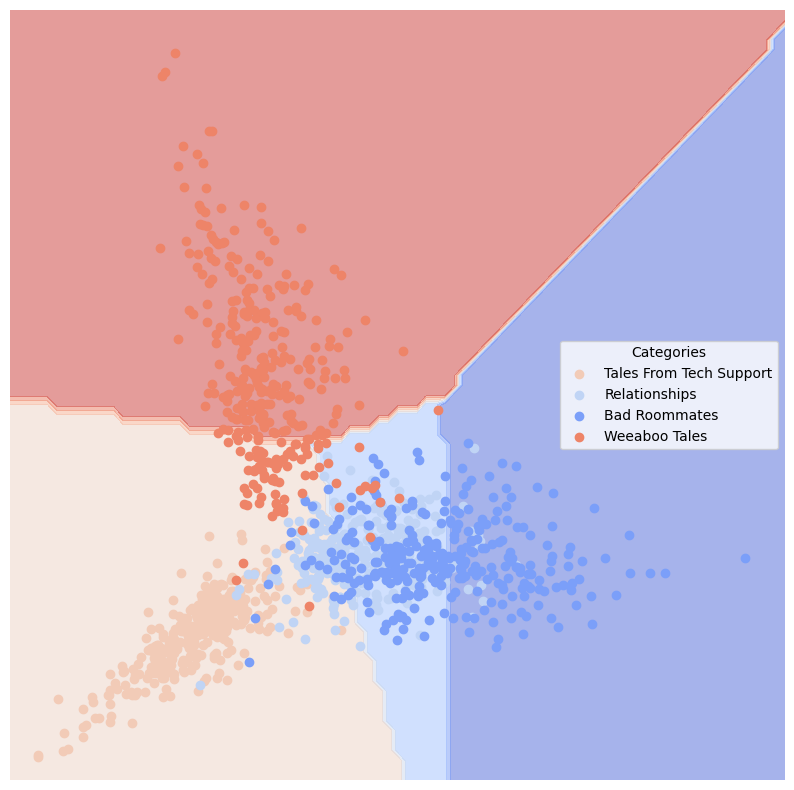

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: KNeighborsClassifier(weights='distance') ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.046875  0.923965   0.929577           0.838515   
Relationships              0.062500  0.897860   0.914286           0.793933   
Bad Roommates              0.059375  0.917575   0.901235           0.817591   
Weeaboo Tales              0.093750  0.908998   0.765306           0.721850   

                           Recall  
Category                           
Tales From Tech Support  0.868421  
Relationships            0.820513  
Bad Roommates            0.869048  
Weeaboo Tales            0.914634  


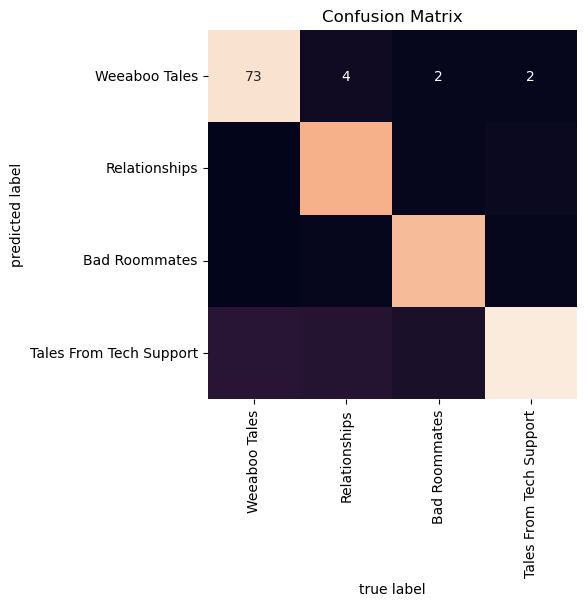

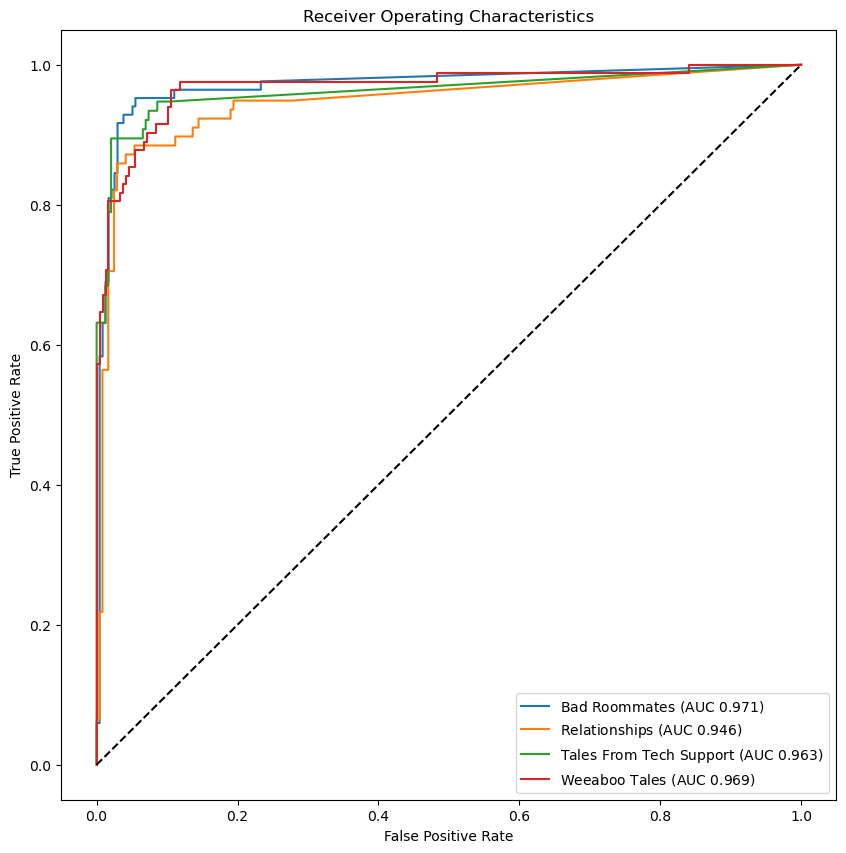

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


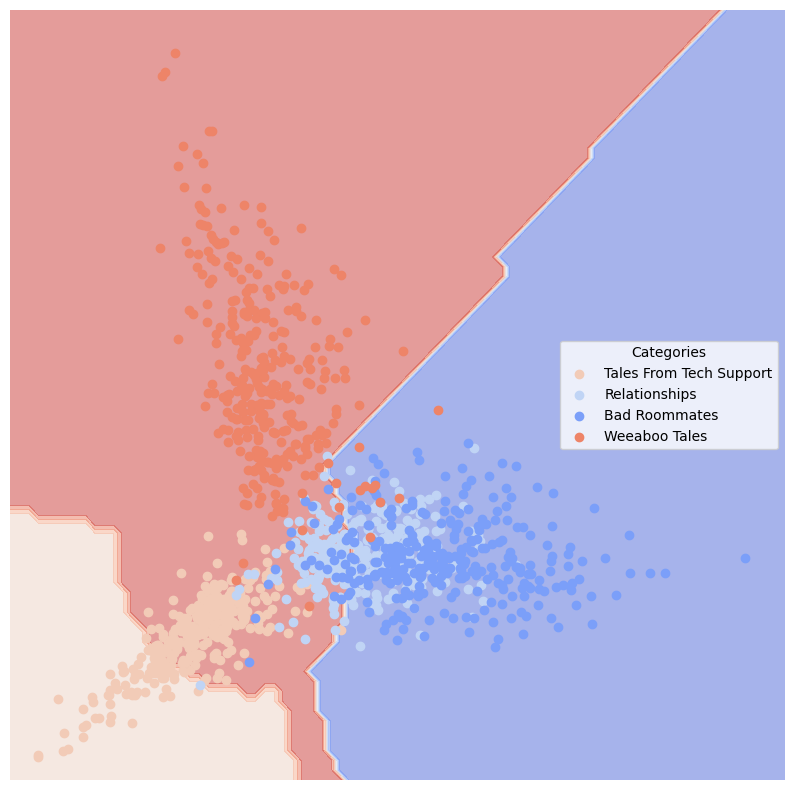

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: LogisticRegression(random_state=42) ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.003125  0.997951   0.987013           0.987013   
Relationships              0.009375  0.993802   0.962963           0.962963   
Bad Roommates              0.012500  0.980024   0.987805           0.961901   
Weeaboo Tales              0.006250  0.987805   1.000000           0.981860   

                           Recall  
Category                           
Tales From Tech Support  1.000000  
Relationships            1.000000  
Bad Roommates            0.964286  
Weeaboo Tales            0.975610  


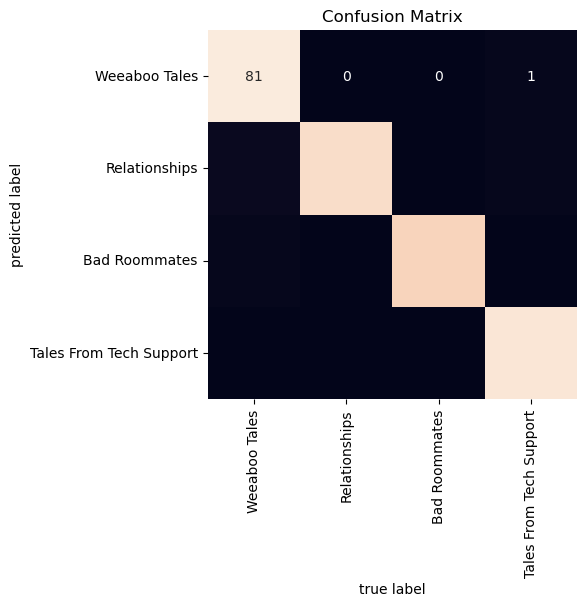

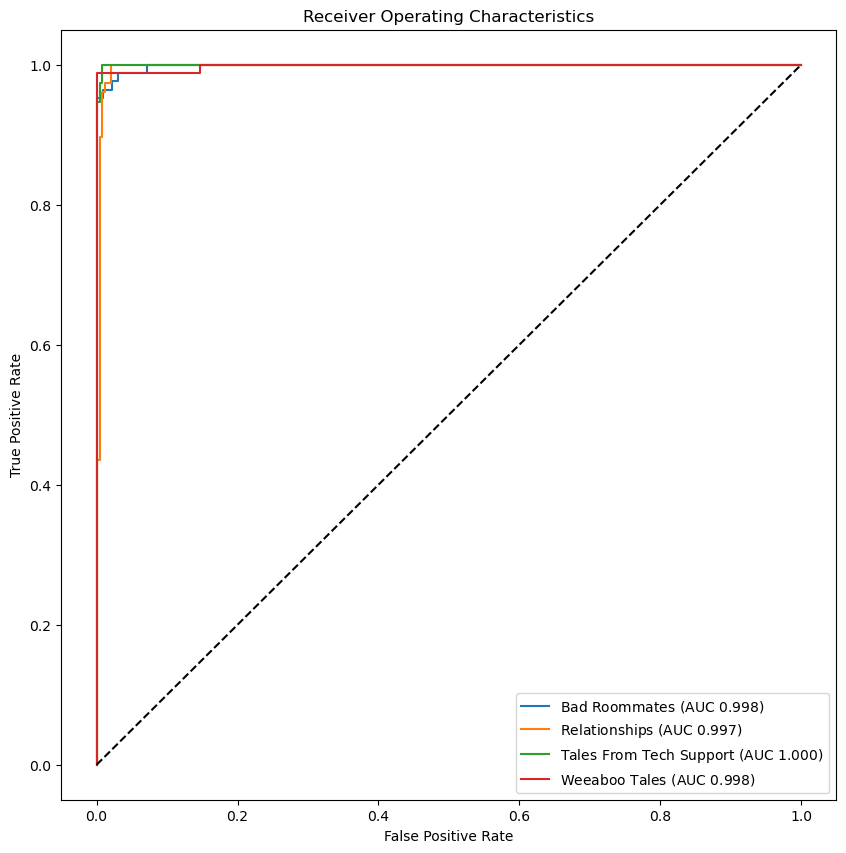

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


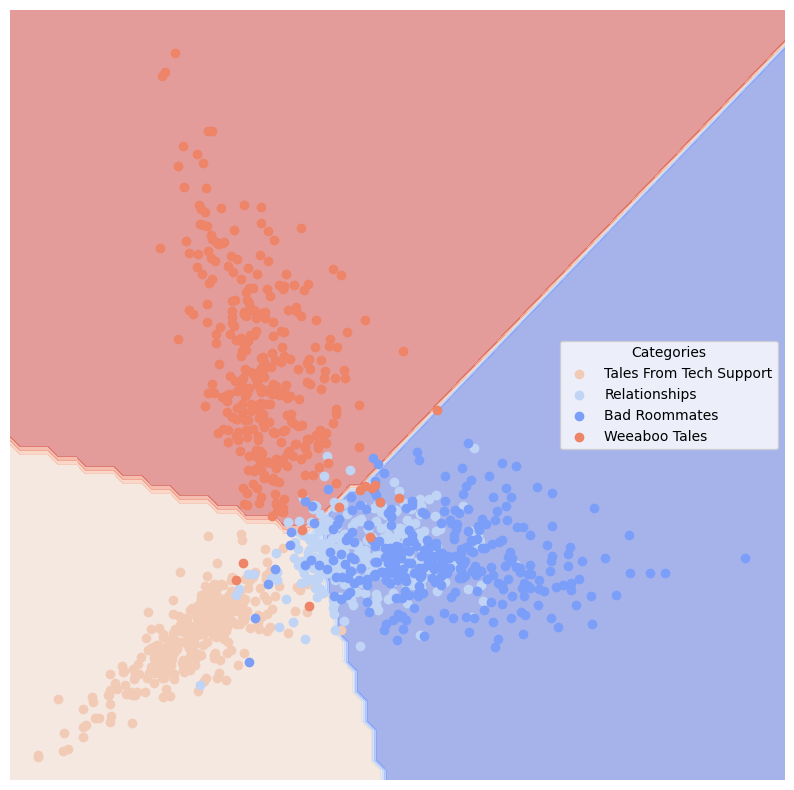

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: DecisionTreeClassifier(random_state=42) ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.065625  0.898080   0.887324           0.776170   
Relationships              0.040625  0.955764   0.891566           0.858345   
Bad Roommates              0.059375  0.913741   0.911392           0.818693   
Weeaboo Tales              0.053125  0.940305   0.873563           0.828394   

                           Recall  
Category                           
Tales From Tech Support  0.828947  
Relationships            0.948718  
Bad Roommates            0.857143  
Weeaboo Tales            0.926829  


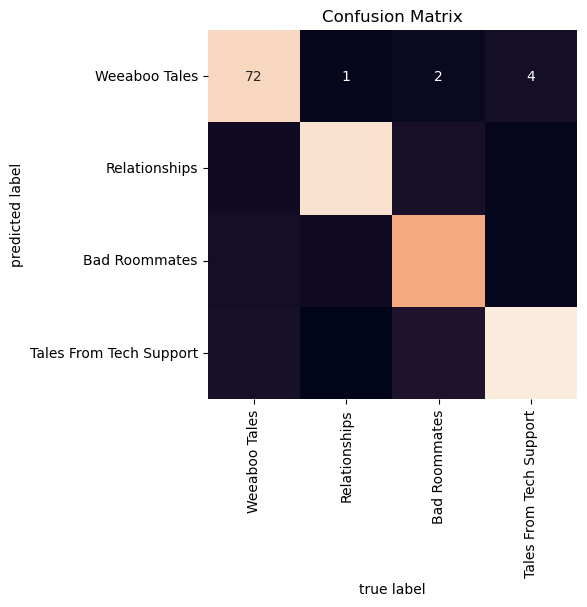

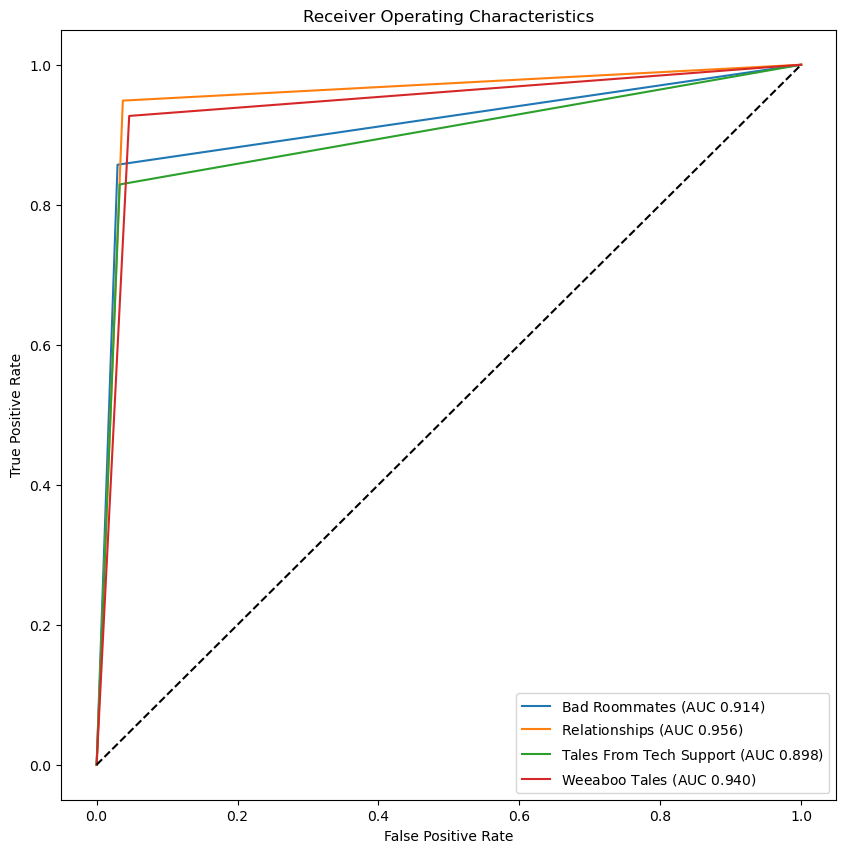

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


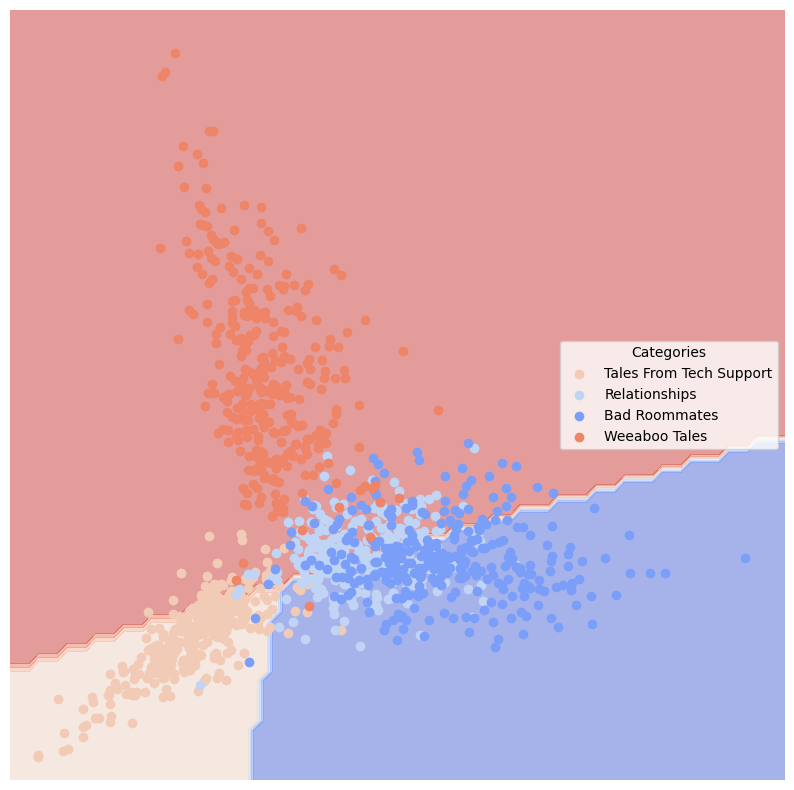

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: RandomForestClassifier(random_state=42) ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.009375  0.989323   0.974026           0.964335   
Relationships              0.018750  0.970227   0.973684           0.936252   
Bad Roommates              0.012500  0.987692   0.965116           0.956752   
Weeaboo Tales              0.009375  0.985704   0.987654           0.969815   

                           Recall  
Category                           
Tales From Tech Support  0.986842  
Relationships            0.948718  
Bad Roommates            0.988095  
Weeaboo Tales            0.975610  


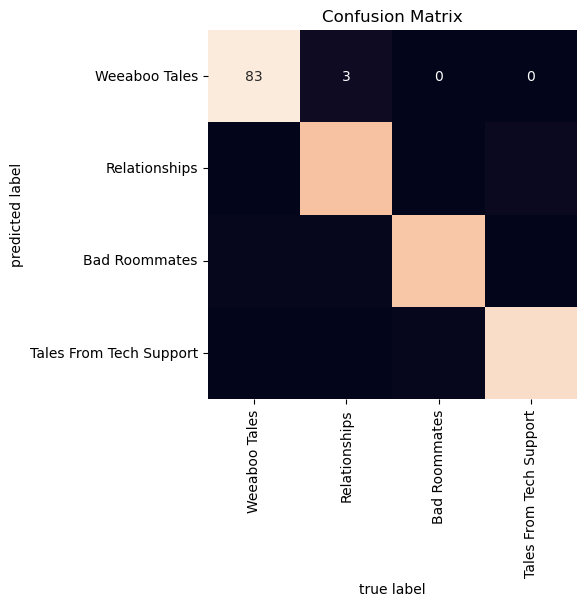

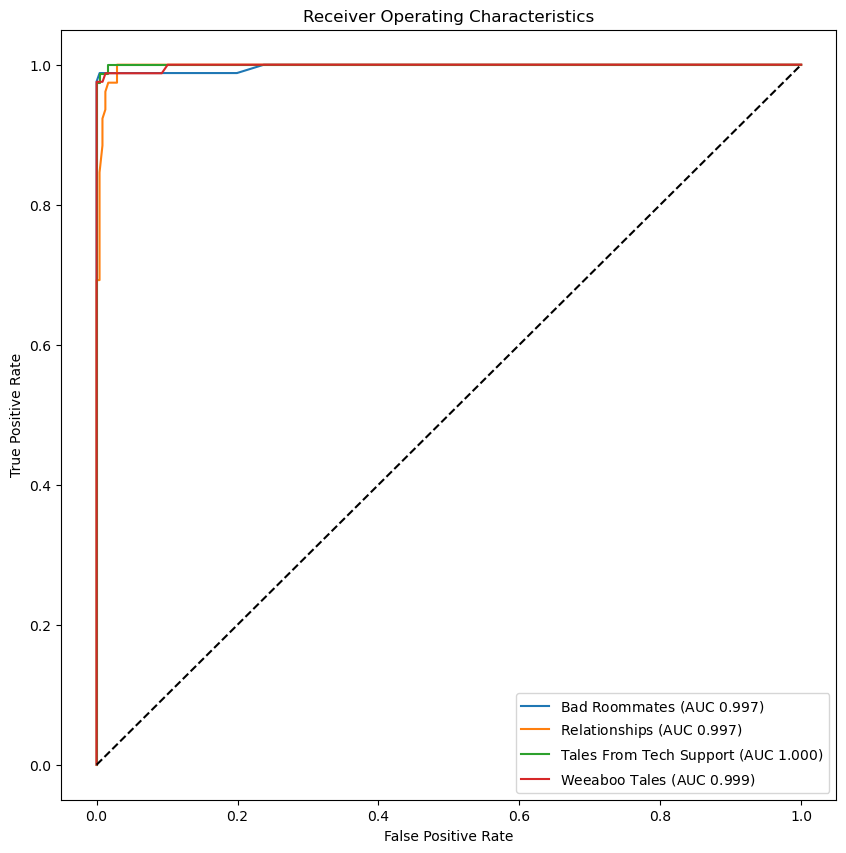

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


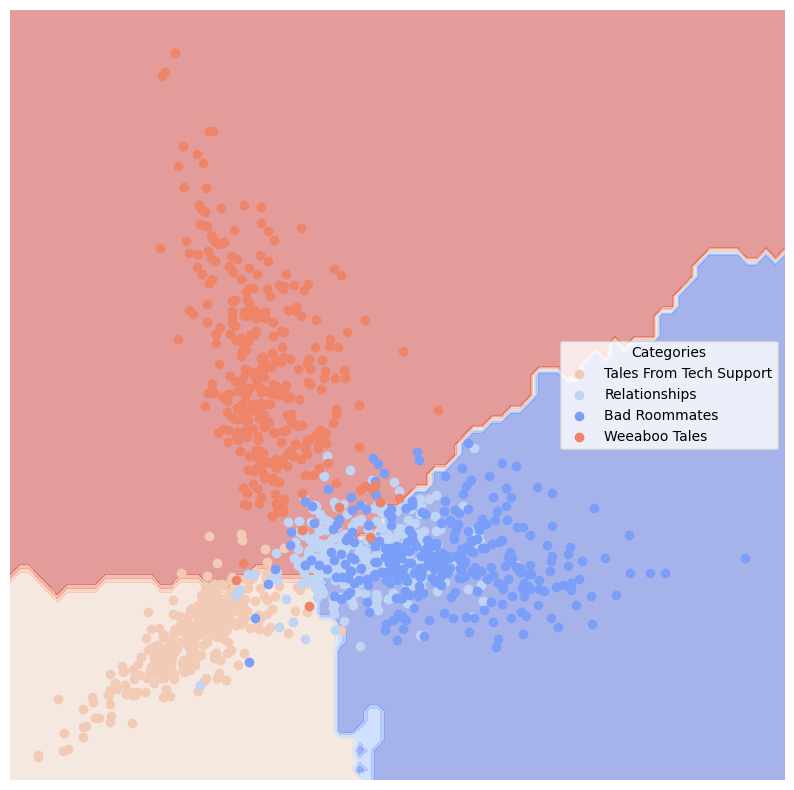

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: MLPClassifier(random_state=42) ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.009375  0.984793   0.986667           0.966952   
Relationships              0.018750  0.978915   0.950000           0.931891   
Bad Roommates              0.012500  0.983858   0.976190           0.959198   
Weeaboo Tales              0.015625  0.977506   0.975309           0.949002   

                           Recall  
Category                           
Tales From Tech Support  0.973684  
Relationships            0.974359  
Bad Roommates            0.976190  
Weeaboo Tales            0.963415  


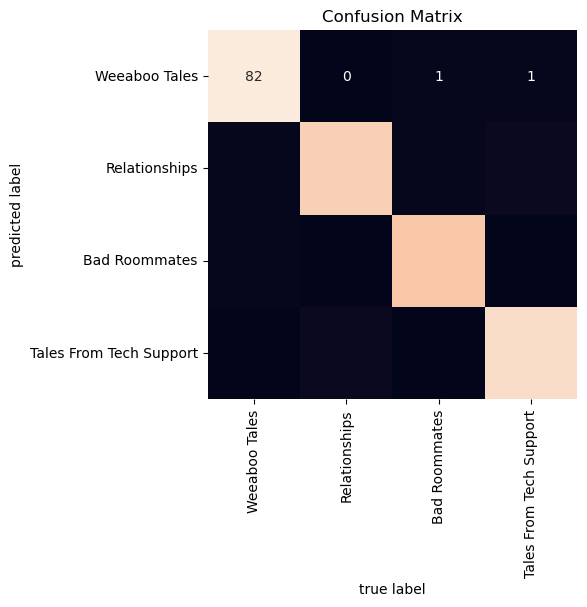

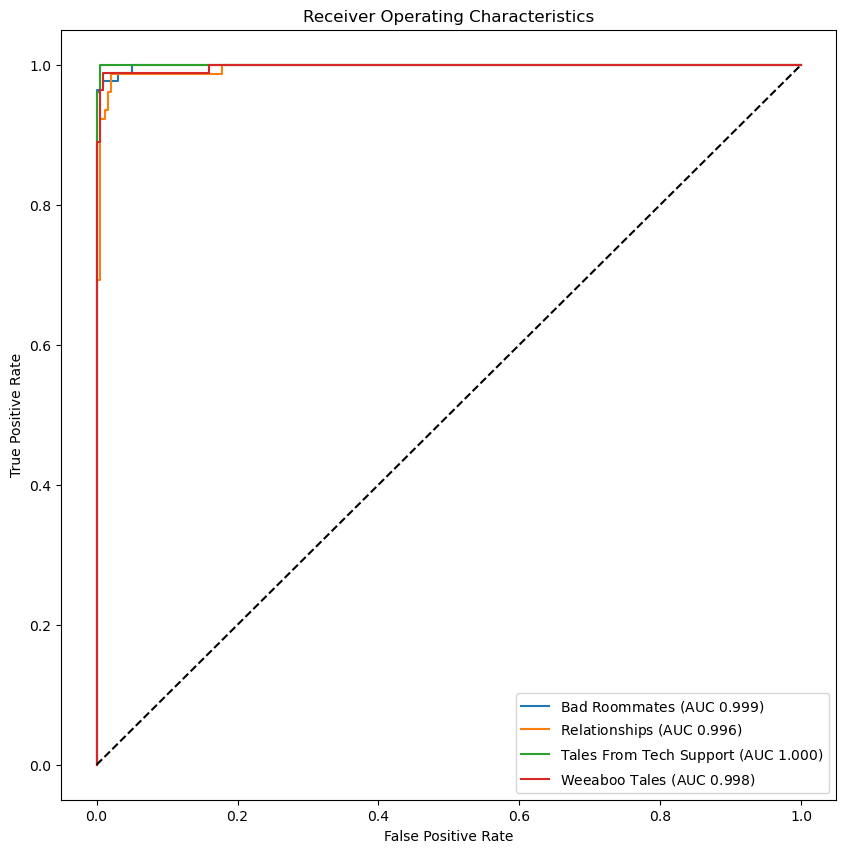

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


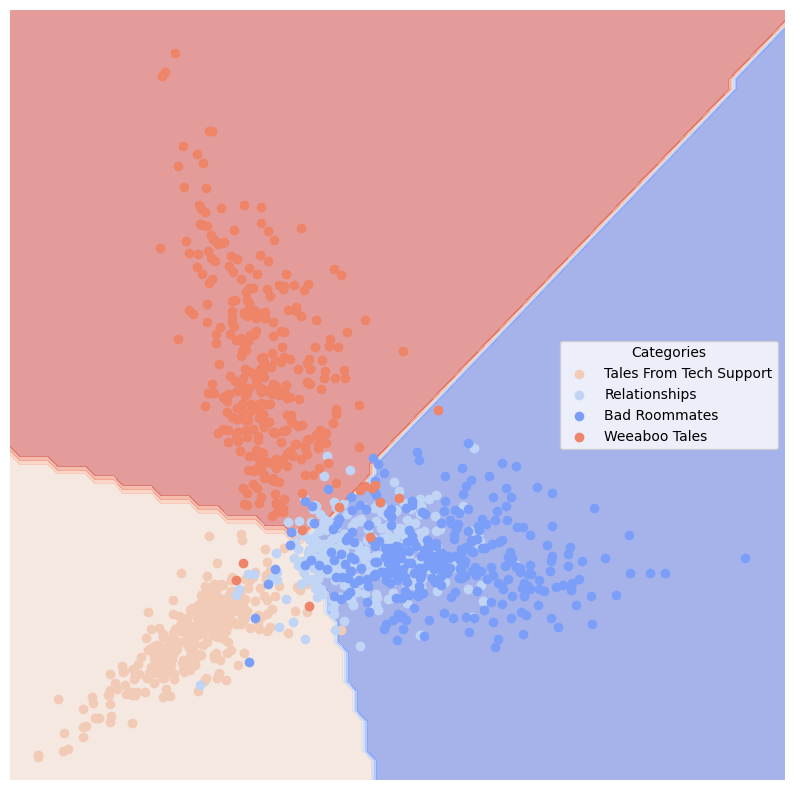

####################### Moving onto next Classifier #######################
#### Train/test split on reddit. Model: GradientBoostingClassifier(random_state=42) ####
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.015625  0.985224   0.949367           0.940000   
Relationships              0.012500  0.987391   0.962500           0.953285   
Bad Roommates              0.025000  0.963882   0.963415           0.921694   
Weeaboo Tales              0.009375  0.981707   1.000000           0.972790   

                           Recall  
Category                           
Tales From Tech Support  0.986842  
Relationships            0.987179  
Bad Roommates            0.940476  
Weeaboo Tales            0.963415  


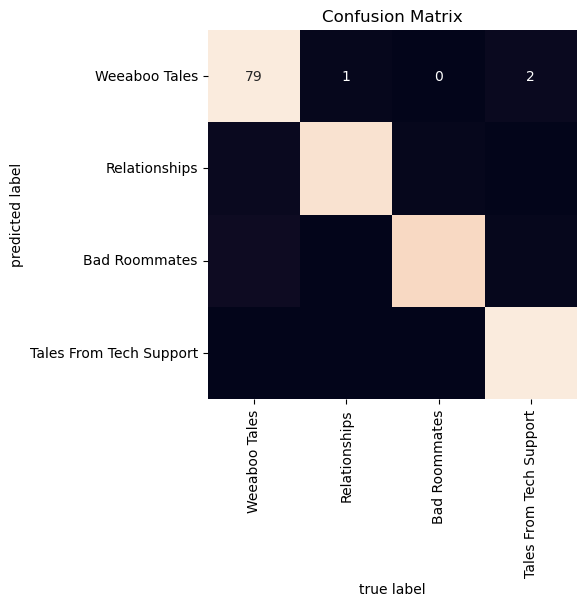

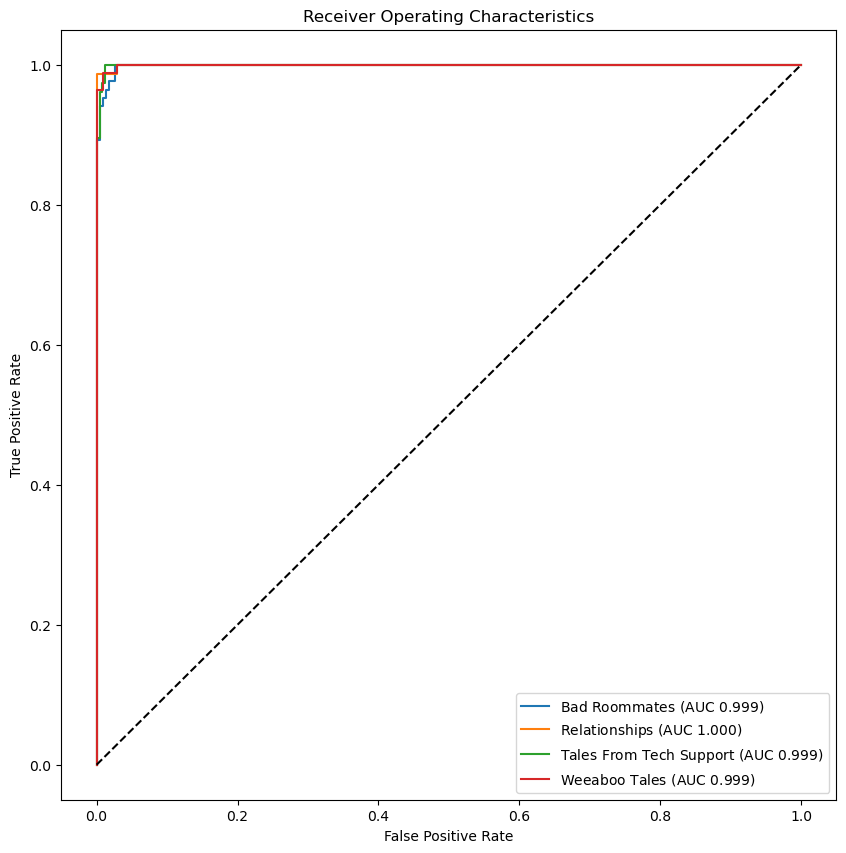

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


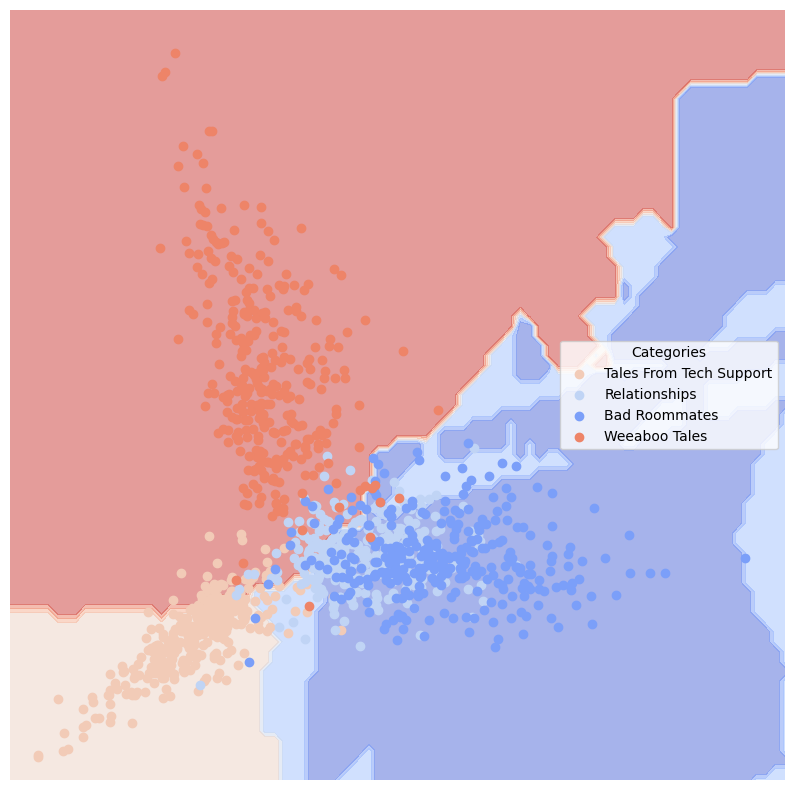

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: GaussianNB() ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.160819  0.830144   0.795455           0.709862  0.789474
Clinton     0.160819  0.830144   0.866667           0.833652  0.870813


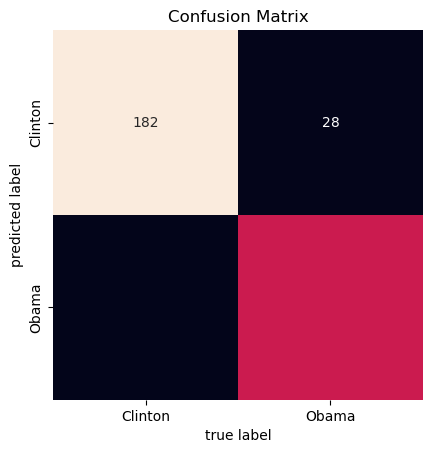

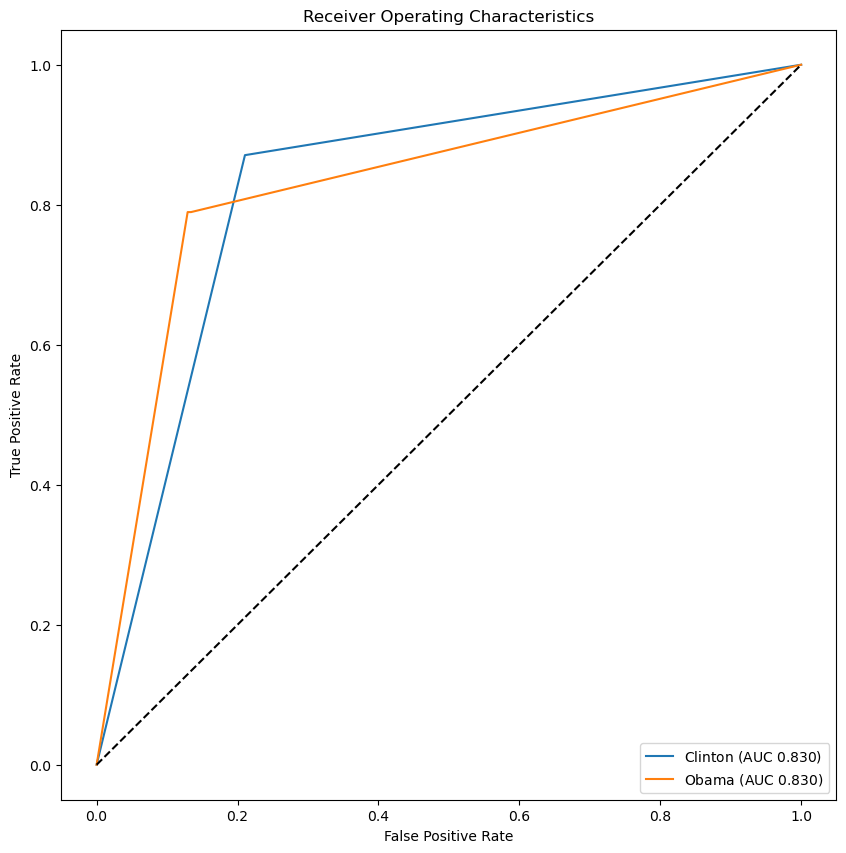

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


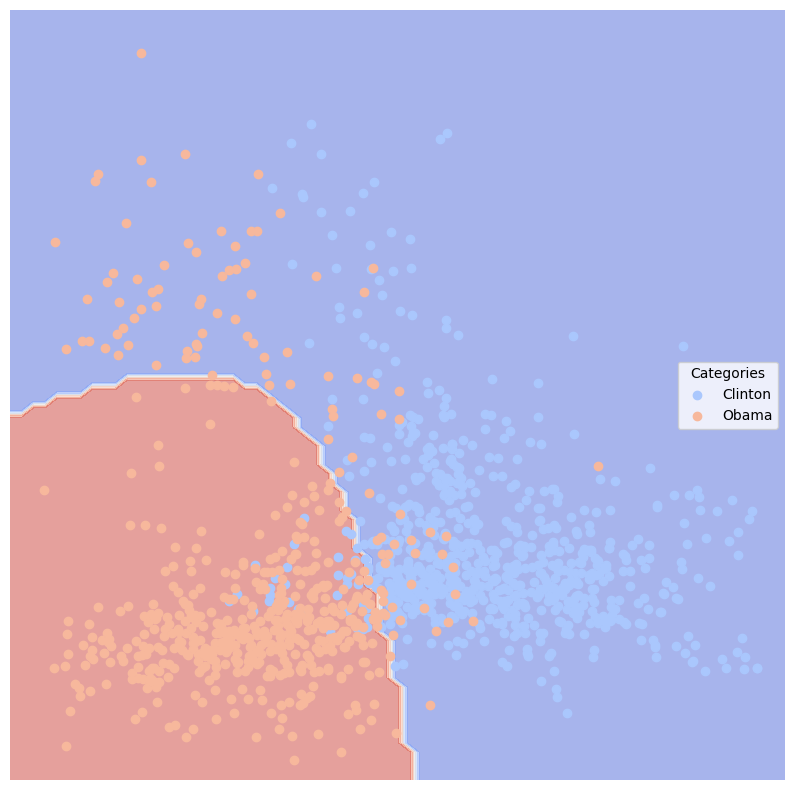

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: SVC(kernel='linear', probability=True, random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.005848  0.992481   1.000000           0.990810  0.984962
Clinton     0.005848  0.992481   0.990521           0.990521  1.000000


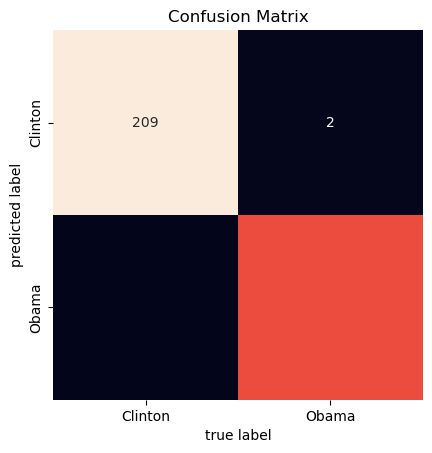

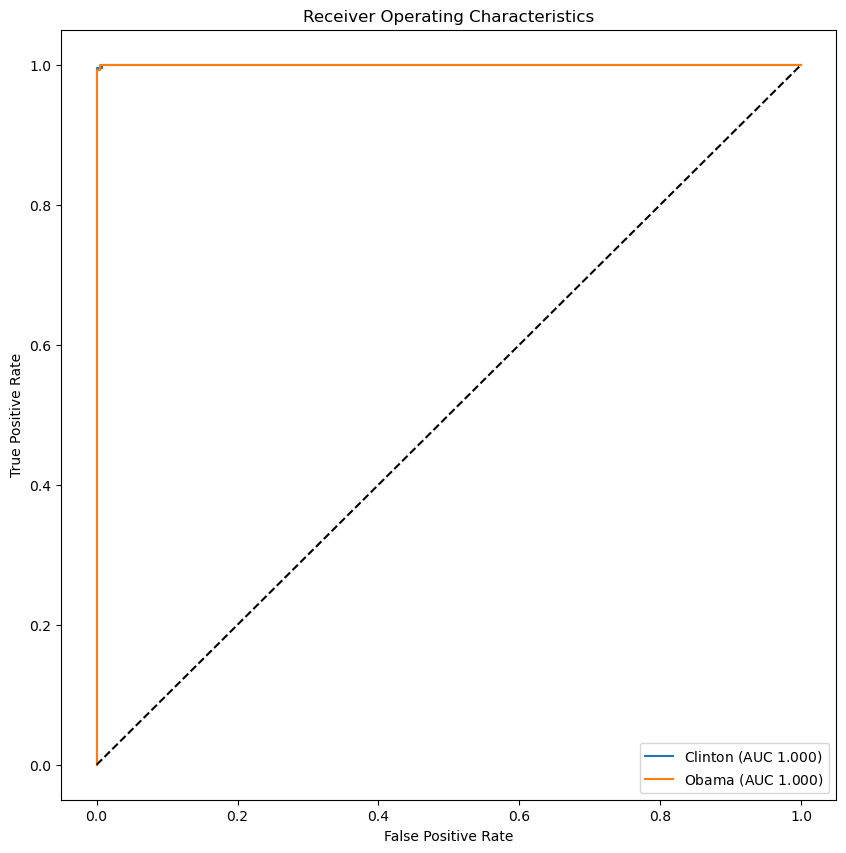

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


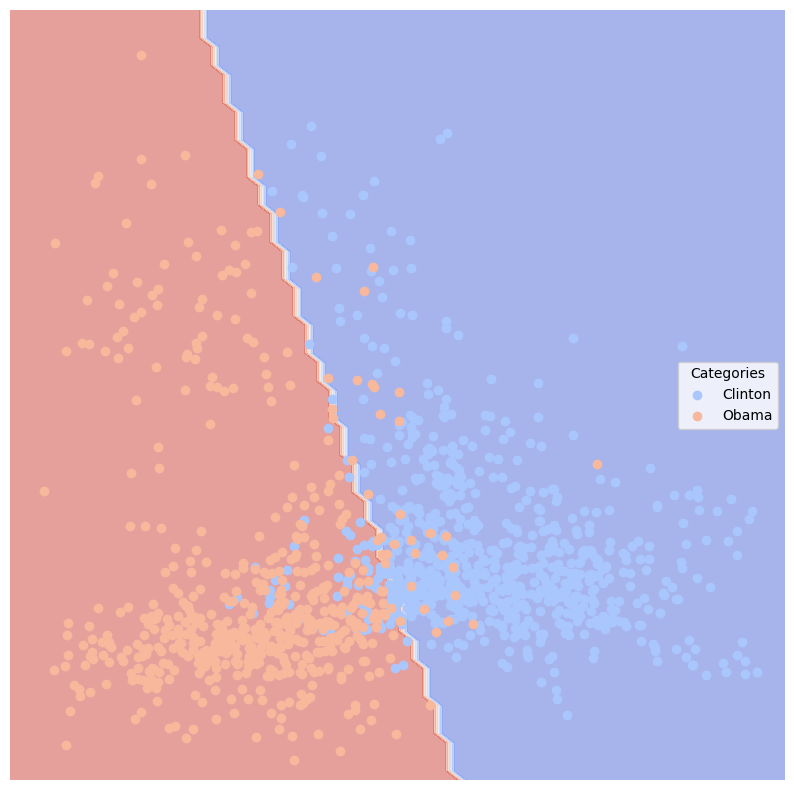

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: SVC(kernel='poly', probability=True, random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.111111  0.859877   0.979798           0.819853  0.729323
Clinton     0.111111  0.859877   0.851852           0.849548  0.990431


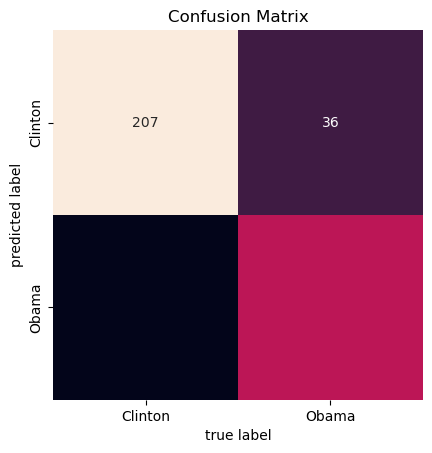

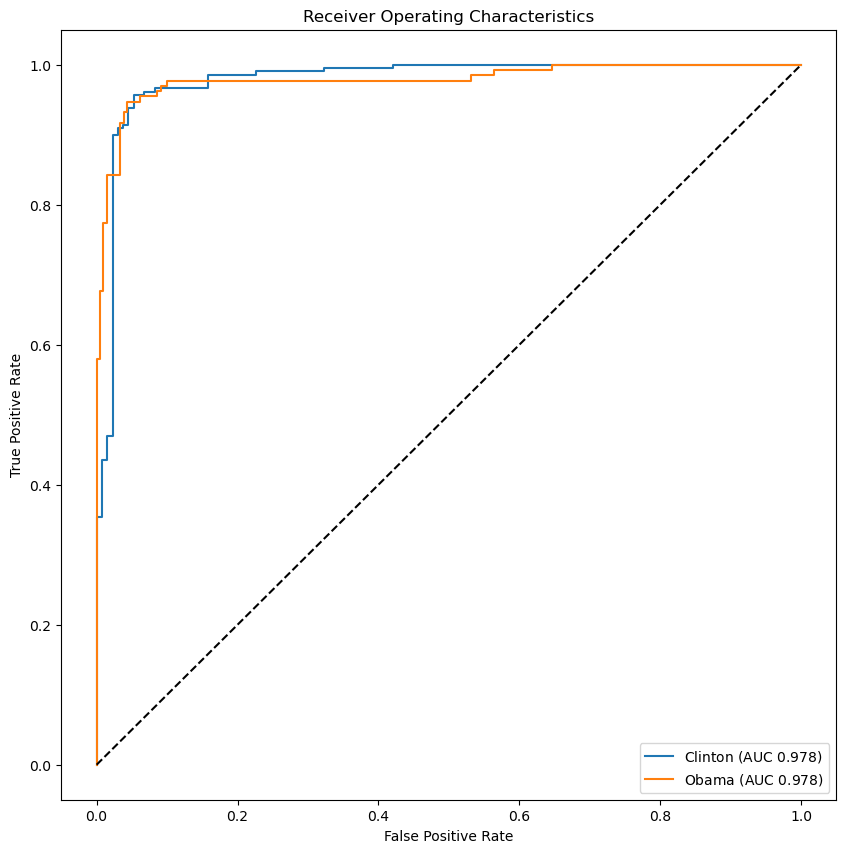

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


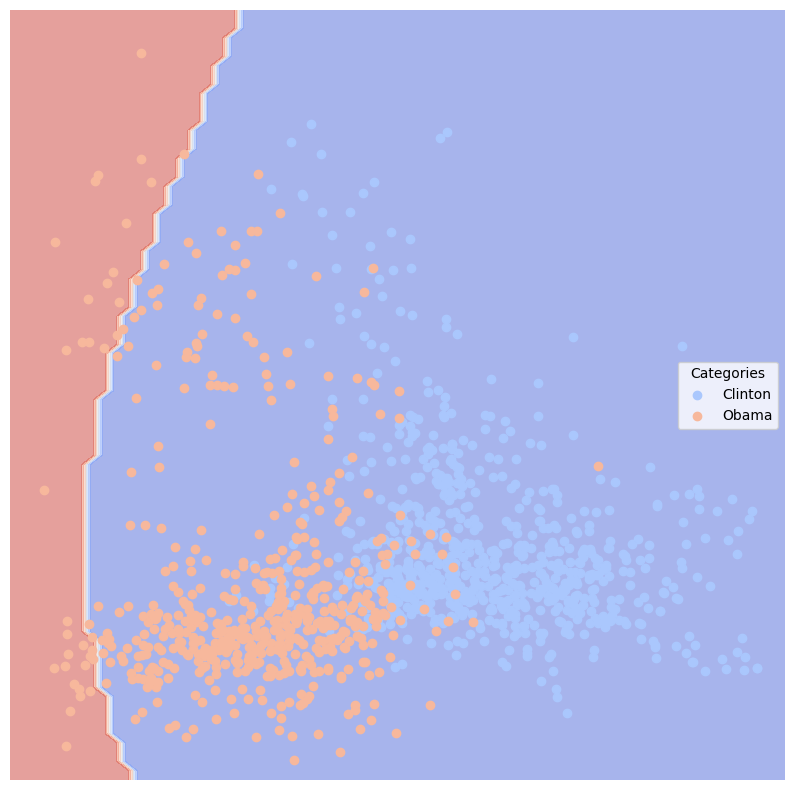

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: KNeighborsClassifier(weights='distance') ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.128655  0.867396   0.824818           0.759264  0.849624
Clinton     0.128655  0.867396   0.902439           0.868985  0.885167


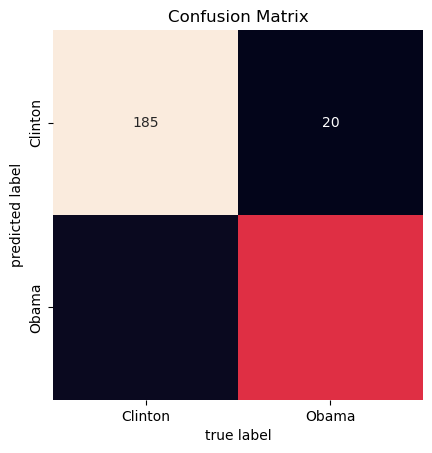

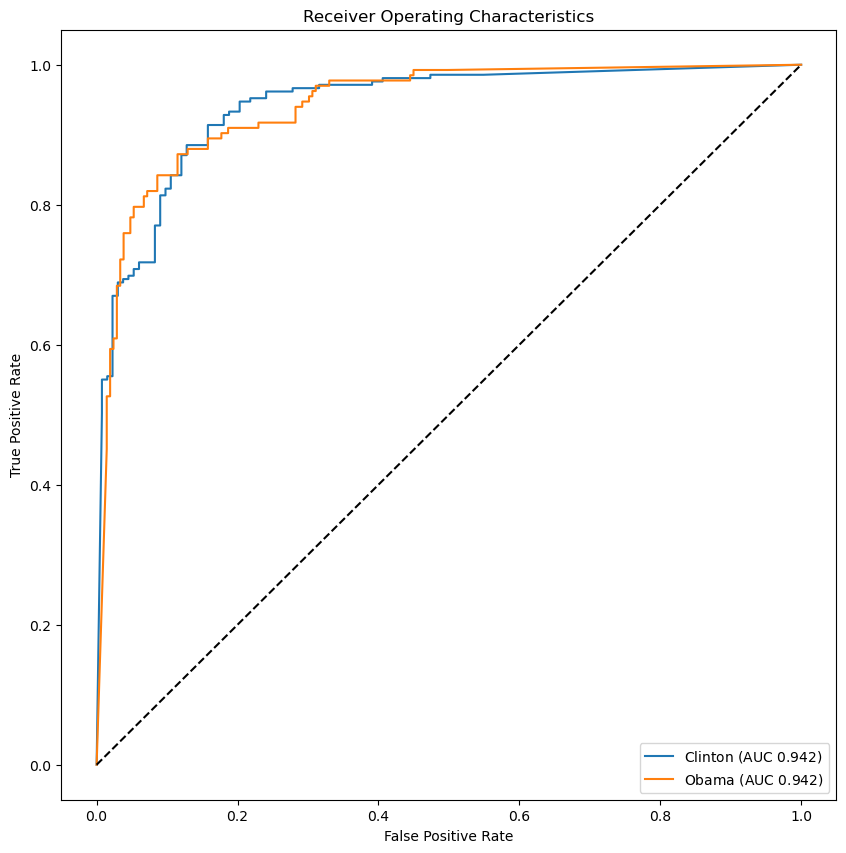

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


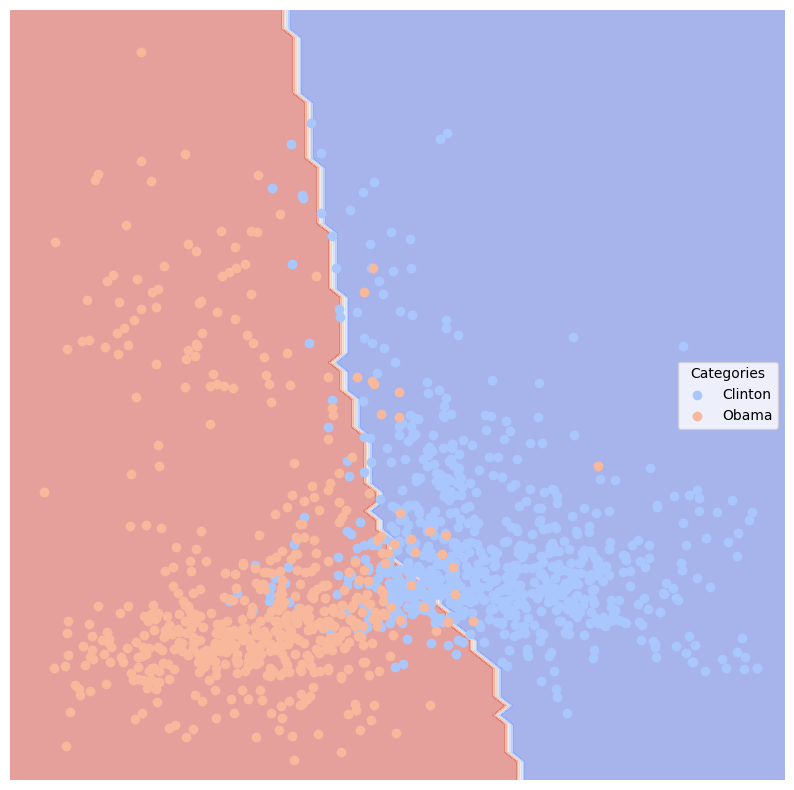

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: LogisticRegression(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.011696  0.984962   1.000000           0.981621  0.969925
Clinton     0.011696  0.984962   0.981221           0.981221  1.000000


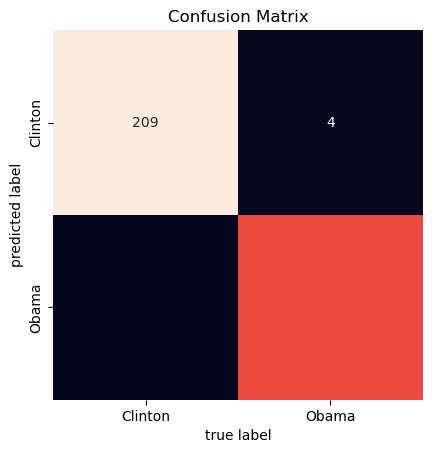

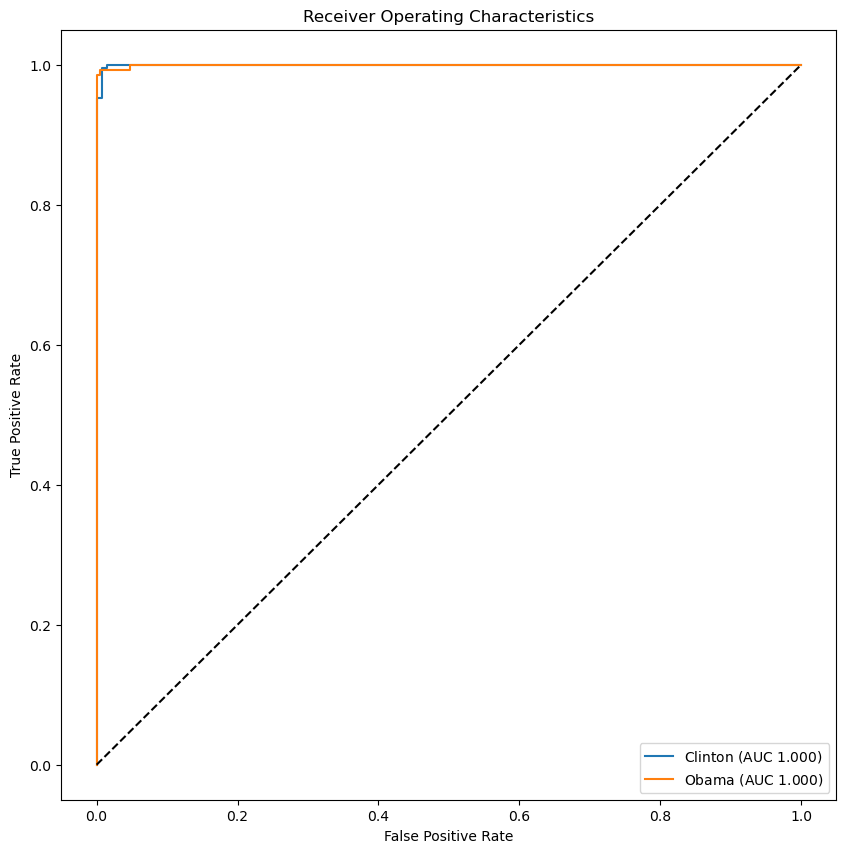

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


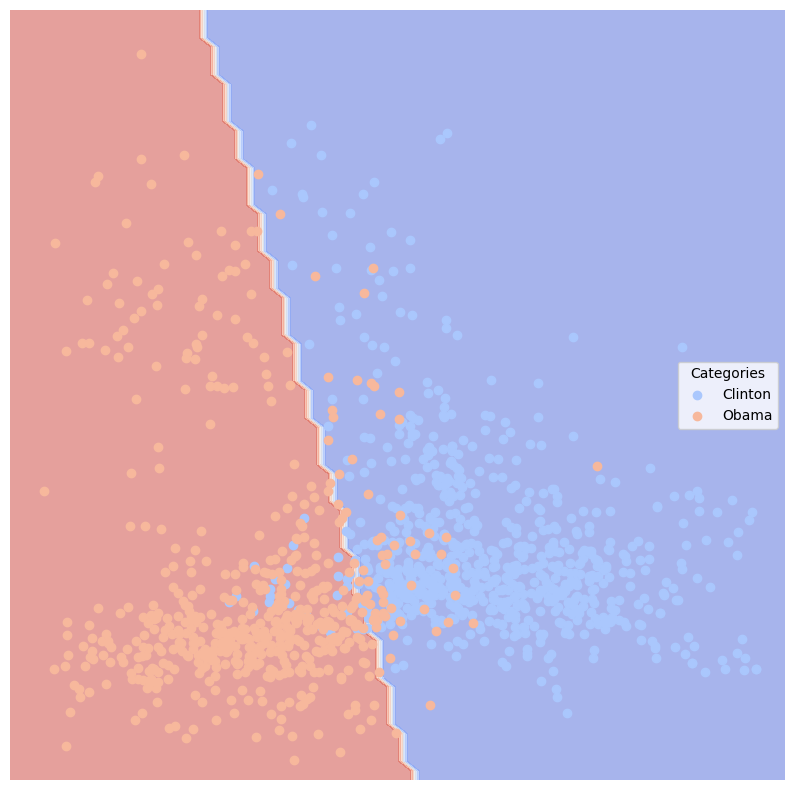

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: DecisionTreeClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama        0.01462  0.985304   0.977612           0.968759  0.984962
Clinton      0.01462  0.985304   0.990385           0.984940  0.985646


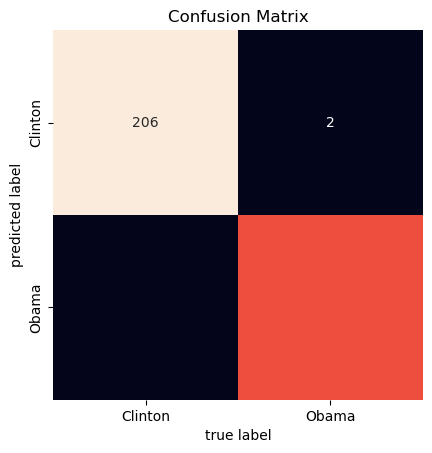

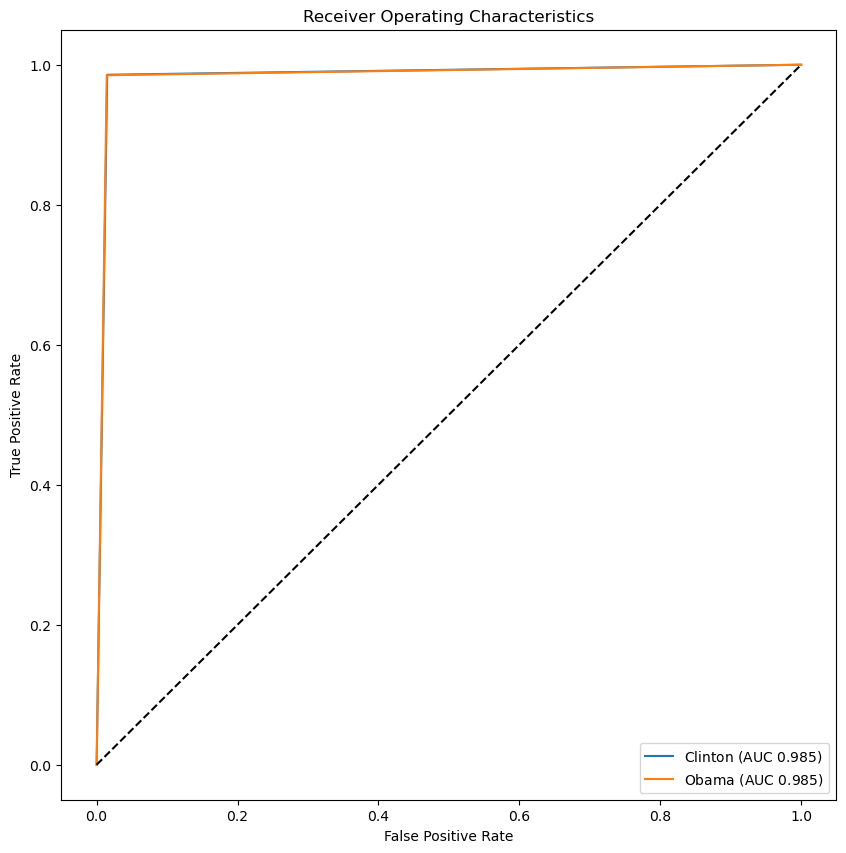

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


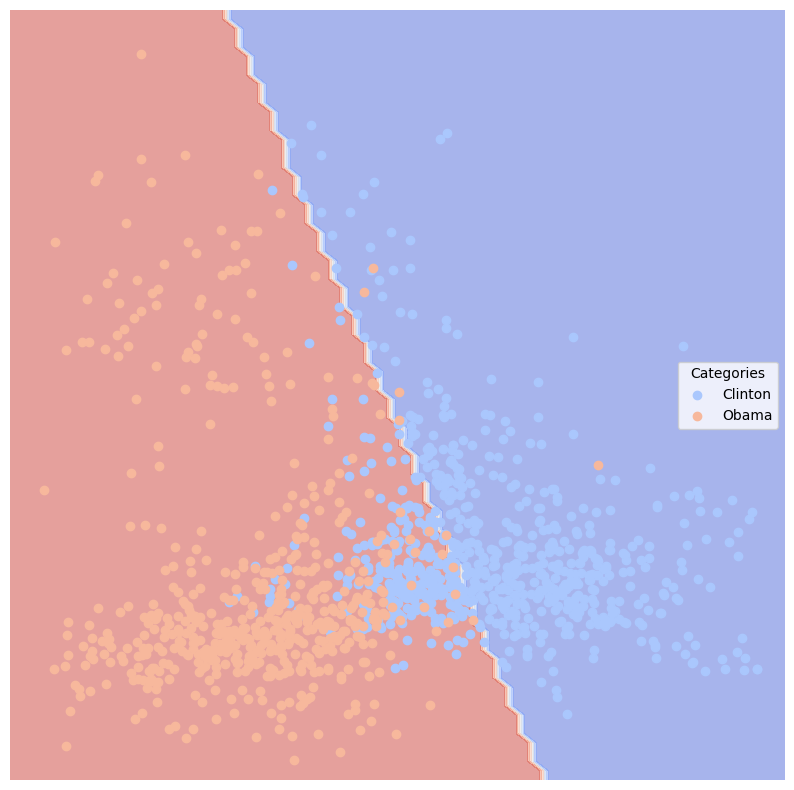

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: RandomForestClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.002924  0.997608   0.992537           0.992537  1.000000
Clinton     0.002924  0.997608   1.000000           0.998139  0.995215


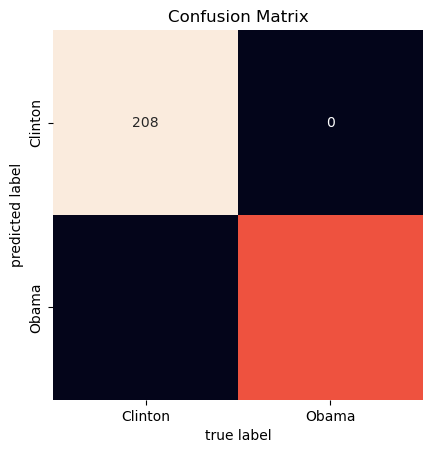

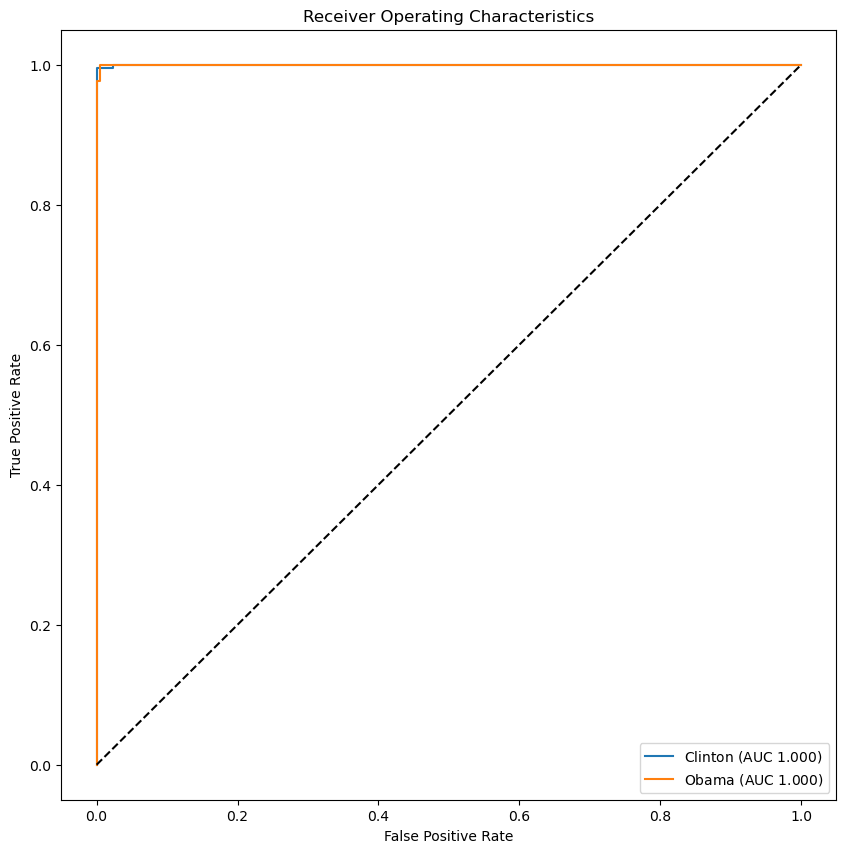

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


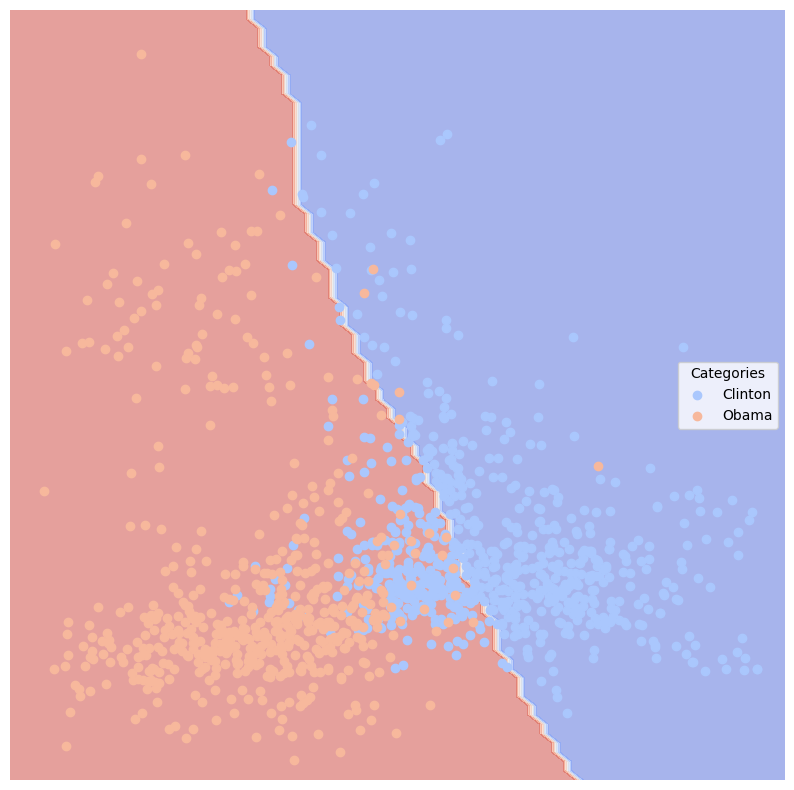

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: MLPClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.052632  0.944634   0.932331           0.895557  0.932331
Clinton     0.052632  0.944634   0.956938           0.942046  0.956938


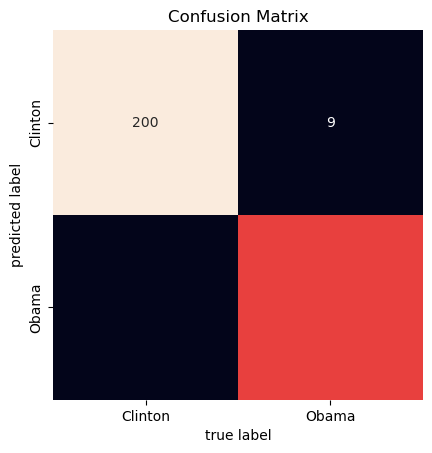

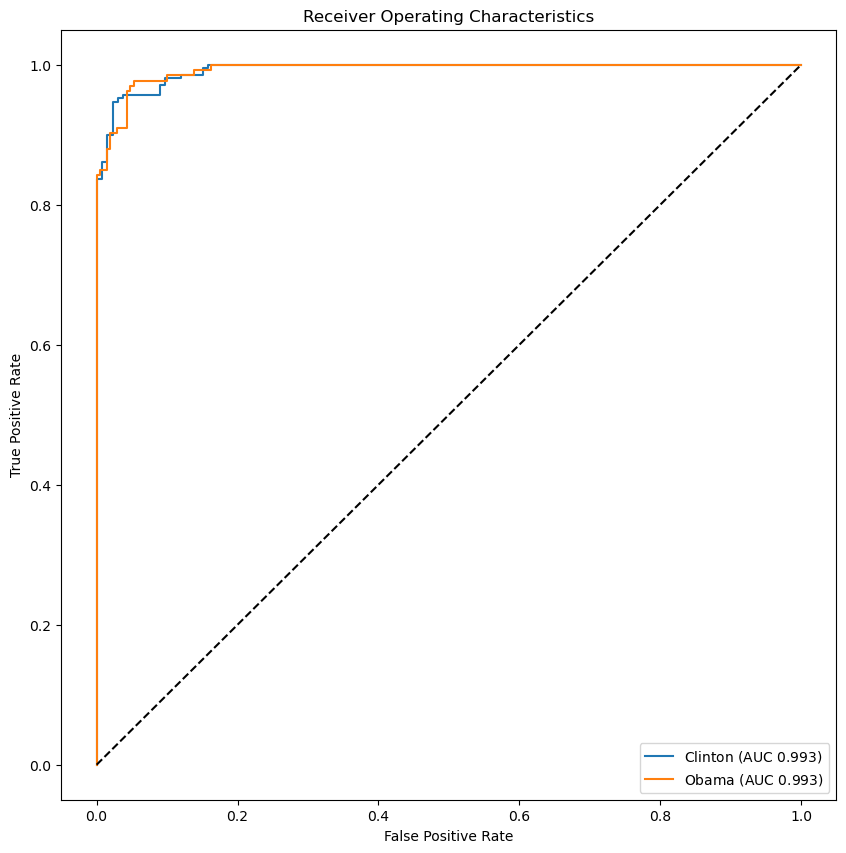

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


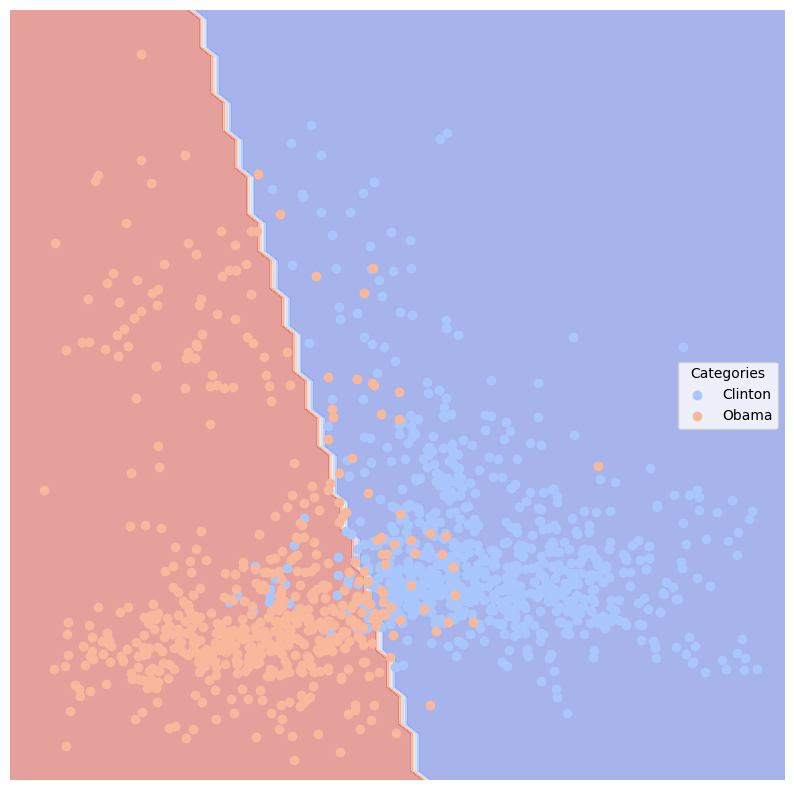

####################### Moving onto next Classifier #######################
#### Train/test split on senate_small. Model: GradientBoostingClassifier(random_state=42) ####
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.008772  0.990089   0.992424           0.983349  0.984962
Clinton     0.008772  0.990089   0.990476           0.988661  0.995215


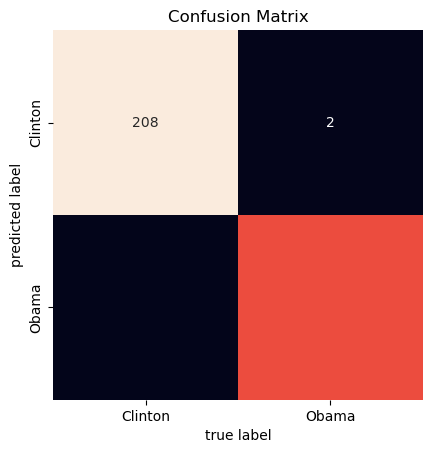

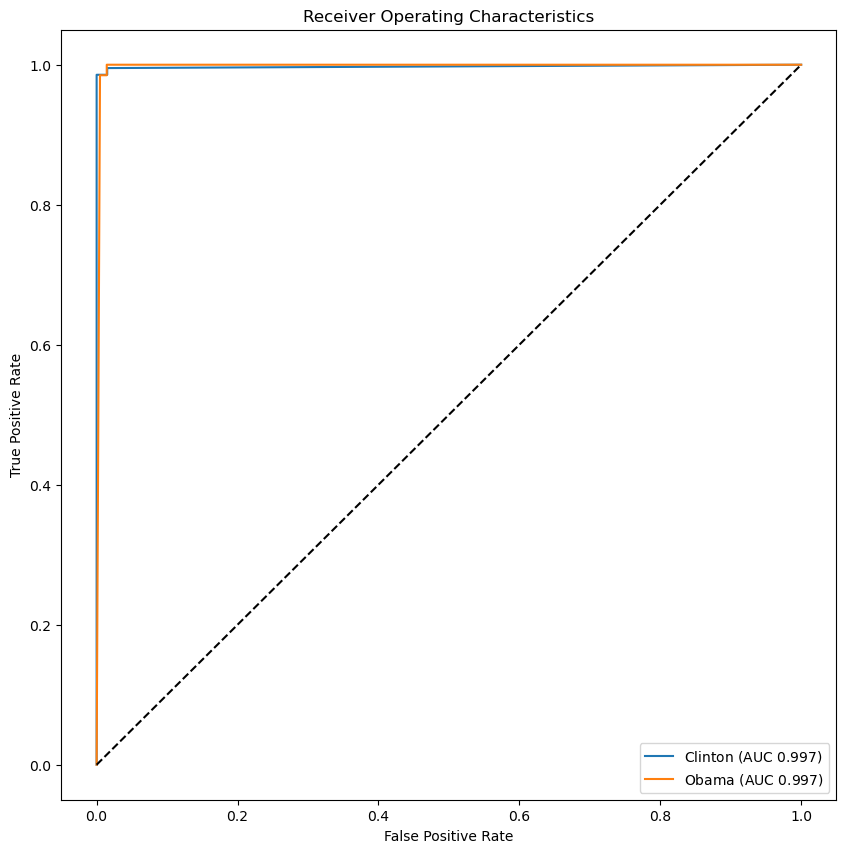

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


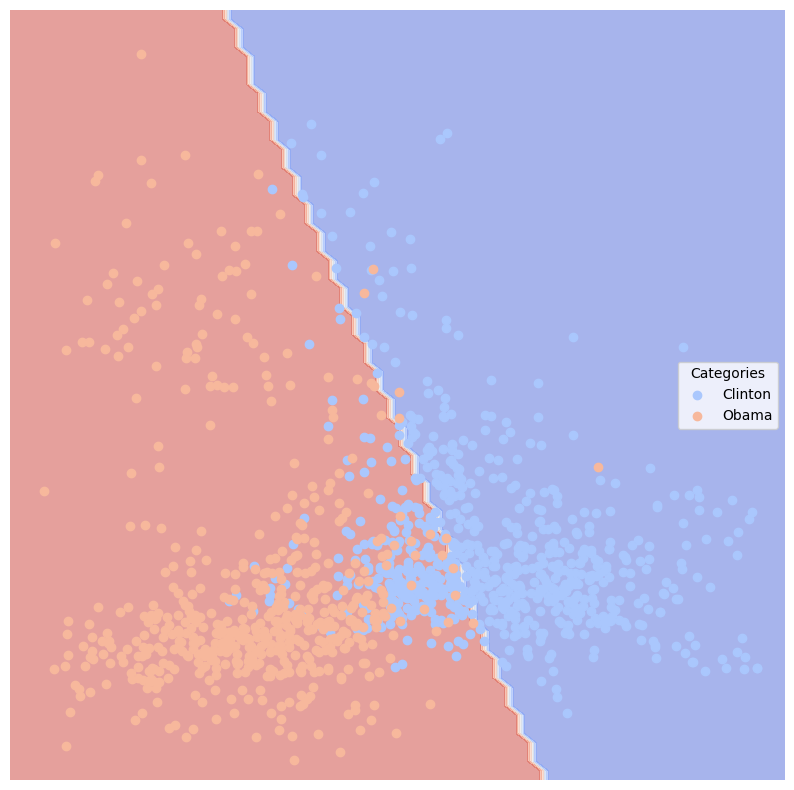

####################### Moving onto next Classifier #######################


In [62]:
for data in emp_data.items():
    test_models_emp(data, clfs)

*For the Reddit data:*

Gaussian performs well, having relatively low error rates for most subreddits and specifically thoes from Tales from Tech Support. AUC is pretty high for all but relationships (above .80). For svc linear, the model has extremely high AUC (all above .95). The ROC curves look like right angles. SVC poly3 does very well but not as well as the previous model. KNN performs about the same as well. Log reg performs similarly to svc linear. High AUC (all above .95). DT is similar to svc poly3, with AUCs around .91. Random forests prove better than DTs, as is quite often the case. Neural networks and gradient boosting also perform very well like previous models. 

*For the senatesmall data:*

Gaussian performs decently with an AUC of around .84 for both labels. SVC linear performs extremely well with very small error rates and AUC values of close to .996.  SVC poly like thr reddit data does worse than linear but is still very good. KNN performs worse than any previous model but is still not bad (15% error rate and 85% AUC for both with high precision for Clinton). Similar to svc linear, log reg also performs extremely well. Precision for Obama reached around 100%. DTs performed very well too .005 error rate and AUC above .99. Random forests performed very similarly to svc linear and log reg. Neural networks actually performed well but relative to other very good models, not so much (error rate of around .05 and AUC near .95). Neural networks performed similarly. Gradient boosting did about as well as DTs, svc linear, and log reg. 

### Stretch ###

#### Testing Ridge on Artificial ####

          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.44  0.567443   0.524194           0.507474  0.691489
1               0.44  0.567443   0.618421           0.569206  0.443396


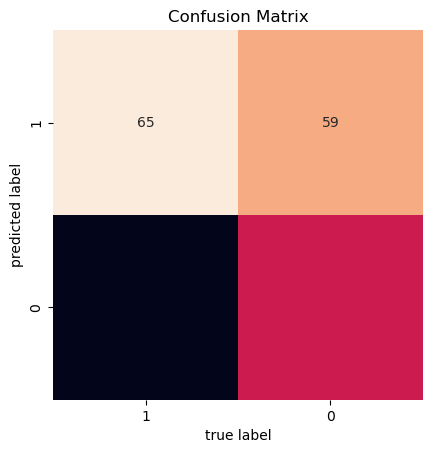

The <class 'sklearn.linear_model._ridge.RidgeClassifier'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


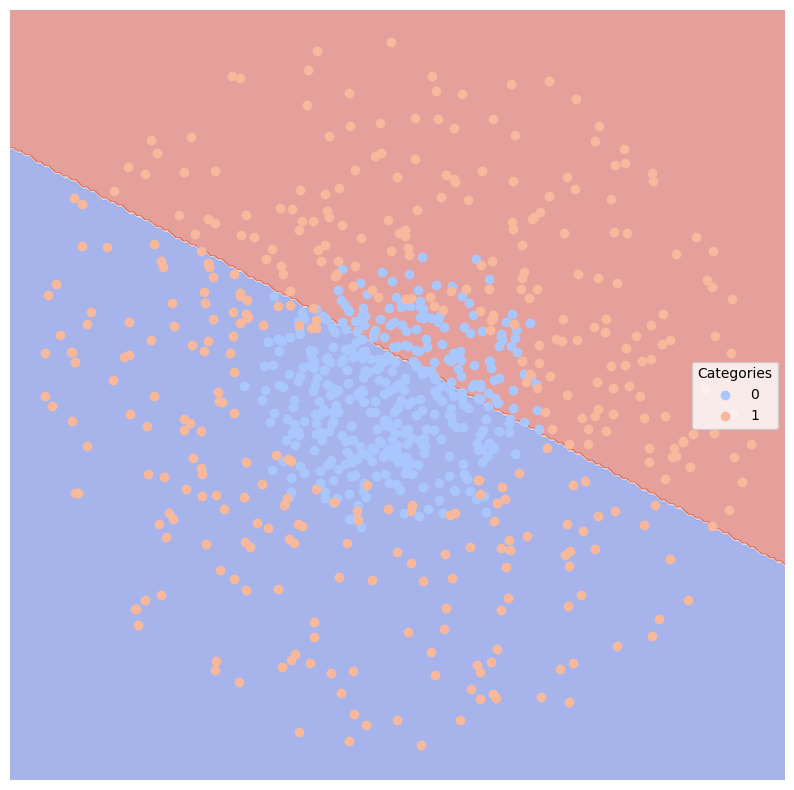

In [63]:
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
clf = sklearn.linear_model.RidgeClassifier()
get_model(clf, dfTrain, dfTest)

From this we can see that the ridge regression classifier does not do very well on the target data. This is one of the worst in terms of AUC, precision, and recall.

#### Test Ridge on Reddit ####

                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.015625  0.985573   0.954023           0.945791   
Relationships              0.015625  0.981739   0.964706           0.947987   
Bad Roommates              0.015625  0.973509   0.987342           0.951679   
Weeaboo Tales              0.003125  0.992857   1.000000           0.988839   

                           Recall  
Category                           
Tales From Tech Support  0.988095  
Relationships            0.976190  
Bad Roommates            0.951220  
Weeaboo Tales            0.985714  


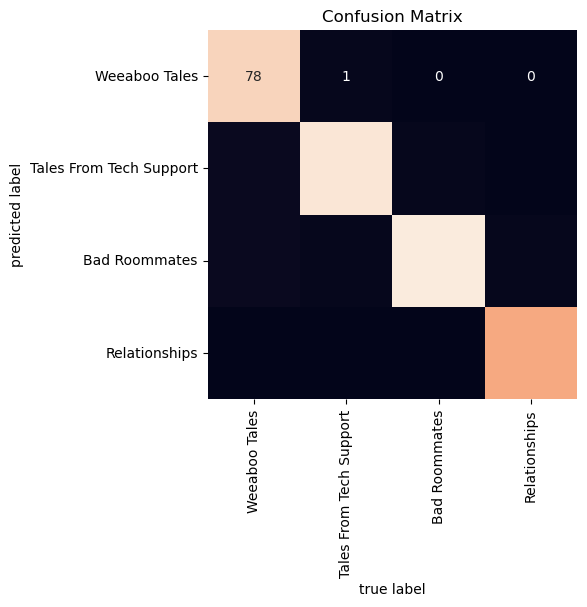

The <class 'sklearn.linear_model._ridge.RidgeClassifier'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


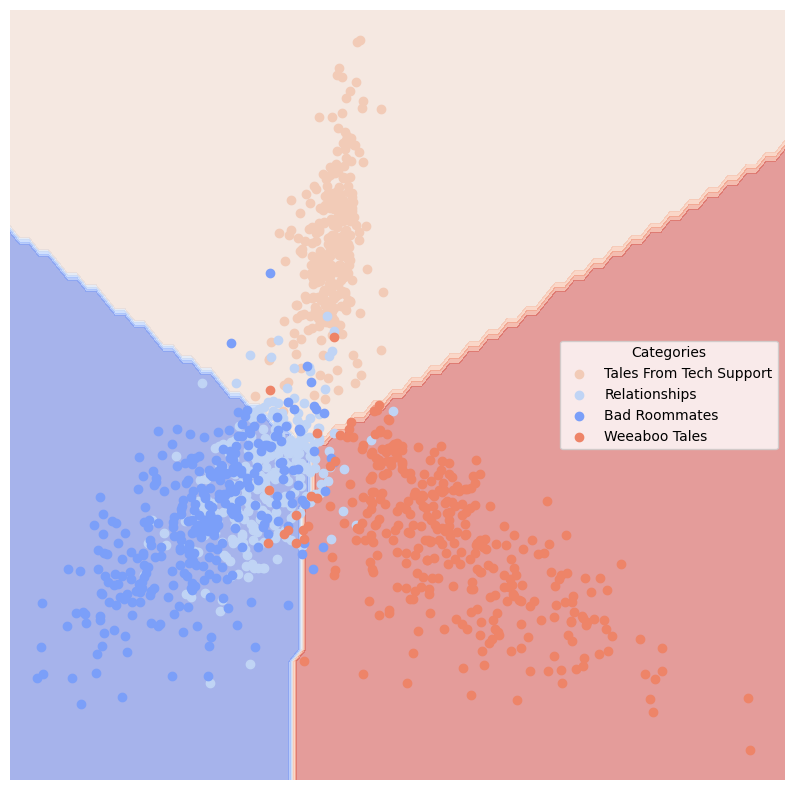

In [64]:
dfTrain, dfTest = sklearn.model_selection.train_test_split(reddit2, test_size=.2, random_state=42)
clf = sklearn.linear_model.RidgeClassifier()
get_model(clf, dfTrain, dfTest)

Ridge regression classification performs very well in the case of the Reddit data. Having very high AUC, Precision, recall and low error rate.

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest?

In [65]:
ObamaClintonReleases = pandas.read_csv('../data/ObamaClintonReleases.csv', index_col=0)

I'm pretty sure that you're all familiar with pandas, but, just to clarify: why do we use pandas here? pandas is a Python library which is widely used for analyzing and wrangling data. In particular, pandas loads data and creates data frame, a Python object that looks familiar to us (since it looks like a excel table) and easy to work with. So, using pandas.read_csv function, we take in the csv file and convert it into a data frame.

In [66]:
type(ObamaClintonReleases)

pandas.core.frame.DataFrame

It's a DataFrame! and it looks like this:

In [67]:
ObamaClintonReleases

,download_url,html_url,name,path,text,targetSenator
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2007Obama430.txt,raw/Obama/10Apr2007Obama430.txt,Obama Calls on IRS to Protect Taxpayers ...,Obama
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2008Obama108.txt,raw/Obama/10Apr2008Obama108.txt,Statement from Senator Barack Obama on the ...,Obama
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama674.txt,raw/Obama/10Aug2005Obama674.txt,Obama Says Bill Will Help Cut Off Supply of...,Obama
3,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama675.txt,raw/Obama/10Aug2005Obama675.txt,Obama Durbin Say Illinois Will Receive 33 ...,Obama
4,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2006Obama508.txt,raw/Obama/10Aug2006Obama508.txt,Obama Introduces Bill to Help Tap Power of ...,Obama
...,...,...,...,...,...,...
1704,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2005Clinton285.txt,raw/Clinton/1Sep2005Clinton285.txt,September 1 2005 Senator Clinton Visit Infoto...,Clinton
1705,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2005Clinton286.txt,raw/Clinton/1Sep2005Clinton286.txt,September 1 2005 Senator Clinton Announces Ex...,Clinton
1706,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2005Clinton287.txt,raw/Clinton/1Sep2005Clinton287.txt,September 1 2005 Senator Clinton Joins Local ...,Clinton
1707,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2006Clinton207.txt,raw/Clinton/1Sep2006Clinton207.txt,September 1 2006 Clintons Meet with Cazenovia...,Clinton


Neat! Let's turn the 'targetSenator' column into a binary category variable.

In [68]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [69]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: lucem_illud.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

c:\Users\Ethan\anaconda3\Lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Let's split the data into training data and testing data.

In [70]:
holdBackFraction = .2
train_data_df, test_data_df = sklearn.model_selection.train_test_split(ObamaClintonReleases, test_size=holdBackFraction)

In [71]:
print(len(train_data_df))
print(len(test_data_df))

1367
342


## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud.generateVecs()` will help with this but for now we are doing it the long way):

In [72]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

In [73]:
TFVects.shape

(1367, 11292)

The core function here is TfidfVectorizer, which takes a collection of raw documents and turn them to a tf-idf matrix. Just to recap: tf-idf means term frequency-inverse document frequency, a statistic (or, more precisely, a product of two statistics, term frequency and inverse document frequency) that shows the importance of a term vis-a-vis documents. TF, or, term frequency, counts how many times a term is used in a document; IDF, or, inverse-document-frequency, measures common or rare a term appears across documents.

Let's look at three parameters of TfidfVectorizer: max_df = 100, min_df = 2, and norm='l2'. What do those parameters mean?

(1) max_df = 100

Here, we specified a thredhold of 100, and the terms that have a document frequency higher than 100 would be ignored.

(2) min_df = 2

We specified a lower bound, 2, and the terms that have a document frequency lower than 2 will be ignored.

(3) norm = 'l2'

This parameter is about vector normalization. In machine learning, we commonly normalize vectors, i.e., change the length of vectors and turn them into a unit vector, before passing them into algorithms. There are various ways of normalizations, and this parameter specifies how we normalize vectors. Here, we set the norm to l2, in which case, we normalize the vectors such that squares of vector elements sums to 1. Alternatively, we can set it to l1, in which case the sum of absolute values of vector elements, not the square of vector elements, is 1.

fit_transform() literally fits to data and then transform it. So, fit_transform() is just a combination of two steps--(1) fitting parameters to data; (2) then, using the vocabulary and document frequencies learned by fit(), transforming documents into document-term matrix. So, it's the same as fit followed by transform.

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [74]:
TFVects.shape

(1367, 11292)

We can save this in the dataframe to make things easier

In [75]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [76]:
train_data_df.vect.shape

(1367,)

Looks simple, but we need to know what todense() does here. todense() returns a dense matrix representation of the matrix. Why do we need this? As you can see above, the TFVects, a document-term matrix, has 11349 columns, and this matrix is sparse, in the sense that it is comprised mostly of zeros. Dense matrices, in contrast, are the matrices that are comprised of mostly non-zeros. Then why do we make sparse matrices into dense ones? Because zero values don't contain important information but take up so much memory.

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [77]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [78]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

C:\Users\Ethan\AppData\Local\Temp\ipykernel_9060\2339884988.py:7: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")
C:\Users\Ethan\AppData\Local\Temp\ipykernel_9060\2339884988.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")


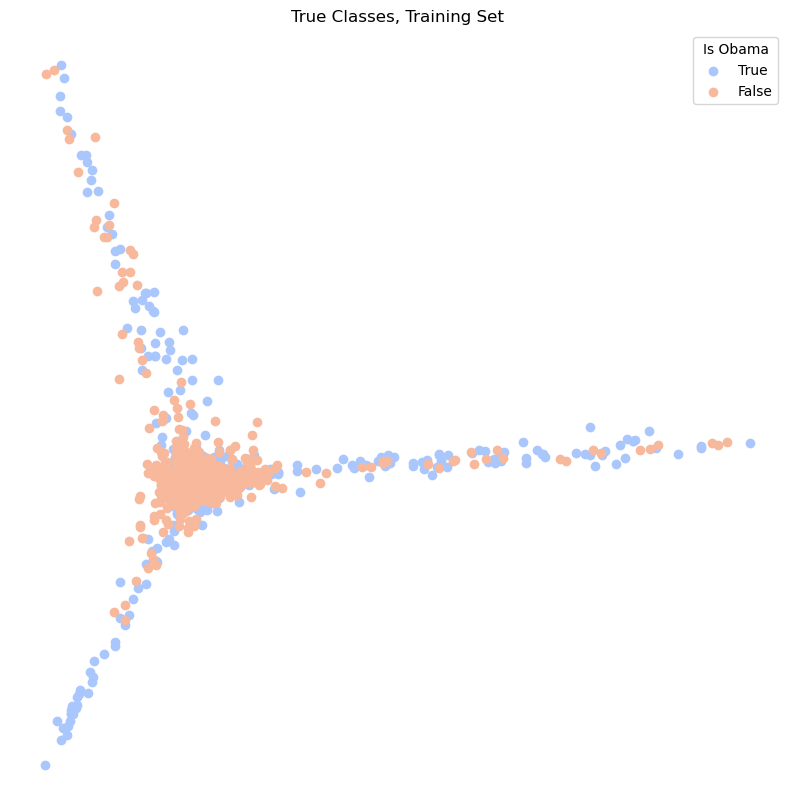

In [79]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")

ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

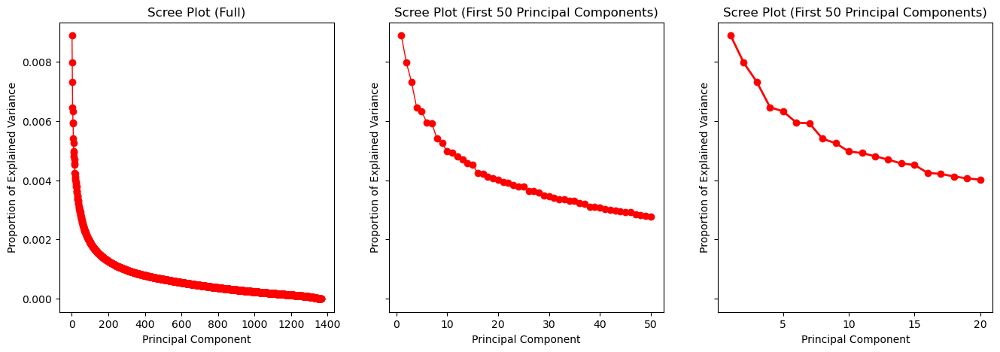

In [80]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [81]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [82]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

LogisticRegression()

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [83]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.6795903438185809

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [84]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6549707602339181

Slightly poorer. How about using more dimensions (40)?

In [85]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Training:
0.7498171177761521
Testing:
0.716374269005848


Or still more (100)?

In [86]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.8383321141185077
Testing:
0.7777777777777778


Or even more (200)!

In [87]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

Training:
0.8763716166788588
Testing:
0.8011695906432749


This is becoming ridiculous (400)!

In [88]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Training:
0.9122165325530358
Testing:
0.8187134502923976


Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [89]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

0.9568397951719093


Train the model using training data, and then test it on the testing data.

In [90]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.8362573099415205


81% accuracy seems like the best we can get by using a logistic regression.

## <font color="red">*Exercise 3*</font>

<font color="red">In the cells immediately following, perform logistic regression classification using training, testing and uncoded (i.e., data you didn't code by hand but want to use your model on) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk in Exercise 1). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


In [13]:
all_df = pandas.read_pickle("D:\\hw\\adopt-proj\\all_df.pkl")

In [14]:
# find all the values in the space with labels
truth_df = all_df[all_df.loc[:,"user_flair"].astype(str) != "nan"]

# set train test split
adopt_train_data_df, adopt_test_data_df = sklearn.model_selection.train_test_split(truth_df, test_size=.2, random_state=42)

In [15]:
TFVectorizer_adopt = sklearn.feature_extraction.text.TfidfVectorizer(max_df=90, min_df=4, stop_words='english', norm='l2')
# create TF vects for each post text
adopt_TFVects = TFVectorizer_adopt.fit_transform(adopt_train_data_df['post_text'])

In [16]:
adopt_train_data_df["vect"] = [np.array(v).flatten() for v in adopt_TFVects.todense()]

In [17]:
# set up PCA
pca_adopt = sklearn.decomposition.PCA()
reduced_adopt = pca_adopt.fit_transform(np.stack(adopt_train_data_df["vect"], axis=0))

MemoryError: Unable to allocate 3.96 GiB for an array with shape (44389, 11976) and data type float64

In [96]:
# add PCA space vectors into truth_df also
adopt_train_data_df['pca'] = [r for r in reduced_adopt]

C:\Users\Ethan\AppData\Local\Temp\ipykernel_9060\3680650699.py:7: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")
C:\Users\Ethan\AppData\Local\Temp\ipykernel_9060\3680650699.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")


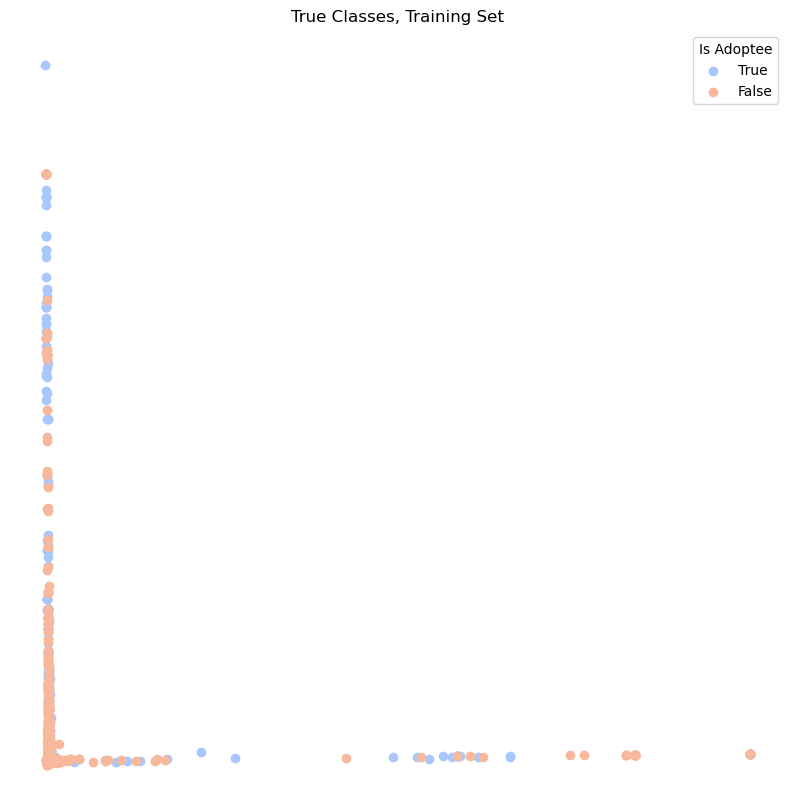

In [97]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Adoptee
a = np.stack(adopt_train_data_df[adopt_train_data_df['is_adoptee']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Adoptee
a = np.stack(adopt_train_data_df[adopt_train_data_df['is_adoptee'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")

ax.legend(loc = 'upper right', title = 'Is Adoptee')
plt.title('True Classes, Training Set')
plt.show()

Evidently PCA cannot accurately distinguish adoptee posts from non adoptee posts very well.

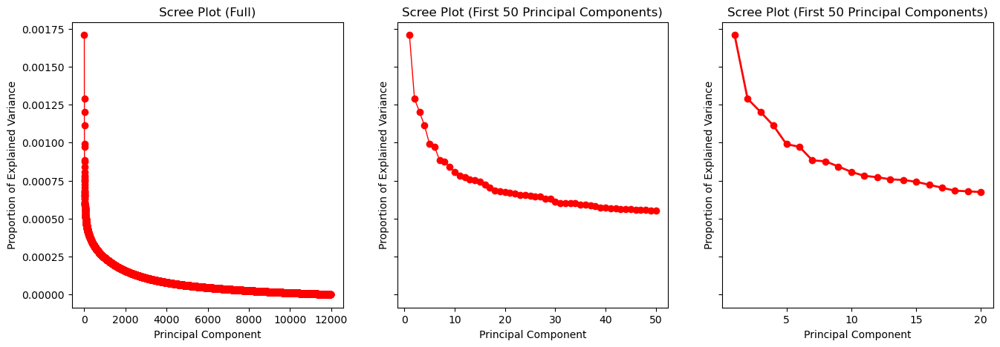

In [98]:
n = len(pca_adopt.explained_variance_ratio_)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca_adopt.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca_adopt.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca_adopt.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Similar to to the above, let's try to use 10 principal components.

In [99]:
adopt_train_data_df['pca_reduced_10'] = adopt_train_data_df['pca'].apply(lambda x: x[:10])

In [113]:
adopt_train_data_df['is_adoptee'] = adopt_train_data_df['is_adoptee'].astype(int)

In [114]:
logistic_adopt = sklearn.linear_model.LogisticRegression()
logistic_adopt.fit(np.stack(adopt_train_data_df['pca_reduced_10'], axis=0), 
                   adopt_train_data_df['is_adoptee'])

LogisticRegression()

The mean accuracy is only 67%. Which could be improved.

In [115]:
# Find the accuracy on the TRAINING SET
logistic_adopt.score(np.stack(adopt_train_data_df['pca_reduced_10'], axis=0), 
                     adopt_train_data_df['is_adoptee'])

0.6731172137241208

Now let's see how well it does on the testing set. The model seems to do slightly worse (.669)

In [130]:
#Create vectors
adopt_TFVects_test = TFVectorizer_adopt.transform(adopt_test_data_df['post_text'])
adopt_test_data_df['vect'] = [np.array(v).flatten() for v in adopt_TFVects_test.todense()]

#PCA
reduced_adopt_test = pca_adopt.transform(np.stack(adopt_test_data_df['vect'], axis=0))
adopt_test_data_df['pca'] = [r for r in reduced_adopt_test]
adopt_test_data_df['pca_reduced_10'] = adopt_test_data_df['pca'].apply(lambda x: x[:10])

adopt_test_data_df['is_adoptee'] = adopt_test_data_df['is_adoptee'].astype(int)
#Test
logistic_adopt.score(np.stack(adopt_test_data_df['pca_reduced_10'], axis=0), adopt_test_data_df['is_adoptee'])

0.6697603171742657

### Let's try more dimensions ###

100 features: We only see small improvements in the training and testing set accuracies

In [134]:
adopt_train_data_df['pca_reduced_100'] = adopt_train_data_df['pca'].apply(lambda x: x[:100])
adopt_test_data_df['pca_reduced_100'] = adopt_test_data_df['pca'].apply(lambda x: x[:100])

logistic_adopt.fit(np.stack(adopt_train_data_df['pca_reduced_100'], axis=0), adopt_train_data_df['is_adoptee'])

print("Training:")
print(logistic_adopt.score(np.stack(adopt_train_data_df['pca_reduced_100'], axis=0), adopt_train_data_df['is_adoptee']))
print("Testing:")
print(logistic_adopt.score(np.stack(adopt_test_data_df['pca_reduced_100'], axis=0), adopt_test_data_df['is_adoptee']))

Training:
0.6761585077384037
Testing:
0.6725536132636512


500 features: accuracy for both is only going up slightly more.

In [135]:
adopt_train_data_df['pca_reduced_500'] = adopt_train_data_df['pca'].apply(lambda x: x[:500])
adopt_test_data_df['pca_reduced_500'] = adopt_test_data_df['pca'].apply(lambda x: x[:500])

logistic_adopt.fit(np.stack(adopt_train_data_df['pca_reduced_500'], axis=0), adopt_train_data_df['is_adoptee'])

print("Training:")
print(logistic_adopt.score(np.stack(adopt_train_data_df['pca_reduced_500'], axis=0), adopt_train_data_df['is_adoptee']))
print("Testing:")
print(logistic_adopt.score(np.stack(adopt_test_data_df['pca_reduced_500'], axis=0), adopt_test_data_df['is_adoptee']))

Training:
0.684246097006015
Testing:
0.674175527122004


Let us apply an L1 penalty to find significant features: We find small improvements to the training and testing set.

In [140]:
adopt_logistic_l1 = sklearn.linear_model.LogisticRegression(penalty='l1', solver='liblinear')
adopt_logistic_l1.fit(np.stack(adopt_train_data_df['vect'], axis=0), adopt_train_data_df['is_adoptee'])
print("Training:")
print(adopt_logistic_l1.score(np.stack(adopt_train_data_df['vect'], axis=0), adopt_train_data_df['is_adoptee']))
print("Testing:")
print(adopt_logistic_l1.score(np.stack(adopt_test_data_df['vect'], axis=0), adopt_test_data_df['is_adoptee']))

Training:
0.7241433688526436
Testing:
0.6841773292485133


It seems we are stuck at hovering around 69% accuracy maximum from logistic regression.

### Confusion Mat: ###

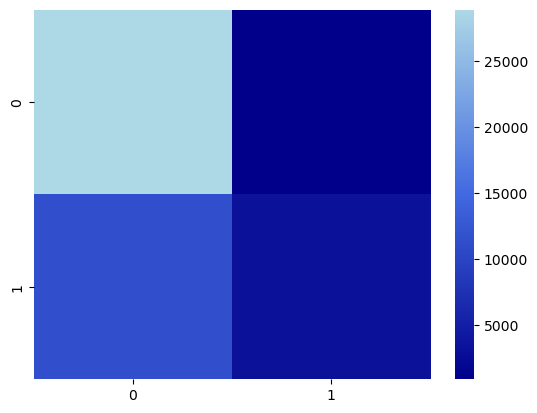

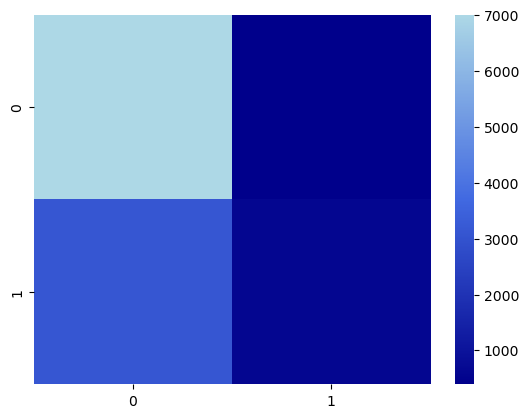

In [147]:
y_train_pred = adopt_logistic_l1.predict(np.stack(adopt_train_data_df['vect'], axis=0))
y_test_pred = adopt_logistic_l1.predict(np.stack(adopt_test_data_df['vect'], axis=0))

train_conf_matrix = pyanno.measures.agreement.confusion_matrix(adopt_train_data_df['is_adoptee'], y_train_pred, 2)
test_conf_matrix = pyanno.measures.agreement.confusion_matrix(adopt_test_data_df['is_adoptee'], y_test_pred, 2)

seaborn.heatmap(train_conf_matrix,cmap=custom_cmap)
plt.show()
seaborn.heatmap(test_conf_matrix,cmap=custom_cmap)
plt.show()


From these confusion matrices we see a concerning trend. That the model very highly predicts when not an adoptee correctly but not when the post is in fact by an adoptee (note the dark shades for 1,1)

### ROC Curve: ###

          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0           0.315823  0.552813   0.692536           0.691161  0.946622
1           0.315823  0.552813   0.598169           0.375342  0.159005


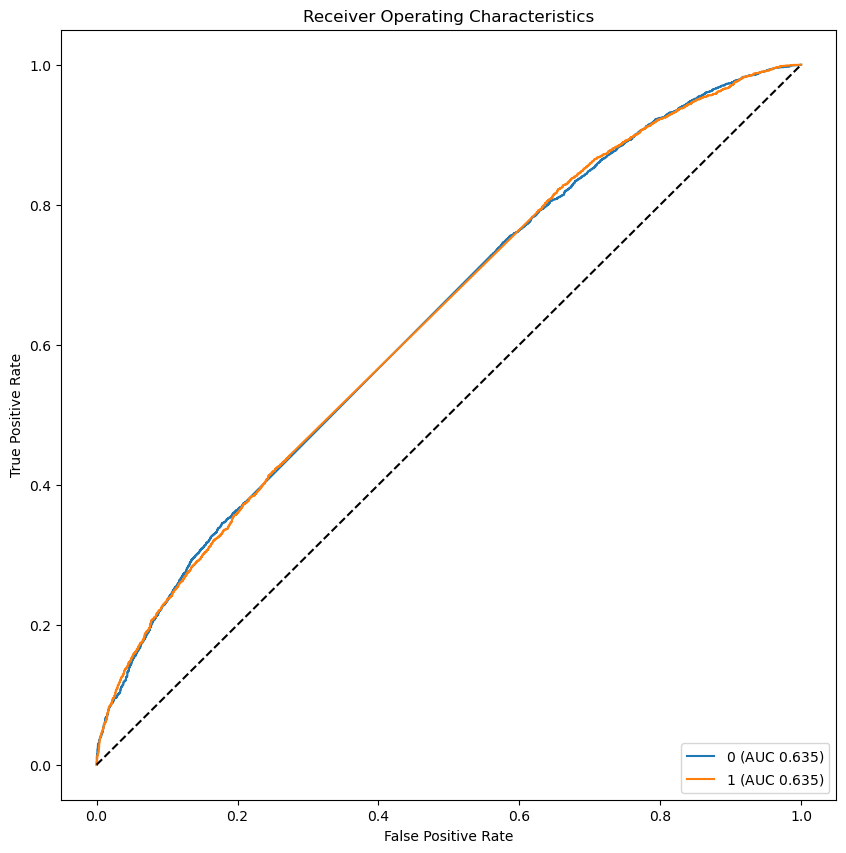

In [ ]:
# minor fix to avoid a key_error
adopt_test_data_df["category"] = adopt_test_data_df["is_adoptee"]
adopt_train_data_df["category"] = adopt_train_data_df["is_adoptee"]

# get ROC Curve
print(lucem_illud.evaluateClassifier(adopt_logistic_l1, adopt_test_data_df))
lucem_illud.plotMultiROC(adopt_logistic_l1, adopt_test_data_df)

From the ROC curve we can see that this model performs rather poorly and approximately the same for both adoptees and non adoptees. The error rate is the same. The AUC is the same and very close to .50. This model is only slightly better than random chance. Recall is much higher for non adoptees and low for adoptees. Only 15% of all posts written by adoptees were correctly identified.

# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


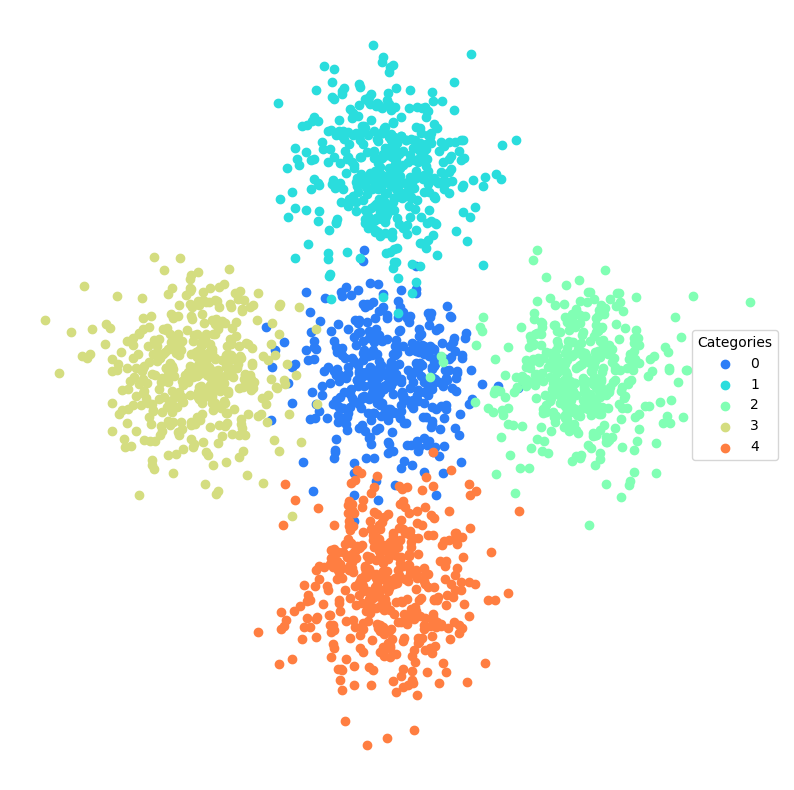

In [ ]:
blobs_df = lucem_illud.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = sklearn.model_selection.train_test_split(blobs_df, test_size=.2)
lucem_illud.plotter(df_exampleTree_train)

Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [ ]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(max_depth=4, random_state=0)

To see what's going on visually with the classification:

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


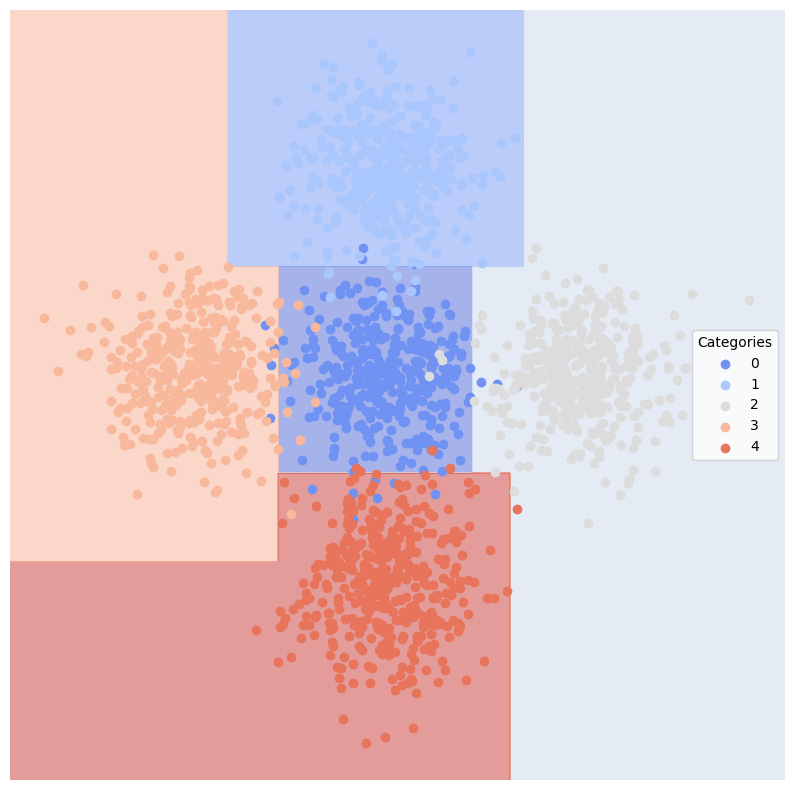

In [ ]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)

In [ ]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.018,0.976506,0.957983,0.933509,0.966102
1,0.002,0.994624,1.000000,0.991247,0.989247
2,0.006,0.996173,0.972973,0.972973,1.000000
3,0.004,0.989130,1.000000,0.982261,0.978261
4,0.006,0.987547,0.988636,0.970420,0.977528


Lets look at accuracy:

In [ ]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.982

What happens if we trim the tree?

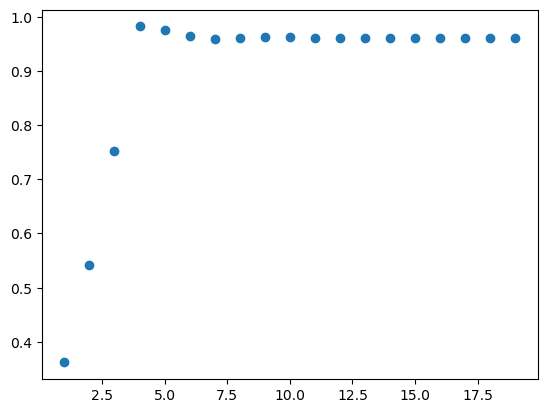

In [ ]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [ ]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [ ]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=10),
                  max_samples=0.8, n_estimators=100, random_state=1)

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


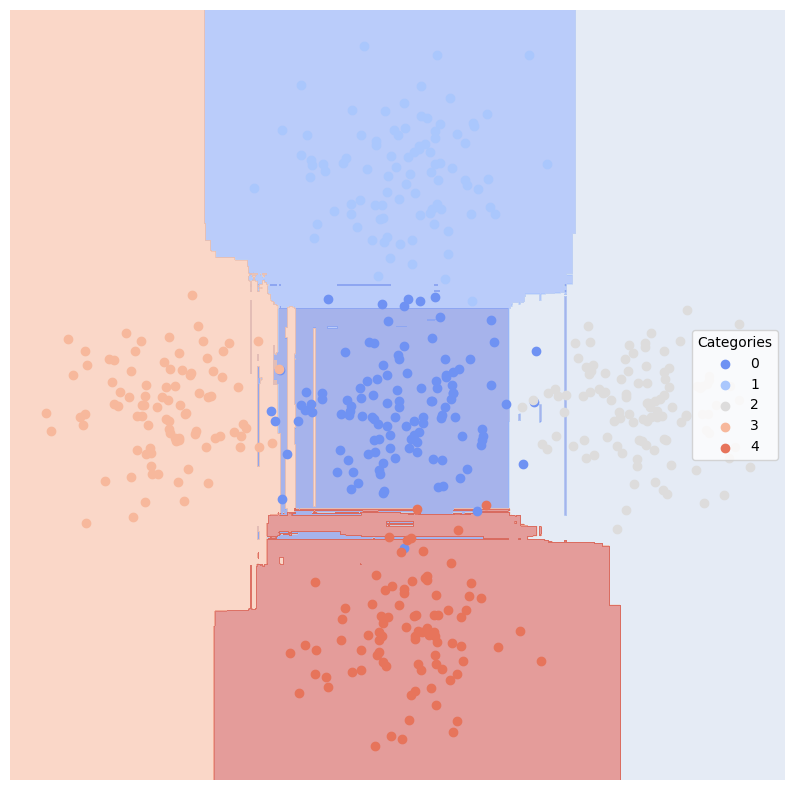

In [ ]:
lucem_illud.plotregions(bag, df_exampleTree_test)

In [ ]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.036,0.941299,0.946429,0.874182,0.898305
1,0.012,0.992629,0.939394,0.939394,1.000000
2,0.008,0.991544,0.972727,0.965721,0.990741
3,0.008,0.986679,0.978261,0.960994,0.978261
4,0.008,0.981930,0.988506,0.961185,0.966292


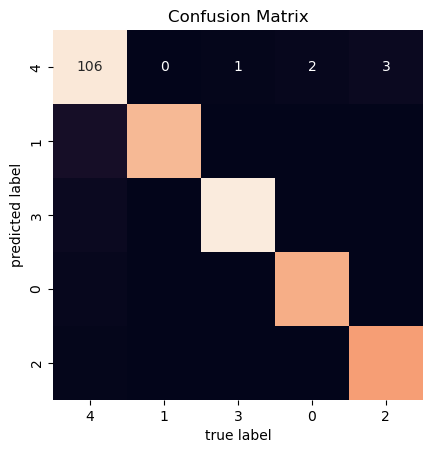

In [ ]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)

## <font color="red">*Exercise 4*</font>

<font color="red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


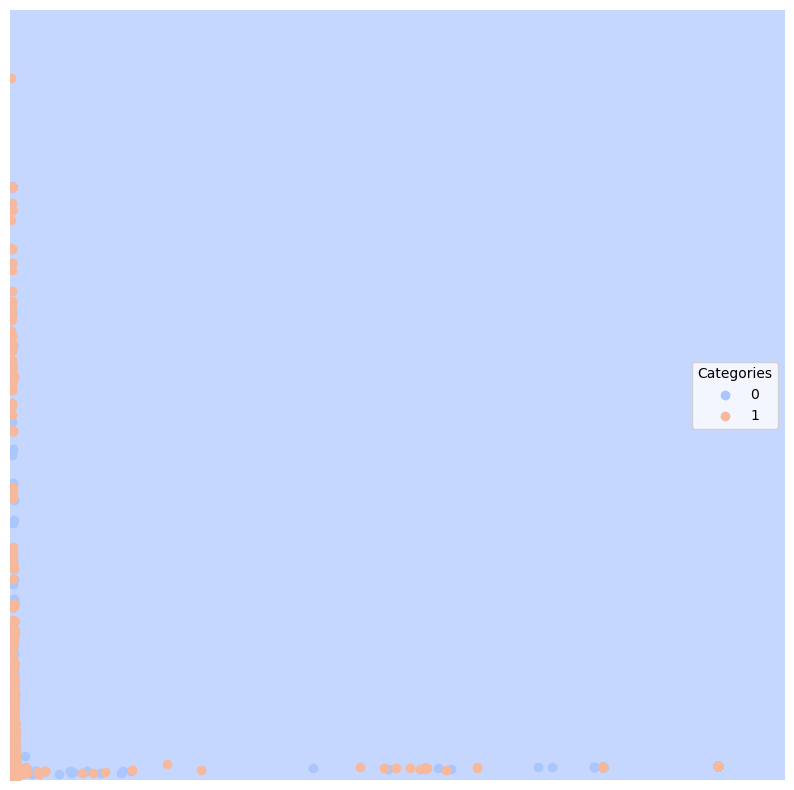

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.33033,0.504665,0.668868,0.668866,0.999324
1,0.33033,0.504665,0.880952,0.338694,0.010005


In [154]:
clf_tree_adopt = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree_adopt.fit(np.stack(adopt_train_data_df['vect'], axis =0), adopt_train_data_df['is_adoptee'])

lucem_illud.plotregions(clf_tree_adopt, adopt_train_data_df)
lucem_illud.evaluateClassifier(clf_tree_adopt, adopt_test_data_df)

Very concerningly, the decision tree model decided on classifying all categories as 0, giving a very high recall for 0 but an abyssmal one for 1 (adoptee posts). This is almsot exactly as good as random guessing and leads to high error rates. 

In [158]:
# Assess accuracy
sklearn.metrics.accuracy_score(adopt_test_data_df['is_adoptee'],
                               clf_tree_adopt.predict(np.stack(adopt_test_data_df['vect'], axis = 0)))

0.672193187961795

The accuracy is quite low at 67%

Getting confusion matrix, ROC, etc

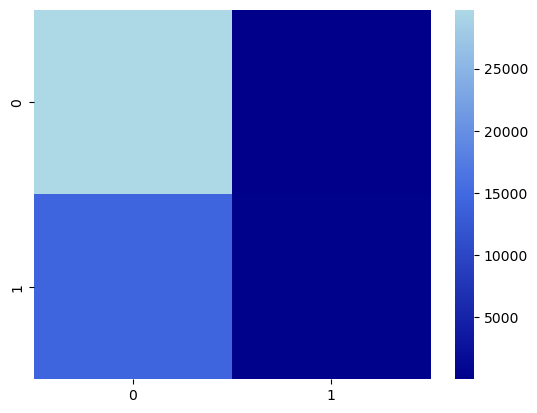

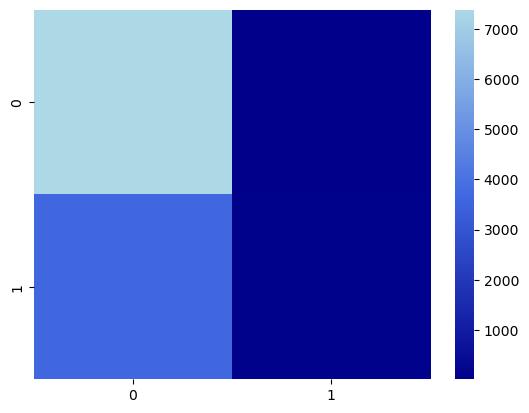

          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0           0.327807  0.509262   0.670938           0.670928  0.997703
1           0.327807  0.509262   0.819149           0.343331  0.020822


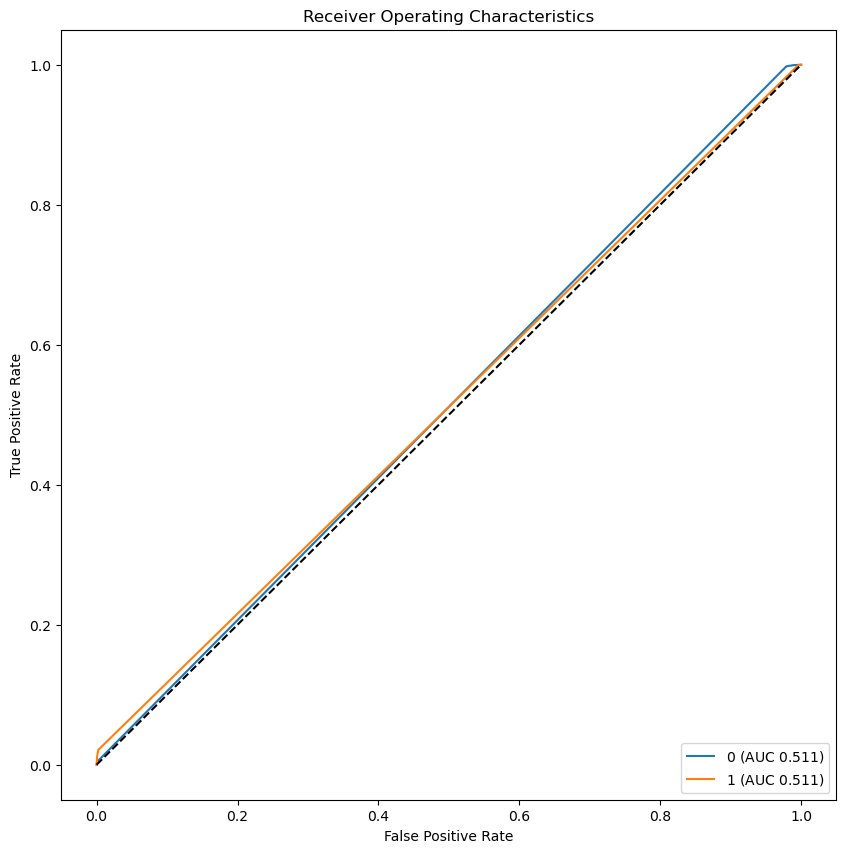

In [159]:
y_train_pred = clf_tree_adopt.predict(np.stack(adopt_train_data_df['vect'], axis=0))
y_test_pred = clf_tree_adopt.predict(np.stack(adopt_test_data_df['vect'], axis=0))

train_conf_matrix = pyanno.measures.agreement.confusion_matrix(adopt_train_data_df['is_adoptee'], y_train_pred, 2)
test_conf_matrix = pyanno.measures.agreement.confusion_matrix(adopt_test_data_df['is_adoptee'], y_test_pred, 2)

seaborn.heatmap(train_conf_matrix,cmap=custom_cmap)
plt.show()
seaborn.heatmap(test_conf_matrix,cmap=custom_cmap)
plt.show()

lucem_illud.plotMultiROC(clf_tree_adopt, adopt_test_data_df)

### Ensemble learning: Bagging


In [161]:
adopt_bag = sklearn.ensemble.BaggingClassifier(clf_tree_adopt, n_estimators=100, max_samples=0.7, random_state=1) #Each tree uses up to 70% of the data

In [162]:
adopt_bag.fit(np.stack(adopt_train_data_df['vect'], axis = 0), adopt_train_data_df['category']) #Fit the bagged classifier

BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=10,
                                                   random_state=0),
                  max_samples=0.7, n_estimators=100, random_state=1)

c:\Users\Ethan\anaconda3\Lib\site-packages\lucem_illud\metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


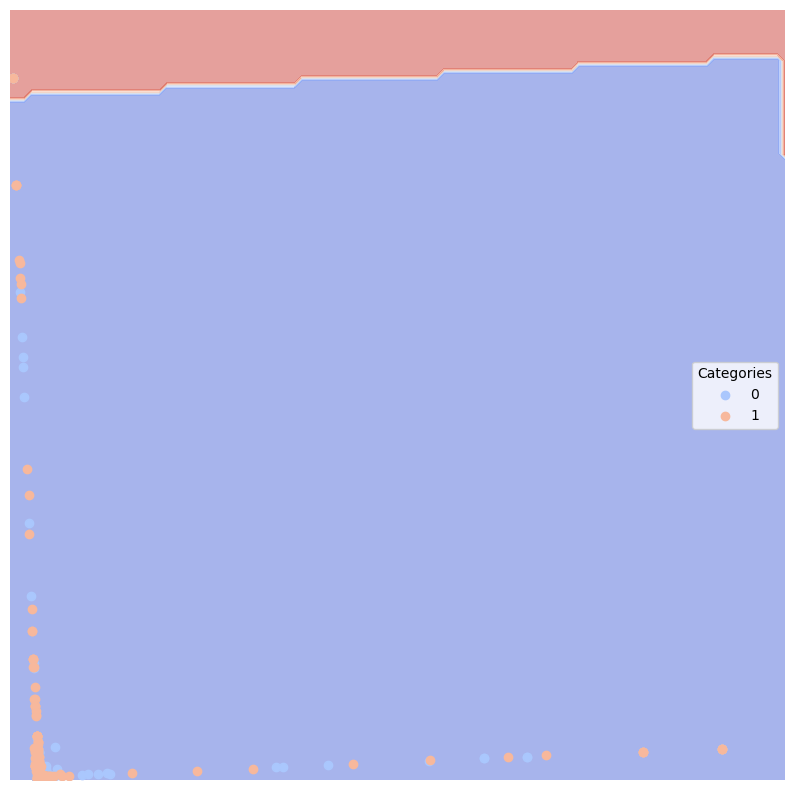

          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0           0.327627  0.509533   0.671060           0.671050  0.997703
1           0.327627  0.509533   0.822917           0.343675  0.021363


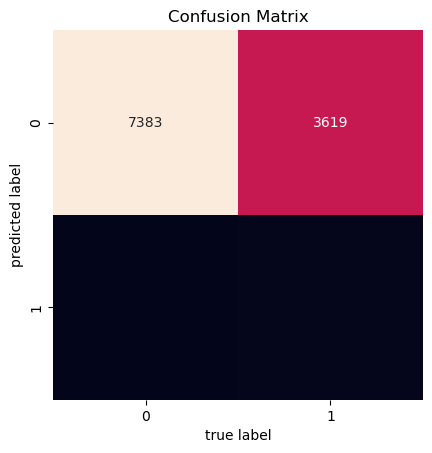

In [163]:
lucem_illud.plotregions(adopt_bag, adopt_test_data_df)
print(lucem_illud.evaluateClassifier(adopt_bag, adopt_test_data_df))
lucem_illud.plotConfusionMatrix(adopt_bag, adopt_test_data_df)

In [ ]:
lucem_illud.plotMultiROC(adopt_bag, adopt_test_data_df)

We cam see that after performing our bagging ensemble method, the model is not performing much better. It still chooses to label all values as 0 rather than 1. Again the error rates are high, the AUC is not much better than random guessing. And adoptee recall is low.

# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data.

In [164]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus. # replace path if on Colab
newsgroups.target_names #Possible categories, i.e., the newsgroups

target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: lucem_illud.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

Loading data for: talk.religion.misc


AttributeError: 'DataFrame' object has no attribute 'append'

In [ ]:
newsgroupsDF[:5]

Make a testing and training set:

In [ ]:
holdBackFraction = .2
train_ng_df, test_ng_df = sklearn.model_selection.train_test_split(newsgroupsDF, test_size=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [ ]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

Let's try to classify using the TF-IDF vectors:

In [ ]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [ ]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

In [ ]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)

And lets look at the testing data

In [ ]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Let's produce another confusion matrix:

In [ ]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)

You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [ ]:
#lucem_illud.plotregions(clf_knearest, test_ng_df)

## <font color="red">*Exercise 5*</font>

<font color="red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [ ]:
redditDf = pandas.read_csv('../data/reddit.csv', index_col = 0) # replace path if on Colab

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: lucem_illud.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

We will tf.idf the data to make our vectors:

In [ ]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [ ]:
holdBackFraction = .2
train_redditDf, test_redditDf = sklearn.model_selection.train_test_split(redditDf, test_size=holdBackFraction)

In [ ]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

...and consider the results:

In [ ]:
lucem_illud.evaluateClassifier(clf_svm, test_redditDf)

In [ ]:
lucem_illud.plotConfusionMatrix(clf_svm, test_redditDf)

In [ ]:
lucem_illud.plotregions(clf_svm, test_redditDf)

# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $z = w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $f(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

<img src="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks-2024-Winter/blob/main/data/MLP.jpg?raw=true" alt="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks-2024-Winter/blob/main/data/MLP.jpg?raw=true" style="width:500px">

In [ ]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

In [ ]:
lucem_illud.evaluateClassifier(clf_nn, test_redditDf)

In [ ]:
lucem_illud.plotConfusionMatrix(clf_nn, test_redditDf)

In [ ]:
lucem_illud.plotregions(clf_nn, test_redditDf)

It performs very well.

## <font color="red">*Exercise 6*</font>

<font color="red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, logistic and decision-tree approaches?

## Classification with BERT Pipelines
Now, instead of classifying based on "old" NLP methods, we will now use the popular Transformers package default 'pipelines'. This package has methods for a wide range of common NLP tasks using contextual word embeddings. Note that for this homework, we are not building new contextual models ourselves, merely using existing models in Transformers. We will spend Weeks 7 and 8 learning more about Transformers, so do not worry about fully understanding them this week.

[Transformers Documentation](https://huggingface.co/transformers/)

[Transformers GitHub](https://github.com/huggingface/transformers)

The following sections of code are taken from the [Summary of Tasks](https://huggingface.co/transformers/task_summary.html) page in the Transformers documentation.

### Sequence Classification (e.g., sentiment)
Sequence classification is the task of classifying sequences according to a given number of classes. An example of
sequence classification is the GLUE dataset. If you would like to fine-tune a
model on a GLUE sequence classification task, you may leverage the [pytorch version run_glue.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/pytorch/text-classification/run_glue.py) and
[pytorch-lightning version run_glue.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/legacy/pytorch-lightning/run_glue.py)(legacy) or
[tensorflow version run_glue.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/tensorflow/text-classification/run_glue.py) scripts.

Here is an example of using pipelines to do sentiment analysis: identifying if a sentence is positive or negative. It
leverages a fine-tuned model on sst2, which is a GLUE task.

This returns a label ("POSITIVE" or "NEGATIVE") alongside a score, as follows:

In [ ]:
from transformers import pipeline
nlp = pipeline("sentiment-analysis")
result = nlp("I hate you")[0]
print(f"label: {result['label']}, with score: {round(result['score'], 4)}")
result = nlp("I love you")[0]
print(f"label: {result['label']}, with score: {round(result['score'], 4)}")

Here is an example of doing a sequence classification using a model to determine if two sequences are paraphrases of
each other. The process is the following:

1. Instantiate a tokenizer and a model from the checkpoint name. The model is identified as a BERT model and loads it
   with the weights stored in the checkpoint.
2. Build a sequence from the two sentences, with the correct model-specific separators token type ids and attention
   masks (`PreTrainedTokenizer.encode` and `PreTrainedTokenizer.__call__` take
   care of this).
3. Pass this sequence through the model so that it is classified in one of the two available classes: 0 (not a
   paraphrase) and 1 (is a paraphrase).
4. Compute the softmax of the result to get probabilities over the classes.
5. Print the results.

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
tokenizer = AutoTokenizer.from_pretrained("bert-base-cased-finetuned-mrpc")
model = AutoModelForSequenceClassification.from_pretrained("bert-base-cased-finetuned-mrpc")
classes = ["not paraphrase", "is paraphrase"]
sequence_0 = "The company HuggingFace is based in New York City"
sequence_1 = "Apples are especially bad for your health"
sequence_2 = "HuggingFace's headquarters are situated in Manhattan"
paraphrase = tokenizer(sequence_0, sequence_2, return_tensors="pt")
not_paraphrase = tokenizer(sequence_0, sequence_1, return_tensors="pt")
paraphrase_classification_logits = model(**paraphrase).logits
not_paraphrase_classification_logits = model(**not_paraphrase).logits
paraphrase_results = torch.softmax(paraphrase_classification_logits, dim=1).tolist()[0]
not_paraphrase_results = torch.softmax(not_paraphrase_classification_logits, dim=1).tolist()[0]
# Should be paraphrase
for i in range(len(classes)):
    print(f"{classes[i]}: {int(round(paraphrase_results[i] * 100))}%")
# Should not be paraphrase
for i in range(len(classes)):
    print(f"{classes[i]}: {int(round(not_paraphrase_results[i] * 100))}%")

### Extractive Question Answering

Extractive Question Answering is the task of extracting an answer from a text given a question. An example of a
question answering dataset is the SQuAD dataset, which is entirely based on that task. If you would like to fine-tune a
model on a SQuAD task, you may leverage the [run_squad.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/legacy/question-answering/run_squad.py) (legacy) script.


Here is an example of using pipelines to do question answering: extracting an answer from a text given a question. It
leverages a fine-tuned model on SQuAD.

In [ ]:
from transformers import pipeline
nlp = pipeline("question-answering")
context = r"""
Extractive Question Answering is the task of extracting an answer from a text given a question. An example of a
question answering dataset is the SQuAD dataset, which is entirely based on that task. If you would like to fine-tune
a model on a SQuAD task, you may leverage the examples/legacy/question-answering/run_squad.py
"""

This returns an answer extracted from the text, a confidence score, alongside "start" and "end" values, which are the
positions of the extracted answer in the text.

In [ ]:
result = nlp(question="What is extractive question answering?", context=context)
print(f"Answer: '{result['answer']}', score: {round(result['score'], 4)}, start: {result['start']}, end: {result['end']}")
result = nlp(question="What is a good example of a question answering dataset?", context=context)
print(f"Answer: '{result['answer']}', score: {round(result['score'], 4)}, start: {result['start']}, end: {result['end']}")

Here is an example of question answering using a model and a tokenizer. The process is the following:

1. Instantiate a tokenizer and a model from the checkpoint name. The model is identified as a BERT model and loads it
   with the weights stored in the checkpoint.
2. Define a text and a few questions.
3. Iterate over the questions and build a sequence from the text and the current question, with the correct
   model-specific separators token type ids and attention masks.
4. Pass this sequence through the model. This outputs a range of scores across the entire sequence of tokens (question and
   text), for both the start and end positions.
5. Compute the softmax of the result to get probabilities over the tokens.
6. Fetch the tokens from the identified start and stop values, convert those tokens to a string.
7. Print the results.

In [ ]:
from transformers import AutoTokenizer, AutoModelForQuestionAnswering
import torch
tokenizer = AutoTokenizer.from_pretrained("bert-large-uncased-whole-word-masking-finetuned-squad")
model = AutoModelForQuestionAnswering.from_pretrained("bert-large-uncased-whole-word-masking-finetuned-squad")
text = r"""
🤗 Transformers (formerly known as pytorch-transformers and pytorch-pretrained-bert) provides general-purpose
architectures (BERT, GPT-2, RoBERTa, XLM, DistilBert, XLNet…) for Natural Language Understanding (NLU) and Natural
Language Generation (NLG) with over 32+ pretrained models in 100+ languages and deep interoperability between
TensorFlow 2.0 and PyTorch.
"""
questions = [
    "How many pretrained models are available in 🤗 Transformers?",
    "What does 🤗 Transformers provide?",
    "🤗 Transformers provides interoperability between which frameworks?",
]
for question in questions:
    inputs = tokenizer(question, text, add_special_tokens=True, return_tensors="pt")
    input_ids = inputs["input_ids"].tolist()[0]

    text_tokens = tokenizer.convert_ids_to_tokens(input_ids)
    outputs = model(**inputs)
    answer_start_scores = outputs.start_logits
    answer_end_scores = outputs.end_logits

    answer_start = torch.argmax(
        answer_start_scores
    )  # Get the most likely beginning of answer with the argmax of the score
    answer_end = torch.argmax(answer_end_scores) + 1  # Get the most likely end of answer with the argmax of the score

    answer = tokenizer.convert_tokens_to_string(tokenizer.convert_ids_to_tokens(input_ids[answer_start:answer_end]))

    print(f"Question: {question}")
    print(f"Answer: {answer}")

## <font color="red">*Exercise 7*</font>

<font color="red">In the cells immediately following, use the pipeline functions or the word or sentence vector functions (e.g., similarity) to explore the social game underlying the production and meaning of texts associated with your final project. How does BERT help you gain insight regarding your research question that is similar and different from prior methods?